# Analysis of carbon limitation and refixation of respiratory CO2

In [168]:
# run functions.py to define functions for modifying and analysing model

%run functions.py

## Basic model setup

In [169]:

model_var = "diel_plant_core_model.xml"


# define objective reaction
output_string = "AraCore_Biomass_tx"
objective_direction = "max"

# define suffices for day and night reactions and metabolites
day_tag = "_00"
night_tag = "_12"

charge_state_mets = False

In [170]:
# set solver for optimisation
solver = 'glpk'
cobra.core.Configuration.solver = solver


diel_model = cobra.io.read_sbml_model(model_var)
diel_model.solver

In [171]:
# photon flux constraints
diel_model.reactions.get_by_id("Photon_tx"+day_tag).upper_bound = 200
diel_model.reactions.get_by_id("Photon_tx"+night_tag).upper_bound = 0 #night-time darkness

# prevent phloem output reactions
diel_model.reactions.get_by_id("Phloem_output_tx"+day_tag).bounds = (0, 0)
diel_model.reactions.get_by_id("Phloem_output_tx"+night_tag).bounds = (0, 0)


# Rubisco C:O constraint = 3:1
set_Rubisco_C_to_O_ratio(diel_model, 3/1)


# output constraint day:night = 3:1
set_output_day_night_ratio(diel_model, 3/1, output_string)

# maintenance costs based on linear equation using light intensity, as in Toepfer et al., 2021
## maintenance day:night = 1:1

#light
PPFD = diel_model.reactions.get_by_id("Photon_tx"+day_tag).upper_bound
ATPase = (PPFD*0.0049)+2.7851

print("ATPase flux during the day: ", ATPase)

diel_model.reactions.get_by_id("ATPase_tx"+day_tag).bounds = (ATPase, ATPase)

#dark
print("ATPase flux at night: ", ATPase)
diel_model.reactions.get_by_id("ATPase_tx"+night_tag).bounds = (ATPase, ATPase)


# maintenance ATPase:NADPHoxidase = 3:1
set_NGAM_ATP_NADPH_ratio(diel_model, 3/1)
print("set maintenance ATPase:NADPHoxidase ratio to 3:1")


# nitrate day:night = 3:2
set_nitrate_uptake_day_night_ratio(diel_model, 3/2)
print("set nitrate uptake light:dark ratio to 3:2")


# amino acids accumulating day to night, not night to day
aa_day_to_night_only = True

amino_acids = ["ASN_v",
"SER_v",
"GLN_v",
"GLY_v",
"THR_v",
"L_ALPHA_ALANINE_v",
"VAL_v",
"ILE_v",
"PHE_v",
"LEU_v",
"LYS_v",
"ARG_v",
"L_ASPARTATE_v",
"GLT_v",
"HIS_v",
"MET_v",
"PRO_v",
"TRP_v",
"TYR_v",
"CYS_v",
"ASN_v",
"4_AMINO_BUTYRATE_v"]

if aa_day_to_night_only:

    for rxn in diel_model.reactions:
        if "_12_to_00" in rxn.id and rxn.id[:-16] in amino_acids:
            rxn.upper_bound = 0
            # print(rxn.id[:-16])
    print("set amino acid accumulation to day to night only")
else:
    pass

ATPase flux during the day:  3.7651
ATPase flux at night:  3.7651
set maintenance ATPase:NADPHoxidase ratio to 3:1
set nitrate uptake light:dark ratio to 3:2
set amino acid accumulation to day to night only


In [172]:
# set objective
diel_model.objective = {diel_model.reactions.get_by_id(output_string+"_total"): 1}
diel_model.objective_direction = objective_direction

print("Objective set to :",str(diel_model.objective_direction), output_string+"_total")


Objective set to : max AraCore_Biomass_tx_total


## Model results without CO2-constraint

In [173]:
C3_unlimited = diel_model.copy()


solution_C3_unlimited, C3_unlimited_opt = optimise_model(C3_unlimited, output_string+"_total", pFBA=True)

Objective: AraCore_Biomass_tx_total


In [174]:
solution_C3_unlimited

,fluxes,reduced_costs
PRO_PROTON_vc_00,0.000000,-2.000000
Ca_tx_00,0.084691,-2.000000
H2O_xc_00,4.930104,-2.000000
sCIT_biomass_00,-0.025381,2.000000
ACETYLGLUTKIN_RXN_p_00,0.031914,-2.000000
...,...,...
LEU_v_linker_12_to_00,0.000000,-982.975406
GLT_v_linker_00_to_12,0.000000,118.349533
GLT_v_linker_12_to_00,0.000000,-118.349533
GLC_v_linker_00_to_12,0.000000,2.000000


In [175]:
model_results_overview(C3_unlimited_opt, solution_C3_unlimited, output_string+"_total")

Photon uptake = 200.0   % of allowed Photon uptake = 100.0
Output rate (AraCore_Biomass_tx_total) 0.1283		sum of fluxes: 1322.0253
gas exchange = Day: 12.37964 Night: -1.26116
CCE: 0.8981259879677206
ATPase: 3.7651 3.7651
Rubisco Carbox./Oxygen. = 14.7903/4.9301

Linker fluxes 		 Day 	 Night
VAL_v_linker                         0.0       0.0

NITRATE_v_linker                     0.0             0.39017

CIT_v_linker                         0.0             0.19373

PHE_v_linker                     0.00762       0.0

STARCH_p_linker                  0.65448                 0.0

LYS_v_linker                     0.00823       0.0

MET_v_linker                     0.00349       0.0

MAL_v_linker                         0.0                 0.0

CYS_v_linker                         0.0       0.0

4_AMINO_BUTYRATE_v_linker                 0.0       0.0

L_ASPARTATE_v_linker                 0.0       0.0

L_ALPHA_ALANINE_v_linker                 0.0       0.0

FRU_v_linker                      

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


In [176]:
calc_carbon_flux(C3_unlimited_opt, output_string="AraCore_Biomass_tx", night_tag = "_12")


CO2 daytime exchange: 12.37964413762519
CO2 nightime exchange: -1.2611640158317665
CO2 respiratory losses: 0 (no CO2_m_00 found)
Carbon day to night: 5.203140792838212
Carbon night to day: 1.1623567465581794
CO2 exchange night:day: 0.22339521316780214
AraCore_Biomass_tx_00 carbon flux: -8.338860091345081
AraCore_Biomass_tx_12 carbon flux: -2.77962003044836
total carbon biomass flux: -11.118480121793441
total CCE: 0.8981259879677206
nCO2RC: 0.36469150212007734
night CCE1 (carbon in to biomass): 0.5342196456175715
night CCE2 (1 - (carbon lost / carbon in)): 0.7576148587853557


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


,value
CO2 daytime exchange,12.379644
CO2 nightime exchange,-1.261164
Carbon day to night,5.203141
Carbon night to day,1.162357
CO2 exchange night:day,0.223395
day carbon biomass flux,8.338860
night carbon biomass flux,2.779620
total Carbon biomass flux,11.118480
total CCE,0.898126
nCO2RC,0.364692


In [177]:
print(C3_unlimited_opt.reactions.get_by_id("SUCROSE_v_linker_00_to_12").flux)
print(C3_unlimited_opt.reactions.get_by_id("STARCH_p_linker_00_to_12").flux)
print(C3_unlimited_opt.reactions.get_by_id("MAL_v_linker_00_to_12").flux)

0.0
0.6544766979514985
0.0


solution_C3_unlimited (results 17/04/2024):

- light-limited (100% photo use = 200 PPFD)
- citrate accumulation = 0.1891 night to day
- malate accumulation = 0 either direction
- nocturnal CO2 refixation = 38.8%
- total carbon use efficiency = 91.8%

solution_C3_unlimited (results 21/08/2024):

- light-limited (100% photo use = 200 PPFD)
- objective flux (AraCore biomass):0.1314
- citrate accumulation = 0.18892 night to day
- malate accumulation = 0 either direction
- nocturnal CO2 refixation = 39.0%
- total carbon use efficiency = 91.9%

## investigating nocturnal CO2 refixation in light-limited model

Total: 16.591361111371643


({'Others-pos': 4.921271965413617,
  'Others-neg': -0.3521399576405088,
  'RIBULOSE_BISPHOSPHATE_CARBOXYLASE_RXN_p_00': -89.14464998107272,
  'CO2_tx_00': 74.61500026745989,
  'GCVMULTI_RXN_m_00': 16.775183908208582,
  'RXN0_5224_p_00': -8.957859695126752,
  'ISOCITDEH_RXN_m_00': 2.521459460958357,
  'ISOCITDEH_RXN_c_00': -1.5453503661600498,
  'ACETOOHBUTSYN_RXN_p_00': 1.167084397959546},
                                                 value
 Others-pos                                   4.921272
 Others-neg                                  -0.352140
 RIBULOSE_BISPHOSPHATE_CARBOXYLASE_RXN_p_00 -89.144650
 CO2_tx_00                                   74.615000
 GCVMULTI_RXN_m_00                           16.775184
 RXN0_5224_p_00                              -8.957860
 ISOCITDEH_RXN_m_00                           2.521459
 ISOCITDEH_RXN_c_00                          -1.545350
 ACETOOHBUTSYN_RXN_p_00                       1.167084)

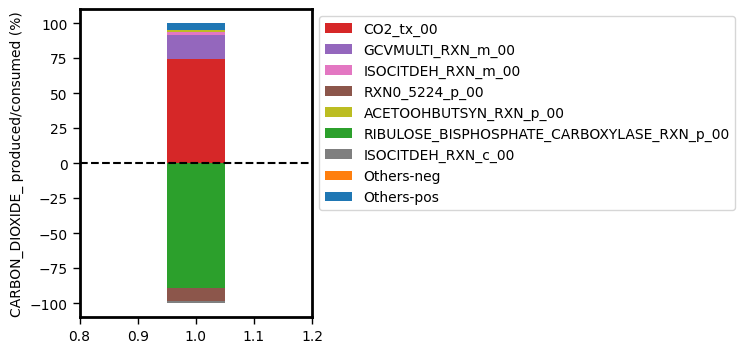

In [178]:
generateMetaboliteBudget(C3_unlimited_opt, solution_C3_unlimited, show_plot=True, percentage=True, day_or_night_tag="_00", 
                         metabolite="CARBON_DIOXIDE_", threshold=0.01)

In [179]:
reactions  = [
    "Others-pos",
    "Others-neg",
    "CO2_tx_12",
    "ISOCITDEH_RXN_m_12",
    "6PGLUCONDEHYDROG_RXN_c_12",
    "6PGLUCONDEHYDROG_RXN_p_12",
    "ISOCITDEH_RXN_c_12",
    "2OXOGLUTARATEDEH_RXN_m_12",
    "RXN0_5224_c_12",
    "PYRUVDEH_RXN_m_12",
    "PYRUVDEH_RXN_p_12",
    "RXN0_5224_p_12",
    "RXN_9958_NAD_m_12",
    "2KETO_3METHYLVALERATE_RXN_m_12"
]

colours = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
colourDict_CO2 = dict(zip(reactions, colours))

Total: 1.9851206461748516


({'Others-pos': 13.110092551579394,
  'Others-neg': -1.1553582371800635e-15,
  'CO2_tx_12': -63.530849787992274,
  'ISOCITDEH_RXN_m_12': 21.07400601825166,
  '6PGLUCONDEHYDROG_RXN_c_12': 17.04920349852527,
  '6PGLUCONDEHYDROG_RXN_p_12': 15.574892479708023,
  'RXN0_5224_c_12': -14.120228347884307,
  'ISOCITDEH_RXN_c_12': -13.625513398344578,
  'PYRUVDEH_RXN_p_12': 10.550415706790584,
  'RXN0_5224_p_12': -8.723408465778846,
  'RXN_9958_NAD_m_12': 8.688199331452983,
  '2KETO_3METHYLVALERATE_RXN_m_12': 8.688199331452982,
  '2OXOGLUTARATEDEH_RXN_m_12': 5.264991082239106},
                                        value
 Others-pos                      1.311009e+01
 Others-neg                     -1.155358e-15
 CO2_tx_12                      -6.353085e+01
 ISOCITDEH_RXN_m_12              2.107401e+01
 6PGLUCONDEHYDROG_RXN_c_12       1.704920e+01
 6PGLUCONDEHYDROG_RXN_p_12       1.557489e+01
 RXN0_5224_c_12                 -1.412023e+01
 ISOCITDEH_RXN_c_12             -1.362551e+01
 PYRUVDEH_RX

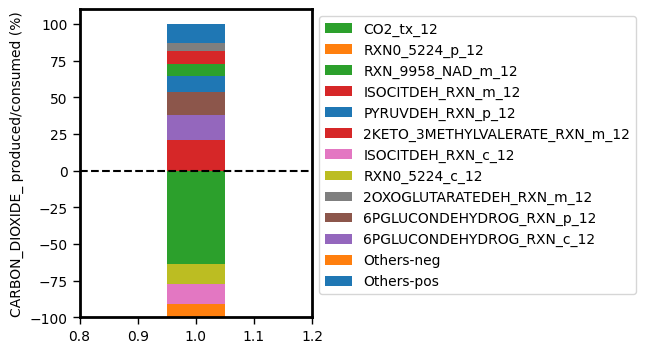

In [180]:
generateMetaboliteBudget(C3_unlimited_opt, solution_C3_unlimited, show_plot=True, percentage=True, day_or_night_tag="_12", 
                         metabolite="CARBON_DIOXIDE_", threshold=0.05, colourDict = colourDict_CO2)

In [181]:

print(diel_model.reactions.get_by_id("2OXOGLUTARATEDEH_RXN_m_12"))
print(diel_model.reactions.get_by_id("2KETO_3METHYLVALERATE_RXN_m_12"))

print(diel_model.reactions.get_by_id("3PGAREARR_RXN_c_12"))
print(diel_model.reactions.get_by_id("PHOSGLYPHOS_RXN_p_12"))
print(diel_model.reactions.get_by_id("GAPOXNPHOSPHN_RXN_p_12"))
print(diel_model.reactions.get_by_id("1TRANSKETO_RXN_p_12"))
print(diel_model.reactions.get_by_id("2TRANSKETO_RXN_p_12"))
print(diel_model.reactions.get_by_id("F16ALDOLASE_RXN_p_12"))
print(diel_model.reactions.get_by_id("TRIOSEPISOMERIZATION_RXN_c_12"))
print(diel_model.reactions.get_by_id("RXN_961_p_12"))
print(diel_model.reactions.get_by_id("RIB5PISOM_RXN_p_12"))
print("\n")
print(diel_model.reactions.get_by_id("RIBULP3EPIM_RXN_p_12"))
print(diel_model.reactions.get_by_id("6PGLUCONDEHYDROG_RXN_c_12"))
print(diel_model.reactions.get_by_id("RIB5PISOM_RXN_p_12"))
print(diel_model.reactions.get_by_id("GLYCOGENSYN_RXN_p_00"))
print(diel_model.reactions.get_by_id("GLUC1PADENYLTRANS_RXN_p_00"))
print(diel_model.reactions.get_by_id("GLUC1PURIDYLTRANS_RXN_c_00"))
print(diel_model.reactions.get_by_id("PHOSPHOGLUCMUT_RXN_c_00"))
print(diel_model.reactions.get_by_id("GLUCOKIN_RXN_c_00"))
print(diel_model.reactions.get_by_id("PGLUCISOM_RXN_p_00"))
print(diel_model.reactions.get_by_id("F16BDEPHOS_RXN_p_00"))
print(diel_model.reactions.get_by_id("1.2.1.13_RXN_p_00"))

2OXOGLUTARATEDEH_RXN_m_12: 2_KETOGLUTARATE_m_12 + CO_A_m_12 + NAD_m_12 --> CARBON_DIOXIDE_m_12 + NADH_m_12 + SUC_COA_m_12
2KETO_3METHYLVALERATE_RXN_m_12: 2_KETO_3_METHYL_VALERATE_m_12 + CO_A_m_12 + NAD_m_12 --> 2_METHYL_BUTYRYL_COA_m_12 + CARBON_DIOXIDE_m_12 + NADH_m_12
3PGAREARR_RXN_c_12: G3P_c_12 <=> 2_PG_c_12
PHOSGLYPHOS_RXN_p_12: ATP_p_12 + G3P_p_12 <=> ADP_p_12 + DPG_p_12
GAPOXNPHOSPHN_RXN_p_12: GAP_p_12 + NAD_p_12 + Pi_p_12 <=> DPG_p_12 + NADH_p_12 + PROTON_p_12
1TRANSKETO_RXN_p_12: D_SEDOHEPTULOSE_7_P_p_12 + GAP_p_12 <=> RIBOSE_5P_p_12 + XYLULOSE_5_PHOSPHATE_p_12
2TRANSKETO_RXN_p_12: ERYTHROSE_4P_p_12 + XYLULOSE_5_PHOSPHATE_p_12 <=> FRUCTOSE_6P_p_12 + GAP_p_12
F16ALDOLASE_RXN_p_12: FRUCTOSE_16_DIPHOSPHATE_p_12 + 0.12 PROTON_p_12 <=> DIHYDROXY_ACETONE_PHOSPHATE_p_12 + GAP_p_12
TRIOSEPISOMERIZATION_RXN_c_12: GAP_c_12 <=> DIHYDROXY_ACETONE_PHOSPHATE_c_12
RXN_961_p_12: D_RIBULOSE_15_P2_p_12 + OXYGEN_MOLECULE_p_12 --> CPD_67_p_12 + G3P_p_12 + 2.0 PROTON_p_12
RIB5PISOM_RXN_p_12: RIBOS

Total: 1.1784472400351347


({'Others-pos': 0.018040411708609577,
  'Others-neg': 0.0,
  'MALATE_DEH_RXN_m_12': -98.83036988237112,
  'MALATE_DEH_RXN_c_12': 36.84198295357082,
  'MALATE_DEH_RXN_x_12': 29.270930908091643,
  'MALATE_DEH_RXN_p_12': 25.00005087967447,
  'FUMHYDR_RXN_m_12': 8.86899484695447,
  'sMAL_biomass_12': -1.1696301176288038},
                          value
 Others-pos            0.018040
 Others-neg            0.000000
 MALATE_DEH_RXN_m_12 -98.830370
 MALATE_DEH_RXN_c_12  36.841983
 MALATE_DEH_RXN_x_12  29.270931
 MALATE_DEH_RXN_p_12  25.000051
 FUMHYDR_RXN_m_12      8.868995
 sMAL_biomass_12      -1.169630)

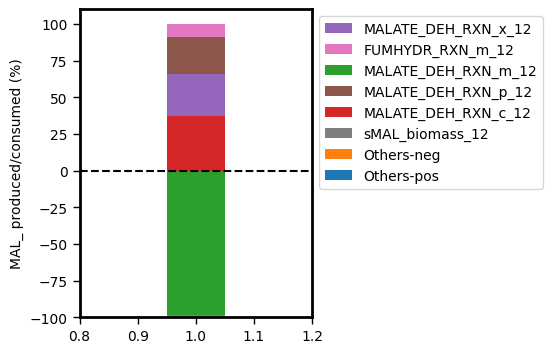

In [182]:
generateMetaboliteBudget(C3_unlimited_opt, solution_C3_unlimited, show_plot=True, percentage=True, day_or_night_tag="_12", 
                         metabolite="MAL_", threshold=0.01)

In [183]:
print(diel_model.reactions.RXN0_5224_c_12)
print(diel_model.reactions.RXN0_5224_p_12)
print(diel_model.reactions.RXN0_5224_p_12)
print(diel_model.reactions.PEPCARBOX_RXN_c_12)
print(diel_model.reactions.CITSYN_RXN_m_12)
print(diel_model.reactions.PROTON_ATPase_c_12)
print(diel_model.reactions.PEPCARBOXYKIN_RXN_c_12)
print(diel_model.reactions.PYRUVDEH_RXN_p_12)


print(diel_model.reactions.METHYLACETOACETYLCOATHIOL_RXN_m_12)
print(diel_model.reactions.RXN_9958_NAD_m_12)
print(diel_model.reactions.ISOCITDEH_RXN_m_12)


RXN0_5224_c_12: CARBON_DIOXIDE_c_12 + WATER_c_12 <=> HCO3_c_12 + PROTON_c_12
RXN0_5224_p_12: CARBON_DIOXIDE_p_12 + WATER_p_12 <=> HCO3_p_12 + PROTON_p_12
RXN0_5224_p_12: CARBON_DIOXIDE_p_12 + WATER_p_12 <=> HCO3_p_12 + PROTON_p_12
PEPCARBOX_RXN_c_12: HCO3_c_12 + PHOSPHO_ENOL_PYRUVATE_c_12 + 0.11 PROTON_c_12 --> OXALACETIC_ACID_c_12 + Pi_c_12
CITSYN_RXN_m_12: ACETYL_COA_m_12 + OXALACETIC_ACID_m_12 + WATER_m_12 --> CIT_m_12 + CO_A_m_12 + PROTON_m_12
PROTON_ATPase_c_12: ATP_c_12 + 0.27 PROTON_c_12 + WATER_c_12 --> ADP_c_12 + PROTON_e_12 + Pi_c_12
PEPCARBOXYKIN_RXN_c_12: ATP_c_12 + OXALACETIC_ACID_c_12 + 0.16 PROTON_c_12 --> ADP_c_12 + CARBON_DIOXIDE_c_12 + PHOSPHO_ENOL_PYRUVATE_c_12
PYRUVDEH_RXN_p_12: CO_A_p_12 + NAD_p_12 + PYRUVATE_p_12 --> ACETYL_COA_p_12 + CARBON_DIOXIDE_p_12 + NADH_p_12
METHYLACETOACETYLCOATHIOL_RXN_m_12: 2_METHYL_ACETO_ACETYL_COA_m_12 + CO_A_m_12 --> ACETYL_COA_m_12 + PROPIONYL_COA_m_12
RXN_9958_NAD_m_12: CO_A_m_12 + MALONATE_S_ALD_m_12 + NAD_m_12 --> ACETYL_COA_m_12

Total: 0.3500478610255422


({'Others-pos': 0,
  'Others-neg': 0.0,
  'CITSYN_RXN_m_12': 100.0,
  'CIT_PROTON_vc_12': -55.34275337743207,
  'ACONITATEDEHYDR_RXN_c_12': -42.24038518429369,
  'sCIT_biomass_12': -2.4168614382742586},
                                value
 Others-pos                  0.000000
 Others-neg                  0.000000
 CITSYN_RXN_m_12           100.000000
 CIT_PROTON_vc_12          -55.342753
 ACONITATEDEHYDR_RXN_c_12  -42.240385
 sCIT_biomass_12            -2.416861)

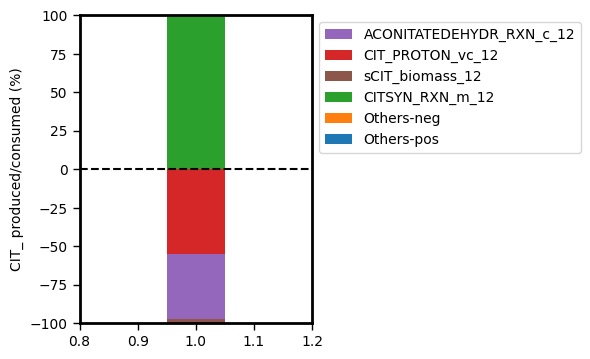

In [184]:
generateMetaboliteBudget(C3_unlimited_opt, solution_C3_unlimited, show_plot=True, percentage=True, day_or_night_tag="_12", 
                         metabolite="CIT_")

Total: 0.19372612443034196


({'Others-pos': 0,
  'Others-neg': 0.0,
  'CIT_PROTON_rev_vc_00': 100.0,
  'ACONITATEDEHYDR_RXN_c_00': -86.8987647481604,
  'sCIT_biomass_00': -13.101235251839592},
                                value
 Others-pos                  0.000000
 Others-neg                  0.000000
 CIT_PROTON_rev_vc_00      100.000000
 ACONITATEDEHYDR_RXN_c_00  -86.898765
 sCIT_biomass_00           -13.101235)

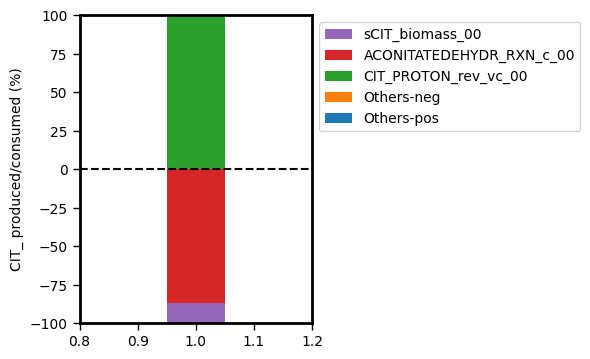

In [185]:
generateMetaboliteBudget(C3_unlimited_opt, solution_C3_unlimited, show_plot=True, percentage=True, day_or_night_tag="_00", 
                         metabolite="CIT_")

Total: 0.4534737507252273


({'Others-pos': 2.2480892790760701e-13,
  'Others-neg': 0.0,
  'PEPCARBOX_RXN_c_12': -61.81252338698861,
  'RXN0_5224_c_12': 61.81252338698861,
  'ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12': -38.1874766130114,
  'RXN0_5224_p_12': 38.18747661301117},
                                              value
 Others-pos                            2.248089e-13
 Others-neg                            0.000000e+00
 PEPCARBOX_RXN_c_12                   -6.181252e+01
 RXN0_5224_c_12                        6.181252e+01
 ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12 -3.818748e+01
 RXN0_5224_p_12                        3.818748e+01)

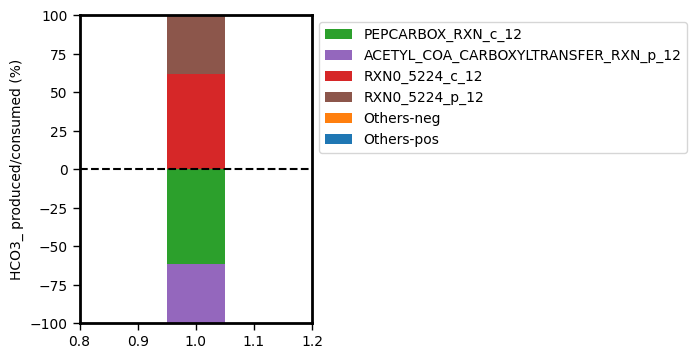

In [186]:
generateMetaboliteBudget(C3_unlimited_opt, solution_C3_unlimited, show_plot=True, percentage=True, day_or_night_tag="_12", 
                         metabolite="HCO3_")

Total: 16.591361111371643


({'Others-pos': 4.921271965413617,
  'Others-neg': -0.3521399576405088,
  'RIBULOSE_BISPHOSPHATE_CARBOXYLASE_RXN_p_00': -89.14464998107272,
  'CO2_tx_00': 74.61500026745989,
  'GCVMULTI_RXN_m_00': 16.775183908208582,
  'RXN0_5224_p_00': -8.957859695126752,
  'ISOCITDEH_RXN_m_00': 2.521459460958357,
  'ISOCITDEH_RXN_c_00': -1.5453503661600498,
  'ACETOOHBUTSYN_RXN_p_00': 1.167084397959546},
                                                 value
 Others-pos                                   4.921272
 Others-neg                                  -0.352140
 RIBULOSE_BISPHOSPHATE_CARBOXYLASE_RXN_p_00 -89.144650
 CO2_tx_00                                   74.615000
 GCVMULTI_RXN_m_00                           16.775184
 RXN0_5224_p_00                              -8.957860
 ISOCITDEH_RXN_m_00                           2.521459
 ISOCITDEH_RXN_c_00                          -1.545350
 ACETOOHBUTSYN_RXN_p_00                       1.167084)

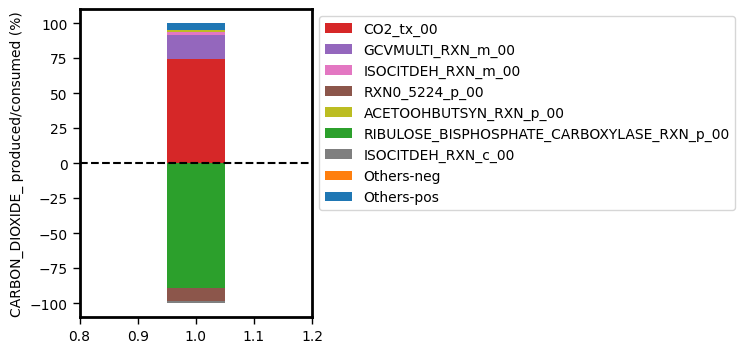

In [187]:
generateMetaboliteBudget(C3_unlimited_opt, solution_C3_unlimited, show_plot=True, percentage=True, day_or_night_tag="_00", 
                         metabolite="CARBON_DIOXIDE_", threshold= 0.01)

Total: 0.5474705433201505


({'Others-pos': 12.584281272100094,
  'Others-neg': 0.0,
  'ISOCITDEH_RXN_m_12': 76.41405543161879,
  'ISOCITDEH_RXN_c_12': -49.40592382879777,
  'BRANCHED_CHAINAMINOTRANSFERILEU_RXN_m_12': -31.503291056271607,
  '2OXOGLUTARATEDEH_RXN_m_12': -19.090785114930654,
  'GLUTAMATE_DEHYDROGENASE_RXN_m_12': 5.661926827285176,
  'ALANINE_AMINOTRANSFERASE_RXN_c_12': 5.339736468995927},
                                               value
 Others-pos                                12.584281
 Others-neg                                 0.000000
 ISOCITDEH_RXN_m_12                        76.414055
 ISOCITDEH_RXN_c_12                       -49.405924
 BRANCHED_CHAINAMINOTRANSFERILEU_RXN_m_12 -31.503291
 2OXOGLUTARATEDEH_RXN_m_12                -19.090785
 GLUTAMATE_DEHYDROGENASE_RXN_m_12           5.661927
 ALANINE_AMINOTRANSFERASE_RXN_c_12          5.339736)

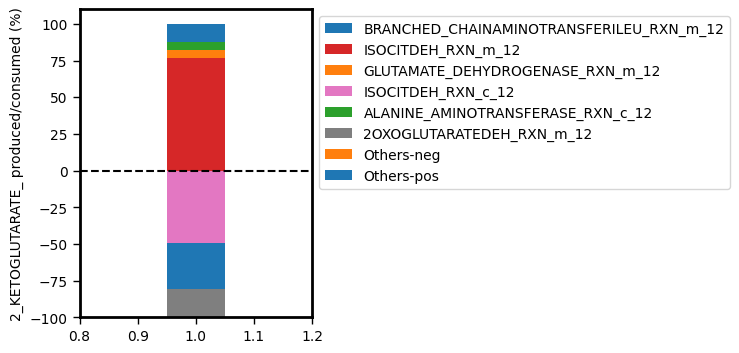

In [188]:
generateMetaboliteBudget(C3_unlimited_opt, solution_C3_unlimited, show_plot=True, percentage=True, day_or_night_tag="_12", 
                         metabolite="2_KETOGLUTARATE_", threshold=0.05, colourDict=colourDict_CO2)

In [189]:
for rxn in diel_model.metabolites.get_by_id("2_KETOGLUTARATE_c_12").reactions:
    print(rxn)

ISOCITDEH_RXN_c_12: NADP_c_12 + THREO_DS_ISO_CITRATE_c_12 <=> 2_KETOGLUTARATE_c_12 + CARBON_DIOXIDE_c_12 + NADPH_c_12
ALANINE_AMINOTRANSFERASE_RXN_c_12: 2_KETOGLUTARATE_c_12 + L_ALPHA_ALANINE_c_12 <=> GLT_c_12 + PYRUVATE_c_12
2KG_SUC_mc_12: 2_KETOGLUTARATE_m_12 + SUC_c_12 <=> 2_KETOGLUTARATE_c_12 + SUC_m_12
TYROSINE_AMINOTRANSFERASE_RXN_c_12: 2_KETOGLUTARATE_c_12 + TYR_c_12 <=> GLT_c_12 + P_HYDROXY_PHENYLPYRUVATE_c_12
2_KETOGLUTARATE_xc_12: 2_KETOGLUTARATE_x_12 <=> 2_KETOGLUTARATE_c_12
ASPAMINOTRANS_RXN_c_12: 2_KETOGLUTARATE_c_12 + L_ASPARTATE_c_12 <=> GLT_c_12 + OXALACETIC_ACID_c_12
2_AMINOADIPATE_AMINOTRANSFERASE_RXN_c_12: 2_KETOGLUTARATE_c_12 + CPD_468_c_12 --> 2K_ADIPATE_c_12 + GLT_c_12
2KG_ACONITATE_mc_12: 2_KETOGLUTARATE_m_12 + CIS_ACONITATE_c_12 + PROTON_c_12 <=> 2_KETOGLUTARATE_c_12 + CIS_ACONITATE_m_12 + PROTON_m_12
2KG_OAA_mc_12: 2_KETOGLUTARATE_m_12 + OXALACETIC_ACID_c_12 <=> 2_KETOGLUTARATE_c_12 + OXALACETIC_ACID_m_12
2KG_ISOCITRATE_mc_12: 2_KETOGLUTARATE_m_12 + PROTON_c_12

In [190]:
CO2_rxns = [
# "Others-pos",
# "Others-neg",
"CO2_tx_12",
"ISOCITDEH_RXN_m_12",
"ISOCITDEH_RXN_c_12",
"ISOCITDEH_RXN_x_12",
"6PGLUCONDEHYDROG_RXN_c_12",
"6PGLUCONDEHYDROG_RXN_p_12",
"2OXOGLUTARATEDEH_RXN_m_12",
"RXN0_5224_c_12",
"PEPCARBOX_RXN_c_12",
"PEPCARBOXYKIN_RXN_c_12",
"PYRUVDEH_RXN_m_12",
"PYRUVDEH_RXN_p_12",
"RXN0_5224_p_12",
"ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12",
"RXN_9958_NAD_m_12",
"2KETO_3METHYLVALERATE_RXN_m_12",
"UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12",
"RXN_9651_p_12",
"RXN_9648_p_12",
"RXN_9650_p_12",
"RXN_9652_p_12",
"RXN_9653_p_12",
"2.3.1.180_RXN_p_12",
"RXN_9654_p_12",
"ACETOLACTSYN_RXN_p_12",
"DIAMINOPIMDECARB_RXN_p_12",
"CARBAMATE_KINASE_RXN_p_12",
"PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12",
"1.2.1.2_RXN_p_12",
"GLUTDECARBOX_RXN_c_12",
"AraCore_Biomass_tx_total"]


    
CO2_rxns_dict = {}
for rxn in CO2_rxns:
    CO2_rxns_dict[rxn] = []

In [191]:
model = C3_unlimited_opt
model_name = "C3_unlimited_opt"

for rxn in CO2_rxns:
    # print(model.reactions.get_by_id(rxn).id)
    # print(model.reactions.get_by_id(rxn).flux)

    #amount of CO2 and direction

    CO2_rxns_dict[rxn].append(model.reactions.get_by_id(rxn).flux)

CO2_rxns_dict

{'CO2_tx_12': [-1.2611640158317665],
 'ISOCITDEH_RXN_m_12': [0.4183444444444444],
 'ISOCITDEH_RXN_c_12': [-0.2704828796178589],
 'ISOCITDEH_RXN_x_12': [0.0],
 '6PGLUCONDEHYDROG_RXN_c_12': [0.33844725865759023],
 '6PGLUCONDEHYDROG_RXN_p_12': [0.3091804062342183],
 '2OXOGLUTARATEDEH_RXN_m_12': [0.10451642499279326],
 'RXN0_5224_c_12': [0.28030356822088554],
 'PEPCARBOX_RXN_c_12': [0.28030356822088554],
 'PEPCARBOXYKIN_RXN_c_12': [0.0],
 'PYRUVDEH_RXN_m_12': [0.005105383606545025],
 'PYRUVDEH_RXN_p_12': [0.20943848045277427],
 'RXN0_5224_p_12': [0.17317018250434074],
 'ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12': [0.17317018250434177],
 'RXN_9958_NAD_m_12': [0.1724712387094986],
 '2KETO_3METHYLVALERATE_RXN_m_12': [0.17247123870949857],
 'UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12': [0.03640897157763119],
 'RXN_9651_p_12': [0.024738597500620255],
 'RXN_9648_p_12': [0.024738597500620258],
 'RXN_9650_p_12': [0.024738597500620255],
 'RXN_9652_p_12': [0.024738597500620255],
 'RXN_9653_p_12': [0.02473859

Nocturnal CO2 consumption:
~61% just lost to atmosphere

~ 16% by cytosolic CA
~ 11% by plastidic CA
~ 12% by cytosolic ICDH

In [192]:
# save as json CO2_unconstrained solution as json
save_model_and_fluxes_json(C3_unlimited_opt, solution_C3_unlimited, "C3_CO2_unconstrained")

### check higher NGAM costs

In [193]:
C3_unlimited_NGAM_high = diel_model.copy()

NGAM = 8.5

C3_unlimited_NGAM_high.reactions.ATPase_tx_00.bounds = (NGAM, NGAM)
C3_unlimited_NGAM_high.reactions.ATPase_tx_12.bounds = (NGAM, NGAM)


solution_C3_unlimited_NGAM_high, C3_unlimited_NGAM_high_opt = optimise_model(C3_unlimited_NGAM_high, output_string+"_total", pFBA=True)


calc_carbon_flux(C3_unlimited_NGAM_high_opt, output_string="AraCore_Biomass_tx", night_tag = "_12")


Objective: AraCore_Biomass_tx_total
CO2 daytime exchange: 11.93849805919333
CO2 nightime exchange: -2.747958823352691
CO2 respiratory losses: 0 (no CO2_m_00 found)
Carbon day to night: 6.0063980919118976
Carbon night to day: 0.9608044595990417
CO2 exchange night:day: 0.15996349973752869
AraCore_Biomass_tx_00 carbon flux: -6.892904426880481
AraCore_Biomass_tx_12 carbon flux: -2.29763480896016
total carbon biomass flux: -9.19053923584064
total CCE: 0.7698237408317368
nCO2RC: 0.24131761115507394
night CCE1 (carbon in to biomass): 0.382531223172522
night CCE2 (1 - (carbon lost / carbon in)): 0.5424947229100514


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


,value
CO2 daytime exchange,11.938498
CO2 nightime exchange,-2.747959
Carbon day to night,6.006398
Carbon night to day,0.960804
CO2 exchange night:day,0.159963
day carbon biomass flux,6.892904
night carbon biomass flux,2.297635
total Carbon biomass flux,9.190539
total CCE,0.769824
nCO2RC,0.241318


In [194]:


model = C3_unlimited_NGAM_high.copy()
model.reactions.ATPase_tx_00.bounds = (0, 1000)
model.reactions.ATPase_tx_12.bounds = (0, 1000)

ATPase_day_night_equal = model.problem.Constraint(
                            (model.reactions.ATPase_tx_00.flux_expression) -
                            (model.reactions.ATPase_tx_12.flux_expression) , 
                            lb = 0,
                            ub= 0,
                            name= "ATPase_day_night_equal")
model.add_cons_vars(ATPase_day_night_equal)

df_NGAM_scan, NGAM_scan_sols = parameter_scan_CO2(model, output_string+"_total", "ATPase_tx_00", 0, 10.5, 0.5, pFBA=True, CO2_refixation_allowed=True, verbose=True, scan_ub_and_lb=True)

Scanning process: ATPase_tx_00 

------- Scan iteration: 1      Scan value: 0.0 (ATPase_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1455112
----- Cytosol -----
producing CO2:	CO2_pc_12	0.365174
consuming CO2:	ISOCITDEH_RXN_c_12	-0.002866
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.041287
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003505
producing CO2:	CO2_mc_12	0.152239
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.028053
producing CO2:	RXN_9650_p_12	0.028053
producing CO2:	RXN_5682_p_12	0.006017
producing CO2:	2.3.1.180_RXN_p_12	0.028053
producing CO2:	RXN_9654_p_12	0.028053
consuming CO2:	RXN0_5224_p_12	0.19637
producing HCO3-:	RXN0_5224_p_12	0.19637
consuming CO2:	CO2_pc_12	0.365174
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.19637
producing CO2:	PYRUVDEH_RXN_p_12	0.211259
producing CO2:	RXN_9653_p_12	0.028053
producing CO2:	RXN_7800_p_12	0.013074
producing CO2:	RXN_9651_p_12	0.028053
producing CO2:	RXN_964

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 2      Scan value: 0.5 (ATPase_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1433516
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.0462
producing HCO3-:	RXN0_5224_c_12	0.0462
producing CO2:	CO2_pc_12	0.408218
consuming CO2:	ISOCITDEH_RXN_c_12	-0.007133
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.040674
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003453
producing CO2:	CO2_mc_12	0.189031
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.026969
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.0462
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005928
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.027636
producing CO2:	RXN_9650_p_12	0.027636
producing CO2:	2.3.1.180_RXN_p_12	0.027636
producing CO2:	RXN_9654_p_12	0.027636
consuming CO2:	RXN0_5224_p_12	0.193455
producing HCO3-:	RXN0_5224_p_12	0.193455
consuming CO2:	CO2_pc_12	0.408218
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.193455
producing CO2

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 3      Scan value: 1.0 (ATPase_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1411416
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.118435
producing HCO3-:	RXN0_5224_c_12	0.118435
producing CO2:	CO2_pc_12	0.430131
consuming CO2:	ISOCITDEH_RXN_c_12	-0.063435
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.040047
producing CO2:	GLUTDECARBOX_RXN_c_12	0.0034
producing CO2:	CO2_mc_12	0.29116
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.082965
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.118435
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005836
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.02721
producing CO2:	RXN_9650_p_12	0.02721
producing CO2:	2.3.1.180_RXN_p_12	0.02721
producing CO2:	RXN_9654_p_12	0.02721
consuming CO2:	RXN0_5224_p_12	0.190473
producing HCO3-:	RXN0_5224_p_12	0.190473
consuming CO2:	CO2_pc_12	0.430131
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.190473
producing CO2:

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 4      Scan value: 1.5 (ATPase_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1388664
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.190681
producing HCO3-:	RXN0_5224_c_12	0.190681
producing CO2:	CO2_pc_12	0.451871
consuming CO2:	ISOCITDEH_RXN_c_12	-0.119759
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.039401
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003345
producing CO2:	CO2_mc_12	0.39325
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.138974
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.190681
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005742
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.026772
producing CO2:	RXN_9650_p_12	0.026772
producing CO2:	2.3.1.180_RXN_p_12	0.026772
producing CO2:	RXN_9654_p_12	0.026772
consuming CO2:	RXN0_5224_p_12	0.187403
producing HCO3-:	RXN0_5224_p_12	0.187403
consuming CO2:	CO2_pc_12	0.451871
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.187403
producin

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 5      Scan value: 2.0 (ATPase_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1365813
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.261027
producing HCO3-:	RXN0_5224_c_12	0.261027
producing CO2:	CO2_pc_12	0.475678
consuming CO2:	ISOCITDEH_RXN_c_12	-0.170326
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.038753
producing CO2:	GLUTDECARBOX_RXN_c_12	0.00329
producing CO2:	CO2_mc_12	0.495082
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.192105
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.261027
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005648
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.026331
producing CO2:	RXN_9650_p_12	0.026331
producing CO2:	2.3.1.180_RXN_p_12	0.026331
producing CO2:	RXN_9654_p_12	0.026331
consuming CO2:	RXN0_5224_p_12	0.184319
producing HCO3-:	RXN0_5224_p_12	0.184319
consuming CO2:	CO2_pc_12	0.475678
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.184319
producin

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 6      Scan value: 2.5 (ATPase_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1342418
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.270696
producing HCO3-:	RXN0_5224_c_12	0.270696
producing CO2:	CO2_pc_12	0.497211
consuming CO2:	ISOCITDEH_RXN_c_12	-0.19849
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.038089
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003234
producing CO2:	CO2_mc_12	0.602524
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.234037
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.270696
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005551
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.02588
producing CO2:	RXN_9650_p_12	0.02588
producing CO2:	2.3.1.180_RXN_p_12	0.02588
producing CO2:	RXN_9654_p_12	0.02588
consuming CO2:	RXN0_5224_p_12	0.181161
producing HCO3-:	RXN0_5224_p_12	0.181161
consuming CO2:	CO2_pc_12	0.497211
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.181161
producing CO

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 7      Scan value: 3.0 (ATPase_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1319022
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.280221
producing HCO3-:	RXN0_5224_c_12	0.280221
producing CO2:	CO2_pc_12	0.518744
consuming CO2:	ISOCITDEH_RXN_c_12	-0.22665
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.037425
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003178
producing CO2:	CO2_mc_12	0.709975
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.275966
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.280221
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005454
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.025429
producing CO2:	RXN_9650_p_12	0.025429
producing CO2:	2.3.1.180_RXN_p_12	0.025429
producing CO2:	RXN_9654_p_12	0.025429
consuming CO2:	RXN0_5224_p_12	0.178004
producing HCO3-:	RXN0_5224_p_12	0.178004
consuming CO2:	CO2_pc_12	0.518744
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.178004
producin

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 8      Scan value: 3.5 (ATPase_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1295625
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.282621
producing HCO3-:	RXN0_5224_c_12	0.282621
producing CO2:	CO2_pc_12	0.540277
consuming CO2:	ISOCITDEH_RXN_c_12	-0.254614
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036761
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003121
producing CO2:	CO2_mc_12	0.817818
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.317797
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.282621
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005358
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024978
producing CO2:	RXN_9650_p_12	0.024978
producing CO2:	2.3.1.180_RXN_p_12	0.024978
producing CO2:	RXN_9654_p_12	0.024978
consuming CO2:	RXN0_5224_p_12	0.174847
producing HCO3-:	RXN0_5224_p_12	0.174847
consuming CO2:	CO2_pc_12	0.540277
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.174847
produci

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 9      Scan value: 4.0 (ATPase_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1272163
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.277892
producing HCO3-:	RXN0_5224_c_12	0.277892
producing CO2:	CO2_pc_12	0.561792
consuming CO2:	ISOCITDEH_RXN_c_12	-0.28183
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036096
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003065
producing CO2:	CO2_mc_12	0.931212
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.357222
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.277892
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005261
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024526
producing CO2:	RXN_9650_p_12	0.024526
producing CO2:	2.3.1.180_RXN_p_12	0.024526
producing CO2:	RXN_9654_p_12	0.024526
consuming CO2:	RXN0_5224_p_12	0.171681
producing HCO3-:	RXN0_5224_p_12	0.171681
consuming CO2:	CO2_pc_12	0.561792
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.171681
producin

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 10      Scan value: 4.5 (ATPase_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1248666
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.27276
producing HCO3-:	RXN0_5224_c_12	0.27276
producing CO2:	CO2_pc_12	0.587287
consuming CO2:	ISOCITDEH_RXN_c_12	-0.305984
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.035429
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003008
producing CO2:	CO2_mc_12	1.042598
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.397186
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.27276
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005163
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024073
producing CO2:	RXN_9650_p_12	0.024073
producing CO2:	2.3.1.180_RXN_p_12	0.024073
producing CO2:	RXN_9654_p_12	0.024073
consuming CO2:	RXN0_5224_p_12	0.16851
producing HCO3-:	RXN0_5224_p_12	0.16851
consuming CO2:	CO2_pc_12	0.587287
producing CO2:	1.2.1.2_RXN_p_12	0.003989
consuming HCO3-:	ACETYL_COA_CARBO

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 11      Scan value: 5.0 (ATPase_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.122517
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.267627
producing HCO3-:	RXN0_5224_c_12	0.267627
producing CO2:	CO2_pc_12	0.608718
consuming CO2:	ISOCITDEH_RXN_c_12	-0.330138
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.034762
producing CO2:	GLUTDECARBOX_RXN_c_12	0.002951
producing CO2:	CO2_mc_12	1.158049
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.43715
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.267627
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005066
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.02362
producing CO2:	RXN_9650_p_12	0.02362
producing CO2:	2.3.1.180_RXN_p_12	0.02362
producing CO2:	RXN_9654_p_12	0.02362
consuming CO2:	RXN0_5224_p_12	0.165339
producing HCO3-:	RXN0_5224_p_12	0.165339
consuming CO2:	CO2_pc_12	0.608718
producing CO2:	1.2.1.2_RXN_p_12	0.003914
consuming HCO3-:	ACETYL_COA_CARBOX

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 12      Scan value: 5.5 (ATPase_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1201673
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.262495
producing HCO3-:	RXN0_5224_c_12	0.262495
producing CO2:	CO2_pc_12	0.62631
consuming CO2:	ISOCITDEH_RXN_c_12	-0.354292
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.034096
producing CO2:	GLUTDECARBOX_RXN_c_12	0.002895
producing CO2:	CO2_mc_12	1.277338
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.477114
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.262495
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.004969
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.023167
producing CO2:	RXN_9650_p_12	0.023167
producing CO2:	2.3.1.180_RXN_p_12	0.023167
producing CO2:	RXN_9654_p_12	0.023167
consuming CO2:	RXN0_5224_p_12	0.162168
producing HCO3-:	RXN0_5224_p_12	0.162168
consuming CO2:	CO2_pc_12	0.62631
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.162168
producin

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 13      Scan value: 6.0 (ATPase_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1178177
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.257362
producing HCO3-:	RXN0_5224_c_12	0.257362
producing CO2:	CO2_pc_12	0.647816
consuming CO2:	ISOCITDEH_RXN_c_12	-0.378445
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.033429
producing CO2:	GLUTDECARBOX_RXN_c_12	0.002838
producing CO2:	CO2_mc_12	1.392714
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.517078
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.257362
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.004872
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.022714
producing CO2:	RXN_9650_p_12	0.022714
producing CO2:	2.3.1.180_RXN_p_12	0.022714
producing CO2:	RXN_9654_p_12	0.022714
consuming CO2:	RXN0_5224_p_12	0.158997
producing HCO3-:	RXN0_5224_p_12	0.158997
consuming CO2:	CO2_pc_12	0.647816
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.158997
produc

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 14      Scan value: 6.5 (ATPase_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1154681
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.252229
producing HCO3-:	RXN0_5224_c_12	0.252229
producing CO2:	CO2_pc_12	0.673011
consuming CO2:	ISOCITDEH_RXN_c_12	-0.402599
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.032762
producing CO2:	GLUTDECARBOX_RXN_c_12	0.002782
producing CO2:	CO2_mc_12	1.5044
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.557042
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.252229
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.004775
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.022261
producing CO2:	RXN_9650_p_12	0.022261
producing CO2:	2.3.1.180_RXN_p_12	0.022261
producing CO2:	RXN_9654_p_12	0.022261
consuming CO2:	RXN0_5224_p_12	0.155826
producing HCO3-:	RXN0_5224_p_12	0.155826
consuming CO2:	CO2_pc_12	0.673011
producing CO2:	1.2.1.2_RXN_p_12	0.003689
consuming HCO3-:	ACETYL_COA_CA

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 15      Scan value: 7.0 (ATPase_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1131184
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.247097
producing HCO3-:	RXN0_5224_c_12	0.247097
producing CO2:	CO2_pc_12	0.694442
consuming CO2:	ISOCITDEH_RXN_c_12	-0.426753
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.032096
producing CO2:	GLUTDECARBOX_RXN_c_12	0.002725
producing CO2:	CO2_mc_12	1.619851
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.597006
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.247097
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.004678
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.021808
producing CO2:	RXN_9650_p_12	0.021808
producing CO2:	2.3.1.180_RXN_p_12	0.021808
producing CO2:	RXN_9654_p_12	0.021808
consuming CO2:	RXN0_5224_p_12	0.152655
producing HCO3-:	RXN0_5224_p_12	0.152655
consuming CO2:	CO2_pc_12	0.694442
producing CO2:	1.2.1.2_RXN_p_12	0.003614
consuming HCO3-:	ACETYL_COA_

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 16      Scan value: 7.5 (ATPase_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1107688
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.241964
producing HCO3-:	RXN0_5224_c_12	0.241964
producing CO2:	CO2_pc_12	0.715873
consuming CO2:	ISOCITDEH_RXN_c_12	-0.450907
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.031429
producing CO2:	GLUTDECARBOX_RXN_c_12	0.002668
producing CO2:	CO2_mc_12	1.735302
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.63697
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.241964
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.00458
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.021355
producing CO2:	RXN_9650_p_12	0.021355
producing CO2:	2.3.1.180_RXN_p_12	0.021355
producing CO2:	RXN_9654_p_12	0.021355
consuming CO2:	RXN0_5224_p_12	0.149484
producing HCO3-:	RXN0_5224_p_12	0.149484
consuming CO2:	CO2_pc_12	0.715873
producing CO2:	1.2.1.2_RXN_p_12	0.003539
consuming HCO3-:	ACETYL_COA_CA

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 17      Scan value: 8.0 (ATPase_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1084191
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.236832
producing HCO3-:	RXN0_5224_c_12	0.236832
producing CO2:	CO2_pc_12	0.73384
consuming CO2:	ISOCITDEH_RXN_c_12	-0.475061
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.030762
producing CO2:	GLUTDECARBOX_RXN_c_12	0.002612
producing CO2:	CO2_mc_12	1.854216
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.676934
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.236832
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.004483
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.020902
producing CO2:	RXN_9650_p_12	0.020902
producing CO2:	2.3.1.180_RXN_p_12	0.020902
producing CO2:	RXN_9654_p_12	0.020902
consuming CO2:	RXN0_5224_p_12	0.146313
producing HCO3-:	RXN0_5224_p_12	0.146313
consuming CO2:	CO2_pc_12	0.73384
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.146313
producin

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 18      Scan value: 8.5 (ATPase_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1060695
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.231699
producing HCO3-:	RXN0_5224_c_12	0.231699
producing CO2:	CO2_pc_12	0.758735
consuming CO2:	ISOCITDEH_RXN_c_12	-0.499214
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.030096
producing CO2:	GLUTDECARBOX_RXN_c_12	0.002555
producing CO2:	CO2_mc_12	1.966203
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.716898
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.231699
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.004386
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.020449
producing CO2:	RXN_9650_p_12	0.020449
producing CO2:	2.3.1.180_RXN_p_12	0.020449
producing CO2:	RXN_9654_p_12	0.020449
consuming CO2:	RXN0_5224_p_12	0.143143
producing HCO3-:	RXN0_5224_p_12	0.143143
consuming CO2:	CO2_pc_12	0.758735
producing CO2:	1.2.1.2_RXN_p_12	0.003389
consuming HCO3-:	ACETYL_COA_

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 19      Scan value: 9.0 (ATPase_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1037198
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.226566
producing HCO3-:	RXN0_5224_c_12	0.226566
producing CO2:	CO2_pc_12	0.776852
consuming CO2:	ISOCITDEH_RXN_c_12	-0.523368
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.029429
producing CO2:	GLUTDECARBOX_RXN_c_12	0.002499
producing CO2:	CO2_mc_12	2.084967
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.756862
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.226566
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.004289
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.019996
producing CO2:	RXN_9650_p_12	0.019996
producing CO2:	2.3.1.180_RXN_p_12	0.019996
producing CO2:	RXN_9654_p_12	0.019996
consuming CO2:	RXN0_5224_p_12	0.139972
producing HCO3-:	RXN0_5224_p_12	0.139972
consuming CO2:	CO2_pc_12	0.776852
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.139972
produc

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 20      Scan value: 9.5 (ATPase_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1013702
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.221434
producing HCO3-:	RXN0_5224_c_12	0.221434
producing CO2:	CO2_pc_12	0.801597
consuming CO2:	ISOCITDEH_RXN_c_12	-0.547522
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.028762
producing CO2:	GLUTDECARBOX_RXN_c_12	0.002442
producing CO2:	CO2_mc_12	2.197104
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.796825
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.221434
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.004192
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.019543
producing CO2:	RXN_9650_p_12	0.019543
producing CO2:	2.3.1.180_RXN_p_12	0.019543
producing CO2:	RXN_9654_p_12	0.019543
consuming CO2:	RXN0_5224_p_12	0.136801
producing HCO3-:	RXN0_5224_p_12	0.136801
consuming CO2:	CO2_pc_12	0.801597
producing CO2:	1.2.1.2_RXN_p_12	0.003239
consuming HCO3-:	ACETYL_COA_

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 21      Scan value: 10.0 (ATPase_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0990205
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.216301
producing HCO3-:	RXN0_5224_c_12	0.216301
producing CO2:	CO2_pc_12	0.819864
consuming CO2:	ISOCITDEH_RXN_c_12	-0.571676
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.028096
producing CO2:	GLUTDECARBOX_RXN_c_12	0.002385
producing CO2:	CO2_mc_12	2.315718
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.836789
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.216301
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.004095
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.01909
producing CO2:	RXN_9650_p_12	0.01909
producing CO2:	2.3.1.180_RXN_p_12	0.01909
producing CO2:	RXN_9654_p_12	0.01909
consuming CO2:	RXN0_5224_p_12	0.13363
producing HCO3-:	RXN0_5224_p_12	0.13363
consuming CO2:	CO2_pc_12	0.819864
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.13363
producing CO

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


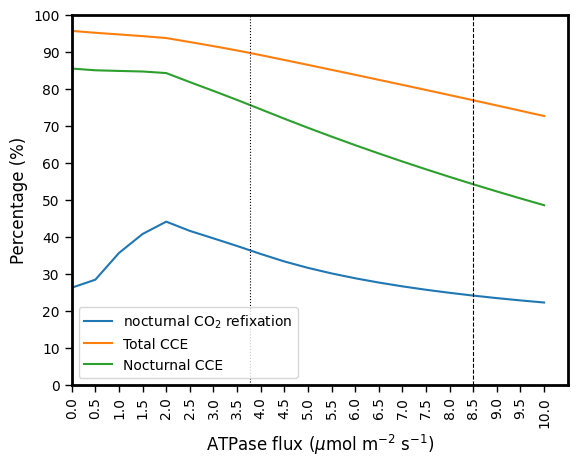

In [195]:
df =df_NGAM_scan

# Get the x-values from the plot
x_values = df_NGAM_scan.columns.astype(float)

# Find the x-value closest to set ATPase fluxes in models
ATPase_1 = 3.7651 #my value for NGAM (ATPase flux) from light intensity
ATPase_2 = 8.5 # Shameer et al., 2018 values for NGAM (ATPase flux)
closest_x1 = ATPase_1*2
closest_x2 = ATPase_2*2

biomass_max = df.T["AraCore_Biomass_tx_total"].max()


# Plot the data
plt.plot(df.T["noct. CO2 coeff."]*100, label="nocturnal CO$_2$ refixation")
plt.plot(df.T["CCE"]*100, label="Total CCE")
plt.plot(df.T["nighttime CCE"]*100, label="Nocturnal CCE")
# plt.plot(df.T["AraCore_Biomass_tx_total"]/biomass_max*100, label="Biomass")

# Add labels and title
plt.xlabel("ATPase flux ($\mu$mol m$^{-2}$ s$^{-1}$)", fontsize=12)
plt.ylabel("Percentage (%)", fontsize=12)
# plt.title("Increasing NGAM costs decreases CCE (Biomass objective)")

# Rotate x-axis labels
plt.xticks(rotation=90)

# Set y-axis limits and y-axis tick marks
plt.ylim(0, 100)
plt.yticks(range(0, 101, 10))

plt.xlim(0, len(x_values))


# Add a vertical line at mine and Shameer et al., 2018's ATPase flux value
plt.axvline(x=closest_x1, linestyle='dotted', color = 'black', linewidth=0.8)
plt.axvline(x=closest_x2, linestyle='--', color = 'black', linewidth=0.8)



plt.legend()

# Show the plot
plt.savefig("Ch1_NGAM_scan.png", dpi=300, bbox_inches='tight')
plt.show()



In [196]:
df_NGAM_scan

,0.0,0.5,1.0,1.5,2.0,2.5,3.0,3.5,4.0,4.5,...,5.5,6.0,6.5,7.0,7.5,8.0,8.5,9.0,9.5,10.0
reactions,,,,,,,,,,,,,,,,,,,,,
PRO_PROTON_vc_00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Ca_tx_00,0.096037,0.094612,0.093153,0.091652,0.090144,0.088600,0.087055,0.085511,0.083963,0.082412,...,0.079310,0.077760,0.076209,0.074658,0.073107,0.071557,0.070006,0.068455,0.066904,0.065354
H2O_xc_00,4.680864,4.769740,4.856497,4.941153,5.006437,4.984577,4.962722,4.941059,4.921537,4.903301,...,4.866830,4.848595,4.830359,4.812124,4.793888,4.775653,4.757417,4.739182,4.720946,4.702711
sCIT_biomass_00,-0.028781,-0.028354,-0.027916,-0.027466,-0.027014,-0.026552,-0.026089,-0.025626,-0.025162,-0.024697,...,-0.023768,-0.023303,-0.022838,-0.022374,-0.021909,-0.021444,-0.020980,-0.020515,-0.020050,-0.019585
ACETYLGLUTKIN_RXN_p_00,0.036190,0.035653,0.035103,0.034537,0.033969,0.033387,0.032805,0.032223,0.031640,0.031055,...,0.029887,0.029302,0.028718,0.028134,0.027549,0.026965,0.026380,0.025796,0.025212,0.024627
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
daytime CO2 uptake ub,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,...,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
scan process ub,0.000000,0.500000,1.000000,1.500000,2.000000,2.500000,3.000000,3.500000,4.000000,4.500000,...,5.500000,6.000000,6.500000,7.000000,7.500000,8.000000,8.500000,9.000000,9.500000,10.000000
total aa day,0.240057,0.236494,0.232848,0.229094,0.216985,0.213268,0.209698,0.213349,0.209875,0.205998,...,0.198246,0.194369,0.190493,0.186617,0.182740,0.178864,0.174988,0.171112,0.167235,0.163359


### check phloem output as objective

In [197]:
model = diel_model.copy()

#define phloem output reaction
phloem_output_string = "Phloem_output_tx_mod"

phloem_day = Reaction(phloem_output_string+day_tag, name = "Phloem output reaction_day")
phloem_night = Reaction(phloem_output_string+night_tag, name = "Phloem output reaction_night")


# phloem output reaction equation from Shameer et al., 2018 for C3 plants (tomato)

phloem_day.add_metabolites({model.metabolites.get_by_id("4_AMINO_BUTYRATE_c_00"): -0.0022970297,
                                model.metabolites.get_by_id("ARG_c_00"): -0.0004186704,
                                model.metabolites.get_by_id("ASN_c_00"): -0.0015049505,
                                model.metabolites.get_by_id("CYS_c_00"): -0.0004186704,
                                model.metabolites.get_by_id("FRU_c_00"): -0.0792079208,
                                model.metabolites.get_by_id("GLC_c_00"): -0.0693069307,
                                model.metabolites.get_by_id("GLN_c_00"): -0.0240792079,
                                model.metabolites.get_by_id("GLT_c_00"): -0.0124356436,
                                model.metabolites.get_by_id("GLY_c_00"): -0.0007128713,
                                model.metabolites.get_by_id("HIS_c_00"): -0.0004186704,
                                model.metabolites.get_by_id("ILE_c_00"): -0.0017425743,
                                model.metabolites.get_by_id("LEU_c_00"): -0.0020594059,
                                model.metabolites.get_by_id("LYS_c_00"): -0.0022178218,
                                model.metabolites.get_by_id("L_ALPHA_ALANINE_c_00"): -0.0038811881,
                                model.metabolites.get_by_id("L_ASPARTATE_c_00"): -0.006019802,
                                model.metabolites.get_by_id("MET_c_00"): -0.0004186704,
                                model.metabolites.get_by_id("PHE_c_00"): -0.0057029703,
                                model.metabolites.get_by_id("PROTON_e_00"): -0.9603960396,
                                model.metabolites.get_by_id("PRO_c_00"): -0.0004186704,
                                model.metabolites.get_by_id("SER_c_00"): -0.003960396,
                                model.metabolites.get_by_id("THR_c_00"): -0.0068910891,
                                model.metabolites.get_by_id("TRP_c_00"): -0.0004186704,
                                model.metabolites.get_by_id("TYR_c_00"): -0.0004186704,
                                model.metabolites.get_by_id("VAL_c_00"): -0.0027722772,
                                model.metabolites.get_by_id("sSUCROSE_b_00"): -0.7326732673,
                                model.metabolites.get_by_id("PROTON_c_00"): 0.9603960396})

phloem_night.add_metabolites({model.metabolites.get_by_id("4_AMINO_BUTYRATE_c_12"): -0.0022970297,
                                model.metabolites.get_by_id("ARG_c_12"): -0.0004186704,
                                model.metabolites.get_by_id("ASN_c_12"): -0.0015049505,
                                model.metabolites.get_by_id("CYS_c_12"): -0.0004186704,
                                model.metabolites.get_by_id("FRU_c_12"): -0.0792079208,
                                model.metabolites.get_by_id("GLC_c_12"): -0.0693069307,
                                model.metabolites.get_by_id("GLN_c_12"): -0.0240792079,
                                model.metabolites.get_by_id("GLT_c_12"): -0.0124356436,
                                model.metabolites.get_by_id("GLY_c_12"): -0.0007128713,
                                model.metabolites.get_by_id("HIS_c_12"): -0.0004186704,
                                model.metabolites.get_by_id("ILE_c_12"): -0.0017425743,
                                model.metabolites.get_by_id("LEU_c_12"): -0.0020594059,
                                model.metabolites.get_by_id("LYS_c_12"): -0.0022178218,
                                model.metabolites.get_by_id("L_ALPHA_ALANINE_c_12"): -0.0038811881,
                                model.metabolites.get_by_id("L_ASPARTATE_c_12"): -0.006019802,
                                model.metabolites.get_by_id("MET_c_12"): -0.0004186704,
                                model.metabolites.get_by_id("PHE_c_12"): -0.0057029703,
                                model.metabolites.get_by_id("PROTON_e_12"): -0.9603960396,
                                model.metabolites.get_by_id("PRO_c_12"): -0.0004186704,
                                model.metabolites.get_by_id("SER_c_12"): -0.003960396,
                                model.metabolites.get_by_id("THR_c_12"): -0.0068910891,
                                model.metabolites.get_by_id("TRP_c_12"): -0.0004186704,
                                model.metabolites.get_by_id("TYR_c_12"): -0.0004186704,
                                model.metabolites.get_by_id("VAL_c_12"): -0.0027722772,
                                model.metabolites.get_by_id("sSUCROSE_b_12"): -0.7326732673,
                                model.metabolites.get_by_id("PROTON_c_12"): 0.9603960396})



model.add_reactions([phloem_day, phloem_night])


print(phloem_day.reaction)
print(phloem_night.reaction)


## creating total phloem output reaction

phloem_total_met = Metabolite(phloem_output_string+"_total")
phloem_total_met.name = phloem_output_string+"_total"
model.add_metabolites(phloem_total_met)


phloem_light_met = Metabolite(phloem_output_string+"_light")
phloem_light_met.name = phloem_output_string+"_light"
model.add_metabolites(phloem_light_met)

phloem_light_rxn = Reaction(phloem_output_string + "_light")
phloem_light_rxn.add_metabolites({model.metabolites.get_by_id(phloem_output_string+"_light"): -1,
                                  model.metabolites.get_by_id(phloem_output_string+"_total"): 1})
phloem_light_rxn.upper_bound = 1000
phloem_light_rxn.lower_bound = -1000
model.add_reactions([phloem_light_rxn])


phloem_dark_met = Metabolite(phloem_output_string+"_dark")
phloem_dark_met.name = phloem_output_string+"_dark"
model.add_metabolites(phloem_dark_met)

phloem_dark_rxn = Reaction(phloem_output_string + "_dark")
phloem_dark_rxn.add_metabolites({model.metabolites.get_by_id(phloem_output_string+"_dark"): -1,
                                  model.metabolites.get_by_id(phloem_output_string+"_total"): 1})
phloem_dark_rxn.upper_bound = 1000
phloem_dark_rxn.lower_bound = -1000
model.add_reactions([phloem_dark_rxn])


phloem_total_rxn = Reaction(phloem_output_string + "_total")
phloem_total_rxn.add_metabolites({model.metabolites.get_by_id(phloem_output_string+"_total"): -1}) 
phloem_total_rxn.upper_bound = 1000
phloem_total_rxn.lower_bound = 0
model.add_reactions([phloem_total_rxn])


model.reactions.get_by_id(phloem_output_string+day_tag).add_metabolites({model.metabolites.get_by_id(phloem_output_string+"_light"):1})
model.reactions.get_by_id(phloem_output_string+night_tag).add_metabolites({model.metabolites.get_by_id(phloem_output_string+"_dark"):1})


Ignoring reaction 'Phloem_output_tx_mod_00' since it already exists.
Ignoring reaction 'Phloem_output_tx_mod_12' since it already exists.
Ignoring reaction 'Phloem_output_tx_mod_light' since it already exists.
Ignoring reaction 'Phloem_output_tx_mod_dark' since it already exists.
Ignoring reaction 'Phloem_output_tx_mod_total' since it already exists.


0.0022970297 4_AMINO_BUTYRATE_c_00 + 0.0004186704 ARG_c_00 + 0.0015049505 ASN_c_00 + 0.0004186704 CYS_c_00 + 0.0792079208 FRU_c_00 + 0.0693069307 GLC_c_00 + 0.0240792079 GLN_c_00 + 0.0124356436 GLT_c_00 + 0.0007128713 GLY_c_00 + 0.0004186704 HIS_c_00 + 0.0017425743 ILE_c_00 + 0.0020594059 LEU_c_00 + 0.0022178218 LYS_c_00 + 0.0038811881 L_ALPHA_ALANINE_c_00 + 0.006019802 L_ASPARTATE_c_00 + 0.0004186704 MET_c_00 + 0.0057029703 PHE_c_00 + 0.9603960396 PROTON_e_00 + 0.0004186704 PRO_c_00 + 0.003960396 SER_c_00 + 0.0068910891 THR_c_00 + 0.0004186704 TRP_c_00 + 0.0004186704 TYR_c_00 + 0.0027722772 VAL_c_00 + 0.7326732673 sSUCROSE_b_00 --> 0.9603960396 PROTON_c_00
0.0022970297 4_AMINO_BUTYRATE_c_12 + 0.0004186704 ARG_c_12 + 0.0015049505 ASN_c_12 + 0.0004186704 CYS_c_12 + 0.0792079208 FRU_c_12 + 0.0693069307 GLC_c_12 + 0.0240792079 GLN_c_12 + 0.0124356436 GLT_c_12 + 0.0007128713 GLY_c_12 + 0.0004186704 HIS_c_12 + 0.0017425743 ILE_c_12 + 0.0020594059 LEU_c_12 + 0.0022178218 LYS_c_12 + 0.0038811

In [198]:
model.reactions.query("Phloem_output")

[<Reaction Phloem_output_tx_00 at 0x7f5e9d9e0610>,
 <Reaction Phloem_output_tx_12 at 0x7f5e8bda5c90>,
 <Reaction Phloem_output_tx_mod_00 at 0x7f5e8d8337c0>,
 <Reaction Phloem_output_tx_mod_12 at 0x7f5e8d831900>,
 <Reaction Phloem_output_tx_mod_light at 0x7f5e8d831b10>,
 <Reaction Phloem_output_tx_mod_dark at 0x7f5e8d831a50>,
 <Reaction Phloem_output_tx_mod_total at 0x7f5e8d832c50>]

In [199]:
model.reactions.get_by_id("Phloem_output_tx_mod"+day_tag).bounds = (0, 1000)
model.reactions.get_by_id("Phloem_output_tx_mod"+night_tag).bounds = (0, 1000)
phloem_output_string = "Phloem_output_tx_mod"
model.reactions.AraCore_Biomass_tx_total.bounds = (0, 0)

phloem_objective = model.copy()
solution_phloem_objective, phloem_objective_opt = optimise_model(phloem_objective, phloem_output_string+"_total", pFBA=True)

Objective: Phloem_output_tx_mod_total


In [200]:
solution_phloem_objective

,fluxes,reduced_costs
PRO_PROTON_vc_00,0.000000,-2.000000e+00
Ca_tx_00,0.000000,0.000000e+00
H2O_xc_00,5.528293,-2.000000e+00
sCIT_biomass_00,0.000000,-1.229120e+03
ACETYLGLUTKIN_RXN_p_00,0.000524,-2.000000e+00
...,...,...
LEU_v_linker_12_to_00,0.000000,-5.919364e+02
GLT_v_linker_00_to_12,0.000000,5.617582e+02
GLT_v_linker_12_to_00,0.000000,-5.617582e+02
GLC_v_linker_00_to_12,0.000000,3.019807e-14


In [201]:
model_results_overview(phloem_objective_opt, solution_phloem_objective, phloem_output_string+"_total")

Photon uptake = 200.0   % of allowed Photon uptake = 100.0
Output rate (Phloem_output_tx_mod_total) 2.5045		sum of fluxes: 1331.2756
gas exchange = Day: 13.77091 Night: -1.15109
CCE: 0.9164113136102042
ATPase: 3.7651 3.7651
Rubisco Carbox./Oxygen. = 16.5849/5.5283

Linker fluxes 		 Day 	 Night
VAL_v_linker                         0.0       0.0

NITRATE_v_linker                     0.0             0.05486

CIT_v_linker                         0.0             0.05018

PHE_v_linker                         0.0       0.0

STARCH_p_linker                  0.24202                 0.0

LYS_v_linker                         0.0       0.0

MET_v_linker                         0.0       0.0

MAL_v_linker                         0.0                 0.0

CYS_v_linker                         0.0       0.0

4_AMINO_BUTYRATE_v_linker                 0.0       0.0

L_ASPARTATE_v_linker                 0.0       0.0

L_ALPHA_ALANINE_v_linker                 0.0       0.0

FRU_v_linker                    

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


In [202]:
calc_carbon_flux(phloem_objective_opt, output_string="Phloem_output_tx_mod", night_tag = "_12")

CO2 daytime exchange: 13.770912701211353
CO2 nightime exchange: -1.1510925030828114
CO2 respiratory losses: 0 (no CO2_m_00 found)
Carbon day to night: 1.4521433479892956
Carbon night to day: 0.30105084490884293
CO2 exchange night:day: 0.20731482558226208
Phloem_output_tx_mod_00 carbon flux: -12.619820198130792
Phloem_output_tx_mod_12 carbon flux: 2.4022989169543278e-12
total carbon biomass flux: -12.61982019812839
total CCE: 0.9164113136102042
nCO2RC: 0.18372755852351227
night CCE1 (carbon in to biomass): 1.654312516929311e-12
night CCE2 (1 - (carbon lost / carbon in)): 0.20731482558063774


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


,value
CO2 daytime exchange,1.377091e+01
CO2 nightime exchange,-1.151093e+00
Carbon day to night,1.452143e+00
Carbon night to day,3.010508e-01
CO2 exchange night:day,2.073148e-01
day carbon biomass flux,1.261982e+01
night carbon biomass flux,2.402299e-12
total Carbon biomass flux,1.261982e+01
total CCE,9.164113e-01
nCO2RC,1.837276e-01


### check phloem output as objective & high NGAM costs

In [203]:
phloem_objective_high_NGAM = phloem_objective.copy()
NGAM = 8.5

phloem_objective_high_NGAM.reactions.ATPase_tx_00.bounds = (NGAM, NGAM)
phloem_objective_high_NGAM.reactions.ATPase_tx_12.bounds = (NGAM, NGAM)

solution_phloem_objective_high_NGAM, phloem_objective_high_NGAM_opt = optimise_model(phloem_objective_high_NGAM, phloem_output_string+"_total", pFBA=True)

Objective: Phloem_output_tx_mod_total


In [204]:
model_results_overview(phloem_objective_high_NGAM_opt, solution_phloem_objective_high_NGAM, phloem_output_string+"_total")

Photon uptake = 200.0   % of allowed Photon uptake = 100.0
Output rate (Phloem_output_tx_mod_total) 2.0702		sum of fluxes: 1369.9855
gas exchange = Day: 13.08852 Night: -2.65697
CCE: 0.7969997026212604
ATPase: 8.5 8.5
Rubisco Carbox./Oxygen. = 15.7556/5.2519

Linker fluxes 		 Day 	 Night
VAL_v_linker                         0.0       0.0

NITRATE_v_linker                     0.0             0.04535

CIT_v_linker                         0.0             0.04147

PHE_v_linker                         0.0       0.0

STARCH_p_linker                   0.4843                 0.0

LYS_v_linker                         0.0       0.0

MET_v_linker                         0.0       0.0

MAL_v_linker                         0.0                 0.0

CYS_v_linker                         0.0       0.0

4_AMINO_BUTYRATE_v_linker                 0.0       0.0

L_ASPARTATE_v_linker                 0.0       0.0

L_ALPHA_ALANINE_v_linker                 0.0       0.0

FRU_v_linker                         0

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


In [205]:
calc_carbon_flux(phloem_objective_high_NGAM_opt, output_string="Phloem_output_tx_mod", night_tag = "_12")

CO2 daytime exchange: 13.088521100206172
CO2 nightime exchange: -2.656973675589761
CO2 respiratory losses: 0 (no CO2_m_00 found)
Carbon day to night: 2.905822400570734
Carbon night to day: 0.24884872498863836
CO2 exchange night:day: 0.0856379677366937
Phloem_output_tx_mod_00 carbon flux: -10.431547424626919
Phloem_output_tx_mod_12 carbon flux: 7.786982582356318e-12
total carbon biomass flux: -10.431547424619131
total CCE: 0.7969997026212604
nCO2RC: 0.15565052806262347
night CCE1 (carbon in to biomass): 2.6797861358721966e-12
night CCE2 (1 - (carbon lost / carbon in)): 0.08563796773405585


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


,value
CO2 daytime exchange,1.308852e+01
CO2 nightime exchange,-2.656974e+00
Carbon day to night,2.905822e+00
Carbon night to day,2.488487e-01
CO2 exchange night:day,8.563797e-02
day carbon biomass flux,1.043155e+01
night carbon biomass flux,7.786983e-12
total Carbon biomass flux,1.043155e+01
total CCE,7.969997e-01
nCO2RC,1.556505e-01


In [206]:
model = phloem_objective_high_NGAM.copy()
model.reactions.ATPase_tx_00.bounds = (0, 1000)
model.reactions.ATPase_tx_12.bounds = (0, 1000)

ATPase_day_night_equal = model.problem.Constraint(
                            (model.reactions.ATPase_tx_00.flux_expression) -
                            (model.reactions.ATPase_tx_12.flux_expression) , 
                            lb = 0,
                            ub= 0,
                            name= "ATPase_day_night_equal")
model.add_cons_vars(ATPase_day_night_equal)

df_NGAM_phloem_scan, NGAM_phloem_scan_sols = parameter_scan_CO2(model, phloem_output_string+"_total", "ATPase_tx_00", 0, 10.5, 0.5, pFBA=True, CO2_refixation_allowed=True, verbose=True, scan_ub_and_lb=True)

Scanning process: ATPase_tx_00 

------- Scan iteration: 1      Scan value: 0.0 (ATPase_tx_00) --------
Objective: Phloem_output_tx_mod_total
Model iteration feasible. Objective flux: 2.8482635
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.019497
producing HCO3-:	RXN0_5224_c_12	0.019497
producing CO2:	CO2_mc_12	0.019497
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.019497
----- Plastid -----
----- Mitochondrion -----
producing CO2:	PYRUVDEH_RXN_m_12	0.019497
consuming CO2:	CO2_mc_12	0.019497
----- Peroxisome -----

CO2 produced: 0.0195
CO2 consumed: -0.0195
CO2 exchange: -0.0

nocturnal CO2 refixation coeffient: 1.0


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 2      Scan value: 0.5 (ATPase_tx_00) --------
Objective: Phloem_output_tx_mod_total
Model iteration feasible. Objective flux: 2.803978
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.056175
producing HCO3-:	RXN0_5224_c_12	0.056175
producing CO2:	CO2_pc_12	0.027778
consuming CO2:	ISOCITDEH_RXN_c_12	-0.043823
producing CO2:	CO2_mc_12	0.135195
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.049689
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.056175
----- Plastid -----
consuming CO2:	CO2_pc_12	0.027778
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.027778
----- Mitochondrion -----
producing CO2:	ISOCITDEH_RXN_m_12	0.055556
producing CO2:	PYRUVDEH_RXN_m_12	0.067907
producing CO2:	2OXOGLUTARATEDEH_RXN_m_12	0.011732
consuming CO2:	CO2_mc_12	0.135195
----- Peroxisome -----

CO2 produced: 0.21266
CO2 consumed: -0.1
CO2 exchange: -0.11266

nocturnal CO2 refixation coeffient: 0.47022


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 3      Scan value: 1.0 (ATPase_tx_00) --------
Objective: Phloem_output_tx_mod_total
Model iteration feasible. Objective flux: 2.7581185
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.055256
producing HCO3-:	RXN0_5224_c_12	0.055256
producing CO2:	CO2_pc_12	0.055556
consuming CO2:	ISOCITDEH_RXN_c_12	-0.069104
producing CO2:	CO2_mc_12	0.250381
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.090108
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.055256
----- Plastid -----
consuming CO2:	CO2_pc_12	0.055556
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.055556
----- Mitochondrion -----
producing CO2:	ISOCITDEH_RXN_m_12	0.111111
producing CO2:	PYRUVDEH_RXN_m_12	0.097263
producing CO2:	2OXOGLUTARATEDEH_RXN_m_12	0.042007
consuming CO2:	CO2_mc_12	0.250381
----- Peroxisome -----

CO2 produced: 0.39604
CO2 consumed: -0.12436
CO2 exchange: -0.27168

nocturnal CO2 refixation coeffient: 0.31401


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 4      Scan value: 1.5 (ATPase_tx_00) --------
Objective: Phloem_output_tx_mod_total
Model iteration feasible. Objective flux: 2.712259
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.054337
producing HCO3-:	RXN0_5224_c_12	0.054337
producing CO2:	CO2_pc_12	0.083333
consuming CO2:	ISOCITDEH_RXN_c_12	-0.094385
producing CO2:	CO2_mc_12	0.365566
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.130526
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.054337
----- Plastid -----
consuming CO2:	CO2_pc_12	0.083333
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.083333
----- Mitochondrion -----
producing CO2:	ISOCITDEH_RXN_m_12	0.166667
producing CO2:	PYRUVDEH_RXN_m_12	0.126619
producing CO2:	2OXOGLUTARATEDEH_RXN_m_12	0.072281
consuming CO2:	CO2_mc_12	0.365566
----- Peroxisome -----

CO2 produced: 0.57943
CO2 consumed: -0.14872
CO2 exchange: -0.4307

nocturnal CO2 refixation coeffient: 0.25667


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 5      Scan value: 2.0 (ATPase_tx_00) --------
Objective: Phloem_output_tx_mod_total
Model iteration feasible. Objective flux: 2.6663994
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.053419
producing HCO3-:	RXN0_5224_c_12	0.053419
producing CO2:	CO2_pc_12	0.111111
consuming CO2:	ISOCITDEH_RXN_c_12	-0.119667
producing CO2:	CO2_mc_12	0.480752
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.170944
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.053419
----- Plastid -----
consuming CO2:	CO2_pc_12	0.111111
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.111111
----- Mitochondrion -----
producing CO2:	ISOCITDEH_RXN_m_12	0.222222
producing CO2:	PYRUVDEH_RXN_m_12	0.155974
producing CO2:	2OXOGLUTARATEDEH_RXN_m_12	0.102556
consuming CO2:	CO2_mc_12	0.480752
----- Peroxisome -----

CO2 produced: 0.76281
CO2 consumed: -0.17309
CO2 exchange: -0.58972

nocturnal CO2 refixation coeffient: 0.22691


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 6      Scan value: 2.5 (ATPase_tx_00) --------
Objective: Phloem_output_tx_mod_total
Model iteration feasible. Objective flux: 2.6205399
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.0525
producing HCO3-:	RXN0_5224_c_12	0.0525
producing CO2:	CO2_pc_12	0.138889
consuming CO2:	ISOCITDEH_RXN_c_12	-0.144948
producing CO2:	CO2_mc_12	0.595938
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.211363
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.0525
----- Plastid -----
consuming CO2:	CO2_pc_12	0.138889
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.138889
----- Mitochondrion -----
producing CO2:	ISOCITDEH_RXN_m_12	0.277778
producing CO2:	PYRUVDEH_RXN_m_12	0.18533
producing CO2:	2OXOGLUTARATEDEH_RXN_m_12	0.13283
consuming CO2:	CO2_mc_12	0.595938
----- Peroxisome -----

CO2 produced: 0.94619
CO2 consumed: -0.19745
CO2 exchange: -0.74874

nocturnal CO2 refixation coeffient: 0.20868


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 7      Scan value: 3.0 (ATPase_tx_00) --------
Objective: Phloem_output_tx_mod_total
Model iteration feasible. Objective flux: 2.5746804
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.051581
producing HCO3-:	RXN0_5224_c_12	0.051581
producing CO2:	CO2_pc_12	0.166667
consuming CO2:	ISOCITDEH_RXN_c_12	-0.170229
producing CO2:	CO2_mc_12	0.711123
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.251781
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.051581
----- Plastid -----
consuming CO2:	CO2_pc_12	0.166667
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.166667
----- Mitochondrion -----
producing CO2:	ISOCITDEH_RXN_m_12	0.333333
producing CO2:	PYRUVDEH_RXN_m_12	0.214685
producing CO2:	2OXOGLUTARATEDEH_RXN_m_12	0.163104
consuming CO2:	CO2_mc_12	0.711123
----- Peroxisome -----

CO2 produced: 1.12957
CO2 consumed: -0.22181
CO2 exchange: -0.90776

nocturnal CO2 refixation coeffient: 0.19637


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 8      Scan value: 3.5 (ATPase_tx_00) --------
Objective: Phloem_output_tx_mod_total
Model iteration feasible. Objective flux: 2.5288208
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.050662
producing HCO3-:	RXN0_5224_c_12	0.050662
producing CO2:	CO2_pc_12	0.194444
consuming CO2:	ISOCITDEH_RXN_c_12	-0.19551
producing CO2:	CO2_mc_12	0.826309
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.292199
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.050662
----- Plastid -----
consuming CO2:	CO2_pc_12	0.194444
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.194444
----- Mitochondrion -----
producing CO2:	ISOCITDEH_RXN_m_12	0.388889
producing CO2:	PYRUVDEH_RXN_m_12	0.244041
producing CO2:	2OXOGLUTARATEDEH_RXN_m_12	0.193379
consuming CO2:	CO2_mc_12	0.826309
----- Peroxisome -----

CO2 produced: 1.31295
CO2 consumed: -0.24617
CO2 exchange: -1.06678

nocturnal CO2 refixation coeffient: 0.1875


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 9      Scan value: 4.0 (ATPase_tx_00) --------
Objective: Phloem_output_tx_mod_total
Model iteration feasible. Objective flux: 2.4829613
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.049744
producing HCO3-:	RXN0_5224_c_12	0.049744
producing CO2:	CO2_pc_12	0.222222
consuming CO2:	ISOCITDEH_RXN_c_12	-0.220791
producing CO2:	CO2_mc_12	0.941494
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.332618
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.049744
----- Plastid -----
consuming CO2:	CO2_pc_12	0.222222
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.222222
----- Mitochondrion -----
producing CO2:	ISOCITDEH_RXN_m_12	0.444444
producing CO2:	PYRUVDEH_RXN_m_12	0.273397
producing CO2:	2OXOGLUTARATEDEH_RXN_m_12	0.223653
consuming CO2:	CO2_mc_12	0.941494
----- Peroxisome -----

CO2 produced: 1.49633
CO2 consumed: -0.27053
CO2 exchange: -1.2258

nocturnal CO2 refixation coeffient: 0.1808


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 10      Scan value: 4.5 (ATPase_tx_00) --------
Objective: Phloem_output_tx_mod_total
Model iteration feasible. Objective flux: 2.4371018
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.048825
producing HCO3-:	RXN0_5224_c_12	0.048825
producing CO2:	CO2_pc_12	0.25
consuming CO2:	ISOCITDEH_RXN_c_12	-0.246072
producing CO2:	CO2_mc_12	1.05668
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.373036
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.048825
----- Plastid -----
consuming CO2:	CO2_pc_12	0.25
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.25
----- Mitochondrion -----
producing CO2:	ISOCITDEH_RXN_m_12	0.5
producing CO2:	PYRUVDEH_RXN_m_12	0.302752
producing CO2:	2OXOGLUTARATEDEH_RXN_m_12	0.253928
consuming CO2:	CO2_mc_12	1.05668
----- Peroxisome -----

CO2 produced: 1.67972
CO2 consumed: -0.2949
CO2 exchange: -1.38482

nocturnal CO2 refixation coeffient: 0.17556


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 11      Scan value: 5.0 (ATPase_tx_00) --------
Objective: Phloem_output_tx_mod_total
Model iteration feasible. Objective flux: 2.3912423
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.047906
producing HCO3-:	RXN0_5224_c_12	0.047906
producing CO2:	CO2_pc_12	0.277778
consuming CO2:	ISOCITDEH_RXN_c_12	-0.271354
producing CO2:	CO2_mc_12	1.171866
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.413455
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.047906
----- Plastid -----
consuming CO2:	CO2_pc_12	0.277778
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.277778
----- Mitochondrion -----
producing CO2:	ISOCITDEH_RXN_m_12	0.555556
producing CO2:	PYRUVDEH_RXN_m_12	0.332108
producing CO2:	2OXOGLUTARATEDEH_RXN_m_12	0.284202
consuming CO2:	CO2_mc_12	1.171866
----- Peroxisome -----

CO2 produced: 1.8631
CO2 consumed: -0.31926
CO2 exchange: -1.54384

nocturnal CO2 refixation coeffient: 0.17136


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 12      Scan value: 5.5 (ATPase_tx_00) --------
Objective: Phloem_output_tx_mod_total
Model iteration feasible. Objective flux: 2.3453827
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.046987
producing HCO3-:	RXN0_5224_c_12	0.046987
producing CO2:	CO2_pc_12	0.305556
consuming CO2:	ISOCITDEH_RXN_c_12	-0.296635
producing CO2:	CO2_mc_12	1.287051
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.453873
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.046987
----- Plastid -----
consuming CO2:	CO2_pc_12	0.305556
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.305556
----- Mitochondrion -----
producing CO2:	ISOCITDEH_RXN_m_12	0.611111
producing CO2:	PYRUVDEH_RXN_m_12	0.361464
producing CO2:	2OXOGLUTARATEDEH_RXN_m_12	0.314476
consuming CO2:	CO2_mc_12	1.287051
----- Peroxisome -----

CO2 produced: 2.04648
CO2 consumed: -0.34362
CO2 exchange: -1.70286

nocturnal CO2 refixation coeffient: 0.16791


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 13      Scan value: 6.0 (ATPase_tx_00) --------
Objective: Phloem_output_tx_mod_total
Model iteration feasible. Objective flux: 2.2995232
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.046069
producing HCO3-:	RXN0_5224_c_12	0.046069
producing CO2:	CO2_pc_12	0.333333
consuming CO2:	ISOCITDEH_RXN_c_12	-0.321916
producing CO2:	CO2_mc_12	1.402237
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.494291
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.046069
----- Plastid -----
consuming CO2:	CO2_pc_12	0.333333
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.333333
----- Mitochondrion -----
producing CO2:	ISOCITDEH_RXN_m_12	0.666667
producing CO2:	PYRUVDEH_RXN_m_12	0.390819
producing CO2:	2OXOGLUTARATEDEH_RXN_m_12	0.344751
consuming CO2:	CO2_mc_12	1.402237
----- Peroxisome -----

CO2 produced: 2.22986
CO2 consumed: -0.36798
CO2 exchange: -1.86188

nocturnal CO2 refixation coeffient: 0.16503


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 14      Scan value: 6.5 (ATPase_tx_00) --------
Objective: Phloem_output_tx_mod_total
Model iteration feasible. Objective flux: 2.2536637
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.04515
producing HCO3-:	RXN0_5224_c_12	0.04515
producing CO2:	CO2_pc_12	0.361111
consuming CO2:	ISOCITDEH_RXN_c_12	-0.347197
producing CO2:	CO2_mc_12	1.517422
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.53471
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.04515
----- Plastid -----
consuming CO2:	CO2_pc_12	0.361111
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.361111
----- Mitochondrion -----
producing CO2:	ISOCITDEH_RXN_m_12	0.722222
producing CO2:	PYRUVDEH_RXN_m_12	0.420175
producing CO2:	2OXOGLUTARATEDEH_RXN_m_12	0.375025
consuming CO2:	CO2_mc_12	1.517422
----- Peroxisome -----

CO2 produced: 2.41324
CO2 consumed: -0.39235
CO2 exchange: -2.0209

nocturnal CO2 refixation coeffient: 0.16258


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 15      Scan value: 7.0 (ATPase_tx_00) --------
Objective: Phloem_output_tx_mod_total
Model iteration feasible. Objective flux: 2.2078041
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.044231
producing HCO3-:	RXN0_5224_c_12	0.044231
producing CO2:	CO2_pc_12	0.388889
consuming CO2:	ISOCITDEH_RXN_c_12	-0.372478
producing CO2:	CO2_mc_12	1.632608
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.575128
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.044231
----- Plastid -----
consuming CO2:	CO2_pc_12	0.388889
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.388889
----- Mitochondrion -----
producing CO2:	ISOCITDEH_RXN_m_12	0.777778
producing CO2:	PYRUVDEH_RXN_m_12	0.449531
producing CO2:	2OXOGLUTARATEDEH_RXN_m_12	0.4053
consuming CO2:	CO2_mc_12	1.632608
----- Peroxisome -----

CO2 produced: 2.59662
CO2 consumed: -0.41671
CO2 exchange: -2.17992

nocturnal CO2 refixation coeffient: 0.16048


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 16      Scan value: 7.5 (ATPase_tx_00) --------
Objective: Phloem_output_tx_mod_total
Model iteration feasible. Objective flux: 2.1619446
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.043312
producing HCO3-:	RXN0_5224_c_12	0.043312
producing CO2:	CO2_pc_12	0.416667
consuming CO2:	ISOCITDEH_RXN_c_12	-0.397759
producing CO2:	CO2_mc_12	1.747794
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.615546
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.043312
----- Plastid -----
consuming CO2:	CO2_pc_12	0.416667
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.416667
----- Mitochondrion -----
producing CO2:	ISOCITDEH_RXN_m_12	0.833333
producing CO2:	PYRUVDEH_RXN_m_12	0.478886
producing CO2:	2OXOGLUTARATEDEH_RXN_m_12	0.435574
consuming CO2:	CO2_mc_12	1.747794
----- Peroxisome -----

CO2 produced: 2.78001
CO2 consumed: -0.44107
CO2 exchange: -2.33894

nocturnal CO2 refixation coeffient: 0.15866


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 17      Scan value: 8.0 (ATPase_tx_00) --------
Objective: Phloem_output_tx_mod_total
Model iteration feasible. Objective flux: 2.1160851
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.042394
producing HCO3-:	RXN0_5224_c_12	0.042394
producing CO2:	CO2_pc_12	0.444444
consuming CO2:	ISOCITDEH_RXN_c_12	-0.42304
producing CO2:	CO2_mc_12	1.862979
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.655965
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.042394
----- Plastid -----
consuming CO2:	CO2_pc_12	0.444444
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.444444
----- Mitochondrion -----
producing CO2:	ISOCITDEH_RXN_m_12	0.888889
producing CO2:	PYRUVDEH_RXN_m_12	0.508242
producing CO2:	2OXOGLUTARATEDEH_RXN_m_12	0.465848
consuming CO2:	CO2_mc_12	1.862979
----- Peroxisome -----

CO2 produced: 2.96339
CO2 consumed: -0.46543
CO2 exchange: -2.49795

nocturnal CO2 refixation coeffient: 0.15706


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 18      Scan value: 8.5 (ATPase_tx_00) --------
Objective: Phloem_output_tx_mod_total
Model iteration feasible. Objective flux: 2.0702256
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.041475
producing HCO3-:	RXN0_5224_c_12	0.041475
producing CO2:	CO2_pc_12	0.472222
consuming CO2:	ISOCITDEH_RXN_c_12	-0.448322
producing CO2:	CO2_mc_12	1.978165
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.696383
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.041475
----- Plastid -----
consuming CO2:	CO2_pc_12	0.472222
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.472222
----- Mitochondrion -----
producing CO2:	ISOCITDEH_RXN_m_12	0.944444
producing CO2:	PYRUVDEH_RXN_m_12	0.537598
producing CO2:	2OXOGLUTARATEDEH_RXN_m_12	0.496123
consuming CO2:	CO2_mc_12	1.978165
----- Peroxisome -----

CO2 produced: 3.14677
CO2 consumed: -0.4898
CO2 exchange: -2.65697

nocturnal CO2 refixation coeffient: 0.15565


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 19      Scan value: 9.0 (ATPase_tx_00) --------
Objective: Phloem_output_tx_mod_total
Model iteration feasible. Objective flux: 2.024366
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.040556
producing HCO3-:	RXN0_5224_c_12	0.040556
producing CO2:	CO2_pc_12	0.5
consuming CO2:	ISOCITDEH_RXN_c_12	-0.473603
producing CO2:	CO2_mc_12	2.09335
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.736801
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.040556
----- Plastid -----
consuming CO2:	CO2_pc_12	0.5
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.5
----- Mitochondrion -----
producing CO2:	ISOCITDEH_RXN_m_12	1.0
producing CO2:	PYRUVDEH_RXN_m_12	0.566953
producing CO2:	2OXOGLUTARATEDEH_RXN_m_12	0.526397
consuming CO2:	CO2_mc_12	2.09335
----- Peroxisome -----

CO2 produced: 3.33015
CO2 consumed: -0.51416
CO2 exchange: -2.81599

nocturnal CO2 refixation coeffient: 0.1544


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 20      Scan value: 9.5 (ATPase_tx_00) --------
Objective: Phloem_output_tx_mod_total
Model iteration feasible. Objective flux: 1.9785065
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.039637
producing HCO3-:	RXN0_5224_c_12	0.039637
producing CO2:	CO2_pc_12	0.527778
consuming CO2:	ISOCITDEH_RXN_c_12	-0.498884
producing CO2:	CO2_mc_12	2.208536
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.77722
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.039637
----- Plastid -----
consuming CO2:	CO2_pc_12	0.527778
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.527778
----- Mitochondrion -----
producing CO2:	ISOCITDEH_RXN_m_12	1.055556
producing CO2:	PYRUVDEH_RXN_m_12	0.596309
producing CO2:	2OXOGLUTARATEDEH_RXN_m_12	0.556672
consuming CO2:	CO2_mc_12	2.208536
----- Peroxisome -----

CO2 produced: 3.51353
CO2 consumed: -0.53852
CO2 exchange: -2.97501

nocturnal CO2 refixation coeffient: 0.15327


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 21      Scan value: 10.0 (ATPase_tx_00) --------
Objective: Phloem_output_tx_mod_total
Model iteration feasible. Objective flux: 1.932647
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.038719
producing HCO3-:	RXN0_5224_c_12	0.038719
producing CO2:	CO2_pc_12	0.555556
consuming CO2:	ISOCITDEH_RXN_c_12	-0.524165
producing CO2:	CO2_mc_12	2.323722
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.817638
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.038719
----- Plastid -----
consuming CO2:	CO2_pc_12	0.555556
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.555556
----- Mitochondrion -----
producing CO2:	ISOCITDEH_RXN_m_12	1.111111
producing CO2:	PYRUVDEH_RXN_m_12	0.625665
producing CO2:	2OXOGLUTARATEDEH_RXN_m_12	0.586946
consuming CO2:	CO2_mc_12	2.323722
----- Peroxisome -----

CO2 produced: 3.69692
CO2 consumed: -0.56288
CO2 exchange: -3.13403

nocturnal CO2 refixation coeffient: 0.15226




/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


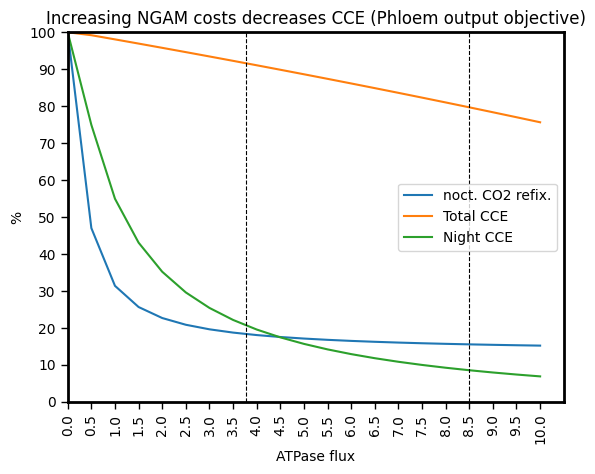

In [207]:
df = df_NGAM_phloem_scan

# Get the x-values from the plot
x_values = df.columns.astype(float)

# Find the x-value closest to set ATPase fluxes in models
ATPase_1 = 3.7651 #my value for NGAM (ATPase flux) from light intensity
ATPase_2 = 8.5 # Shameer et al., 2018 values for NGAM (ATPase flux)
closest_x1 = ATPase_1*2
closest_x2 = ATPase_2*2


# Plot the data
plt.plot(df.T["noct. CO2 coeff."]*100, label="noct. CO2 refix.")
plt.plot(df.T["CCE"]*100, label="Total CCE")
plt.plot(df.T["nighttime CCE"]*100, label="Night CCE")


# Add labels and title
plt.xlabel("ATPase flux")
plt.ylabel("%")
plt.title("Increasing NGAM costs decreases CCE (Phloem output objective)")

# Rotate x-axis labels
plt.xticks(rotation=90)

# Set y-axis limits and y-axis tick marks
plt.ylim(0, 100)
plt.yticks(range(0, 101, 10))

plt.xlim(0, len(x_values))


# Add a vertical line at mine and Shameer et al., 2018's ATPase flux value
plt.axvline(x=closest_x1, linestyle='--', color = 'black', linewidth=0.8)
plt.axvline(x=closest_x2, linestyle='--', color = 'black', linewidth=0.8)



plt.legend()

# Show the plot
plt.show()


## increasing Photon influx to test light-limitation

In [208]:
model = diel_model.copy()

df_light_scan, light_scan_sols = parameter_scan_CO2(model, output_string+"_total", "Photon_tx_00", 0, 1000, 50, pFBA=True, CO2_refixation_allowed=True, verbose=True, scan_ub_and_lb=True)

Scanning process: Photon_tx_00 

------- Scan iteration: 1      Scan value: 0 (Photon_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration is infeasible!
------- Scan iteration: 2      Scan value: 50 (Photon_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0188101
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.041089
producing HCO3-:	RXN0_5224_c_12	0.041089
producing CO2:	CO2_pc_12	0.259381
consuming CO2:	ISOCITDEH_RXN_c_12	-0.204033
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.005337
producing CO2:	GLUTDECARBOX_RXN_c_12	0.000453
producing CO2:	CO2_mc_12	0.870853
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.310314
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.041089
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.000778
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.003626
producing CO2:	RXN_9650_p_12	0.003626
producing CO2:	2.3.1.180_RXN_p_12	0.003626
producing CO2:	RXN_9654_p_12	0.003626
consuming CO2:	R

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 3      Scan value: 100 (Photon_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0553134
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.120827
producing HCO3-:	RXN0_5224_c_12	0.120827
producing CO2:	CO2_pc_12	0.356817
consuming CO2:	ISOCITDEH_RXN_c_12	-0.226183
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.015694
producing CO2:	GLUTDECARBOX_RXN_c_12	0.001332
producing CO2:	CO2_mc_12	0.872904
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.319692
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.120827
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.002287
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.010664
producing CO2:	RXN_9650_p_12	0.010664
producing CO2:	2.3.1.180_RXN_p_12	0.010664
producing CO2:	RXN_9654_p_12	0.010664
consuming CO2:	RXN0_5224_p_12	0.074646
producing HCO3-:	RXN0_5224_p_12	0.074646
consuming CO2:	CO2_pc_12	0.356817
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.074646
produci

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 4      Scan value: 150 (Photon_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0918168
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.200565
producing HCO3-:	RXN0_5224_c_12	0.200565
producing CO2:	CO2_pc_12	0.454253
consuming CO2:	ISOCITDEH_RXN_c_12	-0.248333
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.026052
producing CO2:	GLUTDECARBOX_RXN_c_12	0.002212
producing CO2:	CO2_mc_12	0.874956
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.32907
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.200565
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.003797
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.017701
producing CO2:	RXN_9650_p_12	0.017701
producing CO2:	2.3.1.180_RXN_p_12	0.017701
producing CO2:	RXN_9654_p_12	0.017701
consuming CO2:	RXN0_5224_p_12	0.123908
producing HCO3-:	RXN0_5224_p_12	0.123908
consuming CO2:	CO2_pc_12	0.454253
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.123908
producin

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 5      Scan value: 200 (Photon_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1283201
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.280304
producing HCO3-:	RXN0_5224_c_12	0.280304
producing CO2:	CO2_pc_12	0.551689
consuming CO2:	ISOCITDEH_RXN_c_12	-0.270483
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036409
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003091
producing CO2:	CO2_mc_12	0.877008
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.338447
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.280304
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005306
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024739
producing CO2:	RXN_9650_p_12	0.024739
producing CO2:	2.3.1.180_RXN_p_12	0.024739
producing CO2:	RXN_9654_p_12	0.024739
consuming CO2:	RXN0_5224_p_12	0.17317
producing HCO3-:	RXN0_5224_p_12	0.17317
consuming CO2:	CO2_pc_12	0.551689
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.17317
producing 

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 6      Scan value: 250 (Photon_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1648071
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.350348
producing HCO3-:	RXN0_5224_c_12	0.350348
producing CO2:	CO2_pc_12	0.649081
consuming CO2:	ISOCITDEH_RXN_c_12	-0.284157
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.046762
producing CO2:	GLUTDECARBOX_RXN_c_12	0.00397
producing CO2:	CO2_mc_12	0.890725
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.346221
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.350348
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.006815
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.031773
producing CO2:	RXN_9650_p_12	0.031773
producing CO2:	2.3.1.180_RXN_p_12	0.031773
producing CO2:	RXN_9654_p_12	0.031773
consuming CO2:	RXN0_5224_p_12	0.22241
producing HCO3-:	RXN0_5224_p_12	0.22241
consuming CO2:	CO2_pc_12	0.649081
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.22241
producing C

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 7      Scan value: 300 (Photon_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.201292
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.406336
producing HCO3-:	RXN0_5224_c_12	0.406336
producing CO2:	CO2_pc_12	0.746467
consuming CO2:	ISOCITDEH_RXN_c_12	-0.298586
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.057114
producing CO2:	GLUTDECARBOX_RXN_c_12	0.004849
producing CO2:	CO2_mc_12	0.907031
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.352321
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.406336
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.008324
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.038807
producing CO2:	RXN_9650_p_12	0.038807
producing CO2:	2.3.1.180_RXN_p_12	0.038807
producing CO2:	RXN_9654_p_12	0.038807
consuming CO2:	RXN0_5224_p_12	0.271647
producing HCO3-:	RXN0_5224_p_12	0.271647
consuming CO2:	CO2_pc_12	0.746467
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.271647
producin

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 8      Scan value: 350 (Photon_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.2377768
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.461923
producing HCO3-:	RXN0_5224_c_12	0.461923
producing CO2:	CO2_pc_12	0.843854
consuming CO2:	ISOCITDEH_RXN_c_12	-0.313003
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.067466
producing CO2:	GLUTDECARBOX_RXN_c_12	0.005728
producing CO2:	CO2_mc_12	0.923359
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.358416
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.461923
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.009832
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.045841
producing CO2:	RXN_9650_p_12	0.045841
producing CO2:	2.3.1.180_RXN_p_12	0.045841
producing CO2:	RXN_9654_p_12	0.045841
consuming CO2:	RXN0_5224_p_12	0.320884
producing HCO3-:	RXN0_5224_p_12	0.320884
consuming CO2:	CO2_pc_12	0.843854
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.320884
produci

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 9      Scan value: 400 (Photon_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.2742512
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.491912
producing HCO3-:	RXN0_5224_c_12	0.491912
producing CO2:	CO2_pc_12	0.937007
consuming CO2:	ISOCITDEH_RXN_c_12	-0.325705
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.077815
producing CO2:	GLUTDECARBOX_RXN_c_12	0.006607
producing CO2:	CO2_mc_12	0.942718
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.363654
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.491912
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.011341
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.052872
producing CO2:	RXN_9650_p_12	0.052872
producing CO2:	2.3.1.180_RXN_p_12	0.052872
producing CO2:	RXN_9654_p_12	0.052872
consuming CO2:	RXN0_5224_p_12	0.370107
producing HCO3-:	RXN0_5224_p_12	0.370107
consuming CO2:	CO2_pc_12	0.937007
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.370107
produci

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 10      Scan value: 450 (Photon_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.3106742
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.485398
producing HCO3-:	RXN0_5224_c_12	0.485398
producing CO2:	CO2_pc_12	1.03367
consuming CO2:	ISOCITDEH_RXN_c_12	-0.313402
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.088149
producing CO2:	GLUTDECARBOX_RXN_c_12	0.007484
producing CO2:	CO2_mc_12	0.964463
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.356391
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.485398
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.012847
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.059894
producing CO2:	RXN_9650_p_12	0.059894
producing CO2:	2.3.1.180_RXN_p_12	0.059894
producing CO2:	RXN_9654_p_12	0.059894
consuming CO2:	RXN0_5224_p_12	0.41926
producing HCO3-:	RXN0_5224_p_12	0.41926
consuming CO2:	CO2_pc_12	1.03367
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.41926
producing C

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 11      Scan value: 500 (Photon_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.3470973
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.478883
producing HCO3-:	RXN0_5224_c_12	0.478883
producing CO2:	CO2_pc_12	1.130334
consuming CO2:	ISOCITDEH_RXN_c_12	-0.301099
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.098484
producing CO2:	GLUTDECARBOX_RXN_c_12	0.008362
producing CO2:	CO2_mc_12	0.986208
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.349127
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.478883
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.014353
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.066916
producing CO2:	RXN_9650_p_12	0.066916
producing CO2:	2.3.1.180_RXN_p_12	0.066916
producing CO2:	RXN_9654_p_12	0.066916
consuming CO2:	RXN0_5224_p_12	0.468414
producing HCO3-:	RXN0_5224_p_12	0.468414
consuming CO2:	CO2_pc_12	1.130334
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.468414
produc

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 12      Scan value: 550 (Photon_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.3835203
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.472369
producing HCO3-:	RXN0_5224_c_12	0.472369
producing CO2:	CO2_pc_12	1.226997
consuming CO2:	ISOCITDEH_RXN_c_12	-0.288795
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.108818
producing CO2:	GLUTDECARBOX_RXN_c_12	0.009239
producing CO2:	CO2_mc_12	1.007953
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.341864
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.472369
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.015859
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.073938
producing CO2:	RXN_9650_p_12	0.073938
producing CO2:	2.3.1.180_RXN_p_12	0.073938
producing CO2:	RXN_9654_p_12	0.073938
consuming CO2:	RXN0_5224_p_12	0.517567
producing HCO3-:	RXN0_5224_p_12	0.517567
consuming CO2:	CO2_pc_12	1.226997
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.517567
produc

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 13      Scan value: 600 (Photon_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.4199433
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.465855
producing HCO3-:	RXN0_5224_c_12	0.465855
producing CO2:	CO2_pc_12	1.32366
consuming CO2:	ISOCITDEH_RXN_c_12	-0.276492
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.119153
producing CO2:	GLUTDECARBOX_RXN_c_12	0.010116
producing CO2:	CO2_mc_12	1.029698
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.334601
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.465855
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.017365
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.08096
producing CO2:	RXN_9650_p_12	0.08096
producing CO2:	2.3.1.180_RXN_p_12	0.08096
producing CO2:	RXN_9654_p_12	0.08096
consuming CO2:	RXN0_5224_p_12	0.566721
producing HCO3-:	RXN0_5224_p_12	0.566721
consuming CO2:	CO2_pc_12	1.32366
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.566721
producing CO

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 14      Scan value: 650 (Photon_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.4563663
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.45934
producing HCO3-:	RXN0_5224_c_12	0.45934
producing CO2:	CO2_pc_12	1.420323
consuming CO2:	ISOCITDEH_RXN_c_12	-0.264189
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.129487
producing CO2:	GLUTDECARBOX_RXN_c_12	0.010994
producing CO2:	CO2_mc_12	1.051443
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.327337
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.45934
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.018871
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.087982
producing CO2:	RXN_9650_p_12	0.087982
producing CO2:	2.3.1.180_RXN_p_12	0.087982
producing CO2:	RXN_9654_p_12	0.087982
consuming CO2:	RXN0_5224_p_12	0.615874
producing HCO3-:	RXN0_5224_p_12	0.615874
consuming CO2:	CO2_pc_12	1.420323
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.615874
producing

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 15      Scan value: 700 (Photon_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.4927894
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.452826
producing HCO3-:	RXN0_5224_c_12	0.452826
producing CO2:	CO2_pc_12	1.516986
consuming CO2:	ISOCITDEH_RXN_c_12	-0.251886
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.139822
producing CO2:	GLUTDECARBOX_RXN_c_12	0.011871
producing CO2:	CO2_mc_12	1.073188
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.320074
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.452826
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.020377
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.095004
producing CO2:	RXN_9650_p_12	0.095004
producing CO2:	2.3.1.180_RXN_p_12	0.095004
producing CO2:	RXN_9654_p_12	0.095004
consuming CO2:	RXN0_5224_p_12	0.665027
producing HCO3-:	RXN0_5224_p_12	0.665027
consuming CO2:	CO2_pc_12	1.516986
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.665027
produc

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 16      Scan value: 750 (Photon_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.5292124
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.446312
producing HCO3-:	RXN0_5224_c_12	0.446312
producing CO2:	CO2_pc_12	1.613649
consuming CO2:	ISOCITDEH_RXN_c_12	-0.239582
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.150156
producing CO2:	GLUTDECARBOX_RXN_c_12	0.012749
producing CO2:	CO2_mc_12	1.094933
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.31281
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.446312
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.021883
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.102026
producing CO2:	RXN_9650_p_12	0.102026
producing CO2:	2.3.1.180_RXN_p_12	0.102026
producing CO2:	RXN_9654_p_12	0.102026
consuming CO2:	RXN0_5224_p_12	0.714181
producing HCO3-:	RXN0_5224_p_12	0.714181
consuming CO2:	CO2_pc_12	1.613649
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.714181
produci

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 17      Scan value: 800 (Photon_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.5656354
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.439797
producing HCO3-:	RXN0_5224_c_12	0.439797
producing CO2:	CO2_pc_12	1.710312
consuming CO2:	ISOCITDEH_RXN_c_12	-0.227279
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.160491
producing CO2:	GLUTDECARBOX_RXN_c_12	0.013626
producing CO2:	CO2_mc_12	1.116678
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.305547
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.439797
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.02339
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.109048
producing CO2:	RXN_9650_p_12	0.109048
producing CO2:	2.3.1.180_RXN_p_12	0.109048
producing CO2:	RXN_9654_p_12	0.109048
consuming CO2:	RXN0_5224_p_12	0.763334
producing HCO3-:	RXN0_5224_p_12	0.763334
consuming CO2:	CO2_pc_12	1.710312
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.763334
produci

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 18      Scan value: 850 (Photon_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.6020358
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.433287
producing HCO3-:	RXN0_5224_c_12	0.433287
producing CO2:	CO2_pc_12	1.806915
consuming CO2:	ISOCITDEH_RXN_c_12	-0.214983
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.170819
producing CO2:	GLUTDECARBOX_RXN_c_12	0.014503
producing CO2:	CO2_mc_12	1.138409
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.298288
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.433287
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.024895
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.116065
producing CO2:	RXN_9650_p_12	0.116065
producing CO2:	2.3.1.180_RXN_p_12	0.116065
producing CO2:	RXN_9654_p_12	0.116065
consuming CO2:	RXN0_5224_p_12	0.812457
producing HCO3-:	RXN0_5224_p_12	0.812457
consuming CO2:	CO2_pc_12	1.806915
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.812457
produc

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 19      Scan value: 900 (Photon_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.6384231
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.426779
producing HCO3-:	RXN0_5224_c_12	0.426779
producing CO2:	CO2_pc_12	1.903483
consuming CO2:	ISOCITDEH_RXN_c_12	-0.202692
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.181143
producing CO2:	GLUTDECARBOX_RXN_c_12	0.01538
producing CO2:	CO2_mc_12	1.160133
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.291032
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.426779
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.026399
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.12308
producing CO2:	RXN_9650_p_12	0.12308
producing CO2:	2.3.1.180_RXN_p_12	0.12308
producing CO2:	RXN_9654_p_12	0.12308
consuming CO2:	RXN0_5224_p_12	0.861563
producing HCO3-:	RXN0_5224_p_12	0.861563
consuming CO2:	CO2_pc_12	1.903483
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.861563
producing C

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 20      Scan value: 950 (Photon_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.6748103
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.420271
producing HCO3-:	RXN0_5224_c_12	0.420271
producing CO2:	CO2_pc_12	2.000051
consuming CO2:	ISOCITDEH_RXN_c_12	-0.190401
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.191468
producing CO2:	GLUTDECARBOX_RXN_c_12	0.016256
producing CO2:	CO2_mc_12	1.181856
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.283776
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.420271
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.027904
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.130095
producing CO2:	RXN_9650_p_12	0.130095
producing CO2:	2.3.1.180_RXN_p_12	0.130095
producing CO2:	RXN_9654_p_12	0.130095
consuming CO2:	RXN0_5224_p_12	0.910668
producing HCO3-:	RXN0_5224_p_12	0.910668
consuming CO2:	CO2_pc_12	2.000051
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.910668
produc

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


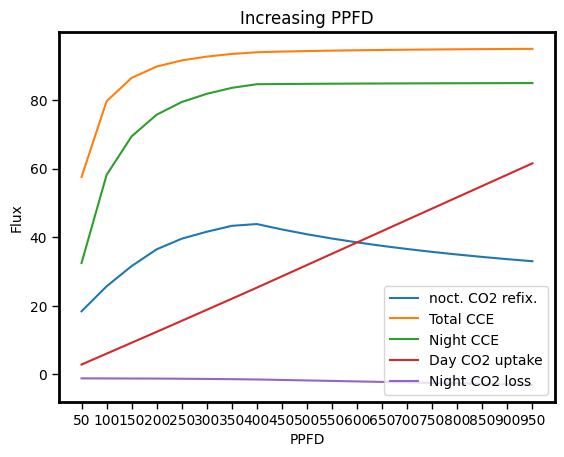

In [209]:
df = df_light_scan


# Plot the data
plt.plot(df.T["noct. CO2 coeff."]*100, label="noct. CO2 refix.")
plt.plot(df.T["CCE"]*100, label="Total CCE")
plt.plot(df.T["nighttime CCE"]*100, label="Night CCE")
plt.plot(df.T["CO2_tx_00"], label="Day CO2 uptake")
plt.plot(df.T["CO2_tx_12"], label="Night CO2 loss")


# Add labels and title
plt.xlabel("PPFD")
plt.ylabel("Flux")
plt.title("Increasing PPFD")


plt.legend()

# Show the plot
plt.show()

## limiting CO2 uptake rates

### get literature data for Arabidopsis

In [210]:
import pandas as pd
import matplotlib.pyplot as plt
# dataframe to display information for Arabidopsis CO2 assimilation rates
# Create a dictionary with sample data
data = {
    'Publication': ["Sun et al. (1999)", "Donahue et al. (1997)", "Poulson et al. (2002)", "Toquin & Périlleux (2004)", "Schlüter et al. (2003)",  "Lake (2004)", "Ivanov et al. (2012)"],
    'reported A$_{area}$': [8, 5, 9, 5, 5, 7.5, 7],
    'PPFD': [200, 200, 200, 200,  200, 200, 200],
}

# Create the dataframe
df = pd.DataFrame(data)


df


,Publication,reported A$_{area}$,PPFD
0,Sun et al. (1999),8.0,200
1,Donahue et al. (1997),5.0,200
2,Poulson et al. (2002),9.0,200
3,Toquin & Périlleux (2004),5.0,200
4,Schlüter et al. (2003),5.0,200
5,Lake (2004),7.5,200
6,Ivanov et al. (2012),7.0,200


Average value: 6.643


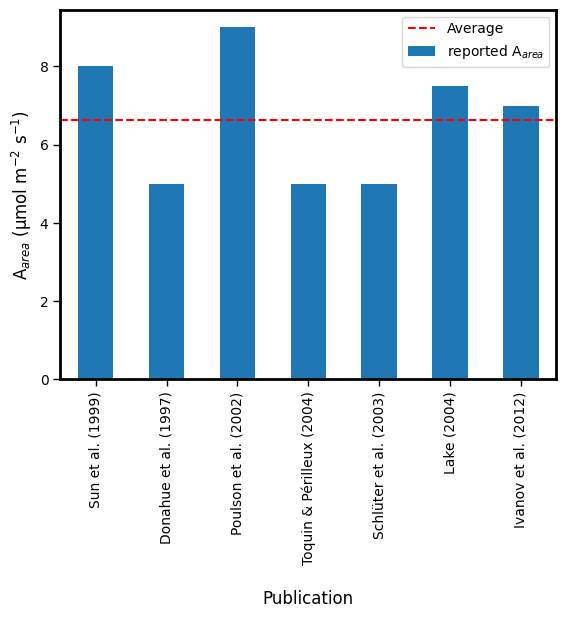

In [211]:
df.plot(kind='bar', x='Publication', y='reported A$_{area}$', rot=90)  # Rotate the x-axis labels to be vertical
plt.xlabel('Publication', labelpad=18, fontsize=12)  # Adjust the labelpad value to increase or decrease the distance
plt.ylabel('A$_{area}$ (\u00B5mol m$^{-2}$ s$^{-1}$)', fontsize=12)
# plt.title('CO$_{2}$ assimilation rates measured in Arabidopsis')

# Calculate the average and median values
average_value = df['reported A$_{area}$'].mean()
print("Average value:", round(average_value,3))
median_value = df['reported A$_{area}$'].median()

# Plot the average value
plt.axhline(average_value, color='red', linestyle='--', label='Average')

# Plot the median value in a different color
# plt.axhline(median_value, color='blue', linestyle='--', label='Median')

plt.legend()
plt.savefig("Ch1_published_A.png", dpi=300, bbox_inches='tight')
plt.show()


### scan over CO2 daytime uptake constraint (direct = CAM-cycling; indirect = C3)

In [212]:
# scan over upper limit on objective reaction (=indirect CO2 uptake limitation)

df_A1, sol_A1 = parameter_scan_CO2(diel_model, output_string+"_total", output_string+"_total", 0, 0.14, 0.005, pFBA=True, 
                    CO2_refixation_allowed=True, verbose=True, iterations=50)

Scanning process: AraCore_Biomass_tx_total 

------- Scan iteration: 1      Scan value: 0.0 (AraCore_Biomass_tx_total) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0
----- Cytosol -----
producing CO2:	CO2_pc_12	0.209172
consuming CO2:	ISOCITDEH_RXN_c_12	-0.192619
producing CO2:	CO2_mc_12	0.869795
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.305482
----- Plastid -----
consuming CO2:	CO2_pc_12	0.209172
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.209172
----- Mitochondrion -----
producing CO2:	ISOCITDEH_RXN_m_12	0.418344
producing CO2:	PYRUVDEH_RXN_m_12	0.225725
producing CO2:	2OXOGLUTARATEDEH_RXN_m_12	0.225725
consuming CO2:	CO2_mc_12	0.869795
----- Peroxisome -----

CO2 produced: 1.38445
CO2 consumed: -0.19262
CO2 exchange: -1.19183

nocturnal CO2 refixation coeffient: 0.13913


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 2      Scan value: 0.005 (AraCore_Biomass_tx_total) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.005
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.005267
producing HCO3-:	RXN0_5224_c_12	0.005267
producing CO2:	CO2_pc_12	0.222415
consuming CO2:	ISOCITDEH_RXN_c_12	-0.193597
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.001419
producing CO2:	GLUTDECARBOX_RXN_c_12	0.00012
producing CO2:	CO2_mc_12	0.87378
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.305971
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.005267
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.000964
producing CO2:	RXN_9650_p_12	0.000964
producing CO2:	2.3.1.180_RXN_p_12	0.000964
producing CO2:	RXN_9654_p_12	0.000964
consuming CO2:	RXN0_5224_p_12	0.006748
producing HCO3-:	RXN0_5224_p_12	0.006748
consuming CO2:	CO2_pc_12	0.222415
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.006748
producing CO2:	PYRUVDEH_RXN_p_12	0.008161
producing CO2:	RXN_96

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 3      Scan value: 0.01 (AraCore_Biomass_tx_total) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.01
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.010535
producing HCO3-:	RXN0_5224_c_12	0.010535
producing CO2:	CO2_pc_12	0.235658
consuming CO2:	ISOCITDEH_RXN_c_12	-0.194575
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.002837
producing CO2:	GLUTDECARBOX_RXN_c_12	0.000241
producing CO2:	CO2_mc_12	0.877764
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.306459
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.010535
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.001928
producing CO2:	RXN_9650_p_12	0.001928
producing CO2:	2.3.1.180_RXN_p_12	0.001928
producing CO2:	RXN_9654_p_12	0.001928
consuming CO2:	RXN0_5224_p_12	0.013495
producing HCO3-:	RXN0_5224_p_12	0.013495
consuming CO2:	CO2_pc_12	0.235658
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.013495
producing CO2:	PYRUVDEH_RXN_p_12	0.016322
producing CO2:	RXN_96

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 4      Scan value: 0.015 (AraCore_Biomass_tx_total) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.015
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.015802
producing HCO3-:	RXN0_5224_c_12	0.015802
producing CO2:	CO2_pc_12	0.248901
consuming CO2:	ISOCITDEH_RXN_c_12	-0.195552
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.004256
producing CO2:	GLUTDECARBOX_RXN_c_12	0.000361
producing CO2:	CO2_mc_12	0.881749
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.306948
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.015802
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.002892
producing CO2:	RXN_9650_p_12	0.002892
producing CO2:	2.3.1.180_RXN_p_12	0.002892
producing CO2:	RXN_9654_p_12	0.002892
consuming CO2:	RXN0_5224_p_12	0.020243
producing HCO3-:	RXN0_5224_p_12	0.020243
consuming CO2:	CO2_pc_12	0.248901
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.020243
producing CO2:	PYRUVDEH_RXN_p_12	0.024482
producing CO2:	RXN_

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 5      Scan value: 0.02 (AraCore_Biomass_tx_total) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.02
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.021069
producing HCO3-:	RXN0_5224_c_12	0.021069
producing CO2:	CO2_pc_12	0.262143
consuming CO2:	ISOCITDEH_RXN_c_12	-0.19653
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.005675
producing CO2:	GLUTDECARBOX_RXN_c_12	0.000482
producing CO2:	CO2_mc_12	0.885734
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.307437
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.021069
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.003856
producing CO2:	RXN_9650_p_12	0.003856
producing CO2:	2.3.1.180_RXN_p_12	0.003856
producing CO2:	RXN_9654_p_12	0.003856
consuming CO2:	RXN0_5224_p_12	0.02699
producing HCO3-:	RXN0_5224_p_12	0.02699
consuming CO2:	CO2_pc_12	0.262143
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.02699
producing CO2:	PYRUVDEH_RXN_p_12	0.032643
producing CO2:	RXN_9653_p

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 6      Scan value: 0.025 (AraCore_Biomass_tx_total) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.025
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.027741
producing HCO3-:	RXN0_5224_c_12	0.027741
producing CO2:	CO2_pc_12	0.275386
consuming CO2:	ISOCITDEH_RXN_c_12	-0.198164
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.007093
producing CO2:	GLUTDECARBOX_RXN_c_12	0.000602
producing CO2:	CO2_mc_12	0.888406
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.308254
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.027741
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.00482
producing CO2:	RXN_9650_p_12	0.00482
producing CO2:	2.3.1.180_RXN_p_12	0.00482
producing CO2:	RXN_9654_p_12	0.00482
consuming CO2:	RXN0_5224_p_12	0.033738
producing HCO3-:	RXN0_5224_p_12	0.033738
consuming CO2:	CO2_pc_12	0.275386
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.033738
producing CO2:	PYRUVDEH_RXN_p_12	0.040804
producing CO2:	RXN_9653

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 7      Scan value: 0.03 (AraCore_Biomass_tx_total) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.03
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.065532
producing HCO3-:	RXN0_5224_c_12	0.065532
producing CO2:	CO2_pc_12	0.288629
consuming CO2:	ISOCITDEH_RXN_c_12	-0.207846
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.008512
producing CO2:	GLUTDECARBOX_RXN_c_12	0.000723
producing CO2:	CO2_mc_12	0.874981
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.313095
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.065532
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.005784
producing CO2:	RXN_9650_p_12	0.005784
producing CO2:	2.3.1.180_RXN_p_12	0.005784
producing CO2:	RXN_9654_p_12	0.005784
consuming CO2:	RXN0_5224_p_12	0.040486
producing HCO3-:	RXN0_5224_p_12	0.040486
consuming CO2:	CO2_pc_12	0.288629
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.040486
producing CO2:	PYRUVDEH_RXN_p_12	0.048965
producing CO2:	RXN_96

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 8      Scan value: 0.035 (AraCore_Biomass_tx_total) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.035
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.076454
producing HCO3-:	RXN0_5224_c_12	0.076454
producing CO2:	CO2_pc_12	0.301872
consuming CO2:	ISOCITDEH_RXN_c_12	-0.211126
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.009931
producing CO2:	GLUTDECARBOX_RXN_c_12	0.000843
producing CO2:	CO2_mc_12	0.874362
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.31439
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.076454
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.006748
producing CO2:	RXN_9650_p_12	0.006748
producing CO2:	2.3.1.180_RXN_p_12	0.006748
producing CO2:	RXN_9654_p_12	0.006748
consuming CO2:	RXN0_5224_p_12	0.047233
producing HCO3-:	RXN0_5224_p_12	0.047233
consuming CO2:	CO2_pc_12	0.301872
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.047233
producing CO2:	PYRUVDEH_RXN_p_12	0.057125
producing CO2:	RXN_9

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 9      Scan value: 0.04 (AraCore_Biomass_tx_total) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.04
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.087376
producing HCO3-:	RXN0_5224_c_12	0.087376
producing CO2:	CO2_pc_12	0.315115
consuming CO2:	ISOCITDEH_RXN_c_12	-0.213769
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.011349
producing CO2:	GLUTDECARBOX_RXN_c_12	0.000964
producing CO2:	CO2_mc_12	0.875015
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.315663
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.087376
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.007712
producing CO2:	RXN_9650_p_12	0.007712
producing CO2:	2.3.1.180_RXN_p_12	0.007712
producing CO2:	RXN_9654_p_12	0.007712
consuming CO2:	RXN0_5224_p_12	0.053981
producing HCO3-:	RXN0_5224_p_12	0.053981
consuming CO2:	CO2_pc_12	0.315115
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.053981
producing CO2:	PYRUVDEH_RXN_p_12	0.065286
producing CO2:	RXN_96

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 10      Scan value: 0.045 (AraCore_Biomass_tx_total) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.045
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.098298
producing HCO3-:	RXN0_5224_c_12	0.098298
producing CO2:	CO2_pc_12	0.328357
consuming CO2:	ISOCITDEH_RXN_c_12	-0.216413
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.012768
producing CO2:	GLUTDECARBOX_RXN_c_12	0.001084
producing CO2:	CO2_mc_12	0.875667
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.316936
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.098298
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.008675
producing CO2:	RXN_9650_p_12	0.008675
producing CO2:	2.3.1.180_RXN_p_12	0.008675
producing CO2:	RXN_9654_p_12	0.008675
consuming CO2:	RXN0_5224_p_12	0.060728
producing HCO3-:	RXN0_5224_p_12	0.060728
consuming CO2:	CO2_pc_12	0.328357
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.060728
producing CO2:	PYRUVDEH_RXN_p_12	0.073447
producing CO2:	RXN

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 11      Scan value: 0.05 (AraCore_Biomass_tx_total) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.05
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.10922
producing HCO3-:	RXN0_5224_c_12	0.10922
producing CO2:	CO2_pc_12	0.3416
consuming CO2:	ISOCITDEH_RXN_c_12	-0.219057
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.014187
producing CO2:	GLUTDECARBOX_RXN_c_12	0.001204
producing CO2:	CO2_mc_12	0.87632
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.318208
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.10922
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.009639
producing CO2:	RXN_9650_p_12	0.009639
producing CO2:	2.3.1.180_RXN_p_12	0.009639
producing CO2:	RXN_9654_p_12	0.009639
consuming CO2:	RXN0_5224_p_12	0.067476
producing HCO3-:	RXN0_5224_p_12	0.067476
consuming CO2:	CO2_pc_12	0.3416
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.067476
producing CO2:	PYRUVDEH_RXN_p_12	0.081608
producing CO2:	RXN_9653_p_12

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 12      Scan value: 0.055 (AraCore_Biomass_tx_total) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.055
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.120142
producing HCO3-:	RXN0_5224_c_12	0.120142
producing CO2:	CO2_pc_12	0.354843
consuming CO2:	ISOCITDEH_RXN_c_12	-0.221701
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.015605
producing CO2:	GLUTDECARBOX_RXN_c_12	0.001325
producing CO2:	CO2_mc_12	0.876972
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.319481
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.120142
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.010603
producing CO2:	RXN_9650_p_12	0.010603
producing CO2:	2.3.1.180_RXN_p_12	0.010603
producing CO2:	RXN_9654_p_12	0.010603
consuming CO2:	RXN0_5224_p_12	0.074223
producing HCO3-:	RXN0_5224_p_12	0.074223
consuming CO2:	CO2_pc_12	0.354843
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.074223
producing CO2:	PYRUVDEH_RXN_p_12	0.089769
producing CO2:	RXN

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 13      Scan value: 0.06 (AraCore_Biomass_tx_total) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.06
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.131064
producing HCO3-:	RXN0_5224_c_12	0.131064
producing CO2:	CO2_pc_12	0.368086
consuming CO2:	ISOCITDEH_RXN_c_12	-0.224345
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.017024
producing CO2:	GLUTDECARBOX_RXN_c_12	0.001445
producing CO2:	CO2_mc_12	0.877625
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.320754
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.131064
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.011567
producing CO2:	RXN_9650_p_12	0.011567
producing CO2:	2.3.1.180_RXN_p_12	0.011567
producing CO2:	RXN_9654_p_12	0.011567
consuming CO2:	RXN0_5224_p_12	0.080971
producing HCO3-:	RXN0_5224_p_12	0.080971
consuming CO2:	CO2_pc_12	0.368086
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.080971
producing CO2:	PYRUVDEH_RXN_p_12	0.097929
producing CO2:	RXN_9

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 14      Scan value: 0.065 (AraCore_Biomass_tx_total) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.065
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.141987
producing HCO3-:	RXN0_5224_c_12	0.141987
producing CO2:	CO2_pc_12	0.381328
consuming CO2:	ISOCITDEH_RXN_c_12	-0.226988
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.018443
producing CO2:	GLUTDECARBOX_RXN_c_12	0.001566
producing CO2:	CO2_mc_12	0.878277
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.322026
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.141987
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.012531
producing CO2:	RXN_9650_p_12	0.012531
producing CO2:	2.3.1.180_RXN_p_12	0.012531
producing CO2:	RXN_9654_p_12	0.012531
consuming CO2:	RXN0_5224_p_12	0.087719
producing HCO3-:	RXN0_5224_p_12	0.087719
consuming CO2:	CO2_pc_12	0.381328
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.087719
producing CO2:	PYRUVDEH_RXN_p_12	0.10609
producing CO2:	RXN_

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 15      Scan value: 0.07 (AraCore_Biomass_tx_total) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.07
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.152909
producing HCO3-:	RXN0_5224_c_12	0.152909
producing CO2:	CO2_pc_12	0.394571
consuming CO2:	ISOCITDEH_RXN_c_12	-0.229632
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.019861
producing CO2:	GLUTDECARBOX_RXN_c_12	0.001686
producing CO2:	CO2_mc_12	0.87893
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.323299
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.152909
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.013495
producing CO2:	RXN_9650_p_12	0.013495
producing CO2:	2.3.1.180_RXN_p_12	0.013495
producing CO2:	RXN_9654_p_12	0.013495
consuming CO2:	RXN0_5224_p_12	0.094466
producing HCO3-:	RXN0_5224_p_12	0.094466
consuming CO2:	CO2_pc_12	0.394571
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.094466
producing CO2:	PYRUVDEH_RXN_p_12	0.114251
producing CO2:	RXN_96

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 16      Scan value: 0.075 (AraCore_Biomass_tx_total) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.075
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.163831
producing HCO3-:	RXN0_5224_c_12	0.163831
producing CO2:	CO2_pc_12	0.407814
consuming CO2:	ISOCITDEH_RXN_c_12	-0.232276
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.02128
producing CO2:	GLUTDECARBOX_RXN_c_12	0.001807
producing CO2:	CO2_mc_12	0.879582
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.324572
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.163831
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.014459
producing CO2:	RXN_9650_p_12	0.014459
producing CO2:	2.3.1.180_RXN_p_12	0.014459
producing CO2:	RXN_9654_p_12	0.014459
consuming CO2:	RXN0_5224_p_12	0.101214
producing HCO3-:	RXN0_5224_p_12	0.101214
consuming CO2:	CO2_pc_12	0.407814
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.101214
producing CO2:	PYRUVDEH_RXN_p_12	0.122412
producing CO2:	RXN_

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 17      Scan value: 0.08 (AraCore_Biomass_tx_total) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.08
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.174753
producing HCO3-:	RXN0_5224_c_12	0.174753
producing CO2:	CO2_pc_12	0.421057
consuming CO2:	ISOCITDEH_RXN_c_12	-0.23492
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.022699
producing CO2:	GLUTDECARBOX_RXN_c_12	0.001927
producing CO2:	CO2_mc_12	0.880234
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.325844
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.174753
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.015423
producing CO2:	RXN_9650_p_12	0.015423
producing CO2:	2.3.1.180_RXN_p_12	0.015423
producing CO2:	RXN_9654_p_12	0.015423
consuming CO2:	RXN0_5224_p_12	0.107961
producing HCO3-:	RXN0_5224_p_12	0.107961
consuming CO2:	CO2_pc_12	0.421057
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.107961
producing CO2:	PYRUVDEH_RXN_p_12	0.130572
producing CO2:	RXN_96

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 18      Scan value: 0.085 (AraCore_Biomass_tx_total) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.085
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.185675
producing HCO3-:	RXN0_5224_c_12	0.185675
producing CO2:	CO2_pc_12	0.4343
consuming CO2:	ISOCITDEH_RXN_c_12	-0.237564
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.024118
producing CO2:	GLUTDECARBOX_RXN_c_12	0.002048
producing CO2:	CO2_mc_12	0.880887
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.327117
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.185675
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.016387
producing CO2:	RXN_9650_p_12	0.016387
producing CO2:	2.3.1.180_RXN_p_12	0.016387
producing CO2:	RXN_9654_p_12	0.016387
consuming CO2:	RXN0_5224_p_12	0.114709
producing HCO3-:	RXN0_5224_p_12	0.114709
consuming CO2:	CO2_pc_12	0.4343
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.114709
producing CO2:	PYRUVDEH_RXN_p_12	0.138733
producing CO2:	RXN_965

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 19      Scan value: 0.09 (AraCore_Biomass_tx_total) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.09
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.196597
producing HCO3-:	RXN0_5224_c_12	0.196597
producing CO2:	CO2_pc_12	0.447542
consuming CO2:	ISOCITDEH_RXN_c_12	-0.240207
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.025536
producing CO2:	GLUTDECARBOX_RXN_c_12	0.002168
producing CO2:	CO2_mc_12	0.881539
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.32839
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.196597
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.017351
producing CO2:	RXN_9650_p_12	0.017351
producing CO2:	2.3.1.180_RXN_p_12	0.017351
producing CO2:	RXN_9654_p_12	0.017351
consuming CO2:	RXN0_5224_p_12	0.121457
producing HCO3-:	RXN0_5224_p_12	0.121457
consuming CO2:	CO2_pc_12	0.447542
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.121457
producing CO2:	PYRUVDEH_RXN_p_12	0.146894
producing CO2:	RXN_96

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 20      Scan value: 0.095 (AraCore_Biomass_tx_total) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.095
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.207519
producing HCO3-:	RXN0_5224_c_12	0.207519
producing CO2:	CO2_pc_12	0.460785
consuming CO2:	ISOCITDEH_RXN_c_12	-0.242851
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.026955
producing CO2:	GLUTDECARBOX_RXN_c_12	0.002289
producing CO2:	CO2_mc_12	0.882192
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.329662
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.207519
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.018315
producing CO2:	RXN_9650_p_12	0.018315
producing CO2:	2.3.1.180_RXN_p_12	0.018315
producing CO2:	RXN_9654_p_12	0.018315
consuming CO2:	RXN0_5224_p_12	0.128204
producing HCO3-:	RXN0_5224_p_12	0.128204
consuming CO2:	CO2_pc_12	0.460785
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.128204
producing CO2:	PYRUVDEH_RXN_p_12	0.155055
producing CO2:	RXN

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 21      Scan value: 0.1 (AraCore_Biomass_tx_total) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.218441
producing HCO3-:	RXN0_5224_c_12	0.218441
producing CO2:	CO2_pc_12	0.474028
consuming CO2:	ISOCITDEH_RXN_c_12	-0.245495
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.028374
producing CO2:	GLUTDECARBOX_RXN_c_12	0.002409
producing CO2:	CO2_mc_12	0.882844
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.330935
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.218441
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.019279
producing CO2:	RXN_9650_p_12	0.019279
producing CO2:	2.3.1.180_RXN_p_12	0.019279
producing CO2:	RXN_9654_p_12	0.019279
consuming CO2:	RXN0_5224_p_12	0.134952
producing HCO3-:	RXN0_5224_p_12	0.134952
consuming CO2:	CO2_pc_12	0.474028
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.134952
producing CO2:	PYRUVDEH_RXN_p_12	0.163216
producing CO2:	RXN_965

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 22      Scan value: 0.105 (AraCore_Biomass_tx_total) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.105
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.229363
producing HCO3-:	RXN0_5224_c_12	0.229363
producing CO2:	CO2_pc_12	0.487271
consuming CO2:	ISOCITDEH_RXN_c_12	-0.248139
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.029792
producing CO2:	GLUTDECARBOX_RXN_c_12	0.002529
producing CO2:	CO2_mc_12	0.883497
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.332208
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.229363
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.020243
producing CO2:	RXN_9650_p_12	0.020243
producing CO2:	2.3.1.180_RXN_p_12	0.020243
producing CO2:	RXN_9654_p_12	0.020243
consuming CO2:	RXN0_5224_p_12	0.141699
producing HCO3-:	RXN0_5224_p_12	0.141699
consuming CO2:	CO2_pc_12	0.487271
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.141699
producing CO2:	PYRUVDEH_RXN_p_12	0.171376
producing CO2:	RXN

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 23      Scan value: 0.11 (AraCore_Biomass_tx_total) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.11
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.234984
producing HCO3-:	RXN0_5224_c_12	0.234984
producing CO2:	CO2_pc_12	0.500514
consuming CO2:	ISOCITDEH_RXN_c_12	-0.250619
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.031211
producing CO2:	GLUTDECARBOX_RXN_c_12	0.00265
producing CO2:	CO2_mc_12	0.884476
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.333399
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.234984
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.021207
producing CO2:	RXN_9650_p_12	0.021207
producing CO2:	2.3.1.180_RXN_p_12	0.021207
producing CO2:	RXN_9654_p_12	0.021207
consuming CO2:	RXN0_5224_p_12	0.148447
producing HCO3-:	RXN0_5224_p_12	0.148447
consuming CO2:	CO2_pc_12	0.500514
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.148447
producing CO2:	PYRUVDEH_RXN_p_12	0.179537
producing CO2:	RXN_96

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 24      Scan value: 0.115 (AraCore_Biomass_tx_total) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.115
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.245666
producing HCO3-:	RXN0_5224_c_12	0.245666
producing CO2:	CO2_pc_12	0.513756
consuming CO2:	ISOCITDEH_RXN_c_12	-0.253255
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.03263
producing CO2:	GLUTDECARBOX_RXN_c_12	0.00277
producing CO2:	CO2_mc_12	0.885143
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.334668
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.245666
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.022171
producing CO2:	RXN_9650_p_12	0.022171
producing CO2:	2.3.1.180_RXN_p_12	0.022171
producing CO2:	RXN_9654_p_12	0.022171
consuming CO2:	RXN0_5224_p_12	0.155194
producing HCO3-:	RXN0_5224_p_12	0.155194
consuming CO2:	CO2_pc_12	0.513756
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.155194
producing CO2:	PYRUVDEH_RXN_p_12	0.187698
producing CO2:	RXN_9

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 25      Scan value: 0.12 (AraCore_Biomass_tx_total) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.12
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.256347
producing HCO3-:	RXN0_5224_c_12	0.256347
producing CO2:	CO2_pc_12	0.526999
consuming CO2:	ISOCITDEH_RXN_c_12	-0.255892
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.034048
producing CO2:	GLUTDECARBOX_RXN_c_12	0.002891
producing CO2:	CO2_mc_12	0.885811
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.335936
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.256347
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.023135
producing CO2:	RXN_9650_p_12	0.023135
producing CO2:	2.3.1.180_RXN_p_12	0.023135
producing CO2:	RXN_9654_p_12	0.023135
consuming CO2:	RXN0_5224_p_12	0.161942
producing HCO3-:	RXN0_5224_p_12	0.161942
consuming CO2:	CO2_pc_12	0.526999
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.161942
producing CO2:	PYRUVDEH_RXN_p_12	0.195859
producing CO2:	RXN_9

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 26      Scan value: 0.125 (AraCore_Biomass_tx_total) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.125
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.267028
producing HCO3-:	RXN0_5224_c_12	0.267028
producing CO2:	CO2_pc_12	0.540242
consuming CO2:	ISOCITDEH_RXN_c_12	-0.258528
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.035467
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003011
producing CO2:	CO2_mc_12	0.886478
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.337205
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.267028
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024099
producing CO2:	RXN_9650_p_12	0.024099
producing CO2:	2.3.1.180_RXN_p_12	0.024099
producing CO2:	RXN_9654_p_12	0.024099
consuming CO2:	RXN0_5224_p_12	0.16869
producing HCO3-:	RXN0_5224_p_12	0.16869
consuming CO2:	CO2_pc_12	0.540242
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.16869
producing CO2:	PYRUVDEH_RXN_p_12	0.204019
producing CO2:	RXN_96

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 27      Scan value: 0.13 (AraCore_Biomass_tx_total) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1283201
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.280304
producing HCO3-:	RXN0_5224_c_12	0.280304
producing CO2:	CO2_pc_12	0.551689
consuming CO2:	ISOCITDEH_RXN_c_12	-0.270483
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036409
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003091
producing CO2:	CO2_mc_12	0.877008
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.338447
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.280304
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005306
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024739
producing CO2:	RXN_9650_p_12	0.024739
producing CO2:	2.3.1.180_RXN_p_12	0.024739
producing CO2:	RXN_9654_p_12	0.024739
consuming CO2:	RXN0_5224_p_12	0.17317
producing HCO3-:	RXN0_5224_p_12	0.17317
consuming CO2:	CO2_pc_12	0.551689
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.17

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 28      Scan value: 0.135 (AraCore_Biomass_tx_total) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1283201
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.280304
producing HCO3-:	RXN0_5224_c_12	0.280304
producing CO2:	CO2_pc_12	0.551689
consuming CO2:	ISOCITDEH_RXN_c_12	-0.270483
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036409
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003091
producing CO2:	CO2_mc_12	0.877008
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.338447
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.280304
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005306
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024739
producing CO2:	RXN_9650_p_12	0.024739
producing CO2:	2.3.1.180_RXN_p_12	0.024739
producing CO2:	RXN_9654_p_12	0.024739
consuming CO2:	RXN0_5224_p_12	0.17317
producing HCO3-:	RXN0_5224_p_12	0.17317
consuming CO2:	CO2_pc_12	0.551689
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.1

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 29      Scan value: 0.14 (AraCore_Biomass_tx_total) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1283201
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.280304
producing HCO3-:	RXN0_5224_c_12	0.280304
producing CO2:	CO2_pc_12	0.551689
consuming CO2:	ISOCITDEH_RXN_c_12	-0.270483
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036409
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003091
producing CO2:	CO2_mc_12	0.877008
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.338447
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.280304
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005306
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024739
producing CO2:	RXN_9650_p_12	0.024739
producing CO2:	2.3.1.180_RXN_p_12	0.024739
producing CO2:	RXN_9654_p_12	0.024739
consuming CO2:	RXN0_5224_p_12	0.17317
producing HCO3-:	RXN0_5224_p_12	0.17317
consuming CO2:	CO2_pc_12	0.551689
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.17

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


In [213]:
# scan over upper limit on CO2 uptake, without any CAM constraints

df_B1, sol_B1 = parameter_scan_CO2(diel_model, output_string+"_total", "CO2_tx"+day_tag, 0, 15.1, 0.25, pFBA=True, 
                    CO2_refixation_allowed=True, verbose=True, iterations=50)

Scanning process: CO2_tx_00 

------- Scan iteration: 1      Scan value: 0.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: -0.0
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	1.20274
producing HCO3-:	RXN0_5224_c_12	1.20274
producing CO2:	CO2_pc_12	0.209172
consuming CO2:	ISOCITDEH_RXN_c_12	-0.418344
producing CO2:	CO2_mc_12	0.993568
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.418344
consuming HCO3-:	PEPCARBOX_RXN_c_12	1.20274
----- Plastid -----
consuming CO2:	CO2_pc_12	0.209172
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.209172
----- Mitochondrion -----
producing CO2:	ISOCITDEH_RXN_m_12	0.418344
producing CO2:	PYRUVDEH_RXN_m_12	0.575224
consuming CO2:	CO2_mc_12	0.993568
----- Peroxisome -----

CO2 produced: 1.62108
CO2 consumed: -1.62108
CO2 exchange: 0.0

nocturnal CO2 refixation coeffient: 1.0


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 2      Scan value: 0.25 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0028853
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	1.212841
producing HCO3-:	RXN0_5224_c_12	1.212841
producing CO2:	CO2_pc_12	0.216157
consuming CO2:	ISOCITDEH_RXN_c_12	-0.417322
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.000819
producing CO2:	GLUTDECARBOX_RXN_c_12	7e-05
producing CO2:	CO2_mc_12	0.9953
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.417699
consuming HCO3-:	PEPCARBOX_RXN_c_12	1.212841
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.000119
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.000185
producing CO2:	RXN_9652_p_12	0.000556
producing CO2:	RXN_9650_p_12	0.000556
producing CO2:	2.3.1.180_RXN_p_12	0.000556
producing CO2:	RXN_9654_p_12	0.000556
consuming CO2:	RXN0_5224_p_12	0.003894
producing HCO3-:	RXN0_5224_p_12	0.003894
consuming CO2:	CO2_pc_12	0.216157
producing CO2:	1.2.1.2_RXN_

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 3      Scan value: 0.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0057706
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	1.222943
producing HCO3-:	RXN0_5224_c_12	1.222943
producing CO2:	CO2_pc_12	0.223141
consuming CO2:	ISOCITDEH_RXN_c_12	-0.416299
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.001637
producing CO2:	GLUTDECARBOX_RXN_c_12	0.000139
producing CO2:	CO2_mc_12	0.997032
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.417054
consuming HCO3-:	PEPCARBOX_RXN_c_12	1.222943
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.000239
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.00037
producing CO2:	RXN_9652_p_12	0.001112
producing CO2:	RXN_9650_p_12	0.001112
producing CO2:	2.3.1.180_RXN_p_12	0.001112
producing CO2:	RXN_9654_p_12	0.001112
consuming CO2:	RXN0_5224_p_12	0.007787
producing HCO3-:	RXN0_5224_p_12	0.007787
consuming CO2:	CO2_pc_12	0.223141
producing CO2:	1.2.1.2_R

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 4      Scan value: 0.75 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0086559
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	1.233044
producing HCO3-:	RXN0_5224_c_12	1.233044
producing CO2:	CO2_pc_12	0.230125
consuming CO2:	ISOCITDEH_RXN_c_12	-0.415277
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.002456
producing CO2:	GLUTDECARBOX_RXN_c_12	0.000209
producing CO2:	CO2_mc_12	0.998765
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.416408
consuming HCO3-:	PEPCARBOX_RXN_c_12	1.233044
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.000358
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.000555
producing CO2:	RXN_9652_p_12	0.001669
producing CO2:	RXN_9650_p_12	0.001669
producing CO2:	2.3.1.180_RXN_p_12	0.001669
producing CO2:	RXN_9654_p_12	0.001669
consuming CO2:	RXN0_5224_p_12	0.011681
producing HCO3-:	RXN0_5224_p_12	0.011681
consuming CO2:	CO2_pc_12	0.230125
producing CO2:	1.2.1.2

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 5      Scan value: 1.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0115412
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	1.243145
producing HCO3-:	RXN0_5224_c_12	1.243145
producing CO2:	CO2_pc_12	0.23711
consuming CO2:	ISOCITDEH_RXN_c_12	-0.414254
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.003275
producing CO2:	GLUTDECARBOX_RXN_c_12	0.000278
producing CO2:	CO2_mc_12	1.000497
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.415763
consuming HCO3-:	PEPCARBOX_RXN_c_12	1.243145
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.000477
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.00074
producing CO2:	RXN_9652_p_12	0.002225
producing CO2:	RXN_9650_p_12	0.002225
producing CO2:	2.3.1.180_RXN_p_12	0.002225
producing CO2:	RXN_9654_p_12	0.002225
consuming CO2:	RXN0_5224_p_12	0.015575
producing HCO3-:	RXN0_5224_p_12	0.015575
consuming CO2:	CO2_pc_12	0.23711
producing CO2:	1.2.1.2_RXN

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 6      Scan value: 1.25 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0144264
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	1.253246
producing HCO3-:	RXN0_5224_c_12	1.253246
producing CO2:	CO2_pc_12	0.243633
consuming CO2:	ISOCITDEH_RXN_c_12	-0.413232
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.004093
producing CO2:	GLUTDECARBOX_RXN_c_12	0.000348
producing CO2:	CO2_mc_12	1.00269
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.415117
consuming HCO3-:	PEPCARBOX_RXN_c_12	1.253246
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.000597
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.000925
producing CO2:	RXN_9652_p_12	0.002781
producing CO2:	RXN_9650_p_12	0.002781
producing CO2:	2.3.1.180_RXN_p_12	0.002781
producing CO2:	RXN_9654_p_12	0.002781
consuming CO2:	RXN0_5224_p_12	0.019469
producing HCO3-:	RXN0_5224_p_12	0.019469
consuming CO2:	CO2_pc_12	0.243633
consuming HCO3-:	ACETYL

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 7      Scan value: 1.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0173117
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	1.263347
producing HCO3-:	RXN0_5224_c_12	1.263347
producing CO2:	CO2_pc_12	0.250526
consuming CO2:	ISOCITDEH_RXN_c_12	-0.412209
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.004912
producing CO2:	GLUTDECARBOX_RXN_c_12	0.000417
producing CO2:	CO2_mc_12	1.004514
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.414472
consuming HCO3-:	PEPCARBOX_RXN_c_12	1.263347
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.000716
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.00111
producing CO2:	RXN_9652_p_12	0.003337
producing CO2:	RXN_9650_p_12	0.003337
producing CO2:	2.3.1.180_RXN_p_12	0.003337
producing CO2:	RXN_9654_p_12	0.003337
consuming CO2:	RXN0_5224_p_12	0.023362
producing HCO3-:	RXN0_5224_p_12	0.023362
consuming CO2:	CO2_pc_12	0.250526
consuming HCO3-:	ACETYL_

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 8      Scan value: 1.75 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.020197
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	1.273448
producing HCO3-:	RXN0_5224_c_12	1.273448
producing CO2:	CO2_pc_12	0.257418
consuming CO2:	ISOCITDEH_RXN_c_12	-0.411187
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.005731
producing CO2:	GLUTDECARBOX_RXN_c_12	0.000487
producing CO2:	CO2_mc_12	1.006339
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.413826
consuming HCO3-:	PEPCARBOX_RXN_c_12	1.273448
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.000835
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.001295
producing CO2:	RXN_9652_p_12	0.003894
producing CO2:	RXN_9650_p_12	0.003894
producing CO2:	2.3.1.180_RXN_p_12	0.003894
producing CO2:	RXN_9654_p_12	0.003894
consuming CO2:	RXN0_5224_p_12	0.027256
producing HCO3-:	RXN0_5224_p_12	0.027256
consuming CO2:	CO2_pc_12	0.257418
consuming HCO3-:	ACETYL

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 9      Scan value: 2.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0230823
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	1.28355
producing HCO3-:	RXN0_5224_c_12	1.28355
producing CO2:	CO2_pc_12	0.26431
consuming CO2:	ISOCITDEH_RXN_c_12	-0.410164
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.006549
producing CO2:	GLUTDECARBOX_RXN_c_12	0.000556
producing CO2:	CO2_mc_12	1.008163
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.413181
consuming HCO3-:	PEPCARBOX_RXN_c_12	1.28355
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.000954
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.00148
producing CO2:	RXN_9652_p_12	0.00445
producing CO2:	RXN_9650_p_12	0.00445
producing CO2:	2.3.1.180_RXN_p_12	0.00445
producing CO2:	RXN_9654_p_12	0.00445
consuming CO2:	RXN0_5224_p_12	0.03115
producing HCO3-:	RXN0_5224_p_12	0.03115
consuming CO2:	CO2_pc_12	0.26431
consuming HCO3-:	ACETYL_COA_CARBOXY

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 10      Scan value: 2.25 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0259676
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	1.293651
producing HCO3-:	RXN0_5224_c_12	1.293651
producing CO2:	CO2_pc_12	0.271202
consuming CO2:	ISOCITDEH_RXN_c_12	-0.409141
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.007368
producing CO2:	GLUTDECARBOX_RXN_c_12	0.000626
producing CO2:	CO2_mc_12	1.009987
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.412536
consuming HCO3-:	PEPCARBOX_RXN_c_12	1.293651
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.001074
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.001665
producing CO2:	RXN_9652_p_12	0.005006
producing CO2:	RXN_9650_p_12	0.005006
producing CO2:	2.3.1.180_RXN_p_12	0.005006
producing CO2:	RXN_9654_p_12	0.005006
consuming CO2:	RXN0_5224_p_12	0.035044
producing HCO3-:	RXN0_5224_p_12	0.035044
consuming CO2:	CO2_pc_12	0.271202
consuming HCO3-:	ACET

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 11      Scan value: 2.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0288529
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	1.303752
producing HCO3-:	RXN0_5224_c_12	1.303752
producing CO2:	CO2_pc_12	0.278094
consuming CO2:	ISOCITDEH_RXN_c_12	-0.408119
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.008187
producing CO2:	GLUTDECARBOX_RXN_c_12	0.000695
producing CO2:	CO2_mc_12	1.011812
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.41189
consuming HCO3-:	PEPCARBOX_RXN_c_12	1.303752
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.001193
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.00185
producing CO2:	RXN_9652_p_12	0.005562
producing CO2:	RXN_9650_p_12	0.005562
producing CO2:	2.3.1.180_RXN_p_12	0.005562
producing CO2:	RXN_9654_p_12	0.005562
consuming CO2:	RXN0_5224_p_12	0.038937
producing HCO3-:	RXN0_5224_p_12	0.038937
consuming CO2:	CO2_pc_12	0.278094
consuming HCO3-:	ACETYL_

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 12      Scan value: 2.75 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0317382
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	1.313853
producing HCO3-:	RXN0_5224_c_12	1.313853
producing CO2:	CO2_pc_12	0.284987
consuming CO2:	ISOCITDEH_RXN_c_12	-0.407096
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.009005
producing CO2:	GLUTDECARBOX_RXN_c_12	0.000765
producing CO2:	CO2_mc_12	1.013636
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.411245
consuming HCO3-:	PEPCARBOX_RXN_c_12	1.313853
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.001312
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.002035
producing CO2:	RXN_9652_p_12	0.006119
producing CO2:	RXN_9650_p_12	0.006119
producing CO2:	2.3.1.180_RXN_p_12	0.006119
producing CO2:	RXN_9654_p_12	0.006119
consuming CO2:	RXN0_5224_p_12	0.042831
producing HCO3-:	RXN0_5224_p_12	0.042831
consuming CO2:	CO2_pc_12	0.284987
consuming HCO3-:	ACET

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 13      Scan value: 3.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0346235
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	1.323954
producing HCO3-:	RXN0_5224_c_12	1.323954
producing CO2:	CO2_pc_12	0.291879
consuming CO2:	ISOCITDEH_RXN_c_12	-0.406074
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.009824
producing CO2:	GLUTDECARBOX_RXN_c_12	0.000834
producing CO2:	CO2_mc_12	1.01546
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.410599
consuming HCO3-:	PEPCARBOX_RXN_c_12	1.323954
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.001432
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.00222
producing CO2:	RXN_9652_p_12	0.006675
producing CO2:	RXN_9650_p_12	0.006675
producing CO2:	2.3.1.180_RXN_p_12	0.006675
producing CO2:	RXN_9654_p_12	0.006675
consuming CO2:	RXN0_5224_p_12	0.046725
producing HCO3-:	RXN0_5224_p_12	0.046725
consuming CO2:	CO2_pc_12	0.291879
consuming HCO3-:	ACETYL_

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 14      Scan value: 3.25 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0375088
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	1.334056
producing HCO3-:	RXN0_5224_c_12	1.334056
producing CO2:	CO2_pc_12	0.298771
consuming CO2:	ISOCITDEH_RXN_c_12	-0.405051
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.010643
producing CO2:	GLUTDECARBOX_RXN_c_12	0.000904
producing CO2:	CO2_mc_12	1.017285
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.409954
consuming HCO3-:	PEPCARBOX_RXN_c_12	1.334056
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.001551
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.002405
producing CO2:	RXN_9652_p_12	0.007231
producing CO2:	RXN_9650_p_12	0.007231
producing CO2:	2.3.1.180_RXN_p_12	0.007231
producing CO2:	RXN_9654_p_12	0.007231
consuming CO2:	RXN0_5224_p_12	0.050619
producing HCO3-:	RXN0_5224_p_12	0.050619
consuming CO2:	CO2_pc_12	0.298771
consuming HCO3-:	ACET

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 15      Scan value: 3.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0403941
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	1.344157
producing HCO3-:	RXN0_5224_c_12	1.344157
producing CO2:	CO2_pc_12	0.305663
consuming CO2:	ISOCITDEH_RXN_c_12	-0.404029
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.011461
producing CO2:	GLUTDECARBOX_RXN_c_12	0.000973
producing CO2:	CO2_mc_12	1.019109
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.409308
consuming HCO3-:	PEPCARBOX_RXN_c_12	1.344157
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.00167
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.00259
producing CO2:	RXN_9652_p_12	0.007787
producing CO2:	RXN_9650_p_12	0.007787
producing CO2:	2.3.1.180_RXN_p_12	0.007787
producing CO2:	RXN_9654_p_12	0.007787
consuming CO2:	RXN0_5224_p_12	0.054512
producing HCO3-:	RXN0_5224_p_12	0.054512
consuming CO2:	CO2_pc_12	0.305663
consuming HCO3-:	ACETYL_

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 16      Scan value: 3.75 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0432793
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	1.354258
producing HCO3-:	RXN0_5224_c_12	1.354258
producing CO2:	CO2_pc_12	0.312555
consuming CO2:	ISOCITDEH_RXN_c_12	-0.403006
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.01228
producing CO2:	GLUTDECARBOX_RXN_c_12	0.001043
producing CO2:	CO2_mc_12	1.020933
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.408663
consuming HCO3-:	PEPCARBOX_RXN_c_12	1.354258
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.00179
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.002775
producing CO2:	RXN_9652_p_12	0.008344
producing CO2:	RXN_9650_p_12	0.008344
producing CO2:	2.3.1.180_RXN_p_12	0.008344
producing CO2:	RXN_9654_p_12	0.008344
consuming CO2:	RXN0_5224_p_12	0.058406
producing HCO3-:	RXN0_5224_p_12	0.058406
consuming CO2:	CO2_pc_12	0.312555
consuming HCO3-:	ACETYL

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 17      Scan value: 4.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0461646
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	1.364359
producing HCO3-:	RXN0_5224_c_12	1.364359
producing CO2:	CO2_pc_12	0.319448
consuming CO2:	ISOCITDEH_RXN_c_12	-0.401984
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.013099
producing CO2:	GLUTDECARBOX_RXN_c_12	0.001112
producing CO2:	CO2_mc_12	1.022758
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.408018
consuming HCO3-:	PEPCARBOX_RXN_c_12	1.364359
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.001909
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.00296
producing CO2:	RXN_9652_p_12	0.0089
producing CO2:	RXN_9650_p_12	0.0089
producing CO2:	2.3.1.180_RXN_p_12	0.0089
producing CO2:	RXN_9654_p_12	0.0089
consuming CO2:	RXN0_5224_p_12	0.0623
producing HCO3-:	RXN0_5224_p_12	0.0623
consuming CO2:	CO2_pc_12	0.319448
consuming HCO3-:	ACETYL_COA_CARBOXY

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 18      Scan value: 4.25 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0490499
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	1.37446
producing HCO3-:	RXN0_5224_c_12	1.37446
producing CO2:	CO2_pc_12	0.32634
consuming CO2:	ISOCITDEH_RXN_c_12	-0.400961
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.013917
producing CO2:	GLUTDECARBOX_RXN_c_12	0.001182
producing CO2:	CO2_mc_12	1.024582
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.407372
consuming HCO3-:	PEPCARBOX_RXN_c_12	1.37446
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.002028
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.003145
producing CO2:	RXN_9652_p_12	0.009456
producing CO2:	RXN_9650_p_12	0.009456
producing CO2:	2.3.1.180_RXN_p_12	0.009456
producing CO2:	RXN_9654_p_12	0.009456
consuming CO2:	RXN0_5224_p_12	0.066194
producing HCO3-:	RXN0_5224_p_12	0.066194
consuming CO2:	CO2_pc_12	0.32634
consuming HCO3-:	ACETYL_CO

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 19      Scan value: 4.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0519352
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	1.384561
producing HCO3-:	RXN0_5224_c_12	1.384561
producing CO2:	CO2_pc_12	0.333232
consuming CO2:	ISOCITDEH_RXN_c_12	-0.399938
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.014736
producing CO2:	GLUTDECARBOX_RXN_c_12	0.001251
producing CO2:	CO2_mc_12	1.026407
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.406727
consuming HCO3-:	PEPCARBOX_RXN_c_12	1.384561
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.002148
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.00333
producing CO2:	RXN_9652_p_12	0.010012
producing CO2:	RXN_9650_p_12	0.010012
producing CO2:	2.3.1.180_RXN_p_12	0.010012
producing CO2:	RXN_9654_p_12	0.010012
consuming CO2:	RXN0_5224_p_12	0.070087
producing HCO3-:	RXN0_5224_p_12	0.070087
consuming CO2:	CO2_pc_12	0.333232
consuming HCO3-:	ACETYL

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 20      Scan value: 4.75 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0548205
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	1.394663
producing HCO3-:	RXN0_5224_c_12	1.394663
producing CO2:	CO2_pc_12	0.340124
consuming CO2:	ISOCITDEH_RXN_c_12	-0.398916
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.015555
producing CO2:	GLUTDECARBOX_RXN_c_12	0.001321
producing CO2:	CO2_mc_12	1.028231
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.406081
consuming HCO3-:	PEPCARBOX_RXN_c_12	1.394663
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.002267
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.003515
producing CO2:	RXN_9652_p_12	0.010569
producing CO2:	RXN_9650_p_12	0.010569
producing CO2:	2.3.1.180_RXN_p_12	0.010569
producing CO2:	RXN_9654_p_12	0.010569
consuming CO2:	RXN0_5224_p_12	0.073981
producing HCO3-:	RXN0_5224_p_12	0.073981
consuming CO2:	CO2_pc_12	0.340124
consuming HCO3-:	ACET

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 21      Scan value: 5.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0577058
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	1.404764
producing HCO3-:	RXN0_5224_c_12	1.404764
producing CO2:	CO2_pc_12	0.347017
consuming CO2:	ISOCITDEH_RXN_c_12	-0.397893
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.016373
producing CO2:	GLUTDECARBOX_RXN_c_12	0.00139
producing CO2:	CO2_mc_12	1.030055
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.405436
consuming HCO3-:	PEPCARBOX_RXN_c_12	1.404764
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.002386
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.0037
producing CO2:	RXN_9652_p_12	0.011125
producing CO2:	RXN_9650_p_12	0.011125
producing CO2:	2.3.1.180_RXN_p_12	0.011125
producing CO2:	RXN_9654_p_12	0.011125
consuming CO2:	RXN0_5224_p_12	0.077875
producing HCO3-:	RXN0_5224_p_12	0.077875
consuming CO2:	CO2_pc_12	0.347017
consuming HCO3-:	ACETYL_C

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 22      Scan value: 5.25 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0605911
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	1.414865
producing HCO3-:	RXN0_5224_c_12	1.414865
producing CO2:	CO2_pc_12	0.353909
consuming CO2:	ISOCITDEH_RXN_c_12	-0.396871
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.017192
producing CO2:	GLUTDECARBOX_RXN_c_12	0.00146
producing CO2:	CO2_mc_12	1.03188
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.40479
consuming HCO3-:	PEPCARBOX_RXN_c_12	1.414865
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.002506
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.003885
producing CO2:	RXN_9652_p_12	0.011681
producing CO2:	RXN_9650_p_12	0.011681
producing CO2:	2.3.1.180_RXN_p_12	0.011681
producing CO2:	RXN_9654_p_12	0.011681
consuming CO2:	RXN0_5224_p_12	0.081769
producing HCO3-:	RXN0_5224_p_12	0.081769
consuming CO2:	CO2_pc_12	0.353909
consuming HCO3-:	ACETYL_

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 23      Scan value: 5.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0634764
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	1.424966
producing HCO3-:	RXN0_5224_c_12	1.424966
producing CO2:	CO2_pc_12	0.360801
consuming CO2:	ISOCITDEH_RXN_c_12	-0.395848
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.01801
producing CO2:	GLUTDECARBOX_RXN_c_12	0.001529
producing CO2:	CO2_mc_12	1.033704
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.404145
consuming HCO3-:	PEPCARBOX_RXN_c_12	1.424966
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.002625
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.00407
producing CO2:	RXN_9652_p_12	0.012237
producing CO2:	RXN_9650_p_12	0.012237
producing CO2:	2.3.1.180_RXN_p_12	0.012237
producing CO2:	RXN_9654_p_12	0.012237
consuming CO2:	RXN0_5224_p_12	0.085662
producing HCO3-:	RXN0_5224_p_12	0.085662
consuming CO2:	CO2_pc_12	0.360801
consuming HCO3-:	ACETYL_

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 24      Scan value: 5.75 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0663617
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	1.435067
producing HCO3-:	RXN0_5224_c_12	1.435067
producing CO2:	CO2_pc_12	0.367693
consuming CO2:	ISOCITDEH_RXN_c_12	-0.394826
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.018829
producing CO2:	GLUTDECARBOX_RXN_c_12	0.001599
producing CO2:	CO2_mc_12	1.035528
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.403499
consuming HCO3-:	PEPCARBOX_RXN_c_12	1.435067
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.002744
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.004254
producing CO2:	RXN_9652_p_12	0.012794
producing CO2:	RXN_9650_p_12	0.012794
producing CO2:	2.3.1.180_RXN_p_12	0.012794
producing CO2:	RXN_9654_p_12	0.012794
consuming CO2:	RXN0_5224_p_12	0.089556
producing HCO3-:	RXN0_5224_p_12	0.089556
consuming CO2:	CO2_pc_12	0.367693
consuming HCO3-:	ACET

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 25      Scan value: 6.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.069247
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	1.445168
producing HCO3-:	RXN0_5224_c_12	1.445168
producing CO2:	CO2_pc_12	0.374585
consuming CO2:	ISOCITDEH_RXN_c_12	-0.393803
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.019648
producing CO2:	GLUTDECARBOX_RXN_c_12	0.001668
producing CO2:	CO2_mc_12	1.037353
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.402854
consuming HCO3-:	PEPCARBOX_RXN_c_12	1.445168
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.002863
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.004439
producing CO2:	RXN_9652_p_12	0.01335
producing CO2:	RXN_9650_p_12	0.01335
producing CO2:	2.3.1.180_RXN_p_12	0.01335
producing CO2:	RXN_9654_p_12	0.01335
consuming CO2:	RXN0_5224_p_12	0.09345
producing HCO3-:	RXN0_5224_p_12	0.09345
consuming CO2:	CO2_pc_12	0.374585
consuming HCO3-:	ACETYL_COA_C

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 26      Scan value: 6.25 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0721322
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	1.45527
producing HCO3-:	RXN0_5224_c_12	1.45527
producing CO2:	CO2_pc_12	0.381478
consuming CO2:	ISOCITDEH_RXN_c_12	-0.392781
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.020466
producing CO2:	GLUTDECARBOX_RXN_c_12	0.001738
producing CO2:	CO2_mc_12	1.039177
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.402209
consuming HCO3-:	PEPCARBOX_RXN_c_12	1.45527
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.002983
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.004624
producing CO2:	RXN_9652_p_12	0.013906
producing CO2:	RXN_9650_p_12	0.013906
producing CO2:	2.3.1.180_RXN_p_12	0.013906
producing CO2:	RXN_9654_p_12	0.013906
consuming CO2:	RXN0_5224_p_12	0.097344
producing HCO3-:	RXN0_5224_p_12	0.097344
consuming CO2:	CO2_pc_12	0.381478
consuming HCO3-:	ACETYL_

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 27      Scan value: 6.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0750175
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	1.465371
producing HCO3-:	RXN0_5224_c_12	1.465371
producing CO2:	CO2_pc_12	0.38837
consuming CO2:	ISOCITDEH_RXN_c_12	-0.391758
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.021285
producing CO2:	GLUTDECARBOX_RXN_c_12	0.001807
producing CO2:	CO2_mc_12	1.041001
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.401563
consuming HCO3-:	PEPCARBOX_RXN_c_12	1.465371
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.003102
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.004809
producing CO2:	RXN_9652_p_12	0.014462
producing CO2:	RXN_9650_p_12	0.014462
producing CO2:	2.3.1.180_RXN_p_12	0.014462
producing CO2:	RXN_9654_p_12	0.014462
consuming CO2:	RXN0_5224_p_12	0.101237
producing HCO3-:	RXN0_5224_p_12	0.101237
consuming CO2:	CO2_pc_12	0.38837
consuming HCO3-:	ACETYL_

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 28      Scan value: 6.75 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0779028
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	1.475472
producing HCO3-:	RXN0_5224_c_12	1.475472
producing CO2:	CO2_pc_12	0.395262
consuming CO2:	ISOCITDEH_RXN_c_12	-0.390735
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.022104
producing CO2:	GLUTDECARBOX_RXN_c_12	0.001877
producing CO2:	CO2_mc_12	1.042826
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.400918
consuming HCO3-:	PEPCARBOX_RXN_c_12	1.475472
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.003221
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.004994
producing CO2:	RXN_9652_p_12	0.015019
producing CO2:	RXN_9650_p_12	0.015019
producing CO2:	2.3.1.180_RXN_p_12	0.015019
producing CO2:	RXN_9654_p_12	0.015019
consuming CO2:	RXN0_5224_p_12	0.105131
producing HCO3-:	RXN0_5224_p_12	0.105131
consuming CO2:	CO2_pc_12	0.395262
consuming HCO3-:	ACET

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 29      Scan value: 7.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0807881
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	1.485573
producing HCO3-:	RXN0_5224_c_12	1.485573
producing CO2:	CO2_pc_12	0.402154
consuming CO2:	ISOCITDEH_RXN_c_12	-0.389713
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.022922
producing CO2:	GLUTDECARBOX_RXN_c_12	0.001946
producing CO2:	CO2_mc_12	1.04465
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.400272
consuming HCO3-:	PEPCARBOX_RXN_c_12	1.485573
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.003341
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.005179
producing CO2:	RXN_9652_p_12	0.015575
producing CO2:	RXN_9650_p_12	0.015575
producing CO2:	2.3.1.180_RXN_p_12	0.015575
producing CO2:	RXN_9654_p_12	0.015575
consuming CO2:	RXN0_5224_p_12	0.109025
producing HCO3-:	RXN0_5224_p_12	0.109025
consuming CO2:	CO2_pc_12	0.402154
consuming HCO3-:	ACETYL

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 30      Scan value: 7.25 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0836734
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	1.495674
producing HCO3-:	RXN0_5224_c_12	1.495674
producing CO2:	CO2_pc_12	0.409046
consuming CO2:	ISOCITDEH_RXN_c_12	-0.38869
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.023741
producing CO2:	GLUTDECARBOX_RXN_c_12	0.002016
producing CO2:	CO2_mc_12	1.046474
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.399627
consuming HCO3-:	PEPCARBOX_RXN_c_12	1.495674
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.00346
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.005364
producing CO2:	RXN_9652_p_12	0.016131
producing CO2:	RXN_9650_p_12	0.016131
producing CO2:	2.3.1.180_RXN_p_12	0.016131
producing CO2:	RXN_9654_p_12	0.016131
consuming CO2:	RXN0_5224_p_12	0.112919
producing HCO3-:	RXN0_5224_p_12	0.112919
consuming CO2:	CO2_pc_12	0.409046
consuming HCO3-:	ACETYL

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 31      Scan value: 7.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0865587
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	1.505775
producing HCO3-:	RXN0_5224_c_12	1.505775
producing CO2:	CO2_pc_12	0.415939
consuming CO2:	ISOCITDEH_RXN_c_12	-0.387668
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.02456
producing CO2:	GLUTDECARBOX_RXN_c_12	0.002085
producing CO2:	CO2_mc_12	1.048299
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.398981
consuming HCO3-:	PEPCARBOX_RXN_c_12	1.505775
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.003579
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.005549
producing CO2:	RXN_9652_p_12	0.016687
producing CO2:	RXN_9650_p_12	0.016687
producing CO2:	2.3.1.180_RXN_p_12	0.016687
producing CO2:	RXN_9654_p_12	0.016687
consuming CO2:	RXN0_5224_p_12	0.116812
producing HCO3-:	RXN0_5224_p_12	0.116812
consuming CO2:	CO2_pc_12	0.415939
consuming HCO3-:	ACETYL

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 32      Scan value: 7.75 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.089444
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	1.515877
producing HCO3-:	RXN0_5224_c_12	1.515877
producing CO2:	CO2_pc_12	0.422831
consuming CO2:	ISOCITDEH_RXN_c_12	-0.386645
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.025378
producing CO2:	GLUTDECARBOX_RXN_c_12	0.002155
producing CO2:	CO2_mc_12	1.050123
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.398336
consuming HCO3-:	PEPCARBOX_RXN_c_12	1.515877
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.003699
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.005734
producing CO2:	RXN_9652_p_12	0.017244
producing CO2:	RXN_9650_p_12	0.017244
producing CO2:	2.3.1.180_RXN_p_12	0.017244
producing CO2:	RXN_9654_p_12	0.017244
consuming CO2:	RXN0_5224_p_12	0.120706
producing HCO3-:	RXN0_5224_p_12	0.120706
consuming CO2:	CO2_pc_12	0.422831
consuming HCO3-:	ACETY

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 33      Scan value: 8.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0923293
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	1.522677
producing HCO3-:	RXN0_5224_c_12	1.522677
producing CO2:	CO2_pc_12	0.421936
consuming CO2:	ISOCITDEH_RXN_c_12	-0.387157
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.026197
producing CO2:	GLUTDECARBOX_RXN_c_12	0.002224
producing CO2:	CO2_mc_12	1.058343
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.401134
consuming HCO3-:	PEPCARBOX_RXN_c_12	1.522677
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.005919
producing CO2:	RXN_9652_p_12	0.0178
producing CO2:	RXN_9650_p_12	0.0178
producing CO2:	2.3.1.180_RXN_p_12	0.0178
producing CO2:	RXN_9654_p_12	0.0178
consuming CO2:	RXN0_5224_p_12	0.1246
producing HCO3-:	RXN0_5224_p_12	0.1246
consuming CO2:	CO2_pc_12	0.421936
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.1246
producing CO2:	PYRUVDEH_RXN_p_12	0.14

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 34      Scan value: 8.25 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0952146
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	1.53125
producing HCO3-:	RXN0_5224_c_12	1.53125
producing CO2:	CO2_pc_12	0.423505
consuming CO2:	ISOCITDEH_RXN_c_12	-0.386182
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.027016
producing CO2:	GLUTDECARBOX_RXN_c_12	0.002294
producing CO2:	CO2_mc_12	1.064022
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.400596
consuming HCO3-:	PEPCARBOX_RXN_c_12	1.53125
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.006104
producing CO2:	RXN_9652_p_12	0.018356
producing CO2:	RXN_9650_p_12	0.018356
producing CO2:	2.3.1.180_RXN_p_12	0.018356
producing CO2:	RXN_9654_p_12	0.018356
consuming CO2:	RXN0_5224_p_12	0.128494
producing HCO3-:	RXN0_5224_p_12	0.128494
consuming CO2:	CO2_pc_12	0.423505
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.128494
producing CO2:	PYRUVDEH_R

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 35      Scan value: 8.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0980999
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	1.541205
producing HCO3-:	RXN0_5224_c_12	1.541205
producing CO2:	CO2_pc_12	0.43
consuming CO2:	ISOCITDEH_RXN_c_12	-0.385207
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.027834
producing CO2:	GLUTDECARBOX_RXN_c_12	0.002363
producing CO2:	CO2_mc_12	1.066157
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.400058
consuming HCO3-:	PEPCARBOX_RXN_c_12	1.541205
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.006289
producing CO2:	RXN_9652_p_12	0.018912
producing CO2:	RXN_9650_p_12	0.018912
producing CO2:	2.3.1.180_RXN_p_12	0.018912
producing CO2:	RXN_9654_p_12	0.018912
consuming CO2:	RXN0_5224_p_12	0.132387
producing HCO3-:	RXN0_5224_p_12	0.132387
consuming CO2:	CO2_pc_12	0.43
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.132387
producing CO2:	PYRUVDEH_RXN_p_1

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 36      Scan value: 8.75 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1009851
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	1.55116
producing HCO3-:	RXN0_5224_c_12	1.55116
producing CO2:	CO2_pc_12	0.436495
consuming CO2:	ISOCITDEH_RXN_c_12	-0.384233
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.028653
producing CO2:	GLUTDECARBOX_RXN_c_12	0.002433
producing CO2:	CO2_mc_12	1.068292
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.39952
consuming HCO3-:	PEPCARBOX_RXN_c_12	1.55116
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.006474
producing CO2:	RXN_9652_p_12	0.019469
producing CO2:	RXN_9650_p_12	0.019469
producing CO2:	2.3.1.180_RXN_p_12	0.019469
producing CO2:	RXN_9654_p_12	0.019469
consuming CO2:	RXN0_5224_p_12	0.136281
producing HCO3-:	RXN0_5224_p_12	0.136281
consuming CO2:	CO2_pc_12	0.436495
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.136281
producing CO2:	PYRUVDEH_RX

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 37      Scan value: 9.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1038704
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	1.561115
producing HCO3-:	RXN0_5224_c_12	1.561115
producing CO2:	CO2_pc_12	0.44299
consuming CO2:	ISOCITDEH_RXN_c_12	-0.383258
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.029472
producing CO2:	GLUTDECARBOX_RXN_c_12	0.002502
producing CO2:	CO2_mc_12	1.070427
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.398982
consuming HCO3-:	PEPCARBOX_RXN_c_12	1.561115
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.006659
producing CO2:	RXN_9652_p_12	0.020025
producing CO2:	RXN_9650_p_12	0.020025
producing CO2:	2.3.1.180_RXN_p_12	0.020025
producing CO2:	RXN_9654_p_12	0.020025
consuming CO2:	RXN0_5224_p_12	0.140175
producing HCO3-:	RXN0_5224_p_12	0.140175
consuming CO2:	CO2_pc_12	0.44299
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.140175
producing CO2:	PYRUVDEH_R

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 38      Scan value: 9.25 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1067557
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	1.57107
producing HCO3-:	RXN0_5224_c_12	1.57107
producing CO2:	CO2_pc_12	0.449485
consuming CO2:	ISOCITDEH_RXN_c_12	-0.382284
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.03029
producing CO2:	GLUTDECARBOX_RXN_c_12	0.002572
producing CO2:	CO2_mc_12	1.072562
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.398444
consuming HCO3-:	PEPCARBOX_RXN_c_12	1.57107
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.006844
producing CO2:	RXN_9652_p_12	0.020581
producing CO2:	RXN_9650_p_12	0.020581
producing CO2:	2.3.1.180_RXN_p_12	0.020581
producing CO2:	RXN_9654_p_12	0.020581
consuming CO2:	RXN0_5224_p_12	0.144069
producing HCO3-:	RXN0_5224_p_12	0.144069
consuming CO2:	CO2_pc_12	0.449485
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.144069
producing CO2:	PYRUVDEH_RX

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 39      Scan value: 9.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.109641
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	1.581024
producing HCO3-:	RXN0_5224_c_12	1.581024
producing CO2:	CO2_pc_12	0.45598
consuming CO2:	ISOCITDEH_RXN_c_12	-0.381309
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.031109
producing CO2:	GLUTDECARBOX_RXN_c_12	0.002641
producing CO2:	CO2_mc_12	1.074697
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.397906
consuming HCO3-:	PEPCARBOX_RXN_c_12	1.581024
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.007029
producing CO2:	RXN_9652_p_12	0.021137
producing CO2:	RXN_9650_p_12	0.021137
producing CO2:	2.3.1.180_RXN_p_12	0.021137
producing CO2:	RXN_9654_p_12	0.021137
consuming CO2:	RXN0_5224_p_12	0.147962
producing HCO3-:	RXN0_5224_p_12	0.147962
consuming CO2:	CO2_pc_12	0.45598
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.147962
producing CO2:	PYRUVDEH_RX

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 40      Scan value: 9.75 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1125263
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	1.590979
producing HCO3-:	RXN0_5224_c_12	1.590979
producing CO2:	CO2_pc_12	0.462475
consuming CO2:	ISOCITDEH_RXN_c_12	-0.380334
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.031928
producing CO2:	GLUTDECARBOX_RXN_c_12	0.002711
producing CO2:	CO2_mc_12	1.076832
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.397369
consuming HCO3-:	PEPCARBOX_RXN_c_12	1.590979
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.007214
producing CO2:	RXN_9652_p_12	0.021694
producing CO2:	RXN_9650_p_12	0.021694
producing CO2:	2.3.1.180_RXN_p_12	0.021694
producing CO2:	RXN_9654_p_12	0.021694
consuming CO2:	RXN0_5224_p_12	0.151856
producing HCO3-:	RXN0_5224_p_12	0.151856
consuming CO2:	CO2_pc_12	0.462475
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.151856
producing CO2:	PYRUVDE

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 41      Scan value: 10.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1154116
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	1.600934
producing HCO3-:	RXN0_5224_c_12	1.600934
producing CO2:	CO2_pc_12	0.46897
consuming CO2:	ISOCITDEH_RXN_c_12	-0.37936
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.032746
producing CO2:	GLUTDECARBOX_RXN_c_12	0.00278
producing CO2:	CO2_mc_12	1.078967
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.396831
consuming HCO3-:	PEPCARBOX_RXN_c_12	1.600934
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.007399
producing CO2:	RXN_9652_p_12	0.02225
producing CO2:	RXN_9650_p_12	0.02225
producing CO2:	2.3.1.180_RXN_p_12	0.02225
producing CO2:	RXN_9654_p_12	0.02225
consuming CO2:	RXN0_5224_p_12	0.15575
producing HCO3-:	RXN0_5224_p_12	0.15575
consuming CO2:	CO2_pc_12	0.46897
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.15575
producing CO2:	PYRUVDEH_RXN_p_12	

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 42      Scan value: 10.25 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1182969
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	1.610889
producing HCO3-:	RXN0_5224_c_12	1.610889
producing CO2:	CO2_pc_12	0.475465
consuming CO2:	ISOCITDEH_RXN_c_12	-0.378385
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.033565
producing CO2:	GLUTDECARBOX_RXN_c_12	0.00285
producing CO2:	CO2_mc_12	1.081102
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.396293
consuming HCO3-:	PEPCARBOX_RXN_c_12	1.610889
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.007584
producing CO2:	RXN_9652_p_12	0.022806
producing CO2:	RXN_9650_p_12	0.022806
producing CO2:	2.3.1.180_RXN_p_12	0.022806
producing CO2:	RXN_9654_p_12	0.022806
consuming CO2:	RXN0_5224_p_12	0.159644
producing HCO3-:	RXN0_5224_p_12	0.159644
consuming CO2:	CO2_pc_12	0.475465
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.159644
producing CO2:	PYRUVDE

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 43      Scan value: 10.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1211822
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	1.620844
producing HCO3-:	RXN0_5224_c_12	1.620844
producing CO2:	CO2_pc_12	0.48196
consuming CO2:	ISOCITDEH_RXN_c_12	-0.37741
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.034384
producing CO2:	GLUTDECARBOX_RXN_c_12	0.002919
producing CO2:	CO2_mc_12	1.083237
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.395755
consuming HCO3-:	PEPCARBOX_RXN_c_12	1.620844
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.007769
producing CO2:	RXN_9652_p_12	0.023362
producing CO2:	RXN_9650_p_12	0.023362
producing CO2:	2.3.1.180_RXN_p_12	0.023362
producing CO2:	RXN_9654_p_12	0.023362
consuming CO2:	RXN0_5224_p_12	0.163537
producing HCO3-:	RXN0_5224_p_12	0.163537
consuming CO2:	CO2_pc_12	0.48196
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.163537
producing CO2:	PYRUVDEH_R

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 44      Scan value: 10.75 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1234594
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	1.586918
producing HCO3-:	RXN0_5224_c_12	1.586918
producing CO2:	CO2_pc_12	0.539072
consuming CO2:	ISOCITDEH_RXN_c_12	-0.368965
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.03503
producing CO2:	GLUTDECARBOX_RXN_c_12	0.002974
producing CO2:	CO2_mc_12	1.037449
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.38894
consuming HCO3-:	PEPCARBOX_RXN_c_12	1.586918
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005105
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.007915
producing CO2:	RXN_9652_p_12	0.023802
producing CO2:	RXN_9650_p_12	0.023802
producing CO2:	2.3.1.180_RXN_p_12	0.023802
producing CO2:	RXN_9654_p_12	0.023802
consuming CO2:	RXN0_5224_p_12	0.174287
producing HCO3-:	RXN0_5224_p_12	0.174287
consuming CO2:	CO2_pc_12	0.539072
consuming HCO3-:	ACETY

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 45      Scan value: 11.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1243438
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	1.384247
producing HCO3-:	RXN0_5224_c_12	1.384247
producing CO2:	CO2_pc_12	0.541435
consuming CO2:	ISOCITDEH_RXN_c_12	-0.368611
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.035281
producing CO2:	GLUTDECARBOX_RXN_c_12	0.002995
producing CO2:	CO2_mc_12	1.005328
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.388729
consuming HCO3-:	PEPCARBOX_RXN_c_12	1.384247
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005142
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.007972
producing CO2:	RXN_9652_p_12	0.023972
producing CO2:	RXN_9650_p_12	0.023972
producing CO2:	2.3.1.180_RXN_p_12	0.023972
producing CO2:	RXN_9654_p_12	0.023972
consuming CO2:	RXN0_5224_p_12	0.175535
producing HCO3-:	RXN0_5224_p_12	0.175535
consuming CO2:	CO2_pc_12	0.541435
consuming HCO3-:	ACET

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 46      Scan value: 11.25 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1252283
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	1.181575
producing HCO3-:	RXN0_5224_c_12	1.181575
producing CO2:	CO2_pc_12	0.543799
consuming CO2:	ISOCITDEH_RXN_c_12	-0.368257
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.035532
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003017
producing CO2:	CO2_mc_12	0.973207
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.388519
consuming HCO3-:	PEPCARBOX_RXN_c_12	1.181575
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005178
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.008028
producing CO2:	RXN_9652_p_12	0.024143
producing CO2:	RXN_9650_p_12	0.024143
producing CO2:	2.3.1.180_RXN_p_12	0.024143
producing CO2:	RXN_9654_p_12	0.024143
consuming CO2:	RXN0_5224_p_12	0.176784
producing HCO3-:	RXN0_5224_p_12	0.176784
consuming CO2:	CO2_pc_12	0.543799
consuming HCO3-:	ACE

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 47      Scan value: 11.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1260098
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.963314
producing HCO3-:	RXN0_5224_c_12	0.963314
producing CO2:	CO2_pc_12	0.537687
consuming CO2:	ISOCITDEH_RXN_c_12	-0.37578
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.035753
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003036
producing CO2:	CO2_mc_12	0.94686
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.39225
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.963314
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005211
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024293
producing CO2:	RXN_9650_p_12	0.024293
producing CO2:	2.3.1.180_RXN_p_12	0.024293
producing CO2:	RXN_9654_p_12	0.024293
consuming CO2:	RXN0_5224_p_12	0.170052
producing HCO3-:	RXN0_5224_p_12	0.170052
consuming CO2:	CO2_pc_12	0.537687
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.170052
producing C

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 48      Scan value: 11.75 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1267518
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.745444
producing HCO3-:	RXN0_5224_c_12	0.745444
producing CO2:	CO2_pc_12	0.539621
consuming CO2:	ISOCITDEH_RXN_c_12	-0.375529
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.035964
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003053
producing CO2:	CO2_mc_12	0.912407
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.392096
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.745444
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005241
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024436
producing CO2:	RXN_9650_p_12	0.024436
producing CO2:	2.3.1.180_RXN_p_12	0.024436
producing CO2:	RXN_9654_p_12	0.024436
consuming CO2:	RXN0_5224_p_12	0.171054
producing HCO3-:	RXN0_5224_p_12	0.171054
consuming CO2:	CO2_pc_12	0.539621
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.171054
produci

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 49      Scan value: 12.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1274938
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.527574
producing HCO3-:	RXN0_5224_c_12	0.527574
producing CO2:	CO2_pc_12	0.541556
consuming CO2:	ISOCITDEH_RXN_c_12	-0.375278
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036175
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003071
producing CO2:	CO2_mc_12	0.877954
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.391943
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.527574
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005272
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024579
producing CO2:	RXN_9650_p_12	0.024579
producing CO2:	2.3.1.180_RXN_p_12	0.024579
producing CO2:	RXN_9654_p_12	0.024579
consuming CO2:	RXN0_5224_p_12	0.172055
producing HCO3-:	RXN0_5224_p_12	0.172055
consuming CO2:	CO2_pc_12	0.541556
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.172055
producin

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 50      Scan value: 12.25 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1280999
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.356818
producing HCO3-:	RXN0_5224_c_12	0.356818
producing CO2:	CO2_pc_12	0.544261
consuming CO2:	ISOCITDEH_RXN_c_12	-0.311791
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036346
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003086
producing CO2:	CO2_mc_12	0.871108
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.359111
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.356818
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005297
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024696
producing CO2:	RXN_9650_p_12	0.024696
producing CO2:	2.3.1.180_RXN_p_12	0.024696
producing CO2:	RXN_9654_p_12	0.024696
consuming CO2:	RXN0_5224_p_12	0.172873
producing HCO3-:	RXN0_5224_p_12	0.172873
consuming CO2:	CO2_pc_12	0.544261
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.172873
produci

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 51      Scan value: 12.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1283201
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.280304
producing HCO3-:	RXN0_5224_c_12	0.280304
producing CO2:	CO2_pc_12	0.551689
consuming CO2:	ISOCITDEH_RXN_c_12	-0.270483
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036409
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003091
producing CO2:	CO2_mc_12	0.877008
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.338447
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.280304
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005306
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024739
producing CO2:	RXN_9650_p_12	0.024739
producing CO2:	2.3.1.180_RXN_p_12	0.024739
producing CO2:	RXN_9654_p_12	0.024739
consuming CO2:	RXN0_5224_p_12	0.17317
producing HCO3-:	RXN0_5224_p_12	0.17317
consuming CO2:	CO2_pc_12	0.551689
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.17317
producing C

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 52      Scan value: 12.75 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1283201
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.280304
producing HCO3-:	RXN0_5224_c_12	0.280304
producing CO2:	CO2_pc_12	0.551689
consuming CO2:	ISOCITDEH_RXN_c_12	-0.270483
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036409
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003091
producing CO2:	CO2_mc_12	0.877008
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.338447
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.280304
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005306
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024739
producing CO2:	RXN_9650_p_12	0.024739
producing CO2:	2.3.1.180_RXN_p_12	0.024739
producing CO2:	RXN_9654_p_12	0.024739
consuming CO2:	RXN0_5224_p_12	0.17317
producing HCO3-:	RXN0_5224_p_12	0.17317
consuming CO2:	CO2_pc_12	0.551689
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.17317
producing 

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 53      Scan value: 13.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1283201
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.280304
producing HCO3-:	RXN0_5224_c_12	0.280304
producing CO2:	CO2_pc_12	0.551689
consuming CO2:	ISOCITDEH_RXN_c_12	-0.270483
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036409
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003091
producing CO2:	CO2_mc_12	0.877008
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.338447
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.280304
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005306
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024739
producing CO2:	RXN_9650_p_12	0.024739
producing CO2:	2.3.1.180_RXN_p_12	0.024739
producing CO2:	RXN_9654_p_12	0.024739
consuming CO2:	RXN0_5224_p_12	0.17317
producing HCO3-:	RXN0_5224_p_12	0.17317
consuming CO2:	CO2_pc_12	0.551689
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.17317
producing C

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 54      Scan value: 13.25 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1283201
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.280304
producing HCO3-:	RXN0_5224_c_12	0.280304
producing CO2:	CO2_pc_12	0.551689
consuming CO2:	ISOCITDEH_RXN_c_12	-0.270483
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036409
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003091
producing CO2:	CO2_mc_12	0.877008
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.338447
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.280304
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005306
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024739
producing CO2:	RXN_9650_p_12	0.024739
producing CO2:	2.3.1.180_RXN_p_12	0.024739
producing CO2:	RXN_9654_p_12	0.024739
consuming CO2:	RXN0_5224_p_12	0.17317
producing HCO3-:	RXN0_5224_p_12	0.17317
consuming CO2:	CO2_pc_12	0.551689
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.17317
producing 

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 55      Scan value: 13.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1283201
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.280304
producing HCO3-:	RXN0_5224_c_12	0.280304
producing CO2:	CO2_pc_12	0.551689
consuming CO2:	ISOCITDEH_RXN_c_12	-0.270483
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036409
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003091
producing CO2:	CO2_mc_12	0.877008
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.338447
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.280304
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005306
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024739
producing CO2:	RXN_9650_p_12	0.024739
producing CO2:	2.3.1.180_RXN_p_12	0.024739
producing CO2:	RXN_9654_p_12	0.024739
consuming CO2:	RXN0_5224_p_12	0.17317
producing HCO3-:	RXN0_5224_p_12	0.17317
consuming CO2:	CO2_pc_12	0.551689
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.17317
producing C

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 56      Scan value: 13.75 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1283201
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.280304
producing HCO3-:	RXN0_5224_c_12	0.280304
producing CO2:	CO2_pc_12	0.551689
consuming CO2:	ISOCITDEH_RXN_c_12	-0.270483
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036409
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003091
producing CO2:	CO2_mc_12	0.877008
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.338447
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.280304
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005306
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024739
producing CO2:	RXN_9650_p_12	0.024739
producing CO2:	2.3.1.180_RXN_p_12	0.024739
producing CO2:	RXN_9654_p_12	0.024739
consuming CO2:	RXN0_5224_p_12	0.17317
producing HCO3-:	RXN0_5224_p_12	0.17317
consuming CO2:	CO2_pc_12	0.551689
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.17317
producing 

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 57      Scan value: 14.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1283201
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.280304
producing HCO3-:	RXN0_5224_c_12	0.280304
producing CO2:	CO2_pc_12	0.551689
consuming CO2:	ISOCITDEH_RXN_c_12	-0.270483
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036409
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003091
producing CO2:	CO2_mc_12	0.877008
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.338447
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.280304
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005306
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024739
producing CO2:	RXN_9650_p_12	0.024739
producing CO2:	2.3.1.180_RXN_p_12	0.024739
producing CO2:	RXN_9654_p_12	0.024739
consuming CO2:	RXN0_5224_p_12	0.17317
producing HCO3-:	RXN0_5224_p_12	0.17317
consuming CO2:	CO2_pc_12	0.551689
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.17317
producing C

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 58      Scan value: 14.25 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1283201
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.280304
producing HCO3-:	RXN0_5224_c_12	0.280304
producing CO2:	CO2_pc_12	0.551689
consuming CO2:	ISOCITDEH_RXN_c_12	-0.270483
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036409
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003091
producing CO2:	CO2_mc_12	0.877008
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.338447
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.280304
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005306
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024739
producing CO2:	RXN_9650_p_12	0.024739
producing CO2:	2.3.1.180_RXN_p_12	0.024739
producing CO2:	RXN_9654_p_12	0.024739
consuming CO2:	RXN0_5224_p_12	0.17317
producing HCO3-:	RXN0_5224_p_12	0.17317
consuming CO2:	CO2_pc_12	0.551689
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.17317
producing 

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 59      Scan value: 14.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1283201
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.280304
producing HCO3-:	RXN0_5224_c_12	0.280304
producing CO2:	CO2_pc_12	0.551689
consuming CO2:	ISOCITDEH_RXN_c_12	-0.270483
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036409
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003091
producing CO2:	CO2_mc_12	0.877008
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.338447
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.280304
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005306
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024739
producing CO2:	RXN_9650_p_12	0.024739
producing CO2:	2.3.1.180_RXN_p_12	0.024739
producing CO2:	RXN_9654_p_12	0.024739
consuming CO2:	RXN0_5224_p_12	0.17317
producing HCO3-:	RXN0_5224_p_12	0.17317
consuming CO2:	CO2_pc_12	0.551689
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.17317
producing C

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 60      Scan value: 14.75 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1283201
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.280304
producing HCO3-:	RXN0_5224_c_12	0.280304
producing CO2:	CO2_pc_12	0.551689
consuming CO2:	ISOCITDEH_RXN_c_12	-0.270483
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036409
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003091
producing CO2:	CO2_mc_12	0.877008
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.338447
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.280304
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005306
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024739
producing CO2:	RXN_9650_p_12	0.024739
producing CO2:	2.3.1.180_RXN_p_12	0.024739
producing CO2:	RXN_9654_p_12	0.024739
consuming CO2:	RXN0_5224_p_12	0.17317
producing HCO3-:	RXN0_5224_p_12	0.17317
consuming CO2:	CO2_pc_12	0.551689
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.17317
producing 

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 61      Scan value: 15.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1283201
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.280304
producing HCO3-:	RXN0_5224_c_12	0.280304
producing CO2:	CO2_pc_12	0.551689
consuming CO2:	ISOCITDEH_RXN_c_12	-0.270483
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036409
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003091
producing CO2:	CO2_mc_12	0.877008
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.338447
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.280304
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005306
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024739
producing CO2:	RXN_9650_p_12	0.024739
producing CO2:	2.3.1.180_RXN_p_12	0.024739
producing CO2:	RXN_9654_p_12	0.024739
consuming CO2:	RXN0_5224_p_12	0.17317
producing HCO3-:	RXN0_5224_p_12	0.17317
consuming CO2:	CO2_pc_12	0.551689
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.17317
producing C

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


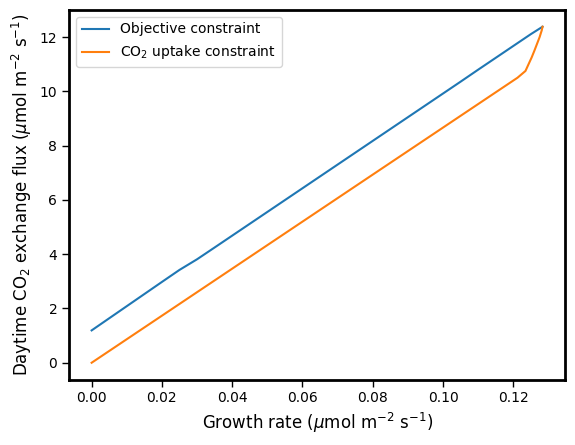

In [248]:

#plot results of scanning over objective upper bound vs CO2 uptake upper bound
import matplotlib.pyplot as plt

# Plot the results
plt.plot(df_A1.T[output_string+"_total"], df_A1.T["CO2_tx_00"], label="Objective constraint")
plt.plot(df_B1.T[output_string+"_total"], df_B1.T["CO2_tx_00"], label="CO$_2$ uptake constraint")

# Add labels and title
plt.xlabel("Growth rate ($\mu$mol m$^{-2}$ s$^{-1}$)", fontsize = 12)
plt.ylabel("Daytime CO$_2$ exchange flux ($\mu$mol m$^{-2}$ s$^{-1}$)", fontsize = 12)
# plt.title("Scanning Results")

# Add legend
plt.legend()

# Show the plot
plt.savefig("Ch1_method_comp.png", dpi=300, bbox_inches='tight')
plt.show()



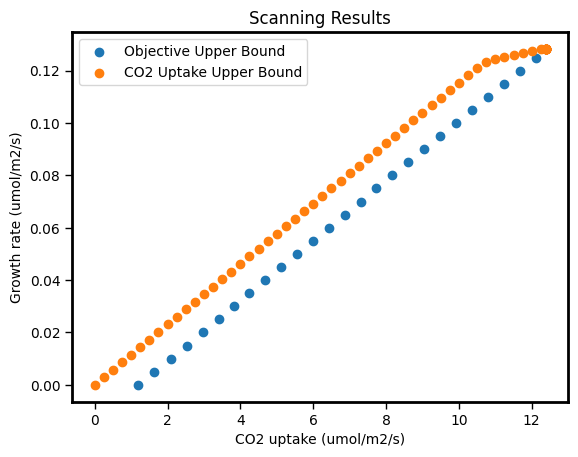

In [215]:

#plot results of scanning over objective upper bound vs CO2 uptake upper bound
import matplotlib.pyplot as plt

# Plot the results
plt.scatter(df_A1.T["CO2_tx_00"],df_A1.T[output_string+"_total"],  label="Objective Upper Bound")
plt.scatter( df_B1.T["CO2_tx_00"],df_B1.T[output_string+"_total"], label="CO2 Uptake Upper Bound")

# Add labels and title
plt.xlabel("CO2 uptake (umol/m2/s)")
plt.ylabel("Growth rate (umol/m2/s)")
plt.title("Scanning Results")

# Add legend
plt.legend()

# Show the plot
plt.show()



In [232]:
df_name_list = ["objective constrained", "CO2 constrained"]
df_list = [df_A1, df_B1]


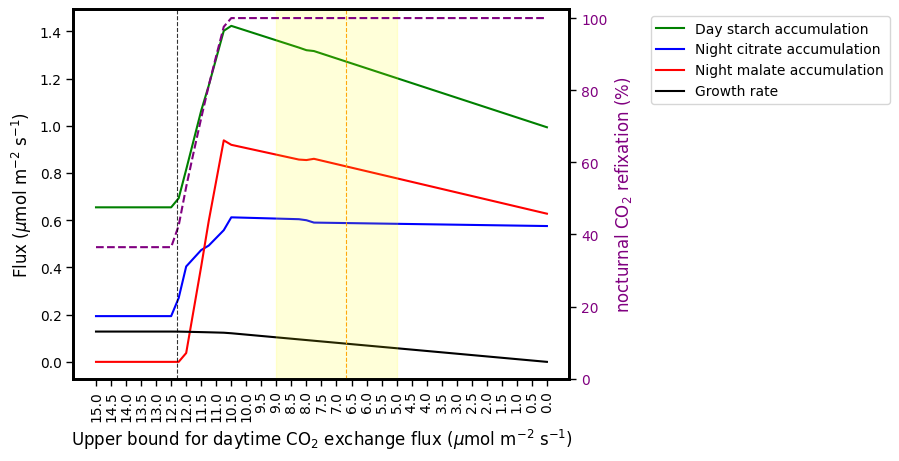

In [233]:
import matplotlib.pyplot as plt

fig, ax1 = plt.subplots()

# Reverse the DataFrame
df_B1 = df_B1.iloc[:, ::-1]

# Plot the CO2 uptake
# ax1.plot(df_B1.columns, df_B1.T["noct. CO2 coeff."], label="nCO2R", color='black')
ax1.plot(df_B1.columns, df_B1.T["STARCH_p_linker_00_to_12"], label="Day starch accumulation", color='green')
ax1.plot(df_B1.columns, abs(df_B1.T["CIT_v_linker_12_to_00"]), label="Night citrate accumulation", color='blue')
ax1.plot(df_B1.columns, abs(df_B1.T["MAL_v_linker_12_to_00"]), label="Night malate accumulation", color='red')
ax1.plot(df_B1.columns, df_B1.T["AraCore_Biomass_tx_total"], label="Growth rate", color='black')
# ax1.plot(df_B1.columns, df_B1.T["CO2_tx_00"], label="Daytime CO2 uptake", color='orange')
# ax1.plot(df_B1.columns, df_B1.T["photon use"], label="Photon use", color='purple')



ax1.set_ylabel("Flux ($\mu$mol m$^{-2}$ s$^{-1}$)", fontsize = 12)
ax1.tick_params(axis='y', labelcolor='black')

ax1.set_xlabel("Upper bound for daytime CO$_2$ exchange flux ($\mu$mol m$^{-2}$ s$^{-1}$)", fontsize = 12)
ax1.tick_params(axis='x', rotation=90)
plt.legend(loc='upper left', bbox_to_anchor=(1.15, 1))

# Create a second y-axis
ax2 = ax1.twinx()
ax2.set_ylabel('nocturnal CO$_2$ refixation (%)', color = 'purple', fontsize = 12)  # we already handled the x-label with ax1
ax2.tick_params(axis='y', labelcolor='purple')
ax2.plot(df_B1.columns, df_B1.T["noct. CO2 coeff."]*100, label="nCO2R", color='purple', linestyle='--')
ax2.set_ylim(0, 102.5)

# Add a shaded area for experimental CO2 uptake data (5-9 umol/m2/s)
plt.axvspan(24, 40, color='yellow', alpha=0.15)
# Add a vertical line at x=6.634
plt.axvline(x=16.643*2, linestyle='--', color='orange', linewidth=0.8, alpha=0.95)

# Add a vertical line at x=12.380 (previous CO2 uptake rate in model)
plt.axvline(x=5.380*2, linestyle='--', color='black', linewidth=0.8, alpha=0.8)


# Add title and legend
# plt.title("Reducing CO2 uptake rates shifts metabolic behaviour")
# plt.legend()

# Show only every other tick on the x-axis
plt.xticks(ticks=plt.xticks()[0][::2])

# Show the plot
plt.savefig("Ch1_CO2_ub_scan.png", dpi=300, bbox_inches='tight')
plt.show()

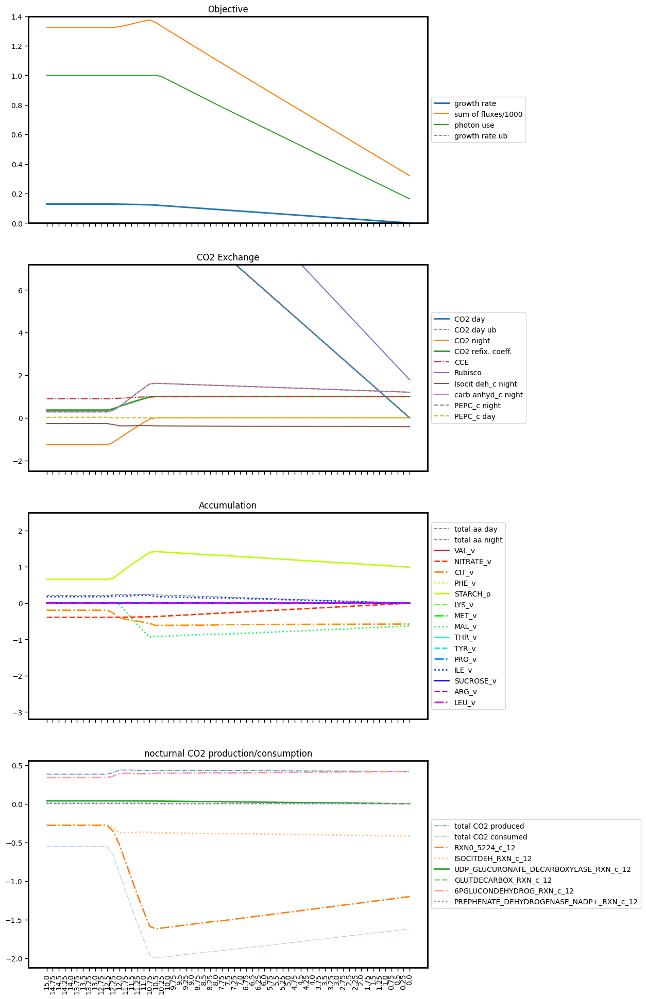

In [52]:
plot_accum(diel_model, output_string+"_total", df_B1, 0.001, growth_rate=[1,1], CO2_day_rate=[1.16,1.16], lim2_x=0, lim2_y=1.4, lim3_x=-2.5, lim3_y=7.2, lim5_x=-3.2, 
           lim5_y=2.5, time_phase="_12", CO2_organelle = ["_c"])

In [53]:
df_B1.loc["PEPCARBOX_RXN_c_12"][::2]

15.0    0.280304
14.5    0.280304
14.0    0.280304
13.5    0.280304
13.0    0.280304
12.5    0.280304
12.0    0.527574
11.5    0.963314
11.0    1.384247
10.5    1.620844
10.0    1.600934
9.5     1.581024
9.0     1.561115
8.5     1.541205
8.0     1.522677
7.5     1.505775
7.0     1.485573
6.5     1.465371
6.0     1.445168
5.5     1.424966
5.0     1.404764
4.5     1.384561
4.0     1.364359
3.5     1.344157
3.0     1.323954
2.5     1.303752
2.0     1.283550
1.5     1.263347
1.0     1.243145
0.5     1.222943
0.0     1.202740
Name: PEPCARBOX_RXN_c_12, dtype: float64

## Create C3, CAM-cycling modelling scenario at set CO2 uptake rate

### C3 model (via indirect CO2 constraint)

In [54]:
### C3
# use loop to constrain objective flux until the CO2 uptake rate reaches the desired value
C3_model = diel_model.copy()

CO2_uptake = 6.643
#unconstrain the CO2 uptake
C3_model.reactions.get_by_id("CO2_tx"+day_tag).upper_bound = 1000
# constrain night-time CO2 uptake to 0, CO2 can only be lost at night
C3_model.reactions.get_by_id("CO2_tx"+night_tag).upper_bound = 0
C3_model.reactions.get_by_id("CO2_tx"+night_tag).lower_bound = -1000

#run estimateOutput function to determine output flux at unconstrained desired CO2 uptake rate, hence output at experimental CO2 uptake rate without inducing lots of carbon refixation
solution_C3, C3_model_opt, _ = estimateOutputFromNetCO2_Corinna_dev(C3_model,netCO2uptake=CO2_uptake,Output_ID=output_string+"_total",
                                      Vc_ID="RIBULOSE_BISPHOSPHATE_CARBOXYLASE_RXN_p"+day_tag,
                                      CO2in_ID="CO2_tx"+day_tag,verbose=True, iterations=50, pFBA=True)
calculate_noct_CO2_refixation_coefficient(C3_model_opt, verbose=True, threshold = 0.00001, show_noflux = False)




Model can achieve desired CO2 rate, without discouraging CO2 refixation.
0.07666792062071415
First optimisation (unconstrained CO2 uptake): Model is feasible.
Starting CO2 uptake = 12.379644137639415
Starting output flux: AraCore_Biomass_tx_total = 0.12832014923989887


---- CO2 adjustment iteration 1 ----
CCE: 89.81
Factor: 0.5366
prev: 0.12832014923989887
now: 0.06885745195283069
Optimisation successful.
Vc flux = 8.60662560635476
Current CO2 uptake = 7.201340045926856
Target CO2 uptake = 6.643
Output_ID before: 0.12832014923989887
Output_ID after: 0.06885745195283069
CCE: 82.85
Sum of fluxes: 795.7913993935024


---- CO2 adjustment iteration 2 ----
CCE: 82.85
Factor: 0.9225
prev: 0.06885745195283069
now: 0.06351874101284458
Optimisation successful.
Vc flux = 8.050216956597476
Current CO2 uptake = 6.735405931840167
Target CO2 uptake = 6.643
Output_ID before: 0.06885745195283069
Output_ID after: 0.06351874101284458
CCE: 81.71
Sum of fluxes: 748.9034905399127


---- CO2 adjustment iter

0.26611377586682566

In [55]:
model_results_overview(C3_model_opt, solution_C3, output_string+"_total")

Photon uptake = 111.4536   % of allowed Photon uptake = 55.73
Output rate (AraCore_Biomass_tx_total) 0.0625		sum of fluxes: 739.6573
gas exchange = Day: 6.64352 Night: -1.23107
CCE: 0.814695697734482
ATPase: 3.7651 3.7651
Rubisco Carbox./Oxygen. = 7.9405/2.6468

Linker fluxes 		 Day 	 Night
VAL_v_linker                         0.0       0.0

NITRATE_v_linker                     0.0             0.18994

CIT_v_linker                         0.0             0.09119

PHE_v_linker                     0.00371       0.0

STARCH_p_linker                  0.41607                 0.0

LYS_v_linker                       0.004       0.0

MET_v_linker                      0.0017       0.0

MAL_v_linker                         0.0                 0.0

CYS_v_linker                         0.0       0.0

4_AMINO_BUTYRATE_v_linker                 0.0       0.0

L_ASPARTATE_v_linker                 0.0       0.0

L_ALPHA_ALANINE_v_linker                 0.0       0.0

FRU_v_linker                       

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


In [56]:
model = C3_model_opt
model_name = "C3_indirect_opt"

for rxn in CO2_rxns:
    # print(model.reactions.get_by_id(rxn).id)
    # print(model.reactions.get_by_id(rxn).flux)
    
    CO2_rxns_dict[rxn].append(model.reactions.get_by_id(rxn).flux)

CO2_rxns_dict

{'CO2_tx_12': [-1.2611640158317665, -1.231073727194467],
 'ISOCITDEH_RXN_m_12': [0.4183444444444444, 0.4183444444444444],
 'ISOCITDEH_RXN_c_12': [-0.2704828796178589, -0.22564845673769748],
 'ISOCITDEH_RXN_x_12': [0.0, 0.0],
 '6PGLUCONDEHYDROG_RXN_c_12': [0.33844725865759023, 0.3213813495925347],
 '6PGLUCONDEHYDROG_RXN_p_12': [0.3091804062342183, 0.25656446539292027],
 '2OXOGLUTARATEDEH_RXN_m_12': [0.10451642499279326, 0.17159567130392706],
 'RXN0_5224_c_12': [0.28030356822088554, 0.13645114541051878],
 'PEPCARBOX_RXN_c_12': [0.28030356822088554, 0.13645114541051878],
 'PEPCARBOXYKIN_RXN_c_12': [0.0, 0.0],
 'PYRUVDEH_RXN_m_12': [0.005105383606545025, 0.1292464503465265],
 'PYRUVDEH_RXN_p_12': [0.20943848045277427, 0.10195418036312591],
 'RXN0_5224_p_12': [0.17317018250434074, 0.08429885464406894],
 'ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12': [0.17317018250434177,
  0.08429885464406894],
 'RXN_9958_NAD_m_12': [0.1724712387094986, 0.079379948940048],
 '2KETO_3METHYLVALERATE_RXN_m_12': [0.172

Total: 1.6774721839867521


({'Others-pos': 16.595543294294764,
  'Others-neg': 0.0,
  'CO2_tx_12': -73.38862241331744,
  'ISOCITDEH_RXN_m_12': 24.938979521567333,
  '6PGLUCONDEHYDROG_RXN_c_12': 19.158669375293368,
  '6PGLUCONDEHYDROG_RXN_p_12': 15.294707586933464,
  'ISOCITDEH_RXN_c_12': -13.451695884542879,
  '2OXOGLUTARATEDEH_RXN_m_12': 10.229419774705619,
  'RXN0_5224_c_12': -8.134331329788322,
  'PYRUVDEH_RXN_m_12': 7.704834189223564,
  'PYRUVDEH_RXN_p_12': 6.07784625798189,
  'RXN0_5224_p_12': -5.0253503723513715},
                                value
 Others-pos                 16.595543
 Others-neg                  0.000000
 CO2_tx_12                 -73.388622
 ISOCITDEH_RXN_m_12         24.938980
 6PGLUCONDEHYDROG_RXN_c_12  19.158669
 6PGLUCONDEHYDROG_RXN_p_12  15.294708
 ISOCITDEH_RXN_c_12        -13.451696
 2OXOGLUTARATEDEH_RXN_m_12  10.229420
 RXN0_5224_c_12             -8.134331
 PYRUVDEH_RXN_m_12           7.704834
 PYRUVDEH_RXN_p_12           6.077846
 RXN0_5224_p_12             -5.025350)

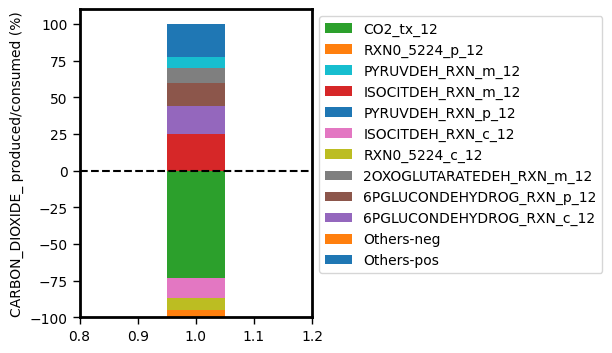

In [57]:
generateMetaboliteBudget(C3_model_opt, solution_C3, show_plot=True, percentage=True, day_or_night_tag="_12", 
                         metabolite="CARBON_DIOXIDE_", threshold=0.05, colourDict= colourDict_CO2)

Total: 0.22075000005458773


({'Others-pos': 0,
  'Others-neg': 0.0,
  'RXN0_5224_c_12': 61.812523386988325,
  'PEPCARBOX_RXN_c_12': -61.812523386988325,
  'RXN0_5224_p_12': 38.18747661301167,
  'ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12': -38.18747661301167},
                                           value
 Others-pos                             0.000000
 Others-neg                             0.000000
 RXN0_5224_c_12                        61.812523
 PEPCARBOX_RXN_c_12                   -61.812523
 RXN0_5224_p_12                        38.187477
 ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12 -38.187477)

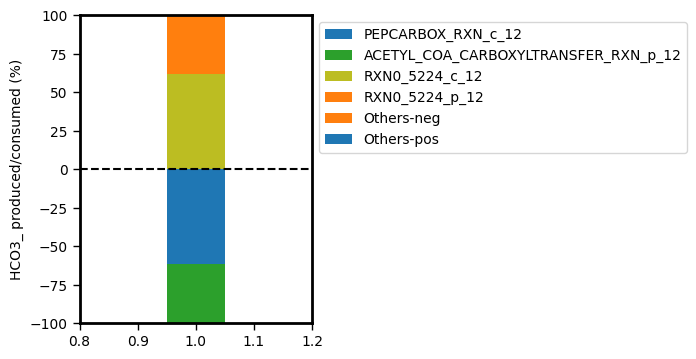

In [58]:
generateMetaboliteBudget(C3_model_opt, solution_C3, show_plot=True, percentage=True, day_or_night_tag="_12", 
                         metabolite="HCO3_", threshold=0.05, colourDict= colourDict_CO2)

### CAM cycling model via direct CO2 uptake constraint

In [59]:
### CAM-cycling
# just optimise for maximum objective flux with CO2-uptake rate constraint in place, no constraint on CAM enzymes
CAM_cyc_model = diel_model.copy()

# constrain daytime CO2 uptake to 6 umol/m2/s
CO2_uptake = 6.643
CAM_cyc_model.reactions.get_by_id("CO2_tx"+day_tag).upper_bound = CO2_uptake

# constrain night-time CO2 uptake to 0, CO2 can only be lost at night
CAM_cyc_model.reactions.get_by_id("CO2_tx"+night_tag).upper_bound = 0
CAM_cyc_model.reactions.get_by_id("CO2_tx"+night_tag).lower_bound = -1000

print("CO2 daytime uptake: ", CAM_cyc_model.reactions.get_by_id("CO2_tx"+day_tag).bounds)
print("CO2 night-time uptake: ", CAM_cyc_model.reactions.get_by_id("CO2_tx"+night_tag).bounds)

solution_CAM_cyc, CAM_cyc_model_opt = optimise_model(CAM_cyc_model, output_string+"_total", pFBA=True)


CO2 daytime uptake:  (0.0, 6.643)
CO2 night-time uptake:  (-1000, 0)
Objective: AraCore_Biomass_tx_total


In [60]:
model_results_overview(CAM_cyc_model_opt, solution_CAM_cyc, output_string+"_total")

Photon uptake = 139.1162   % of allowed Photon uptake = 69.56
Output rate (AraCore_Biomass_tx_total) 0.0767		sum of fluxes: 972.0621
gas exchange = Day: 6.643 Night: 0.0
CO2_tx at night is taking up CO2.
ATPase: 3.7651 3.7651
Rubisco Carbox./Oxygen. = 9.7924/3.2641

Linker fluxes 		 Day 	 Night
VAL_v_linker                         0.0       0.0

NITRATE_v_linker                     0.0             0.23312

CIT_v_linker                         0.0             0.58775

PHE_v_linker                     0.00455       0.0

STARCH_p_linker                   1.2702                 0.0

LYS_v_linker                         0.0       0.0

MET_v_linker                     0.00208       0.0

MAL_v_linker                         0.0             0.82675

CYS_v_linker                         0.0       0.0

4_AMINO_BUTYRATE_v_linker                 0.0       0.0

L_ASPARTATE_v_linker                 0.0       0.0

L_ALPHA_ALANINE_v_linker                 0.0       0.0

FRU_v_linker                   

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


In [61]:
model = CAM_cyc_model_opt
model_name = "CO2_direct_opt"

for rxn in CO2_rxns:
    # print(model.reactions.get_by_id(rxn).id)
    # print(model.reactions.get_by_id(rxn).flux)
    
    CO2_rxns_dict[rxn].append(model.reactions.get_by_id(rxn).flux)

CO2_rxns_dict

{'CO2_tx_12': [-1.2611640158317665, -1.231073727194467, 5.727518646779929e-14],
 'ISOCITDEH_RXN_m_12': [0.4183444444444444,
  0.4183444444444444,
  0.4183444444444444],
 'ISOCITDEH_RXN_c_12': [-0.2704828796178589,
  -0.22564845673769748,
  -0.39117308220067865],
 'ISOCITDEH_RXN_x_12': [0.0, 0.0, 0.0],
 '6PGLUCONDEHYDROG_RXN_c_12': [0.33844725865759023,
  0.3213813495925347,
  0.401193993931745],
 '6PGLUCONDEHYDROG_RXN_p_12': [0.3091804062342183,
  0.25656446539292027,
  0.26793774837596784],
 '2OXOGLUTARATEDEH_RXN_m_12': [0.10451642499279326,
  0.17159567130392706,
  0.001273779052382793],
 'RXN0_5224_c_12': [0.28030356822088554,
  0.13645114541051878,
  1.4711486096983766],
 'PEPCARBOX_RXN_c_12': [0.28030356822088554,
  0.13645114541051878,
  1.4711486096983766],
 'PEPCARBOXYKIN_RXN_c_12': [0.0, 0.0, 0.0],
 'PYRUVDEH_RXN_m_12': [0.005105383606545025,
  0.1292464503465265,
  0.3793977854324863],
 'PYRUVDEH_RXN_p_12': [0.20943848045277427,
  0.10195418036312591,
  0.11824530072199356],


Total: 1.9705533288940336


({'Others-pos': 7.350956027262125,
  'Others-neg': -0.24191169014996408,
  'RXN0_5224_c_12': -74.65662502643629,
  'ISOCITDEH_RXN_m_12': 21.2297956269592,
  '6PGLUCONDEHYDROG_RXN_c_12': 20.35945884077716,
  'ISOCITDEH_RXN_c_12': -19.850925953890485,
  'PYRUVDEH_RXN_m_12': 19.253362995530907,
  '6PGLUCONDEHYDROG_RXN_p_12': 13.597081816930427,
  'RXN_9958_NAD_m_12': 6.104365300828229,
  '2KETO_3METHYLVALERATE_RXN_m_12': 6.104365300828227,
  'PYRUVDEH_RXN_p_12': 6.000614090883718,
  'RXN0_5224_p_12': -5.250537329523254},
                                     value
 Others-pos                       7.350956
 Others-neg                      -0.241912
 RXN0_5224_c_12                 -74.656625
 ISOCITDEH_RXN_m_12              21.229796
 6PGLUCONDEHYDROG_RXN_c_12       20.359459
 ISOCITDEH_RXN_c_12             -19.850926
 PYRUVDEH_RXN_m_12               19.253363
 6PGLUCONDEHYDROG_RXN_p_12       13.597082
 RXN_9958_NAD_m_12                6.104365
 2KETO_3METHYLVALERATE_RXN_m_12   6.104365
 PY

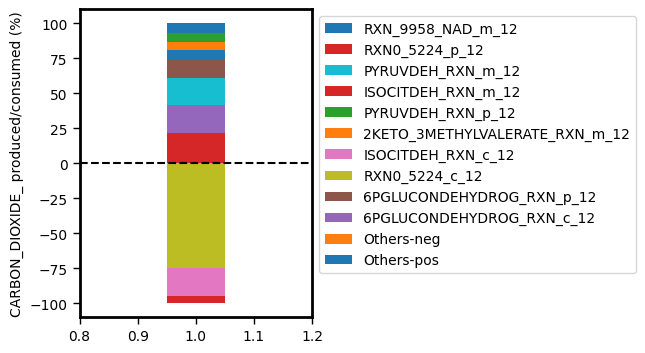

In [62]:
generateMetaboliteBudget(CAM_cyc_model_opt, solution_CAM_cyc, show_plot=True, percentage=True, day_or_night_tag="_12", 
                         metabolite="CARBON_DIOXIDE_", threshold=0.05, colourDict=colourDict_CO2)

Total: 10.438720443654272


({'Others-pos': 4.758275456961493,
  'Others-neg': -0.13699951700876759,
  'RIBULOSE_BISPHOSPHATE_CARBOXYLASE_RXN_p_00': -93.80883304720389,
  'CO2_tx_00': 63.638067863368235,
  'GCVMULTI_RXN_m_00': 16.087543729923983,
  'MALIC_NADP_RXN_c_00': 6.999464856263134,
  'ISOCITDEH_RXN_m_00': 4.007621879545181,
  'PEPCARBOXYKIN_RXN_c_00': 3.235549470779563,
  'ISOCITDEH_RXN_c_00': -3.0806812113916835,
  'RXN0_5224_p_00': -2.973486224395658,
  'ACETOOHBUTSYN_RXN_p_00': 1.273476743158415},
                                                 value
 Others-pos                                   4.758275
 Others-neg                                  -0.137000
 RIBULOSE_BISPHOSPHATE_CARBOXYLASE_RXN_p_00 -93.808833
 CO2_tx_00                                   63.638068
 GCVMULTI_RXN_m_00                           16.087544
 MALIC_NADP_RXN_c_00                          6.999465
 ISOCITDEH_RXN_m_00                           4.007622
 PEPCARBOXYKIN_RXN_c_00                       3.235549
 ISOCITDEH_RXN_c_00

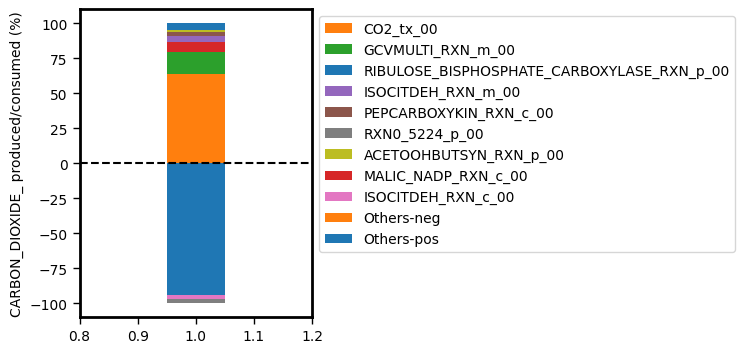

In [63]:
generateMetaboliteBudget(CAM_cyc_model_opt, solution_CAM_cyc, show_plot=True, percentage=True, day_or_night_tag="_00", 
                         metabolite="CARBON_DIOXIDE_", threshold=0.01, colourDict=colourDict_CO2)

Total: 0.5127366348963843


({'Others-pos': 18.40948822995943,
  'Others-neg': -0.24842754850942197,
  'ISOCITDEH_RXN_m_12': 81.59051177004058,
  'ISOCITDEH_RXN_c_12': -76.29122937153268,
  'BRANCHED_CHAINAMINOTRANSFERILEU_RXN_m_12': -23.4603430799579},
                                               value
 Others-pos                                18.409488
 Others-neg                                -0.248428
 ISOCITDEH_RXN_m_12                        81.590512
 ISOCITDEH_RXN_c_12                       -76.291229
 BRANCHED_CHAINAMINOTRANSFERILEU_RXN_m_12 -23.460343)

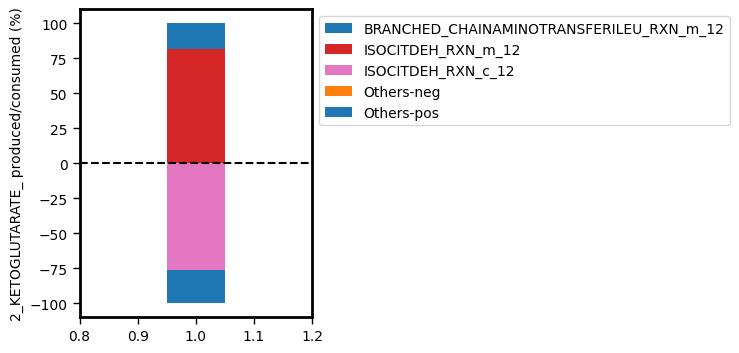

In [64]:
generateMetaboliteBudget(CAM_cyc_model_opt, solution_CAM_cyc, show_plot=True, percentage=True, day_or_night_tag="_12", 
                         metabolite="2_KETOGLUTARATE_", threshold=0.05, colourDict=colourDict_CO2)

In [65]:
print(diel_model.reactions.MALIC_NADP_RXN_c_00)
print(diel_model.reactions.PEPCARBOXYKIN_RXN_c_00)
print(diel_model.reactions.ATP_CITRATE_PRO_S__LYASE_RXN_c_00)
print(diel_model.reactions.ACONITATEDEHYDR_RXN_c_00)


MALIC_NADP_RXN_c_00: MAL_c_00 + NADP_c_00 --> CARBON_DIOXIDE_c_00 + NADPH_c_00 + PYRUVATE_c_00
PEPCARBOXYKIN_RXN_c_00: ATP_c_00 + OXALACETIC_ACID_c_00 + 0.16 PROTON_c_00 --> ADP_c_00 + CARBON_DIOXIDE_c_00 + PHOSPHO_ENOL_PYRUVATE_c_00
ATP_CITRATE_PRO_S__LYASE_RXN_c_00: ATP_c_00 + CIT_c_00 + CO_A_c_00 + 0.27 PROTON_c_00 --> ACETYL_COA_c_00 + ADP_c_00 + OXALACETIC_ACID_c_00 + Pi_c_00
ACONITATEDEHYDR_RXN_c_00: CIT_c_00 <=> CIS_ACONITATE_c_00 + WATER_c_00


In [66]:
diel_model.reactions.ATP_CITRATE_PRO_S__LYASE_RXN_c_00

Reaction identifier,ATP_CITRATE_PRO_S__LYASE_RXN_c_00
Name,ATP-CITRATE-PRO-S--LYASE-RXN:ATP-citrate (pro-S-)-lyase
Memory address,0x7f5f677cfb50
Stoichiometry,ATP_c_00 + CIT_c_00 + CO_A_c_00 + 0.27 PROTON_c_00 --> ACETYL_COA_c_00 + ADP_c_00 + OXALACETIC_ACID_c_00 + Pi_c_00 ATP + CIT + CO-A + 0.27 PROTON --> ACETYL-COA + ADP + OXALACETIC_ACID[c] + Pi[c]
GPR,
Lower bound,0.0
Upper bound,1000.0


solution_CAM_cyc (results 20/08/2024):

- not light-limited (60.6% photo use = 200 PPFD)
- citrate accumulation = 0.4485 night to day
- malate accumulation = 0.63122 night to day
- nocturnal CO2 refixation = 100%
- total carbon use efficiency = 100%

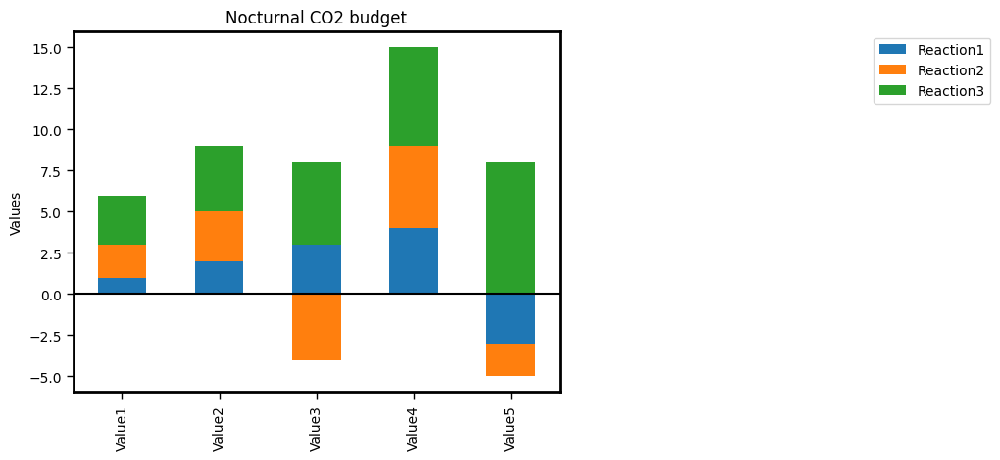

In [67]:
import matplotlib.pyplot as plt

def generate_multiple_stacked_bars(df):
    df.plot(kind='bar', stacked=True)
    plt.title('Nocturnal CO2 budget')
    plt.xlabel('')
    plt.ylabel('Values')

    plt.legend(bbox_to_anchor=(1.9,1), loc='upper right')
    # Add a horizontal line at y=0
    plt.axhline(0, color='black')

    plt.show()



df = pd.DataFrame({
    'Reaction1': [1, 2, 3, 4, -3],
    'Reaction2': [2, 3, -4, 5, -2],
    'Reaction3': [3, 4, 5, 6, 8]
}, index=['Value1', 'Value2', 'Value3', 'Value4', "Value5"])

generate_multiple_stacked_bars(df)

Total: 1.9851206461748518


Total: 1.6774721839867521
Total: 1.9705533288940336


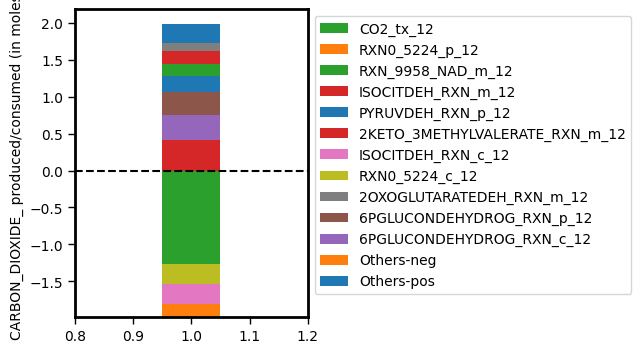

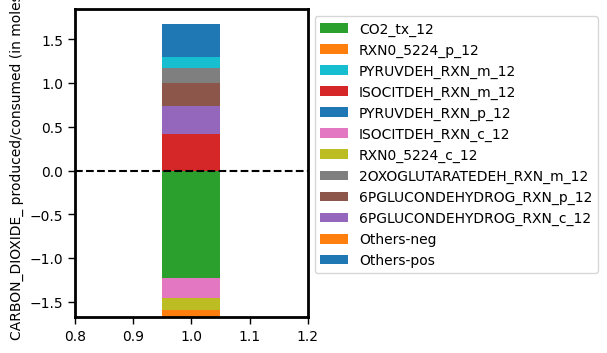

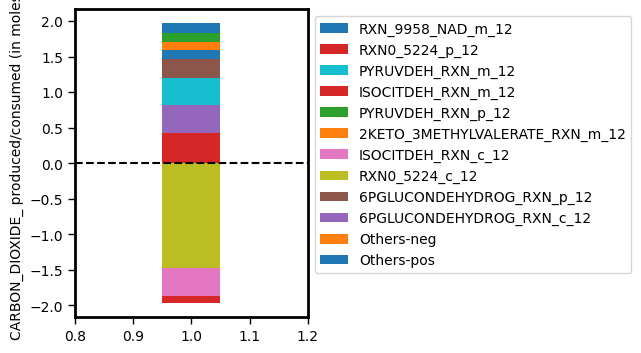

In [68]:
CO2_models = {"CO2_unconstrained": [C3_unlimited_opt, solution_C3_unlimited],
              "CO2_indirect": [C3_model_opt, solution_C3],
              "CO2_direct": [CAM_cyc_model_opt, solution_CAM_cyc]}

df_CO2_models = pd.DataFrame()

for model_name, model in CO2_models.items():
    _, df_temp = generateMetaboliteBudget(model[0], model[1], show_plot=True, percentage=False, day_or_night_tag="_12", 
                         metabolite="CARBON_DIOXIDE_", threshold=0.05, colourDict=colourDict_CO2)
    
    df_CO2_models = df_CO2_models.combine_first(df_temp)
    
    df_CO2_models[model_name] = df_temp["value"]

 

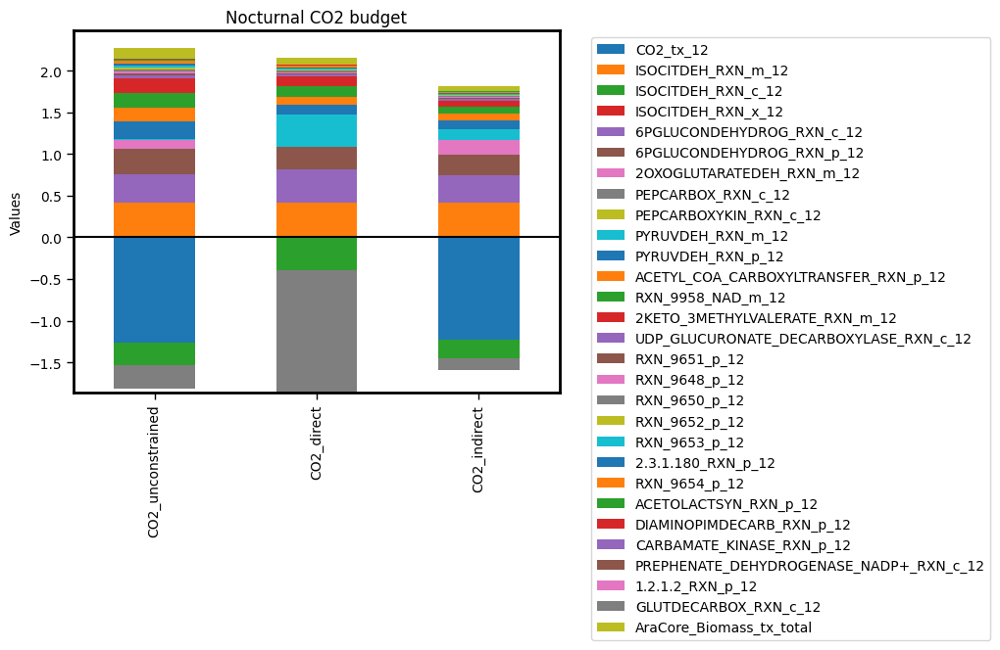

In [69]:
import matplotlib.pyplot as plt

df = pd.DataFrame(CO2_rxns_dict)


df.index=['CO2_unconstrained', 'CO2_indirect', 'CO2_direct']
df = df.reindex(['CO2_unconstrained', 'CO2_direct', 'CO2_indirect'])

df.T.loc['PEPCARBOX_RXN_c_12'] = df.T.loc['PEPCARBOX_RXN_c_12'] * -1

df = df.drop(columns=["RXN0_5224_c_12", "RXN0_5224_p_12"])

generate_multiple_stacked_bars(df)

In [70]:
df_CO2_models

,CO2_indirect,CO2_unconstrained,value,CO2_direct
2KETO_3METHYLVALERATE_RXN_m_12,NaN,1.724712e-01,1.724712e-01,0.120290
2OXOGLUTARATEDEH_RXN_m_12,0.171596,1.045164e-01,1.045164e-01,NaN
6PGLUCONDEHYDROG_RXN_c_12,0.321381,3.384473e-01,3.384473e-01,0.401194
6PGLUCONDEHYDROG_RXN_p_12,0.256564,3.091804e-01,3.091804e-01,0.267938
CO2_tx_12,-1.231074,-1.261164e+00,-1.261164e+00,NaN
ISOCITDEH_RXN_c_12,-0.225648,-2.704829e-01,-2.704829e-01,-0.391173
ISOCITDEH_RXN_m_12,0.418344,4.183444e-01,4.183444e-01,0.418344
Others-neg,0.000000,-2.293525e-17,-2.293525e-17,-0.004767
Others-pos,0.278386,2.602512e-01,2.602512e-01,0.144855
PYRUVDEH_RXN_m_12,0.129246,NaN,1.292465e-01,0.379398


In [71]:
df_CO2_models

,CO2_indirect,CO2_unconstrained,value,CO2_direct
2KETO_3METHYLVALERATE_RXN_m_12,NaN,1.724712e-01,1.724712e-01,0.120290
2OXOGLUTARATEDEH_RXN_m_12,0.171596,1.045164e-01,1.045164e-01,NaN
6PGLUCONDEHYDROG_RXN_c_12,0.321381,3.384473e-01,3.384473e-01,0.401194
6PGLUCONDEHYDROG_RXN_p_12,0.256564,3.091804e-01,3.091804e-01,0.267938
CO2_tx_12,-1.231074,-1.261164e+00,-1.261164e+00,NaN
ISOCITDEH_RXN_c_12,-0.225648,-2.704829e-01,-2.704829e-01,-0.391173
ISOCITDEH_RXN_m_12,0.418344,4.183444e-01,4.183444e-01,0.418344
Others-neg,0.000000,-2.293525e-17,-2.293525e-17,-0.004767
Others-pos,0.278386,2.602512e-01,2.602512e-01,0.144855
PYRUVDEH_RXN_m_12,0.129246,NaN,1.292465e-01,0.379398


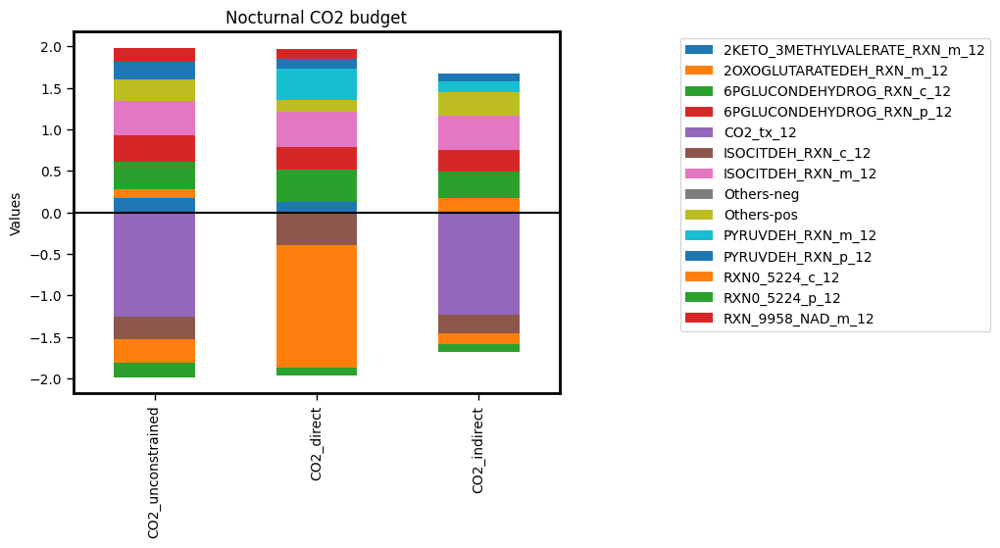

In [72]:
df_CO2_models = df_CO2_models.T.reindex(['CO2_unconstrained', 'CO2_direct', 'CO2_indirect'])

generate_multiple_stacked_bars(df_CO2_models)

In [73]:
for model_name, model in CO2_models.items():
    print(model[0].reactions.AraCore_Biomass_tx_total.flux)
    df_CO2_models_norm = df_CO2_models.div(model[0].reactions.AraCore_Biomass_tx_total.flux, axis=0)


0.128320149239899
0.06246595951013827
0.07666792062071481


In [74]:
df_CO2_models.T

,CO2_unconstrained,CO2_direct,CO2_indirect
2KETO_3METHYLVALERATE_RXN_m_12,1.724712e-01,0.120290,NaN
2OXOGLUTARATEDEH_RXN_m_12,1.045164e-01,NaN,0.171596
6PGLUCONDEHYDROG_RXN_c_12,3.384473e-01,0.401194,0.321381
6PGLUCONDEHYDROG_RXN_p_12,3.091804e-01,0.267938,0.256564
CO2_tx_12,-1.261164e+00,NaN,-1.231074
ISOCITDEH_RXN_c_12,-2.704829e-01,-0.391173,-0.225648
ISOCITDEH_RXN_m_12,4.183444e-01,0.418344,0.418344
Others-neg,-2.293525e-17,-0.004767,0.000000
Others-pos,2.602512e-01,0.144855,0.278386
PYRUVDEH_RXN_m_12,NaN,0.379398,0.129246


In [75]:
df_CO2_models_norm.T

,CO2_unconstrained,CO2_direct,CO2_indirect
2KETO_3METHYLVALERATE_RXN_m_12,2.249588e+00,1.568971,NaN
2OXOGLUTARATEDEH_RXN_m_12,1.363235e+00,NaN,2.238168
6PGLUCONDEHYDROG_RXN_c_12,4.414457e+00,5.232880,4.191862
6PGLUCONDEHYDROG_RXN_p_12,4.032722e+00,3.494783,3.346438
CO2_tx_12,-1.644970e+01,NaN,-16.057221
ISOCITDEH_RXN_c_12,-3.527980e+00,-5.102174,-2.943193
ISOCITDEH_RXN_m_12,5.456577e+00,5.456577,5.456577
Others-neg,-2.991506e-16,-0.062177,0.000000
Others-pos,3.394525e+00,1.889376,3.631057
PYRUVDEH_RXN_m_12,NaN,4.948586,1.685796


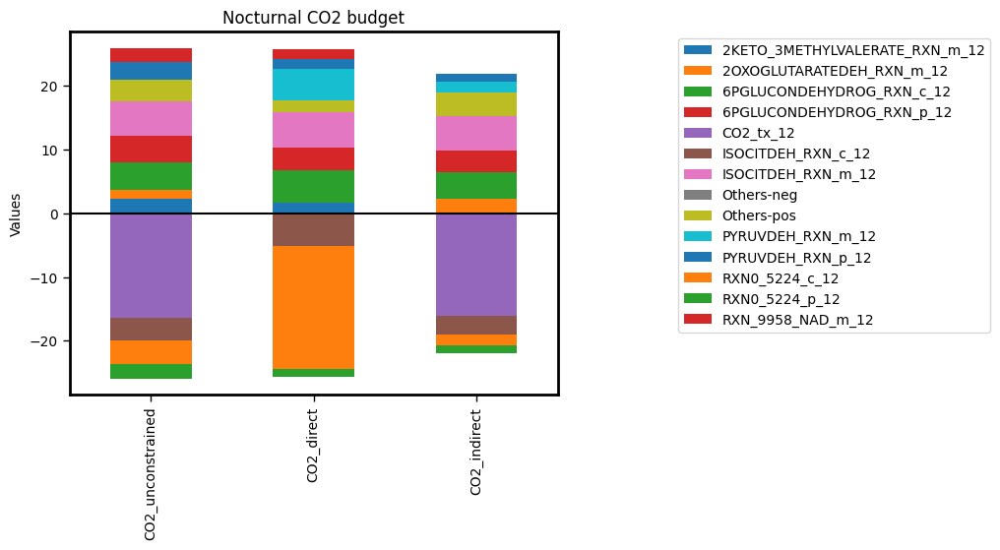

In [76]:
generate_multiple_stacked_bars(df_CO2_models_norm)

Total: 1.9851206461748518


Total: 1.6774721839867521
Total: 1.9705533288940336


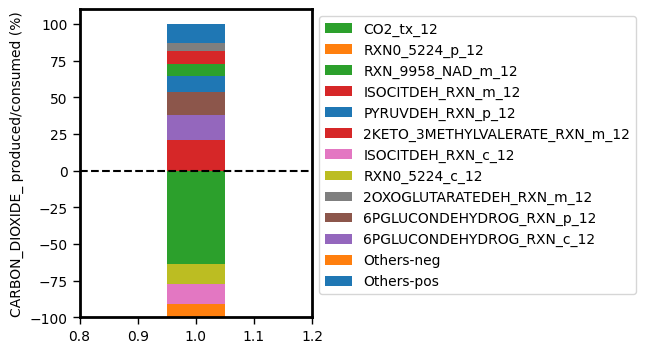

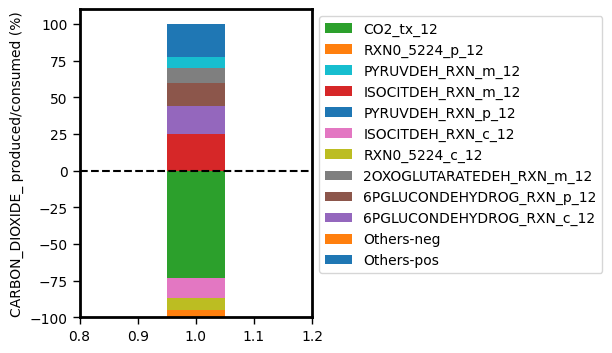

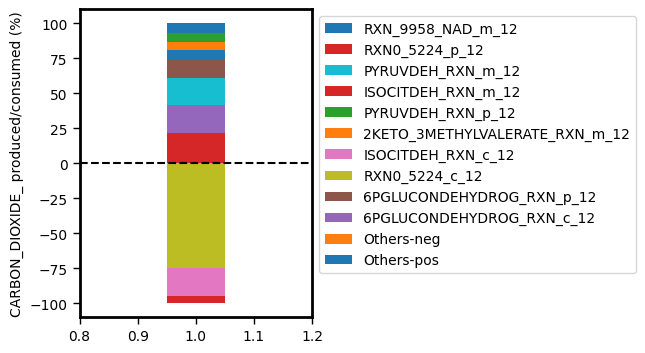

In [77]:
CO2_models = {"CO2_unconstrained": [C3_unlimited_opt, solution_C3_unlimited],
              "CO2_indirect": [C3_model_opt, solution_C3],
              "CO2_direct": [CAM_cyc_model_opt, solution_CAM_cyc]}

df_CO2_models_perc = pd.DataFrame()


for model_name, model in CO2_models.items():
    _, df_temp = generateMetaboliteBudget(model[0], model[1], show_plot=True, percentage=True, day_or_night_tag="_12", 
                         metabolite="CARBON_DIOXIDE_", threshold=0.05, colourDict=colourDict_CO2)
    

    df_CO2_models_perc = df_CO2_models_perc.combine_first(df_temp)
    
    df_CO2_models_perc[model_name] = df_temp["value"]

 

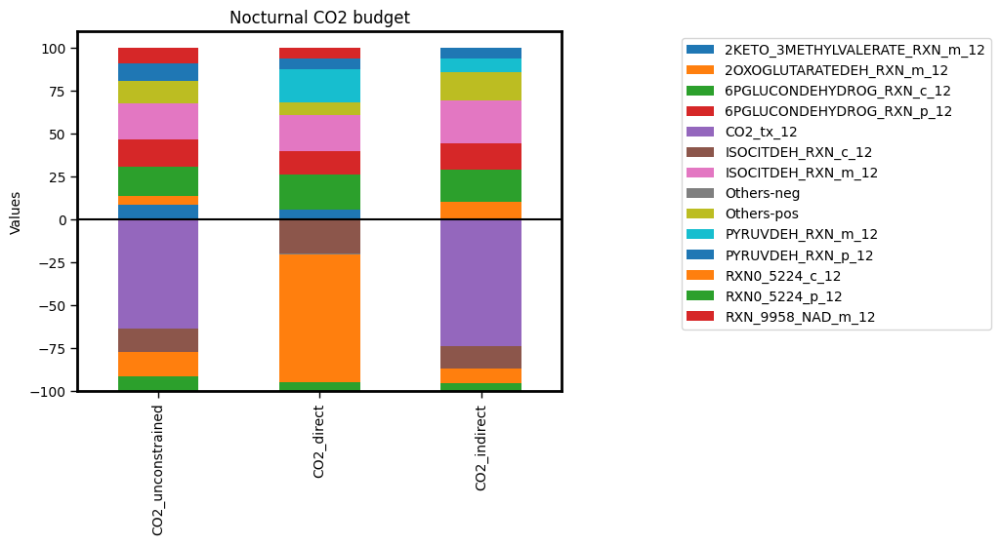

In [78]:
df_CO2_models_perc = df_CO2_models_perc.fillna(0)

df_CO2_models_perc = df_CO2_models_perc.T.reindex(['CO2_unconstrained', 'CO2_direct', 'CO2_indirect'])

generate_multiple_stacked_bars(df_CO2_models_perc)

In [79]:
df_CO2_models_perc.T

,CO2_unconstrained,CO2_direct,CO2_indirect
2KETO_3METHYLVALERATE_RXN_m_12,8.688199e+00,6.104365,0.000000
2OXOGLUTARATEDEH_RXN_m_12,5.264991e+00,0.000000,10.229420
6PGLUCONDEHYDROG_RXN_c_12,1.704920e+01,20.359459,19.158669
6PGLUCONDEHYDROG_RXN_p_12,1.557489e+01,13.597082,15.294708
CO2_tx_12,-6.353085e+01,0.000000,-73.388622
ISOCITDEH_RXN_c_12,-1.362551e+01,-19.850926,-13.451696
ISOCITDEH_RXN_m_12,2.107401e+01,21.229796,24.938980
Others-neg,-1.155358e-15,-0.241912,0.000000
Others-pos,1.311009e+01,7.350956,16.595543
PYRUVDEH_RXN_m_12,0.000000e+00,19.253363,7.704834


Total: 1.9705533288940336


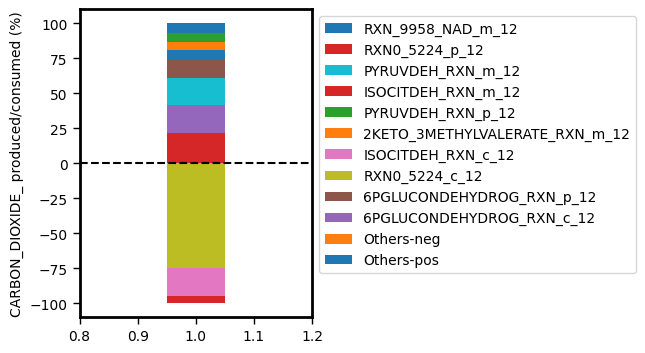

In [80]:
    _, df_temp = generateMetaboliteBudget(CAM_cyc_model_opt, solution_CAM_cyc, show_plot=True, percentage=True, day_or_night_tag="_12", 
                         metabolite="CARBON_DIOXIDE_", threshold=0.05, colourDict=colourDict_CO2)

In [81]:
df_temp

,value
Others-pos,7.350956
Others-neg,-0.241912
RXN0_5224_c_12,-74.656625
ISOCITDEH_RXN_m_12,21.229796
6PGLUCONDEHYDROG_RXN_c_12,20.359459
ISOCITDEH_RXN_c_12,-19.850926
PYRUVDEH_RXN_m_12,19.253363
6PGLUCONDEHYDROG_RXN_p_12,13.597082
RXN_9958_NAD_m_12,6.104365
2KETO_3METHYLVALERATE_RXN_m_12,6.104365


In [82]:
sum(df_temp["value"])

1.0658141036401503e-14

## constrain CO2-refixing behaviour by cumulatively turning of nocturnal CO2-fixing enzyme

In [83]:
# reference model, CAM allowed
solution_CAM_cyc, CAM_cyc_model_opt = optimise_model(CAM_cyc_model, output_string+"_total", pFBA=True)
print("objective flux:", CAM_cyc_model_opt.reactions.AraCore_Biomass_tx_total.flux)

calculate_noct_CO2_refixation_coefficient(CAM_cyc_model_opt, verbose=True, threshold = 0.00001, show_noflux = False)

print("sum of fluxes:", calculate_sum_of_all_fluxes(solution_CAM_cyc))
print("photon use:", CAM_cyc_model_opt.reactions.Photon_tx_00.flux)

Objective: AraCore_Biomass_tx_total
objective flux: 0.07666792062071394
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	1.471149
producing HCO3-:	RXN0_5224_c_12	1.471149
producing CO2:	CO2_pc_12	0.394762
consuming CO2:	ISOCITDEH_RXN_c_12	-0.391173
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.021753
producing CO2:	GLUTDECARBOX_RXN_c_12	0.001847
producing CO2:	CO2_mc_12	1.039596
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.401194
consuming HCO3-:	PEPCARBOX_RXN_c_12	1.471149
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.00317
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.004915
producing CO2:	RXN_9652_p_12	0.014781
producing CO2:	RXN_9650_p_12	0.014781
producing CO2:	2.3.1.180_RXN_p_12	0.014781
producing CO2:	RXN_9654_p_12	0.014781
consuming CO2:	RXN0_5224_p_12	0.103465
producing HCO3-:	RXN0_5224_p_12	0.103465
consuming CO2:	CO2_pc_12	0.394762
producing CO2:	1.2.1.2_RXN_p_12	0.002449
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.103465
prod

Total: 1.9705533288939627


({'Others-pos': 7.35095602725948,
  'Others-neg': -0.24191169015095831,
  'RXN0_5224_c_12': -74.65662502643451,
  'ISOCITDEH_RXN_m_12': 21.229795626959962,
  '6PGLUCONDEHYDROG_RXN_c_12': 20.359458840777876,
  'ISOCITDEH_RXN_c_12': -19.850925953891146,
  'PYRUVDEH_RXN_m_12': 19.253362995531262,
  '6PGLUCONDEHYDROG_RXN_p_12': 13.597081816930883,
  'RXN_9958_NAD_m_12': 6.104365300828336,
  '2KETO_3METHYLVALERATE_RXN_m_12': 6.104365300828334,
  'PYRUVDEH_RXN_p_12': 6.000614090883867,
  'RXN0_5224_p_12': -5.250537329523375},
                                     value
 Others-pos                       7.350956
 Others-neg                      -0.241912
 RXN0_5224_c_12                 -74.656625
 ISOCITDEH_RXN_m_12              21.229796
 6PGLUCONDEHYDROG_RXN_c_12       20.359459
 ISOCITDEH_RXN_c_12             -19.850926
 PYRUVDEH_RXN_m_12               19.253363
 6PGLUCONDEHYDROG_RXN_p_12       13.597082
 RXN_9958_NAD_m_12                6.104365
 2KETO_3METHYLVALERATE_RXN_m_12   6.104365
 

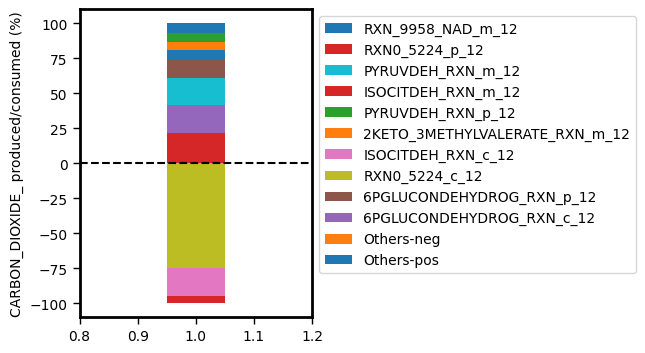

In [84]:
generateMetaboliteBudget(CAM_cyc_model_opt, solution_CAM_cyc, show_plot=True, percentage=True, day_or_night_tag="_12", 
                         metabolite="CARBON_DIOXIDE_", threshold=0.05, colourDict=colourDict_CO2)

Total: 1.5746132478300319


({'Others-pos': 1.0979978476822162e-14,
  'Others-neg': 0.0,
  'PEPCARBOX_RXN_c_12': -93.42920312182518,
  'RXN0_5224_c_12': 93.42920312182515,
  'ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12': -6.570796878174842,
  'RXN0_5224_p_12': 6.570796878174831},
                                              value
 Others-pos                            1.097998e-14
 Others-neg                            0.000000e+00
 PEPCARBOX_RXN_c_12                   -9.342920e+01
 RXN0_5224_c_12                        9.342920e+01
 ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12 -6.570797e+00
 RXN0_5224_p_12                        6.570797e+00)

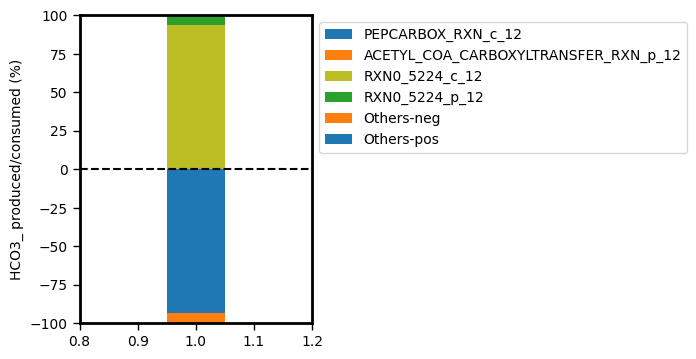

In [85]:
generateMetaboliteBudget(CAM_cyc_model_opt, solution_CAM_cyc, show_plot=True, percentage=True, day_or_night_tag="_12", 
                         metabolite="HCO3_", threshold=0.05, colourDict=colourDict_CO2)

In [86]:
diel_model.reactions.ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12

Reaction identifier,ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12
Name,ACETYL-COA-CARBOXYLTRANSFER-RXN:Acetyl-CoA carboxylase
Memory address,0x7f5f670e7a30
Stoichiometry,ACETYL_COA_p_12 + ATP_p_12 + HCO3_p_12 --> ADP_p_12 + MALONYL_COA_p_12 + PROTON_p_12 + Pi_p_12 ACETYL-COA + ATP + HCO3 --> ADP + MALONYL-COA + PROTON + Pi[p]
GPR,
Lower bound,0.0
Upper bound,1000.0


Main noct. CO2-fixing enzyme is:
- cytosolic CA (74.656%)
- cICDH (19.85%)
- plastidic CA (5.25%)

HCO3 fixing enzymes
    - PEPC c (93.43%)
    - Acetyl_CoA carboxyltransferase (6.57%)

objective flux: 0.07666792062071394

Objective: AraCore_Biomass_tx_total
objective flux: 0.03705030143878233
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.080933
producing HCO3-:	RXN0_5224_c_12	0.080933
producing CO2:	CO2_pc_12	0.307302
consuming CO2:	ISOCITDEH_RXN_c_12	-0.21221
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.010512
producing CO2:	GLUTDECARBOX_RXN_c_12	0.000893
producing CO2:	CO2_mc_12	0.87463
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.314912
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.080933
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.007143
producing CO2:	RXN_9650_p_12	0.007143
producing CO2:	2.3.1.180_RXN_p_12	0.007143
producing CO2:	RXN_9654_p_12	0.007143
consuming CO2:	RXN0_5224_p_12	0.05
producing HCO3-:	RXN0_5224_p_12	0.05
consuming CO2:	CO2_pc_12	0.307302
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.05
producing CO2:	PYRUVDEH_RXN_p_12	0.060472
producing CO2:	RXN_9653_p_12	0.007143
producing CO2:	RXN_7800_p_12	0.003329
producing CO2:	RXN_9651_p_12	0.007143
producing CO2:	R

({'Others-pos': 14.477152957863547,
  'Others-neg': -3.2087291509566955,
  'CO2_tx_12': -77.9789616948599,
  'ISOCITDEH_RXN_m_12': 26.847080280594025,
  '6PGLUCONDEHYDROG_RXN_c_12': 20.20936164859998,
  '6PGLUCONDEHYDROG_RXN_p_12': 15.227465861863697,
  'ISOCITDEH_RXN_c_12': -13.618469097769657,
  '2OXOGLUTARATEDEH_RXN_m_12': 12.425454359140266,
  'PYRUVDEH_RXN_m_12': 10.813484891938485,
  'RXN0_5224_c_12': -5.19384005641375},
                                value
 Others-pos                 14.477153
 Others-neg                 -3.208729
 CO2_tx_12                 -77.978962
 ISOCITDEH_RXN_m_12         26.847080
 6PGLUCONDEHYDROG_RXN_c_12  20.209362
 6PGLUCONDEHYDROG_RXN_p_12  15.227466
 ISOCITDEH_RXN_c_12        -13.618469
 2OXOGLUTARATEDEH_RXN_m_12  12.425454
 PYRUVDEH_RXN_m_12          10.813485
 RXN0_5224_c_12             -5.193840)

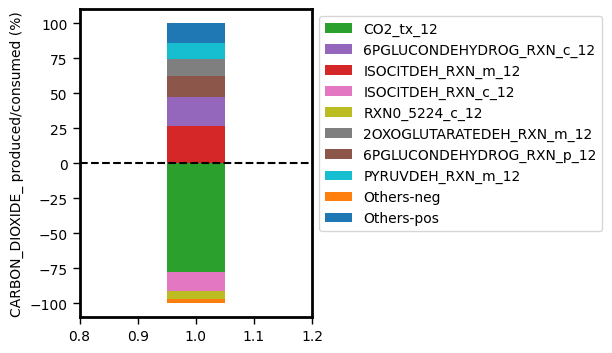

In [87]:
# turn off AcetylCoA carboxylase

CAM_lim_model_x = CAM_cyc_model.copy()

CAM_lim_model_x.reactions.ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12.bounds = (0, 0.05)

model = CAM_lim_model_x

solution_model, model_opt = optimise_model(model, output_string+"_total", pFBA=True)
print("objective flux:", model_opt.reactions.AraCore_Biomass_tx_total.flux)

calculate_noct_CO2_refixation_coefficient(model_opt, verbose=True, threshold = 0.00001, show_noflux = False)

generateMetaboliteBudget(model_opt, solution_model, show_plot=True, percentage=True, day_or_night_tag="_12", 
                         metabolite="CARBON_DIOXIDE_", threshold=0.05, colourDict=colourDict_CO2)


### biomass objective needs AcetylCoA carboxylase to work at night
#flux is always proportional to biomass output


Objective: AraCore_Biomass_tx_total
objective flux: 0.07666792062071486
----- Cytosol -----
consuming CO2:	CO2_pc_12	-1.076759
consuming CO2:	ISOCITDEH_RXN_c_12	-0.392447
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.021753
producing CO2:	GLUTDECARBOX_RXN_c_12	0.001847
producing CO2:	CO2_mc_12	1.039967
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.402468
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.00317
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.004915
producing CO2:	RXN_9652_p_12	0.014781
producing CO2:	RXN_9650_p_12	0.014781
producing CO2:	2.3.1.180_RXN_p_12	0.014781
producing CO2:	RXN_9654_p_12	0.014781
consuming CO2:	RXN0_5224_p_12	1.573711
producing HCO3-:	RXN0_5224_p_12	1.573711
producing CO2:	CO2_pc_12	-1.076759
producing CO2:	1.2.1.2_RXN_p_12	0.001176
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.103465
producing CO2:	PYRUVDEH_RXN_p_12	0.118245
producing CO2:	RXN_9653_p_12	0.014781
producing CO2:	RXN_9651_p_12	0.014781
consuming

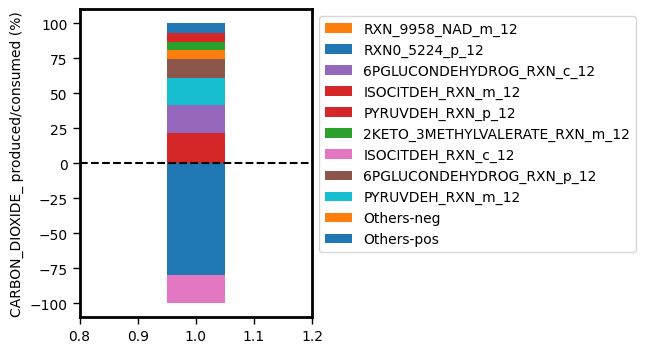

In [88]:
# turn off cytosolic PEPC

CAM_lim_model_1 = CAM_cyc_model.copy()
CAM_lim_model_1.reactions.PEPCARBOX_RXN_c_12.bounds = (0, 0)

model = CAM_lim_model_1

solution_model, model_opt = optimise_model(model, output_string+"_total", pFBA=True)
print("objective flux:", model_opt.reactions.AraCore_Biomass_tx_total.flux)

calculate_noct_CO2_refixation_coefficient(model_opt, verbose=True, threshold = 0.00001, show_noflux = False)

generateMetaboliteBudget(model_opt, solution_model, show_plot=True, percentage=True, day_or_night_tag="_12", 
                         metabolite="CARBON_DIOXIDE_", threshold=0.05, colourDict=colourDict_CO2)

print("sum of fluxes:", calculate_sum_of_all_fluxes(solution_model))
print("photon use:", model_opt.reactions.Photon_tx_00.flux)

Total: 1.573710987668028


({'Others-pos': 0,
  'Others-neg': 0.0,
  'RXN0_5224_p_12': 100.0,
  'PEPCARBOX_RXN_p_12': -93.42543586830632,
  'ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12': -6.5745641316936725},
                                            value
 Others-pos                              0.000000
 Others-neg                              0.000000
 RXN0_5224_p_12                        100.000000
 PEPCARBOX_RXN_p_12                    -93.425436
 ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12   -6.574564)

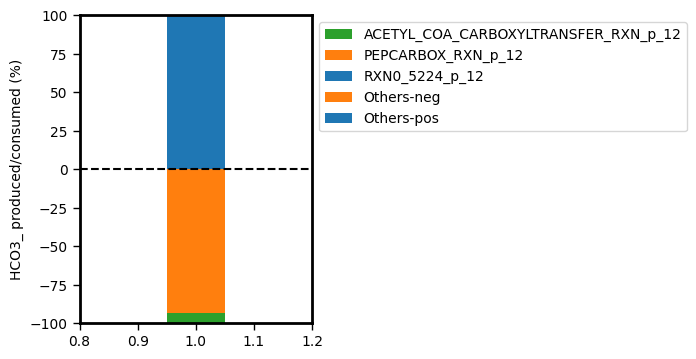

In [89]:
generateMetaboliteBudget(model_opt, solution_model, show_plot=True, percentage=True, day_or_night_tag="_12", 
                         metabolite="HCO3_", threshold=0.05, colourDict=colourDict_CO2)

Total: 1.960633575794419


({'Others-pos': 3.674464351886883,
  'Others-neg': -0.06496772615284208,
  'ASPAMINOTRANS_RXN_p_12': 74.98832865496358,
  'ASPAMINOTRANS_RXN_c_12': -73.7834534563401,
  'ISOCITDEH_RXN_m_12': 21.33720699314953,
  'ISOCITDEH_RXN_c_12': -20.016328706094292,
  'BRANCHED_CHAINAMINOTRANSFERILEU_RXN_m_12': -6.135250111412756},
                                               value
 Others-pos                                 3.674464
 Others-neg                                -0.064968
 ASPAMINOTRANS_RXN_p_12                    74.988329
 ASPAMINOTRANS_RXN_c_12                   -73.783453
 ISOCITDEH_RXN_m_12                        21.337207
 ISOCITDEH_RXN_c_12                       -20.016329
 BRANCHED_CHAINAMINOTRANSFERILEU_RXN_m_12  -6.135250)

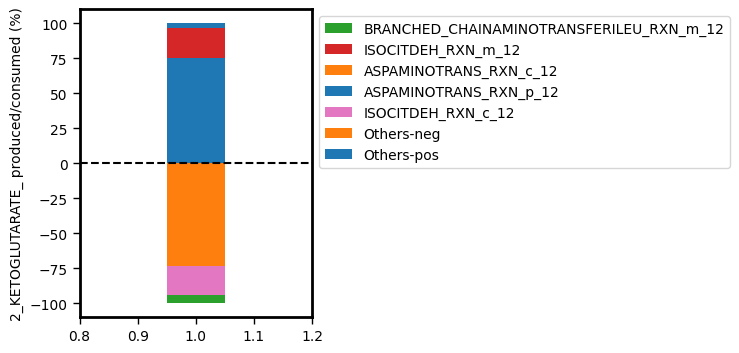

In [90]:
generateMetaboliteBudget(model_opt, solution_model, show_plot=True, percentage=True, day_or_night_tag="_12", 
                         metabolite="2_KETOGLUTARATE_", threshold=0.05, colourDict=colourDict_CO2)

In [91]:
diel_model.reactions.ISOCITDEH_RXN_c_12

Reaction identifier,ISOCITDEH_RXN_c_12
Name,ISOCITDEH-RXN:Isocitrate dehydrogenase (NADP+)
Memory address,0x7f5f66f37820
Stoichiometry,NADP_c_12 + THREO_DS_ISO_CITRATE_c_12 <=> 2_KETOGLUTARATE_c_12 + CARBON_DIOXIDE_c_12 + NADPH_c_12 NADP + THREO-DS-ISO-CITRATE <=> 2-KETOGLUTARATE + CARBON-DIOXIDE + NADPH
GPR,
Lower bound,-1000.0
Upper bound,1000.0


In [92]:
diel_model.reactions.ASPAMINOTRANS_RXN_p_12

Reaction identifier,ASPAMINOTRANS_RXN_p_12
Name,ASPAMINOTRANS-RXN:Aspartate aminotransferase
Memory address,0x7f5f66fc7370
Stoichiometry,2_KETOGLUTARATE_p_12 + L_ASPARTATE_p_12 <=> GLT_p_12 + OXALACETIC_ACID_p_12 2-KETOGLUTARATE + L-ASPARTATE <=> GLT + OXALACETIC_ACID[p]
GPR,
Lower bound,-1000.0
Upper bound,1000.0


Main noct. CO2-fixing enzyme is:
- plastidic CA (79.846%)
- cICDH (19.9118%)

HCO3 fixing enzymes
    - PEPC p (93.425%)
    - Acetyl_CoA carboxyltransferase (6.57%)

objective flux: 0.07666792062071486

In [93]:
diel_model.reactions.PEPCARBOX_RXN_p_12

Reaction identifier,PEPCARBOX_RXN_p_12
Name,PEPCARBOX-RXN:Phosphoenolpyruvate carboxylase
Memory address,0x7f5f66ba9150
Stoichiometry,HCO3_p_12 + PHOSPHO_ENOL_PYRUVATE_p_12 --> OXALACETIC_ACID_p_12 + Pi_p_12 HCO3 + PHOSPHO-ENOL-PYRUVATE --> OXALACETIC_ACID[p] + Pi[p]
GPR,
Lower bound,0.0
Upper bound,1000.0


Objective: AraCore_Biomass_tx_total
objective flux: 0.06408360850736419
----- Cytosol -----
producing CO2:	CO2_pc_12	0.365231
consuming CO2:	ISOCITDEH_RXN_c_12	-0.398241
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.018183
producing CO2:	CO2_mc_12	1.105213
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.004108
producing CO2:	RXN_9652_p_12	0.012355
producing CO2:	RXN_9650_p_12	0.012355
producing CO2:	RXN_5682_p_12	0.00265
producing CO2:	2.3.1.180_RXN_p_12	0.012355
producing CO2:	RXN_9654_p_12	0.012355
consuming CO2:	RXN0_5224_p_12	0.086482
producing HCO3-:	RXN0_5224_p_12	0.086482
consuming CO2:	CO2_pc_12	0.365231
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.086482
producing CO2:	PYRUVDEH_RXN_p_12	0.098836
producing CO2:	RXN_9653_p_12	0.012355
producing CO2:	RXN_9651_p_12	0.012355
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.003985
producing CO2:	RXN_9648_p_12	0.012355
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.258622
producing CO2:	ACETOLACTSYN_RXN_p_12

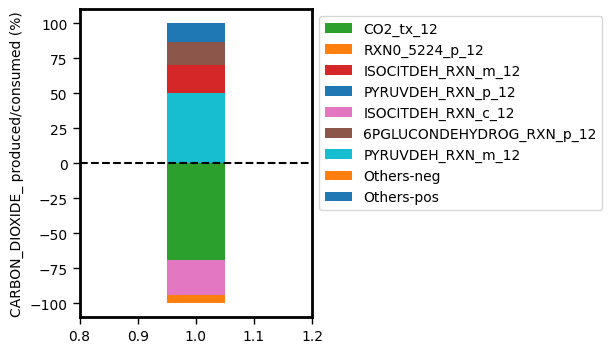

In [94]:
# turn off cytosolic PEPC
# + turn off plastidic PEPC

model.reactions.PEPCARBOX_RXN_p_12.bounds = (0, 0)

solution_model, model_opt = optimise_model(model, output_string+"_total", pFBA=True)
print("objective flux:", model_opt.reactions.AraCore_Biomass_tx_total.flux)

calculate_noct_CO2_refixation_coefficient(model_opt, verbose=True, threshold = 0.00001, show_noflux = False)

generateMetaboliteBudget(model_opt, solution_model, show_plot=True, percentage=True, day_or_night_tag="_12", 
                         metabolite="CARBON_DIOXIDE_", threshold=0.05, colourDict=colourDict_CO2)

print("sum of fluxes:", calculate_sum_of_all_fluxes(solution_model))

Total: 1.579093367122589


({'Others-pos': 0.11846954462516461,
  'Others-neg': -0.00398454120631504,
  'CO2_tx_12': -1.0903854531617385,
  'PYRUVDEH_RXN_m_12': 0.7871322020356372,
  'ISOCITDEH_RXN_c_12': -0.39824147379718444,
  'ISOCITDEH_RXN_m_12': 0.31603349601966246,
  '6PGLUCONDEHYDROG_RXN_p_12': 0.2586216684908673,
  'PYRUVDEH_RXN_p_12': 0.09883645595125745,
  'RXN0_5224_p_12': -0.08648189895735098},
                               value
 Others-pos                 0.118470
 Others-neg                -0.003985
 CO2_tx_12                 -1.090385
 PYRUVDEH_RXN_m_12          0.787132
 ISOCITDEH_RXN_c_12        -0.398241
 ISOCITDEH_RXN_m_12         0.316033
 6PGLUCONDEHYDROG_RXN_p_12  0.258622
 PYRUVDEH_RXN_p_12          0.098836
 RXN0_5224_p_12            -0.086482)

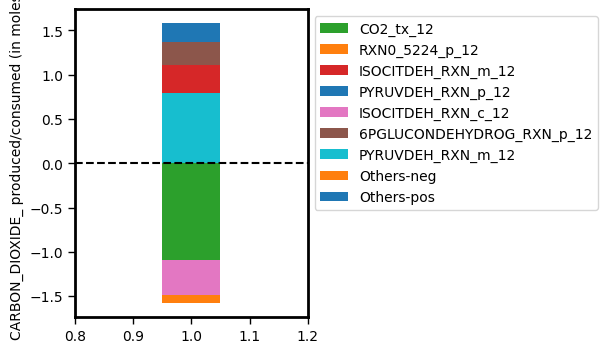

In [95]:
generateMetaboliteBudget(model_opt, solution_model, show_plot=True, percentage=False, day_or_night_tag="_12", 
                         metabolite="CARBON_DIOXIDE_", threshold=0.05, colourDict=colourDict_CO2)

Total: 0.3982414737973048


({'Others-pos': 15.120886782678413,
  'Others-neg': -3.022150531645111e-11,
  'ISOCITDEH_RXN_c_12': -99.99999999996979,
  'ISOCITDEH_RXN_m_12': 79.35725352917808,
  'ASPAMINOTRANS_RXN_c_12': 5.521859688143507},
                                value
 Others-pos              1.512089e+01
 Others-neg             -3.022151e-11
 ISOCITDEH_RXN_c_12     -1.000000e+02
 ISOCITDEH_RXN_m_12      7.935725e+01
 ASPAMINOTRANS_RXN_c_12  5.521860e+00)

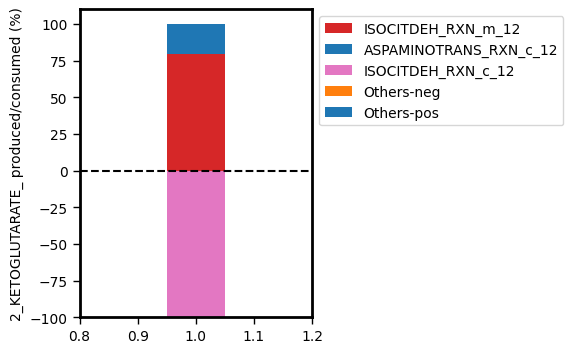

In [96]:
generateMetaboliteBudget(model_opt, solution_model, show_plot=True, percentage=True, day_or_night_tag="_12", 
                         metabolite="2_KETOGLUTARATE_", threshold=0.05, colourDict=colourDict_CO2)

Total: 0.0052466011150429865


({'Others-pos': 1.3347135833717847e-11,
  'Others-neg': -1.7380381905420321,
  'FUMHYDR_RXN_m_12': -15553.041728908122,
  'SUCCINATE_DEHYDROGENASE_UBIQUINONE_RXN_mc_12': 15454.779767098664,
  'ARGSUCCINLYA_RXN_p_12': 75.94519039708742,
  'AMPSYN_RXN_p_12': 24.054809602899248},
                                                      value
 Others-pos                                    1.334714e-11
 Others-neg                                   -1.738038e+00
 FUMHYDR_RXN_m_12                             -1.555304e+04
 SUCCINATE_DEHYDROGENASE_UBIQUINONE_RXN_mc_12  1.545478e+04
 ARGSUCCINLYA_RXN_p_12                         7.594519e+01
 AMPSYN_RXN_p_12                               2.405481e+01)

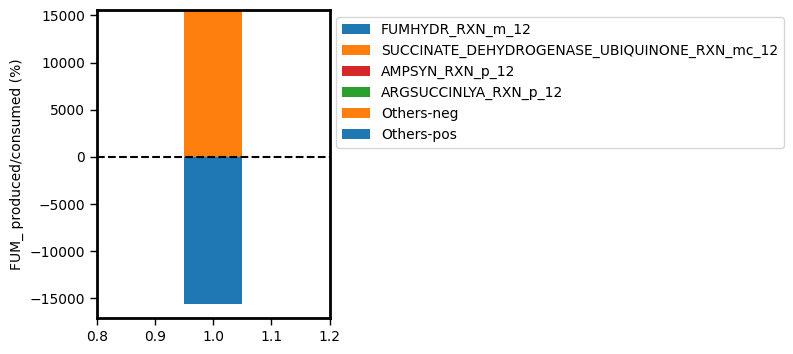

In [97]:
generateMetaboliteBudget(model_opt, solution_model, show_plot=True, percentage=True, day_or_night_tag="_12", 
                         metabolite="FUM_", threshold=0.05, colourDict=colourDict_CO2)

In [98]:
diel_model.reactions.SUCCINATE_DEHYDROGENASE_UBIQUINONE_RXN_mc_12

Reaction identifier,SUCCINATE_DEHYDROGENASE_UBIQUINONE_RXN_mc_12
Name,SUCCINATE-DEHYDROGENASE-UBIQUINONE-RXN:Succinate dehydrogenase (ubiquinone)
Memory address,0x7f5f66e5d600
Stoichiometry,SUC_m_12 + UBIQUINONE_c_12 --> FUM_m_12 + UBIQUINOL_c_12 SUC + UBIQUINONE[mc] --> FUM + UBIQUINOL[mc]
GPR,
Lower bound,0.0
Upper bound,1000.0


In [99]:
for rxn in diel_model.metabolites.GLT_c_12.reactions:
    print(rxn)

GLT_xc_12: GLT_x_12 <=> GLT_c_12
PRO_GLU_mc_12: GLT_c_12 + PRO_m_12 <=> GLT_m_12 + 0.12 PROTON_m_12 + PRO_c_12
ASPAMINOTRANS_RXN_c_12: 2_KETOGLUTARATE_c_12 + L_ASPARTATE_c_12 <=> GLT_c_12 + OXALACETIC_ACID_c_12
2_AMINOADIPATE_AMINOTRANSFERASE_RXN_c_12: 2_KETOGLUTARATE_c_12 + CPD_468_c_12 --> 2K_ADIPATE_c_12 + GLT_c_12
GLN_GLU_pc_12: GLN_p_12 + GLT_c_12 <=> GLN_c_12 + GLT_p_12
ALANINE_AMINOTRANSFERASE_RXN_c_12: 2_KETOGLUTARATE_c_12 + L_ALPHA_ALANINE_c_12 <=> GLT_c_12 + PYRUVATE_c_12
GLT_MAL_pc_12: GLT_p_12 + MAL_c_12 <=> GLT_c_12 + MAL_p_12
L_ASPARTATE_GLU_mc_12: GLT_c_12 + L_ASPARTATE_m_12 <=> GLT_m_12 + L_ASPARTATE_c_12 + 0.02 PROTON_m_12
GLUTDECARBOX_RXN_c_12: GLT_c_12 + PROTON_c_12 --> 4_AMINO_BUTYRATE_c_12 + CARBON_DIOXIDE_c_12
GLT_ce_12: GLT_c_12 + 0.16 PROTON_e_12 <=> GLT_e_12
GLUTKIN_RXN_c_12: ATP_c_12 + GLT_c_12 + 0.16 PROTON_c_12 --> ADP_c_12 + L_GLUTAMATE_5_P_c_12
GLN_GLU_mc_12: GLN_m_12 + GLT_c_12 <=> GLN_c_12 + GLT_m_12 + 0.12 PROTON_m_12
GLU_mc_12: GLT_c_12 + PROTON_c_12 <

In [100]:
diel_model.reactions.FUMHYDR_RXN_m_12

Reaction identifier,FUMHYDR_RXN_m_12
Name,FUMHYDR-RXN:Fumarate hydratase
Memory address,0x7f5f671b5b70
Stoichiometry,FUM_m_12 + WATER_m_12 <=> MAL_m_12 FUM + WATER <=> MAL
GPR,
Lower bound,-1000.0
Upper bound,1000.0


Total: 0.08648189895735098


({'Others-pos': 0,
  'Others-neg': -7.002709774781424e-16,
  'RXN0_5224_p_12': 0.08648189895735098,
  'ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12': -0.08648189895735028},
                                              value
 Others-pos                            0.000000e+00
 Others-neg                           -7.002710e-16
 RXN0_5224_p_12                        8.648190e-02
 ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12 -8.648190e-02)

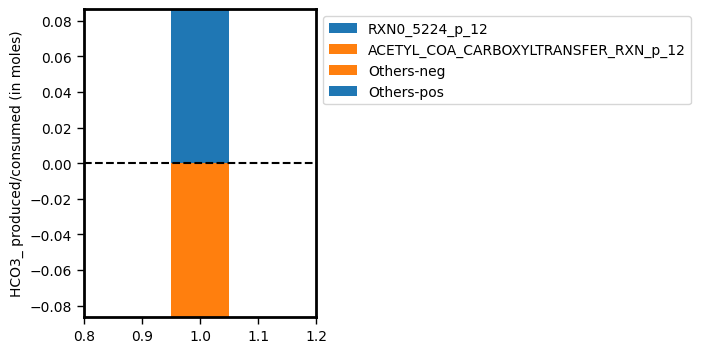

In [101]:
generateMetaboliteBudget(model_opt, solution_model, show_plot=True, percentage=False, day_or_night_tag="_12", 
                         metabolite="HCO3_", threshold=0.05, colourDict=colourDict_CO2)

Main noct. CO2-fixing enzyme is:
- CO2_tx (69.051%)
- cICDH (25.219%)
- p CA (5.4766%)

HCO3 fixing enzymes (0.08648)
    - Acetyl_CoA carboxyltransferase (100%)

objective flux: 0.06408360850736419

In [102]:
diel_model.reactions.ISOCITDEH_RXN_c_12

Reaction identifier,ISOCITDEH_RXN_c_12
Name,ISOCITDEH-RXN:Isocitrate dehydrogenase (NADP+)
Memory address,0x7f5f66f37820
Stoichiometry,NADP_c_12 + THREO_DS_ISO_CITRATE_c_12 <=> 2_KETOGLUTARATE_c_12 + CARBON_DIOXIDE_c_12 + NADPH_c_12 NADP + THREO-DS-ISO-CITRATE <=> 2-KETOGLUTARATE + CARBON-DIOXIDE + NADPH
GPR,
Lower bound,-1000.0
Upper bound,1000.0


Objective: AraCore_Biomass_tx_total
objective flux:  0.06380943226094879
----- Cytosol -----
producing CO2:	CO2_pc_12	0.364563
consuming CO2:	CO2_xc_12	-0.199164
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.018105
producing CO2:	CO2_mc_12	0.930637
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.004091
producing CO2:	RXN_9652_p_12	0.012302
producing CO2:	RXN_9650_p_12	0.012302
producing CO2:	RXN_5682_p_12	0.002639
producing CO2:	2.3.1.180_RXN_p_12	0.012302
producing CO2:	RXN_9654_p_12	0.012302
consuming CO2:	RXN0_5224_p_12	0.086112
producing HCO3-:	RXN0_5224_p_12	0.086112
consuming CO2:	CO2_pc_12	0.364563
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.086112
producing CO2:	PYRUVDEH_RXN_p_12	0.098414
producing CO2:	RXN_9653_p_12	0.012302
producing CO2:	RXN_9651_p_12	0.012302
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.003967
producing CO2:	RXN_9648_p_12	0.012302
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.25841
producing CO2:	ACETOLACTSYN_RXN_p_12	0.00497

({'Others-pos': 7.360942107131897,
  'Others-neg': -0.2475739839729491,
  'CO2_tx_12': -69.52311859471652,
  'PYRUVDEH_RXN_m_12': 38.19711448590707,
  'ISOCITDEH_RXN_x_12': -24.8558736535462,
  'ISOCITDEH_RXN_m_12': 19.74799409614683,
  '6PGLUCONDEHYDROG_RXN_p_12': 16.124945320881853,
  '6PGLUCONDEHYDROG_RXN_x_12': 12.427936826773102,
  'PYRUVDEH_RXN_p_12': 6.1410671631592475,
  'RXN0_5224_p_12': -5.373433767764314},
                                value
 Others-pos                  7.360942
 Others-neg                 -0.247574
 CO2_tx_12                 -69.523119
 PYRUVDEH_RXN_m_12          38.197114
 ISOCITDEH_RXN_x_12        -24.855874
 ISOCITDEH_RXN_m_12         19.747994
 6PGLUCONDEHYDROG_RXN_p_12  16.124945
 6PGLUCONDEHYDROG_RXN_x_12  12.427937
 PYRUVDEH_RXN_p_12           6.141067
 RXN0_5224_p_12             -5.373434)

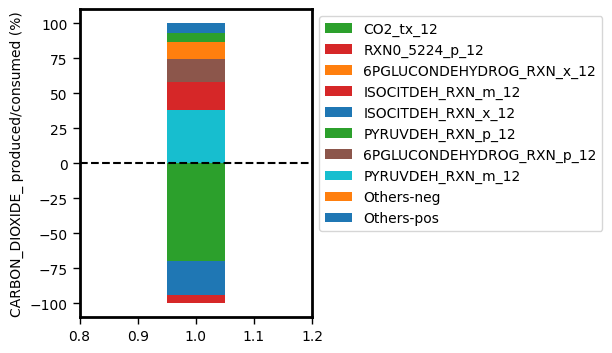

In [103]:
# turn off cytosolic PEPC
# + turn off plastidic PEPC
# + turn off cytosolic ICDH

model.reactions.ISOCITDEH_RXN_c_12.bounds = (0, 1000)


solution_model, model_opt = optimise_model(model, output_string+"_total", pFBA=True)

print("objective flux: ", model_opt.reactions.AraCore_Biomass_tx_total.flux)

calculate_noct_CO2_refixation_coefficient(model_opt, verbose=True, threshold = 0.00001, show_noflux = False)

generateMetaboliteBudget(model_opt, solution_model, show_plot=True, percentage=True, day_or_night_tag="_12", 
                         metabolite="CARBON_DIOXIDE_", threshold=0.05, colourDict=colourDict_CO2)

Main noct. CO2-fixing enzyme is:
- CO2_tx (69.52%)
- x ICDH (24.855%)
- p CA (5.373%)

objective flux:  0.06380943226094879

In [104]:
diel_model.reactions.ISOCITDEH_RXN_x_12

Reaction identifier,ISOCITDEH_RXN_x_12
Name,ISOCITDEH-RXN:Isocitrate dehydrogenase (NADP+)
Memory address,0x7f5f66f36a70
Stoichiometry,NADP_x_12 + THREO_DS_ISO_CITRATE_x_12 <=> 2_KETOGLUTARATE_x_12 + CARBON_DIOXIDE_x_12 + NADPH_x_12 NADP + THREO-DS-ISO-CITRATE <=> 2-KETOGLUTARATE + CARBON-DIOXIDE + NADPH
GPR,
Lower bound,-1000.0
Upper bound,1000.0


Objective: AraCore_Biomass_tx_total
objective flux:  0.06332530281583279
----- Cytosol -----
producing CO2:	CO2_pc_12	0.562624
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.017968
producing CO2:	CO2_mc_12	0.575498
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.00406
producing CO2:	RXN_9652_p_12	0.012208
producing CO2:	RXN_9650_p_12	0.012208
producing CO2:	RXN_5682_p_12	0.002619
producing CO2:	2.3.1.180_RXN_p_12	0.012208
producing CO2:	RXN_9654_p_12	0.012208
consuming CO2:	RXN0_5224_p_12	0.085459
producing HCO3-:	RXN0_5224_p_12	0.085459
consuming CO2:	CO2_pc_12	0.562624
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.085459
producing CO2:	PYRUVDEH_RXN_p_12	0.097667
producing CO2:	RXN_9653_p_12	0.012208
producing CO2:	RXN_9651_p_12	0.012208
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.003937
producing CO2:	RXN_9648_p_12	0.012208
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.457276
producing CO2:	ACETOLACTSYN_RXN_p_12	0.00494
----- Mitochondrion -----
producin

({'Others-pos': 1.0282117736419243,
  'Others-neg': -0.29677616150340397,
  'CO2_tx_12': -87.13888292416028,
  'PYRUVDEH_RXN_m_12': 49.34799584038121,
  '6PGLUCONDEHYDROG_RXN_p_12': 34.46664243656225,
  'PYRUVDEH_RXN_p_12': 7.361526081900975,
  'RXN0_5224_p_12': -6.441335321663322,
  'ISOCITDEH_RXN_m_12': -6.123005592672993,
  'UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12': 1.354288545850281,
  'RXN_9652_p_12': 0.9201907602376246,
  'RXN_9653_p_12': 0.9201907602376246,
  'RXN_9654_p_12': 0.9201907602376241,
  'RXN_9651_p_12': 0.9201907602376241,
  'RXN_9648_p_12': 0.9201907602376235,
  '2.3.1.180_RXN_p_12': 0.9201907602376228,
  'RXN_9650_p_12': 0.9201907602376211},
                                             value
 Others-pos                               1.028212
 Others-neg                              -0.296776
 CO2_tx_12                              -87.138883
 PYRUVDEH_RXN_m_12                       49.347996
 6PGLUCONDEHYDROG_RXN_p_12               34.466642
 PYRUVDEH_RXN_p_12       

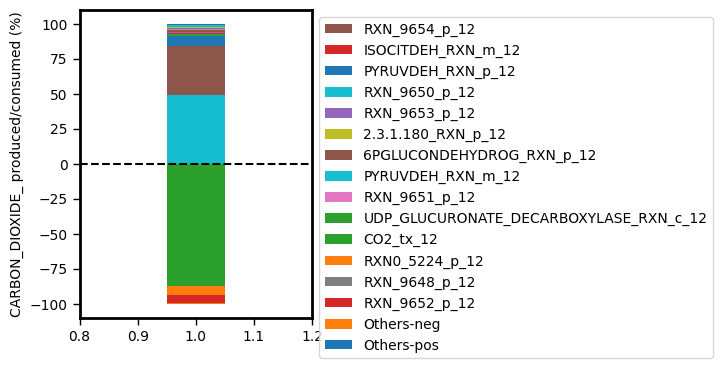

In [105]:
# turn off cytosolic PEPC
# + turn off plastidic PEPC
# + turn of cytosolic ICDH
# + turn of peroxisomal ICDH

model.reactions.ISOCITDEH_RXN_x_12.bounds = (0, 1000)


solution_model, model_opt = optimise_model(model, output_string+"_total", pFBA=True)

print("objective flux: ", model_opt.reactions.AraCore_Biomass_tx_total.flux)

calculate_noct_CO2_refixation_coefficient(model_opt, verbose=True, threshold = 0.00001, show_noflux = False)

generateMetaboliteBudget(model_opt, solution_model, show_plot=True, percentage=True, day_or_night_tag="_12", 
                         metabolite="CARBON_DIOXIDE_", threshold=0.005, colourDict=colourDict_CO2)

Main noct. CO2-fixing enzyme is:
- CO2_tx (87.138%)
- p CA (6.44%)
- m ICDH (6.123%)

objective flux:  0.06332530281583279

In [106]:
diel_model.reactions.ISOCITDEH_RXN_m_12

Reaction identifier,ISOCITDEH_RXN_m_12
Name,ISOCITDEH-RXN:Isocitrate dehydrogenase (NADP+)
Memory address,0x7f5f66f35840
Stoichiometry,NADP_m_12 + THREO_DS_ISO_CITRATE_m_12 <=> 2_KETOGLUTARATE_m_12 + CARBON_DIOXIDE_m_12 + NADPH_m_12 NADP + THREO-DS-ISO-CITRATE <=> 2-KETOGLUTARATE + CARBON-DIOXIDE + NADPH
GPR,
Lower bound,-1000.0
Upper bound,1000.0


Objective: AraCore_Biomass_tx_total
objective flux:  0.06323656698362949
----- Cytosol -----
producing CO2:	CO2_pc_12	0.562422
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.017942
producing CO2:	CO2_mc_12	0.583414
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.004054
producing CO2:	RXN_9652_p_12	0.012191
producing CO2:	RXN_9650_p_12	0.012191
producing CO2:	RXN_5682_p_12	0.002615
producing CO2:	2.3.1.180_RXN_p_12	0.012191
producing CO2:	RXN_9654_p_12	0.012191
consuming CO2:	RXN0_5224_p_12	0.085339
producing HCO3-:	RXN0_5224_p_12	0.085339
consuming CO2:	CO2_pc_12	0.562422
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.085339
producing CO2:	PYRUVDEH_RXN_p_12	0.09753
producing CO2:	RXN_9653_p_12	0.012191
producing CO2:	RXN_9651_p_12	0.012191
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.003932
producing CO2:	RXN_9648_p_12	0.012191
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.457222
producing CO2:	ACETOLACTSYN_RXN_p_12	0.004933
----- Mitochondrion -----
produci

({'Others-pos': 8.76227090185436,
  'Others-neg': -0.2947055260386538,
  'CO2_tx_12': -87.22861615946316,
  'PYRUVDEH_RXN_m_12': 43.577176467710636,
  '6PGLUCONDEHYDROG_RXN_p_12': 34.27010381402735,
  'PYRUVDEH_RXN_p_12': 7.3101640152757446,
  'RXN0_5224_p_12': -6.396393513366256,
  'RXN0_5224_m_12': -6.080284801131904,
  '2KETO_4METHYL_PENTANOATE_DEHYDROG_RXN_m_12': 6.080284801131902},
                                                 value
 Others-pos                                   8.762271
 Others-neg                                  -0.294706
 CO2_tx_12                                  -87.228616
 PYRUVDEH_RXN_m_12                           43.577176
 6PGLUCONDEHYDROG_RXN_p_12                   34.270104
 PYRUVDEH_RXN_p_12                            7.310164
 RXN0_5224_p_12                              -6.396394
 RXN0_5224_m_12                              -6.080285
 2KETO_4METHYL_PENTANOATE_DEHYDROG_RXN_m_12   6.080285)

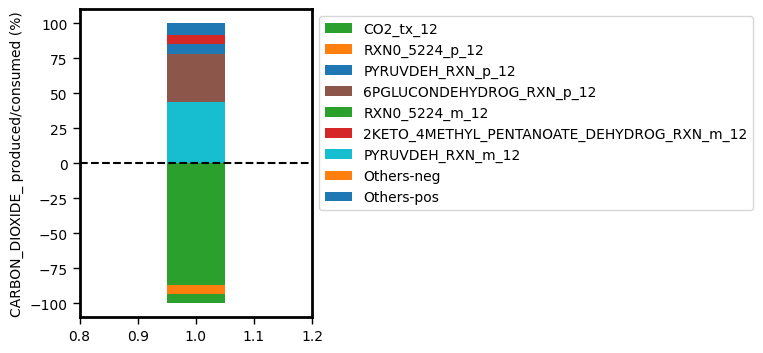

In [107]:
# turn off cytosolic PEPC
# + turn off plastidic PEPC
# + turn off cytosolic ICDH
# + turn off peroxisomal ICDH
# + turn off mitochondrial ICDH

model.reactions.ISOCITDEH_RXN_m_12.bounds = (0, 1000)


solution_model, model_opt = optimise_model(model, output_string+"_total", pFBA=True)

print("objective flux: ", model_opt.reactions.AraCore_Biomass_tx_total.flux)

calculate_noct_CO2_refixation_coefficient(model_opt, verbose=True, threshold = 0.00001, show_noflux = False)

generateMetaboliteBudget(model_opt, solution_model, show_plot=True, percentage=True, day_or_night_tag="_12", 
                         metabolite="CARBON_DIOXIDE_", threshold=0.05, colourDict=colourDict_CO2)

Total: 0.16646017504432642


({'Others-pos': 1.5527719402664076e-13,
  'Others-neg': 0.0,
  'ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12': -51.2667983587709,
  'RXN0_5224_p_12': 51.266798358770735,
  'METHYLCROTONYL_COA_CARBOXYLASE_RXN_m_12': -48.733201641229115,
  'RXN0_5224_m_12': 48.733201641229115},
                                                 value
 Others-pos                               1.552772e-13
 Others-neg                               0.000000e+00
 ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12    -5.126680e+01
 RXN0_5224_p_12                           5.126680e+01
 METHYLCROTONYL_COA_CARBOXYLASE_RXN_m_12 -4.873320e+01
 RXN0_5224_m_12                           4.873320e+01)

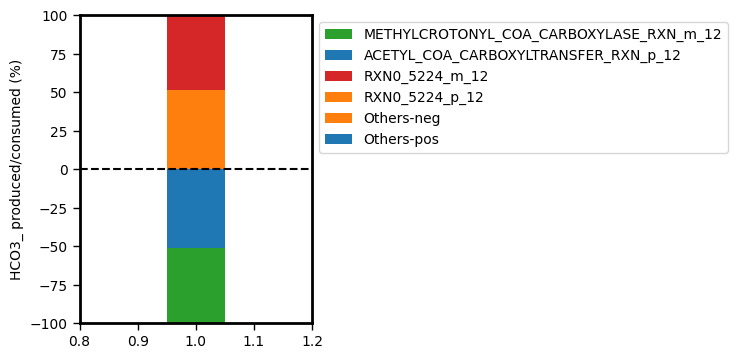

In [108]:
generateMetaboliteBudget(model_opt, solution_model, show_plot=True, percentage=True, day_or_night_tag="_12", 
                         metabolite="HCO3_", threshold=0.05, colourDict=colourDict_CO2)

Main noct. CO2-fixing enzyme is:
- CO2_tx (87.228%)
- p CA (6.396%)
- m CA (6.080%)

HCO3-fixing enzymes (0.16646)
- Acetyl CoA carboxyltransferase p (51.266%)
- METHYLCROTONYL_COA_CARBOXYLASE_RXN_m (48.73%)

objective flux:  0.06323656698362949

In [109]:
diel_model.reactions.METHYLCROTONYL_COA_CARBOXYLASE_RXN_m_12

Reaction identifier,METHYLCROTONYL_COA_CARBOXYLASE_RXN_m_12
Name,METHYLCROTONYL-COA-CARBOXYLASE-RXN:Methylcrotonyl-CoA carboxylase
Memory address,0x7f5f66c6fd90
Stoichiometry,3_METHYL_CROTONYL_COA_m_12 + ATP_m_12 + HCO3_m_12 --> ADP_m_12 + PROTON_m_12 + Pi_m_12 + TRANS_3_METHYL_GLUTACONYL_COA_m_12 3-METHYL-CROTONYL-COA + ATP + HCO3 --> ADP + PROTON + Pi[m] + TRANS-3-METHYL-GLUTACONYL-COA
GPR,
Lower bound,0.0
Upper bound,1000.0


Objective: AraCore_Biomass_tx_total


objective flux:  0.06285814276825805
----- Cytosol -----
producing CO2:	CO2_pc_12	0.543937
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.017835
producing CO2:	CO2_mc_12	0.634795
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.012118
producing CO2:	RXN_9650_p_12	0.012118
producing CO2:	2.3.1.180_RXN_p_12	0.012118
producing CO2:	RXN_9654_p_12	0.012118
consuming CO2:	RXN0_5224_p_12	0.084828
producing HCO3-:	RXN0_5224_p_12	0.084828
consuming CO2:	CO2_pc_12	0.543937
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.084828
producing CO2:	PYRUVDEH_RXN_p_12	0.096946
producing CO2:	RXN_9653_p_12	0.012118
producing CO2:	RXN_9651_p_12	0.012118
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.003908
producing CO2:	RXN_9648_p_12	0.012118
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.450899
----- Mitochondrion -----
producing CO2:	1.2.1.2_RXN_m_12	0.002008
producing CO2:	PYRUVDEH_RXN_m_12	0.632787
consuming CO2:	CO2_mc_12	0.634795
----- Peroxisome -----

CO2 produced: 1.2853
CO2 consumed: 

({'Others-pos': 8.14370331188548,
  'Others-neg': -0.3040794075548738,
  'CO2_tx_12': -93.09607302196832,
  'PYRUVDEH_RXN_m_12': 49.232482102836265,
  '6PGLUCONDEHYDROG_RXN_p_12': 35.081131647590475,
  'PYRUVDEH_RXN_p_12': 7.542682937687787,
  'RXN0_5224_p_12': -6.599847570476816},
                                value
 Others-pos                  8.143703
 Others-neg                 -0.304079
 CO2_tx_12                 -93.096073
 PYRUVDEH_RXN_m_12          49.232482
 6PGLUCONDEHYDROG_RXN_p_12  35.081132
 PYRUVDEH_RXN_p_12           7.542683
 RXN0_5224_p_12             -6.599848)

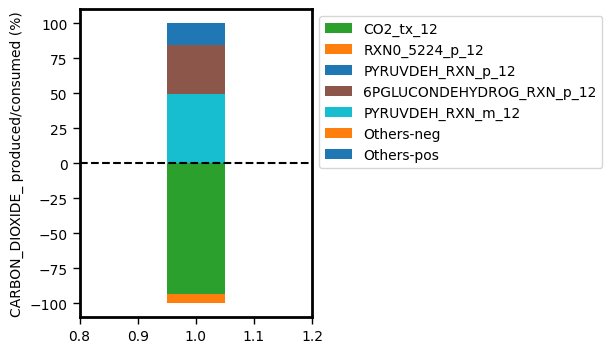

In [110]:
# turn off cytosolic PEPC
# + turn off plastidic PEPC
# + turn off cytosolic ICDH
# + turn off peroxisomal ICDH
# + turn off mitochondrial ICDH
# + turn off mitochondrial Methylcrotonyl CoA carboxylase

model.reactions.METHYLCROTONYL_COA_CARBOXYLASE_RXN_m_12.bounds = (0, 0)


solution_model, model_opt = optimise_model(model, output_string+"_total", pFBA=True)

print("objective flux: ", model_opt.reactions.AraCore_Biomass_tx_total.flux)

calculate_noct_CO2_refixation_coefficient(model_opt, verbose=True, threshold = 0.00001, show_noflux = False)

generateMetaboliteBudget(model_opt, solution_model, show_plot=True, percentage=True, day_or_night_tag="_12", 
                         metabolite="CARBON_DIOXIDE_", threshold=0.05, colourDict=colourDict_CO2)

Total: 0.08482811249473414


({'Others-pos': 0,
  'Others-neg': 0.0,
  'RXN0_5224_p_12': 100.0,
  'ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12': -100.0},
                                       value
 Others-pos                              0.0
 Others-neg                              0.0
 RXN0_5224_p_12                        100.0
 ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12 -100.0)

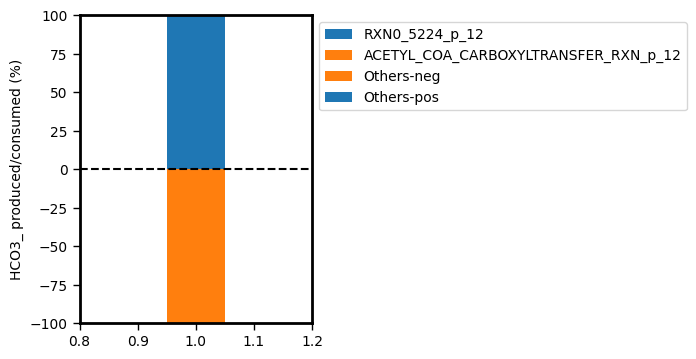

In [111]:
generateMetaboliteBudget(model_opt, solution_model, show_plot=True, percentage=True, day_or_night_tag="_12", 
                         metabolite="HCO3_", threshold=0.05, colourDict=colourDict_CO2)

Main noct. CO2-fixing enzyme is:
- CO2_tx (93.096%)
- p CA (6.59%)

HCO3-fixing enzymes (0.084828)
- Acetyl CoA carboxyltransferase p (100%)

objective flux:  0.06285814276825805

In [112]:
# reference model, CAM allowed
solution_CAM_cyc, CAM_cyc_model_opt = optimise_model(CAM_cyc_model, output_string+"_total", pFBA=True)
calculate_noct_CO2_refixation_coefficient(CAM_cyc_model_opt, verbose=True, threshold = 0.00001, show_noflux = False)

# constraining PEPC_c flux to 0
CO2_limit_model1 = CAM_cyc_model.copy()
CO2_limit_model1.reactions.get_by_id("PEPCARBOX_RXN_c"+night_tag).bounds = (0,0)
solution_CO2_limit1, CO2_limit_model1_opt = optimise_model(CO2_limit_model1, output_string+"_total", pFBA=True)
calculate_noct_CO2_refixation_coefficient(CO2_limit_model1_opt, verbose=True, threshold = 0.00001, show_noflux = False)

df_D1, sol_D1 = parameter_scan_CO2(CO2_limit_model1_opt, output_string+"_total", "CO2_tx"+day_tag, 0, 17, 0.5, pFBA=True, 
                    CO2_refixation_allowed=True, verbose=True, iterations=50)

# also constraining PEPC_p flux to 0
CO2_limit_model2 = CO2_limit_model1.copy()
CO2_limit_model2.reactions.get_by_id("PEPCARBOX_RXN_p"+night_tag).bounds = (0,0)
solution_CO2_limit2, CO2_limit_model2_opt = optimise_model(CO2_limit_model2, output_string+"_total", pFBA=True)
calculate_noct_CO2_refixation_coefficient(CO2_limit_model2_opt, verbose=True, threshold = 0.00001, show_noflux = False)

df_E1, sol_E1 = parameter_scan_CO2(CO2_limit_model2_opt, output_string+"_total", "CO2_tx"+day_tag, 0, 17, 0.5, pFBA=True, 
                    CO2_refixation_allowed=True, verbose=True, iterations=50)

# also constraining ICDH_c flux to 0
CO2_limit_model3 = CO2_limit_model2.copy()
CO2_limit_model3.reactions.get_by_id("ISOCITDEH_RXN_c"+night_tag).bounds = (0,0)
solution_CO2_limit3, CO2_limit_model3_opt = optimise_model(CO2_limit_model3, output_string+"_total", pFBA=True)
calculate_noct_CO2_refixation_coefficient(CO2_limit_model3_opt, verbose=True, threshold = 0.00001, show_noflux = False)

df_F1, sol_F1 = parameter_scan_CO2(CO2_limit_model3_opt, output_string+"_total", "CO2_tx"+day_tag, 0, 17, 0.5, pFBA=True, 
                    CO2_refixation_allowed=True, verbose=True, iterations=50)




Objective: AraCore_Biomass_tx_total
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	1.471149
producing HCO3-:	RXN0_5224_c_12	1.471149
producing CO2:	CO2_pc_12	0.394762
consuming CO2:	ISOCITDEH_RXN_c_12	-0.391173
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.021753
producing CO2:	GLUTDECARBOX_RXN_c_12	0.001847
producing CO2:	CO2_mc_12	1.039596
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.401194
consuming HCO3-:	PEPCARBOX_RXN_c_12	1.471149
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.00317
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.004915
producing CO2:	RXN_9652_p_12	0.014781
producing CO2:	RXN_9650_p_12	0.014781
producing CO2:	2.3.1.180_RXN_p_12	0.014781
producing CO2:	RXN_9654_p_12	0.014781
consuming CO2:	RXN0_5224_p_12	0.103465
producing HCO3-:	RXN0_5224_p_12	0.103465
consuming CO2:	CO2_pc_12	0.394762
producing CO2:	1.2.1.2_RXN_p_12	0.002449
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.103465
producing CO2:	PYRUVDEH_RXN_p_12	0.11824

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 2      Scan value: 0.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0057706
----- Cytosol -----
consuming CO2:	CO2_pc_12	-0.99983
consuming CO2:	ISOCITDEH_RXN_c_12	-0.416395
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.001637
producing CO2:	GLUTDECARBOX_RXN_c_12	0.000139
producing CO2:	CO2_mc_12	0.99706
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.417149
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.000239
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.00037
producing CO2:	RXN_9652_p_12	0.001112
producing CO2:	RXN_9650_p_12	0.001112
producing CO2:	2.3.1.180_RXN_p_12	0.001112
producing CO2:	RXN_9654_p_12	0.001112
consuming CO2:	RXN0_5224_p_12	1.230662
producing HCO3-:	RXN0_5224_p_12	1.230662
producing CO2:	CO2_pc_12	-0.99983
producing CO2:	1.2.1.2_RXN_p_12	8.8e-05
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.007787
producing CO2:	PYRUVDEH_RXN_p_12	0.0089
produci

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 3      Scan value: 1.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0115412
----- Cytosol -----
consuming CO2:	CO2_pc_12	-1.006091
consuming CO2:	ISOCITDEH_RXN_c_12	-0.414446
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.003275
producing CO2:	GLUTDECARBOX_RXN_c_12	0.000278
producing CO2:	CO2_mc_12	1.000553
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.415954
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.000477
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.00074
producing CO2:	RXN_9652_p_12	0.002225
producing CO2:	RXN_9650_p_12	0.002225
producing CO2:	2.3.1.180_RXN_p_12	0.002225
producing CO2:	RXN_9654_p_12	0.002225
consuming CO2:	RXN0_5224_p_12	1.258584
producing HCO3-:	RXN0_5224_p_12	1.258584
producing CO2:	CO2_pc_12	-1.006091
producing CO2:	1.2.1.2_RXN_p_12	0.000177
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.015575
producing CO2:	PYRUVDEH_RXN_p_12	0.0178
pro

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 4      Scan value: 1.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0173117
----- Cytosol -----
consuming CO2:	CO2_pc_12	-1.012353
consuming CO2:	ISOCITDEH_RXN_c_12	-0.412497
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.004912
producing CO2:	GLUTDECARBOX_RXN_c_12	0.000417
producing CO2:	CO2_mc_12	1.004045
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.414759
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.000716
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.00111
producing CO2:	RXN_9652_p_12	0.003337
producing CO2:	RXN_9650_p_12	0.003337
producing CO2:	2.3.1.180_RXN_p_12	0.003337
producing CO2:	RXN_9654_p_12	0.003337
consuming CO2:	RXN0_5224_p_12	1.286506
producing HCO3-:	RXN0_5224_p_12	1.286506
producing CO2:	CO2_pc_12	-1.012353
producing CO2:	1.2.1.2_RXN_p_12	0.000265
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.023362
producing CO2:	PYRUVDEH_RXN_p_12	0.0267
pro

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 5      Scan value: 2.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0230823
----- Cytosol -----
consuming CO2:	CO2_pc_12	-1.018614
consuming CO2:	ISOCITDEH_RXN_c_12	-0.410547
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.006549
producing CO2:	GLUTDECARBOX_RXN_c_12	0.000556
producing CO2:	CO2_mc_12	1.007537
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.413564
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.000954
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.00148
producing CO2:	RXN_9652_p_12	0.00445
producing CO2:	RXN_9650_p_12	0.00445
producing CO2:	2.3.1.180_RXN_p_12	0.00445
producing CO2:	RXN_9654_p_12	0.00445
consuming CO2:	RXN0_5224_p_12	1.314428
producing HCO3-:	RXN0_5224_p_12	1.314428
producing CO2:	CO2_pc_12	-1.018614
producing CO2:	1.2.1.2_RXN_p_12	0.000354
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.03115
producing CO2:	PYRUVDEH_RXN_p_12	0.0356
producin

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 6      Scan value: 2.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0288529
----- Cytosol -----
consuming CO2:	CO2_pc_12	-1.024876
consuming CO2:	ISOCITDEH_RXN_c_12	-0.408598
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.008187
producing CO2:	GLUTDECARBOX_RXN_c_12	0.000695
producing CO2:	CO2_mc_12	1.01103
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.412369
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.001193
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.00185
producing CO2:	RXN_9652_p_12	0.005562
producing CO2:	RXN_9650_p_12	0.005562
producing CO2:	2.3.1.180_RXN_p_12	0.005562
producing CO2:	RXN_9654_p_12	0.005562
consuming CO2:	RXN0_5224_p_12	1.34235
producing HCO3-:	RXN0_5224_p_12	1.34235
producing CO2:	CO2_pc_12	-1.024876
producing CO2:	1.2.1.2_RXN_p_12	0.000442
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.038937
producing CO2:	PYRUVDEH_RXN_p_12	0.0445
produc

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 7      Scan value: 3.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0346235
----- Cytosol -----
consuming CO2:	CO2_pc_12	-1.031137
consuming CO2:	ISOCITDEH_RXN_c_12	-0.406649
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.009824
producing CO2:	GLUTDECARBOX_RXN_c_12	0.000834
producing CO2:	CO2_mc_12	1.014522
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.411174
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.001432
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.00222
producing CO2:	RXN_9652_p_12	0.006675
producing CO2:	RXN_9650_p_12	0.006675
producing CO2:	2.3.1.180_RXN_p_12	0.006675
producing CO2:	RXN_9654_p_12	0.006675
consuming CO2:	RXN0_5224_p_12	1.370272
producing HCO3-:	RXN0_5224_p_12	1.370272
producing CO2:	CO2_pc_12	-1.031137
producing CO2:	1.2.1.2_RXN_p_12	0.000531
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.046725
producing CO2:	PYRUVDEH_RXN_p_12	0.0534
pro

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 8      Scan value: 3.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0403941
----- Cytosol -----
consuming CO2:	CO2_pc_12	-1.037399
consuming CO2:	ISOCITDEH_RXN_c_12	-0.4047
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.011461
producing CO2:	GLUTDECARBOX_RXN_c_12	0.000973
producing CO2:	CO2_mc_12	1.018014
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.409979
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.00167
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.00259
producing CO2:	RXN_9652_p_12	0.007787
producing CO2:	RXN_9650_p_12	0.007787
producing CO2:	2.3.1.180_RXN_p_12	0.007787
producing CO2:	RXN_9654_p_12	0.007787
consuming CO2:	RXN0_5224_p_12	1.398194
producing HCO3-:	RXN0_5224_p_12	1.398194
producing CO2:	CO2_pc_12	-1.037399
producing CO2:	1.2.1.2_RXN_p_12	0.000619
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.054512
producing CO2:	PYRUVDEH_RXN_p_12	0.0623
produc

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 9      Scan value: 4.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0461646
----- Cytosol -----
consuming CO2:	CO2_pc_12	-1.04366
consuming CO2:	ISOCITDEH_RXN_c_12	-0.402751
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.013099
producing CO2:	GLUTDECARBOX_RXN_c_12	0.001112
producing CO2:	CO2_mc_12	1.021507
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.408785
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.001909
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.00296
producing CO2:	RXN_9652_p_12	0.0089
producing CO2:	RXN_9650_p_12	0.0089
producing CO2:	2.3.1.180_RXN_p_12	0.0089
producing CO2:	RXN_9654_p_12	0.0089
consuming CO2:	RXN0_5224_p_12	1.426116
producing HCO3-:	RXN0_5224_p_12	1.426116
producing CO2:	CO2_pc_12	-1.04366
producing CO2:	1.2.1.2_RXN_p_12	0.000708
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.0623
producing CO2:	PYRUVDEH_RXN_p_12	0.0712
producing CO2:	

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 10      Scan value: 4.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0519352
----- Cytosol -----
consuming CO2:	CO2_pc_12	-1.049922
consuming CO2:	ISOCITDEH_RXN_c_12	-0.400801
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.014736
producing CO2:	GLUTDECARBOX_RXN_c_12	0.001251
producing CO2:	CO2_mc_12	1.024999
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.40759
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.002148
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.00333
producing CO2:	RXN_9652_p_12	0.010012
producing CO2:	RXN_9650_p_12	0.010012
producing CO2:	2.3.1.180_RXN_p_12	0.010012
producing CO2:	RXN_9654_p_12	0.010012
consuming CO2:	RXN0_5224_p_12	1.454038
producing HCO3-:	RXN0_5224_p_12	1.454038
producing CO2:	CO2_pc_12	-1.049922
producing CO2:	1.2.1.2_RXN_p_12	0.000796
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.070087
producing CO2:	PYRUVDEH_RXN_p_12	0.0801
pro

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 11      Scan value: 5.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0577058
----- Cytosol -----
consuming CO2:	CO2_pc_12	-1.056183
consuming CO2:	ISOCITDEH_RXN_c_12	-0.398852
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.016373
producing CO2:	GLUTDECARBOX_RXN_c_12	0.00139
producing CO2:	CO2_mc_12	1.028491
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.406395
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.002386
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.0037
producing CO2:	RXN_9652_p_12	0.011125
producing CO2:	RXN_9650_p_12	0.011125
producing CO2:	2.3.1.180_RXN_p_12	0.011125
producing CO2:	RXN_9654_p_12	0.011125
consuming CO2:	RXN0_5224_p_12	1.48196
producing HCO3-:	RXN0_5224_p_12	1.48196
producing CO2:	CO2_pc_12	-1.056183
producing CO2:	1.2.1.2_RXN_p_12	0.000885
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.077875
producing CO2:	PYRUVDEH_RXN_p_12	0.089
produci

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 12      Scan value: 5.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0634764
----- Cytosol -----
consuming CO2:	CO2_pc_12	-1.062445
consuming CO2:	ISOCITDEH_RXN_c_12	-0.396903
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.01801
producing CO2:	GLUTDECARBOX_RXN_c_12	0.001529
producing CO2:	CO2_mc_12	1.031984
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.4052
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.002625
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.00407
producing CO2:	RXN_9652_p_12	0.012237
producing CO2:	RXN_9650_p_12	0.012237
producing CO2:	2.3.1.180_RXN_p_12	0.012237
producing CO2:	RXN_9654_p_12	0.012237
consuming CO2:	RXN0_5224_p_12	1.509881
producing HCO3-:	RXN0_5224_p_12	1.509881
producing CO2:	CO2_pc_12	-1.062445
producing CO2:	1.2.1.2_RXN_p_12	0.000973
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.085662
producing CO2:	PYRUVDEH_RXN_p_12	0.0979
produ

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 13      Scan value: 6.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.069247
----- Cytosol -----
consuming CO2:	CO2_pc_12	-1.068706
consuming CO2:	ISOCITDEH_RXN_c_12	-0.394954
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.019648
producing CO2:	GLUTDECARBOX_RXN_c_12	0.001668
producing CO2:	CO2_mc_12	1.035476
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.404005
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.002863
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.004439
producing CO2:	RXN_9652_p_12	0.01335
producing CO2:	RXN_9650_p_12	0.01335
producing CO2:	2.3.1.180_RXN_p_12	0.01335
producing CO2:	RXN_9654_p_12	0.01335
consuming CO2:	RXN0_5224_p_12	1.537803
producing HCO3-:	RXN0_5224_p_12	1.537803
producing CO2:	CO2_pc_12	-1.068706
producing CO2:	1.2.1.2_RXN_p_12	0.001062
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.09345
producing CO2:	PYRUVDEH_RXN_p_12	0.1068
produci

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 14      Scan value: 6.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0750175
----- Cytosol -----
consuming CO2:	CO2_pc_12	-1.074968
consuming CO2:	ISOCITDEH_RXN_c_12	-0.393004
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.021285
producing CO2:	GLUTDECARBOX_RXN_c_12	0.001807
producing CO2:	CO2_mc_12	1.038968
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.40281
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.003102
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.004809
producing CO2:	RXN_9652_p_12	0.014462
producing CO2:	RXN_9650_p_12	0.014462
producing CO2:	2.3.1.180_RXN_p_12	0.014462
producing CO2:	RXN_9654_p_12	0.014462
consuming CO2:	RXN0_5224_p_12	1.565725
producing HCO3-:	RXN0_5224_p_12	1.565725
producing CO2:	CO2_pc_12	-1.074968
producing CO2:	1.2.1.2_RXN_p_12	0.00115
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.101237
producing CO2:	PYRUVDEH_RXN_p_12	0.1157
pro

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 15      Scan value: 7.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0807881
----- Cytosol -----
consuming CO2:	CO2_pc_12	-1.081229
consuming CO2:	ISOCITDEH_RXN_c_12	-0.391055
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.022922
producing CO2:	GLUTDECARBOX_RXN_c_12	0.001946
producing CO2:	CO2_mc_12	1.042461
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.401615
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.003341
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.005179
producing CO2:	RXN_9652_p_12	0.015575
producing CO2:	RXN_9650_p_12	0.015575
producing CO2:	2.3.1.180_RXN_p_12	0.015575
producing CO2:	RXN_9654_p_12	0.015575
consuming CO2:	RXN0_5224_p_12	1.593647
producing HCO3-:	RXN0_5224_p_12	1.593647
producing CO2:	CO2_pc_12	-1.081229
producing CO2:	1.2.1.2_RXN_p_12	0.001239
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.109025
producing CO2:	PYRUVDEH_RXN_p_12	0.1246
p

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 16      Scan value: 7.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0865587
----- Cytosol -----
consuming CO2:	CO2_pc_12	-1.087491
consuming CO2:	ISOCITDEH_RXN_c_12	-0.389106
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.02456
producing CO2:	GLUTDECARBOX_RXN_c_12	0.002085
producing CO2:	CO2_mc_12	1.045953
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.40042
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.003579
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.005549
producing CO2:	RXN_9652_p_12	0.016687
producing CO2:	RXN_9650_p_12	0.016687
producing CO2:	2.3.1.180_RXN_p_12	0.016687
producing CO2:	RXN_9654_p_12	0.016687
consuming CO2:	RXN0_5224_p_12	1.621569
producing HCO3-:	RXN0_5224_p_12	1.621569
producing CO2:	CO2_pc_12	-1.087491
producing CO2:	1.2.1.2_RXN_p_12	0.001327
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.116812
producing CO2:	PYRUVDEH_RXN_p_12	0.1335
pro

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 17      Scan value: 8.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0923293
----- Cytosol -----
consuming CO2:	CO2_pc_12	-1.099325
consuming CO2:	ISOCITDEH_RXN_c_12	-0.387157
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.026197
producing CO2:	GLUTDECARBOX_RXN_c_12	0.002224
producing CO2:	CO2_mc_12	1.056927
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.401134
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.005919
producing CO2:	RXN_9652_p_12	0.0178
producing CO2:	RXN_9650_p_12	0.0178
producing CO2:	2.3.1.180_RXN_p_12	0.0178
producing CO2:	RXN_9654_p_12	0.0178
consuming CO2:	RXN0_5224_p_12	1.647277
producing HCO3-:	RXN0_5224_p_12	1.647277
producing CO2:	CO2_pc_12	-1.099325
producing CO2:	1.2.1.2_RXN_p_12	0.001416
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.1246
producing CO2:	PYRUVDEH_RXN_p_12	0.1424
producing CO2:	RXN_9653_p_12	0.0178
producing CO2:	RXN_9651_p_12	0.0178
con

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 18      Scan value: 8.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0980999
----- Cytosol -----
consuming CO2:	CO2_pc_12	-1.109701
consuming CO2:	ISOCITDEH_RXN_c_12	-0.385207
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.027834
producing CO2:	GLUTDECARBOX_RXN_c_12	0.002363
producing CO2:	CO2_mc_12	1.064653
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.400058
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.006289
producing CO2:	RXN_9652_p_12	0.018912
producing CO2:	RXN_9650_p_12	0.018912
producing CO2:	2.3.1.180_RXN_p_12	0.018912
producing CO2:	RXN_9654_p_12	0.018912
consuming CO2:	RXN0_5224_p_12	1.673592
producing HCO3-:	RXN0_5224_p_12	1.673592
producing CO2:	CO2_pc_12	-1.109701
producing CO2:	1.2.1.2_RXN_p_12	0.001504
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.132387
producing CO2:	PYRUVDEH_RXN_p_12	0.1513
producing CO2:	RXN_9653_p_12	0.018912
producing CO2:	RXN_9651_p_1

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 19      Scan value: 9.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1038704
----- Cytosol -----
consuming CO2:	CO2_pc_12	-1.116532
consuming CO2:	ISOCITDEH_RXN_c_12	-0.383258
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.029472
producing CO2:	GLUTDECARBOX_RXN_c_12	0.002502
producing CO2:	CO2_mc_12	1.068834
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.398982
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.006659
producing CO2:	RXN_9652_p_12	0.020025
producing CO2:	RXN_9650_p_12	0.020025
producing CO2:	2.3.1.180_RXN_p_12	0.020025
producing CO2:	RXN_9654_p_12	0.020025
consuming CO2:	RXN0_5224_p_12	1.70129
producing HCO3-:	RXN0_5224_p_12	1.70129
producing CO2:	CO2_pc_12	-1.116532
producing CO2:	1.2.1.2_RXN_p_12	0.001593
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.140175
producing CO2:	PYRUVDEH_RXN_p_12	0.1602
producing CO2:	RXN_9653_p_12	0.020025
producing CO2:	RXN_9651_p_12	

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 20      Scan value: 9.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.109641
----- Cytosol -----
consuming CO2:	CO2_pc_12	-1.123363
consuming CO2:	ISOCITDEH_RXN_c_12	-0.381309
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.031109
producing CO2:	GLUTDECARBOX_RXN_c_12	0.002641
producing CO2:	CO2_mc_12	1.073016
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.397906
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.007029
producing CO2:	RXN_9652_p_12	0.021137
producing CO2:	RXN_9650_p_12	0.021137
producing CO2:	2.3.1.180_RXN_p_12	0.021137
producing CO2:	RXN_9654_p_12	0.021137
consuming CO2:	RXN0_5224_p_12	1.728987
producing HCO3-:	RXN0_5224_p_12	1.728987
producing CO2:	CO2_pc_12	-1.123363
producing CO2:	1.2.1.2_RXN_p_12	0.001681
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.147962
producing CO2:	PYRUVDEH_RXN_p_12	0.1691
producing CO2:	RXN_9653_p_12	0.021137
producing CO2:	RXN_9651_p_12

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 21      Scan value: 10.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1154116
----- Cytosol -----
consuming CO2:	CO2_pc_12	-1.130195
consuming CO2:	ISOCITDEH_RXN_c_12	-0.37936
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.032746
producing CO2:	GLUTDECARBOX_RXN_c_12	0.00278
producing CO2:	CO2_mc_12	1.077197
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.396831
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.007399
producing CO2:	RXN_9652_p_12	0.02225
producing CO2:	RXN_9650_p_12	0.02225
producing CO2:	2.3.1.180_RXN_p_12	0.02225
producing CO2:	RXN_9654_p_12	0.02225
consuming CO2:	RXN0_5224_p_12	1.756684
producing HCO3-:	RXN0_5224_p_12	1.756684
producing CO2:	CO2_pc_12	-1.130195
producing CO2:	1.2.1.2_RXN_p_12	0.00177
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.15575
producing CO2:	PYRUVDEH_RXN_p_12	0.178
producing CO2:	RXN_9653_p_12	0.02225
producing CO2:	RXN_9651_p_12	0.02225

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 22      Scan value: 10.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1211822
----- Cytosol -----
consuming CO2:	CO2_pc_12	-1.137026
consuming CO2:	ISOCITDEH_RXN_c_12	-0.37741
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.034384
producing CO2:	GLUTDECARBOX_RXN_c_12	0.002919
producing CO2:	CO2_mc_12	1.081378
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.395755
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.007769
producing CO2:	RXN_9652_p_12	0.023362
producing CO2:	RXN_9650_p_12	0.023362
producing CO2:	2.3.1.180_RXN_p_12	0.023362
producing CO2:	RXN_9654_p_12	0.023362
consuming CO2:	RXN0_5224_p_12	1.784381
producing HCO3-:	RXN0_5224_p_12	1.784381
producing CO2:	CO2_pc_12	-1.137026
producing CO2:	1.2.1.2_RXN_p_12	0.001858
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.163537
producing CO2:	PYRUVDEH_RXN_p_12	0.1869
producing CO2:	RXN_9653_p_12	0.023362
producing CO2:	RXN_9651_p_1

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 23      Scan value: 11.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1243438
----- Cytosol -----
consuming CO2:	CO2_pc_12	-0.840905
consuming CO2:	ISOCITDEH_RXN_c_12	-0.368611
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.035281
producing CO2:	GLUTDECARBOX_RXN_c_12	0.002995
producing CO2:	CO2_mc_12	1.003421
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.388729
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005142
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.007972
producing CO2:	RXN_9652_p_12	0.023972
producing CO2:	RXN_9650_p_12	0.023972
producing CO2:	2.3.1.180_RXN_p_12	0.023972
producing CO2:	RXN_9654_p_12	0.023972
consuming CO2:	RXN0_5224_p_12	1.559782
producing HCO3-:	RXN0_5224_p_12	1.559782
producing CO2:	CO2_pc_12	-0.840905
producing CO2:	1.2.1.2_RXN_p_12	0.001907
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.167804
producing CO2:	PYRUVDEH_RXN_p_12	0.20294

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 24      Scan value: 11.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1260098
----- Cytosol -----
consuming CO2:	CO2_pc_12	-0.423695
consuming CO2:	ISOCITDEH_RXN_c_12	-0.37578
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.035753
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003036
producing CO2:	CO2_mc_12	0.944928
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.39225
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005211
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024293
producing CO2:	RXN_9650_p_12	0.024293
producing CO2:	2.3.1.180_RXN_p_12	0.024293
producing CO2:	RXN_9654_p_12	0.024293
consuming CO2:	RXN0_5224_p_12	1.133366
producing HCO3-:	RXN0_5224_p_12	1.133366
producing CO2:	CO2_pc_12	-0.423695
producing CO2:	1.2.1.2_RXN_p_12	0.001932
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.170052
producing CO2:	PYRUVDEH_RXN_p_12	0.205668
producing CO2:	RXN_9653_p_12	0.024293
producing CO

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 25      Scan value: 12.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1274938
----- Cytosol -----
producing CO2:	CO2_pc_12	0.015937
consuming CO2:	ISOCITDEH_RXN_c_12	-0.375278
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036175
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003071
producing CO2:	CO2_mc_12	0.875999
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.391943
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005272
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024579
producing CO2:	RXN_9650_p_12	0.024579
producing CO2:	2.3.1.180_RXN_p_12	0.024579
producing CO2:	RXN_9654_p_12	0.024579
consuming CO2:	RXN0_5224_p_12	0.699629
producing HCO3-:	RXN0_5224_p_12	0.699629
consuming CO2:	CO2_pc_12	0.015937
producing CO2:	1.2.1.2_RXN_p_12	0.001955
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.172055
producing CO2:	PYRUVDEH_RXN_p_12	0.20809
producing CO2:	RXN_9653_p_12	0.024579
producing CO2

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 26      Scan value: 12.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1283201
----- Cytosol -----
producing CO2:	CO2_pc_12	0.275485
consuming CO2:	ISOCITDEH_RXN_c_12	-0.270483
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036409
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003091
producing CO2:	CO2_mc_12	0.872909
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.338447
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005306
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024739
producing CO2:	RXN_9650_p_12	0.024739
producing CO2:	2.3.1.180_RXN_p_12	0.024739
producing CO2:	RXN_9654_p_12	0.024739
consuming CO2:	RXN0_5224_p_12	0.453474
producing HCO3-:	RXN0_5224_p_12	0.453474
consuming CO2:	CO2_pc_12	0.275485
producing CO2:	1.2.1.2_RXN_p_12	0.0041
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.17317
producing CO2:	PYRUVDEH_RXN_p_12	0.209438
producing CO2:	RXN_9653_p_12	0.024739
producing CO2:	

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 27      Scan value: 13.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1283201
----- Cytosol -----
producing CO2:	CO2_pc_12	0.275485
consuming CO2:	ISOCITDEH_RXN_c_12	-0.270483
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036409
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003091
producing CO2:	CO2_mc_12	0.872909
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.338447
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005306
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024739
producing CO2:	RXN_9650_p_12	0.024739
producing CO2:	2.3.1.180_RXN_p_12	0.024739
producing CO2:	RXN_9654_p_12	0.024739
consuming CO2:	RXN0_5224_p_12	0.453474
producing HCO3-:	RXN0_5224_p_12	0.453474
consuming CO2:	CO2_pc_12	0.275485
producing CO2:	1.2.1.2_RXN_p_12	0.0041
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.17317
producing CO2:	PYRUVDEH_RXN_p_12	0.209438
producing CO2:	RXN_9653_p_12	0.024739
producing CO2:	

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 28      Scan value: 13.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1283201
----- Cytosol -----
producing CO2:	CO2_pc_12	0.275485
consuming CO2:	ISOCITDEH_RXN_c_12	-0.270483
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036409
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003091
producing CO2:	CO2_mc_12	0.872909
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.338447
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005306
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024739
producing CO2:	RXN_9650_p_12	0.024739
producing CO2:	2.3.1.180_RXN_p_12	0.024739
producing CO2:	RXN_9654_p_12	0.024739
consuming CO2:	RXN0_5224_p_12	0.453474
producing HCO3-:	RXN0_5224_p_12	0.453474
consuming CO2:	CO2_pc_12	0.275485
producing CO2:	1.2.1.2_RXN_p_12	0.0041
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.17317
producing CO2:	PYRUVDEH_RXN_p_12	0.209438
producing CO2:	RXN_9653_p_12	0.024739
producing CO2:	

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 29      Scan value: 14.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1283201
----- Cytosol -----
producing CO2:	CO2_pc_12	0.275485
consuming CO2:	ISOCITDEH_RXN_c_12	-0.270483
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036409
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003091
producing CO2:	CO2_mc_12	0.872909
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.338447
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005306
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024739
producing CO2:	RXN_9650_p_12	0.024739
producing CO2:	2.3.1.180_RXN_p_12	0.024739
producing CO2:	RXN_9654_p_12	0.024739
consuming CO2:	RXN0_5224_p_12	0.453474
producing HCO3-:	RXN0_5224_p_12	0.453474
consuming CO2:	CO2_pc_12	0.275485
producing CO2:	1.2.1.2_RXN_p_12	0.0041
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.17317
producing CO2:	PYRUVDEH_RXN_p_12	0.209438
producing CO2:	RXN_9653_p_12	0.024739
producing CO2:	

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 30      Scan value: 14.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1283201
----- Cytosol -----
producing CO2:	CO2_pc_12	0.275485
consuming CO2:	ISOCITDEH_RXN_c_12	-0.270483
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036409
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003091
producing CO2:	CO2_mc_12	0.872909
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.338447
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005306
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024739
producing CO2:	RXN_9650_p_12	0.024739
producing CO2:	2.3.1.180_RXN_p_12	0.024739
producing CO2:	RXN_9654_p_12	0.024739
consuming CO2:	RXN0_5224_p_12	0.453474
producing HCO3-:	RXN0_5224_p_12	0.453474
consuming CO2:	CO2_pc_12	0.275485
producing CO2:	1.2.1.2_RXN_p_12	0.0041
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.17317
producing CO2:	PYRUVDEH_RXN_p_12	0.209438
producing CO2:	RXN_9653_p_12	0.024739
producing CO2:	

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 31      Scan value: 15.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1283201
----- Cytosol -----
producing CO2:	CO2_pc_12	0.275485
consuming CO2:	ISOCITDEH_RXN_c_12	-0.270483
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036409
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003091
producing CO2:	CO2_mc_12	0.872909
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.338447
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005306
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024739
producing CO2:	RXN_9650_p_12	0.024739
producing CO2:	2.3.1.180_RXN_p_12	0.024739
producing CO2:	RXN_9654_p_12	0.024739
consuming CO2:	RXN0_5224_p_12	0.453474
producing HCO3-:	RXN0_5224_p_12	0.453474
consuming CO2:	CO2_pc_12	0.275485
producing CO2:	1.2.1.2_RXN_p_12	0.0041
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.17317
producing CO2:	PYRUVDEH_RXN_p_12	0.209438
producing CO2:	RXN_9653_p_12	0.024739
producing CO2:	

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 32      Scan value: 15.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1283201
----- Cytosol -----
producing CO2:	CO2_pc_12	0.275485
consuming CO2:	ISOCITDEH_RXN_c_12	-0.270483
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036409
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003091
producing CO2:	CO2_mc_12	0.872909
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.338447
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005306
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024739
producing CO2:	RXN_9650_p_12	0.024739
producing CO2:	2.3.1.180_RXN_p_12	0.024739
producing CO2:	RXN_9654_p_12	0.024739
consuming CO2:	RXN0_5224_p_12	0.453474
producing HCO3-:	RXN0_5224_p_12	0.453474
consuming CO2:	CO2_pc_12	0.275485
producing CO2:	1.2.1.2_RXN_p_12	0.0041
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.17317
producing CO2:	PYRUVDEH_RXN_p_12	0.209438
producing CO2:	RXN_9653_p_12	0.024739
producing CO2:	

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 33      Scan value: 16.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1283201
----- Cytosol -----
producing CO2:	CO2_pc_12	0.275485
consuming CO2:	ISOCITDEH_RXN_c_12	-0.270483
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036409
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003091
producing CO2:	CO2_mc_12	0.872909
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.338447
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005306
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024739
producing CO2:	RXN_9650_p_12	0.024739
producing CO2:	2.3.1.180_RXN_p_12	0.024739
producing CO2:	RXN_9654_p_12	0.024739
consuming CO2:	RXN0_5224_p_12	0.453474
producing HCO3-:	RXN0_5224_p_12	0.453474
consuming CO2:	CO2_pc_12	0.275485
producing CO2:	1.2.1.2_RXN_p_12	0.0041
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.17317
producing CO2:	PYRUVDEH_RXN_p_12	0.209438
producing CO2:	RXN_9653_p_12	0.024739
producing CO2:	

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 34      Scan value: 16.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1283201
----- Cytosol -----
producing CO2:	CO2_pc_12	0.275485
consuming CO2:	ISOCITDEH_RXN_c_12	-0.270483
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036409
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003091
producing CO2:	CO2_mc_12	0.872909
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.338447
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005306
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024739
producing CO2:	RXN_9650_p_12	0.024739
producing CO2:	2.3.1.180_RXN_p_12	0.024739
producing CO2:	RXN_9654_p_12	0.024739
consuming CO2:	RXN0_5224_p_12	0.453474
producing HCO3-:	RXN0_5224_p_12	0.453474
consuming CO2:	CO2_pc_12	0.275485
producing CO2:	1.2.1.2_RXN_p_12	0.0041
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.17317
producing CO2:	PYRUVDEH_RXN_p_12	0.209438
producing CO2:	RXN_9653_p_12	0.024739
producing CO2:	

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


Objective: AraCore_Biomass_tx_total
----- Cytosol -----
producing CO2:	CO2_pc_12	0.365231
consuming CO2:	ISOCITDEH_RXN_c_12	-0.398241
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.018183
producing CO2:	CO2_mc_12	1.105213
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.004108
producing CO2:	RXN_9652_p_12	0.012355
producing CO2:	RXN_9650_p_12	0.012355
producing CO2:	RXN_5682_p_12	0.00265
producing CO2:	2.3.1.180_RXN_p_12	0.012355
producing CO2:	RXN_9654_p_12	0.012355
consuming CO2:	RXN0_5224_p_12	0.086482
producing HCO3-:	RXN0_5224_p_12	0.086482
consuming CO2:	CO2_pc_12	0.365231
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.086482
producing CO2:	PYRUVDEH_RXN_p_12	0.098836
producing CO2:	RXN_9653_p_12	0.012355
producing CO2:	RXN_9651_p_12	0.012355
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.003985
producing CO2:	RXN_9648_p_12	0.012355
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.258622
producing CO2:	ACETOLACTSYN_RXN_p_12	0.004999
----- Mitochondrion -----


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 4      Scan value: 1.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0059856
----- Cytosol -----
producing CO2:	CO2_pc_12	0.22394
consuming CO2:	ISOCITDEH_RXN_c_12	-0.416467
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.001698
producing CO2:	CO2_mc_12	1.172199
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.000384
producing CO2:	RXN_9652_p_12	0.001154
producing CO2:	RXN_9650_p_12	0.001154
producing CO2:	RXN_5682_p_12	0.000248
producing CO2:	2.3.1.180_RXN_p_12	0.001154
producing CO2:	RXN_9654_p_12	0.001154
consuming CO2:	RXN0_5224_p_12	0.008078
producing HCO3-:	RXN0_5224_p_12	0.008078
consuming CO2:	CO2_pc_12	0.22394
producing CO2:	1.2.1.2_RXN_p_12	0.000191
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.008078
producing CO2:	PYRUVDEH_RXN_p_12	0.009232
producing CO2:	RXN_9653_p_12	0.001154
producing CO2:	RXN_9651_p_12	0.001154
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.000372


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 5      Scan value: 2.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0116338
----- Cytosol -----
producing CO2:	CO2_pc_12	0.237875
consuming CO2:	ISOCITDEH_RXN_c_12	-0.414695
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.003301
producing CO2:	CO2_mc_12	1.165488
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.000746
producing CO2:	RXN_9652_p_12	0.002243
producing CO2:	RXN_9650_p_12	0.002243
producing CO2:	RXN_5682_p_12	0.000481
producing CO2:	2.3.1.180_RXN_p_12	0.002243
producing CO2:	RXN_9654_p_12	0.002243
consuming CO2:	RXN0_5224_p_12	0.0157
producing HCO3-:	RXN0_5224_p_12	0.0157
consuming CO2:	CO2_pc_12	0.237875
producing CO2:	1.2.1.2_RXN_p_12	0.000372
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.0157
producing CO2:	PYRUVDEH_RXN_p_12	0.017943
producing CO2:	RXN_9653_p_12	0.002243
producing CO2:	RXN_9651_p_12	0.002243
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.000723
prod

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 6      Scan value: 2.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0172821
----- Cytosol -----
producing CO2:	CO2_pc_12	0.25181
consuming CO2:	ISOCITDEH_RXN_c_12	-0.412923
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.004904
producing CO2:	CO2_mc_12	1.158776
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.001108
producing CO2:	RXN_9652_p_12	0.003332
producing CO2:	RXN_9650_p_12	0.003332
producing CO2:	RXN_5682_p_12	0.000715
producing CO2:	2.3.1.180_RXN_p_12	0.003332
producing CO2:	RXN_9654_p_12	0.003332
consuming CO2:	RXN0_5224_p_12	0.023322
producing HCO3-:	RXN0_5224_p_12	0.023322
consuming CO2:	CO2_pc_12	0.25181
producing CO2:	1.2.1.2_RXN_p_12	0.000552
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.023322
producing CO2:	PYRUVDEH_RXN_p_12	0.026654
producing CO2:	RXN_9653_p_12	0.003332
producing CO2:	RXN_9651_p_12	0.003332
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.001075


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 7      Scan value: 3.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0229304
----- Cytosol -----
producing CO2:	CO2_pc_12	0.265013
consuming CO2:	ISOCITDEH_RXN_c_12	-0.411151
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.006506
producing CO2:	CO2_mc_12	1.152798
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.00147
producing CO2:	RXN_9652_p_12	0.004421
producing CO2:	RXN_9650_p_12	0.004421
producing CO2:	RXN_5682_p_12	0.000948
producing CO2:	2.3.1.180_RXN_p_12	0.004421
producing CO2:	RXN_9654_p_12	0.004421
consuming CO2:	RXN0_5224_p_12	0.030945
producing HCO3-:	RXN0_5224_p_12	0.030945
consuming CO2:	CO2_pc_12	0.265013
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.030945
producing CO2:	PYRUVDEH_RXN_p_12	0.035366
producing CO2:	RXN_9653_p_12	0.004421
producing CO2:	RXN_9651_p_12	0.004421
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.001426
producing CO2:	RXN_9648_p_12	0.004421
pr

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 8      Scan value: 3.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0285786
----- Cytosol -----
producing CO2:	CO2_pc_12	0.278768
consuming CO2:	ISOCITDEH_RXN_c_12	-0.409379
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.008109
producing CO2:	CO2_mc_12	1.146267
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.001832
producing CO2:	RXN_9652_p_12	0.00551
producing CO2:	RXN_9650_p_12	0.00551
producing CO2:	RXN_5682_p_12	0.001182
producing CO2:	2.3.1.180_RXN_p_12	0.00551
producing CO2:	RXN_9654_p_12	0.00551
consuming CO2:	RXN0_5224_p_12	0.038567
producing HCO3-:	RXN0_5224_p_12	0.038567
consuming CO2:	CO2_pc_12	0.278768
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.038567
producing CO2:	PYRUVDEH_RXN_p_12	0.044077
producing CO2:	RXN_9653_p_12	0.00551
producing CO2:	RXN_9651_p_12	0.00551
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.001777
producing CO2:	RXN_9648_p_12	0.00551
producin

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 9      Scan value: 4.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0342269
----- Cytosol -----
producing CO2:	CO2_pc_12	0.292523
consuming CO2:	ISOCITDEH_RXN_c_12	-0.407607
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.009711
producing CO2:	CO2_mc_12	1.139736
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.002194
producing CO2:	RXN_9652_p_12	0.006599
producing CO2:	RXN_9650_p_12	0.006599
producing CO2:	RXN_5682_p_12	0.001415
producing CO2:	2.3.1.180_RXN_p_12	0.006599
producing CO2:	RXN_9654_p_12	0.006599
consuming CO2:	RXN0_5224_p_12	0.04619
producing HCO3-:	RXN0_5224_p_12	0.04619
consuming CO2:	CO2_pc_12	0.292523
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.04619
producing CO2:	PYRUVDEH_RXN_p_12	0.052788
producing CO2:	RXN_9653_p_12	0.006599
producing CO2:	RXN_9651_p_12	0.006599
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.002128
producing CO2:	RXN_9648_p_12	0.006599
prod

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 10      Scan value: 4.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0398752
----- Cytosol -----
producing CO2:	CO2_pc_12	0.306278
consuming CO2:	ISOCITDEH_RXN_c_12	-0.405836
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.011314
producing CO2:	CO2_mc_12	1.133205
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.002556
producing CO2:	RXN_9652_p_12	0.007687
producing CO2:	RXN_9650_p_12	0.007687
producing CO2:	RXN_5682_p_12	0.001649
producing CO2:	2.3.1.180_RXN_p_12	0.007687
producing CO2:	RXN_9654_p_12	0.007687
consuming CO2:	RXN0_5224_p_12	0.053812
producing HCO3-:	RXN0_5224_p_12	0.053812
consuming CO2:	CO2_pc_12	0.306278
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.053812
producing CO2:	PYRUVDEH_RXN_p_12	0.0615
producing CO2:	RXN_9653_p_12	0.007687
producing CO2:	RXN_9651_p_12	0.007687
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.002479
producing CO2:	RXN_9648_p_12	0.007687
pr

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 11      Scan value: 5.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0455234
----- Cytosol -----
producing CO2:	CO2_pc_12	0.320033
consuming CO2:	ISOCITDEH_RXN_c_12	-0.404064
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.012917
producing CO2:	CO2_mc_12	1.126674
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.002919
producing CO2:	RXN_9652_p_12	0.008776
producing CO2:	RXN_9650_p_12	0.008776
producing CO2:	RXN_5682_p_12	0.001882
producing CO2:	2.3.1.180_RXN_p_12	0.008776
producing CO2:	RXN_9654_p_12	0.008776
consuming CO2:	RXN0_5224_p_12	0.061435
producing HCO3-:	RXN0_5224_p_12	0.061435
consuming CO2:	CO2_pc_12	0.320033
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.061435
producing CO2:	PYRUVDEH_RXN_p_12	0.070211
producing CO2:	RXN_9653_p_12	0.008776
producing CO2:	RXN_9651_p_12	0.008776
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.002831
producing CO2:	RXN_9648_p_12	0.008776


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 12      Scan value: 5.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0511717
----- Cytosol -----
producing CO2:	CO2_pc_12	0.333787
consuming CO2:	ISOCITDEH_RXN_c_12	-0.402292
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.014519
producing CO2:	CO2_mc_12	1.120143
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.003281
producing CO2:	RXN_9652_p_12	0.009865
producing CO2:	RXN_9650_p_12	0.009865
producing CO2:	RXN_5682_p_12	0.002116
producing CO2:	2.3.1.180_RXN_p_12	0.009865
producing CO2:	RXN_9654_p_12	0.009865
consuming CO2:	RXN0_5224_p_12	0.069057
producing HCO3-:	RXN0_5224_p_12	0.069057
consuming CO2:	CO2_pc_12	0.333787
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.069057
producing CO2:	PYRUVDEH_RXN_p_12	0.078922
producing CO2:	RXN_9653_p_12	0.009865
producing CO2:	RXN_9651_p_12	0.009865
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.003182
producing CO2:	RXN_9648_p_12	0.009865


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 13      Scan value: 6.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0568199
----- Cytosol -----
producing CO2:	CO2_pc_12	0.347542
consuming CO2:	ISOCITDEH_RXN_c_12	-0.40052
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.016122
producing CO2:	CO2_mc_12	1.113612
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.003643
producing CO2:	RXN_9652_p_12	0.010954
producing CO2:	RXN_9650_p_12	0.010954
producing CO2:	RXN_5682_p_12	0.00235
producing CO2:	2.3.1.180_RXN_p_12	0.010954
producing CO2:	RXN_9654_p_12	0.010954
consuming CO2:	RXN0_5224_p_12	0.076679
producing HCO3-:	RXN0_5224_p_12	0.076679
consuming CO2:	CO2_pc_12	0.347542
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.076679
producing CO2:	PYRUVDEH_RXN_p_12	0.087634
producing CO2:	RXN_9653_p_12	0.010954
producing CO2:	RXN_9651_p_12	0.010954
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.003533
producing CO2:	RXN_9648_p_12	0.010954
pr

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 14      Scan value: 6.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0624682
----- Cytosol -----
producing CO2:	CO2_pc_12	0.361297
consuming CO2:	ISOCITDEH_RXN_c_12	-0.398748
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.017724
producing CO2:	CO2_mc_12	1.107081
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.004005
producing CO2:	RXN_9652_p_12	0.012043
producing CO2:	RXN_9650_p_12	0.012043
producing CO2:	RXN_5682_p_12	0.002583
producing CO2:	2.3.1.180_RXN_p_12	0.012043
producing CO2:	RXN_9654_p_12	0.012043
consuming CO2:	RXN0_5224_p_12	0.084302
producing HCO3-:	RXN0_5224_p_12	0.084302
consuming CO2:	CO2_pc_12	0.361297
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.084302
producing CO2:	PYRUVDEH_RXN_p_12	0.096345
producing CO2:	RXN_9653_p_12	0.012043
producing CO2:	RXN_9651_p_12	0.012043
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.003884
producing CO2:	RXN_9648_p_12	0.012043


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 15      Scan value: 7.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0681165
----- Cytosol -----
producing CO2:	CO2_pc_12	0.375052
consuming CO2:	ISOCITDEH_RXN_c_12	-0.396976
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.019327
producing CO2:	CO2_mc_12	1.10055
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.004367
producing CO2:	RXN_9652_p_12	0.013132
producing CO2:	RXN_9650_p_12	0.013132
producing CO2:	RXN_5682_p_12	0.002817
producing CO2:	2.3.1.180_RXN_p_12	0.013132
producing CO2:	RXN_9654_p_12	0.013132
consuming CO2:	RXN0_5224_p_12	0.091924
producing HCO3-:	RXN0_5224_p_12	0.091924
consuming CO2:	CO2_pc_12	0.375052
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.091924
producing CO2:	PYRUVDEH_RXN_p_12	0.105056
producing CO2:	RXN_9653_p_12	0.013132
producing CO2:	RXN_9651_p_12	0.013132
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.004235
producing CO2:	RXN_9648_p_12	0.013132
p

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 16      Scan value: 7.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0737647
----- Cytosol -----
producing CO2:	CO2_pc_12	0.388807
consuming CO2:	ISOCITDEH_RXN_c_12	-0.395205
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.02093
producing CO2:	CO2_mc_12	1.094019
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.004729
producing CO2:	RXN_9652_p_12	0.014221
producing CO2:	RXN_9650_p_12	0.014221
producing CO2:	RXN_5682_p_12	0.00305
producing CO2:	2.3.1.180_RXN_p_12	0.014221
producing CO2:	RXN_9654_p_12	0.014221
consuming CO2:	RXN0_5224_p_12	0.099547
producing HCO3-:	RXN0_5224_p_12	0.099547
consuming CO2:	CO2_pc_12	0.388807
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.099547
producing CO2:	PYRUVDEH_RXN_p_12	0.113768
producing CO2:	RXN_9653_p_12	0.014221
producing CO2:	RXN_9651_p_12	0.014221
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.004586
producing CO2:	RXN_9648_p_12	0.014221
pr

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 17      Scan value: 8.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.079413
----- Cytosol -----
producing CO2:	CO2_pc_12	0.402562
consuming CO2:	ISOCITDEH_RXN_c_12	-0.393433
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.022532
producing CO2:	CO2_mc_12	1.087488
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.005091
producing CO2:	RXN_9652_p_12	0.01531
producing CO2:	RXN_9650_p_12	0.01531
producing CO2:	RXN_5682_p_12	0.003284
producing CO2:	2.3.1.180_RXN_p_12	0.01531
producing CO2:	RXN_9654_p_12	0.01531
consuming CO2:	RXN0_5224_p_12	0.107169
producing HCO3-:	RXN0_5224_p_12	0.107169
consuming CO2:	CO2_pc_12	0.402562
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.107169
producing CO2:	PYRUVDEH_RXN_p_12	0.122479
producing CO2:	RXN_9653_p_12	0.01531
producing CO2:	RXN_9651_p_12	0.01531
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.004938
producing CO2:	RXN_9648_p_12	0.01531
producin

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 18      Scan value: 8.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0850613
----- Cytosol -----
producing CO2:	CO2_pc_12	0.416317
consuming CO2:	ISOCITDEH_RXN_c_12	-0.391661
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.024135
producing CO2:	CO2_mc_12	1.080957
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.005453
producing CO2:	RXN_9652_p_12	0.016399
producing CO2:	RXN_9650_p_12	0.016399
producing CO2:	RXN_5682_p_12	0.003517
producing CO2:	2.3.1.180_RXN_p_12	0.016399
producing CO2:	RXN_9654_p_12	0.016399
consuming CO2:	RXN0_5224_p_12	0.114792
producing HCO3-:	RXN0_5224_p_12	0.114792
consuming CO2:	CO2_pc_12	0.416317
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.114792
producing CO2:	PYRUVDEH_RXN_p_12	0.13119
producing CO2:	RXN_9653_p_12	0.016399
producing CO2:	RXN_9651_p_12	0.016399
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.005289
producing CO2:	RXN_9648_p_12	0.016399
p

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 19      Scan value: 9.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0907095
----- Cytosol -----
producing CO2:	CO2_pc_12	0.430072
consuming CO2:	ISOCITDEH_RXN_c_12	-0.389889
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.025738
producing CO2:	CO2_mc_12	1.074426
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.005815
producing CO2:	RXN_9652_p_12	0.017488
producing CO2:	RXN_9650_p_12	0.017488
producing CO2:	RXN_5682_p_12	0.003751
producing CO2:	2.3.1.180_RXN_p_12	0.017488
producing CO2:	RXN_9654_p_12	0.017488
consuming CO2:	RXN0_5224_p_12	0.122414
producing HCO3-:	RXN0_5224_p_12	0.122414
consuming CO2:	CO2_pc_12	0.430072
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.122414
producing CO2:	PYRUVDEH_RXN_p_12	0.139902
producing CO2:	RXN_9653_p_12	0.017488
producing CO2:	RXN_9651_p_12	0.017488
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.00564
producing CO2:	RXN_9648_p_12	0.017488
p

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 20      Scan value: 9.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0963578
----- Cytosol -----
producing CO2:	CO2_pc_12	0.443826
consuming CO2:	ISOCITDEH_RXN_c_12	-0.388117
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.02734
producing CO2:	CO2_mc_12	1.067895
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.006178
producing CO2:	RXN_9652_p_12	0.018577
producing CO2:	RXN_9650_p_12	0.018577
producing CO2:	RXN_5682_p_12	0.003984
producing CO2:	2.3.1.180_RXN_p_12	0.018577
producing CO2:	RXN_9654_p_12	0.018577
consuming CO2:	RXN0_5224_p_12	0.130036
producing HCO3-:	RXN0_5224_p_12	0.130036
consuming CO2:	CO2_pc_12	0.443826
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.130036
producing CO2:	PYRUVDEH_RXN_p_12	0.148613
producing CO2:	RXN_9653_p_12	0.018577
producing CO2:	RXN_9651_p_12	0.018577
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.005991
producing CO2:	RXN_9648_p_12	0.018577
p

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 21      Scan value: 10.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.102006
----- Cytosol -----
producing CO2:	CO2_pc_12	0.457581
consuming CO2:	ISOCITDEH_RXN_c_12	-0.386345
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.028943
producing CO2:	CO2_mc_12	1.061364
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.00654
producing CO2:	RXN_9652_p_12	0.019666
producing CO2:	RXN_9650_p_12	0.019666
producing CO2:	RXN_5682_p_12	0.004218
producing CO2:	2.3.1.180_RXN_p_12	0.019666
producing CO2:	RXN_9654_p_12	0.019666
consuming CO2:	RXN0_5224_p_12	0.137659
producing HCO3-:	RXN0_5224_p_12	0.137659
consuming CO2:	CO2_pc_12	0.457581
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.137659
producing CO2:	PYRUVDEH_RXN_p_12	0.157324
producing CO2:	RXN_9653_p_12	0.019666
producing CO2:	RXN_9651_p_12	0.019666
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.006342
producing CO2:	RXN_9648_p_12	0.019666
p

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 22      Scan value: 10.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1076543
----- Cytosol -----
producing CO2:	CO2_pc_12	0.471336
consuming CO2:	ISOCITDEH_RXN_c_12	-0.384573
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.030545
producing CO2:	CO2_mc_12	1.054833
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.006902
producing CO2:	RXN_9652_p_12	0.020754
producing CO2:	RXN_9650_p_12	0.020754
producing CO2:	RXN_5682_p_12	0.004452
producing CO2:	2.3.1.180_RXN_p_12	0.020754
producing CO2:	RXN_9654_p_12	0.020754
consuming CO2:	RXN0_5224_p_12	0.145281
producing HCO3-:	RXN0_5224_p_12	0.145281
consuming CO2:	CO2_pc_12	0.471336
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.145281
producing CO2:	PYRUVDEH_RXN_p_12	0.166036
producing CO2:	RXN_9653_p_12	0.020754
producing CO2:	RXN_9651_p_12	0.020754
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.006694
producing CO2:	RXN_9648_p_12	0.020754

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 23      Scan value: 11.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1133026
----- Cytosol -----
producing CO2:	CO2_pc_12	0.485091
consuming CO2:	ISOCITDEH_RXN_c_12	-0.382802
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.032148
producing CO2:	CO2_mc_12	1.048302
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.007264
producing CO2:	RXN_9652_p_12	0.021843
producing CO2:	RXN_9650_p_12	0.021843
producing CO2:	RXN_5682_p_12	0.004685
producing CO2:	2.3.1.180_RXN_p_12	0.021843
producing CO2:	RXN_9654_p_12	0.021843
consuming CO2:	RXN0_5224_p_12	0.152904
producing HCO3-:	RXN0_5224_p_12	0.152904
consuming CO2:	CO2_pc_12	0.485091
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.152904
producing CO2:	PYRUVDEH_RXN_p_12	0.174747
producing CO2:	RXN_9653_p_12	0.021843
producing CO2:	RXN_9651_p_12	0.021843
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.007045
producing CO2:	RXN_9648_p_12	0.021843

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 24      Scan value: 11.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1189508
----- Cytosol -----
producing CO2:	CO2_pc_12	0.498846
consuming CO2:	ISOCITDEH_RXN_c_12	-0.38103
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.033751
producing CO2:	CO2_mc_12	1.041771
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.007626
producing CO2:	RXN_9652_p_12	0.022932
producing CO2:	RXN_9650_p_12	0.022932
producing CO2:	RXN_5682_p_12	0.004919
producing CO2:	2.3.1.180_RXN_p_12	0.022932
producing CO2:	RXN_9654_p_12	0.022932
consuming CO2:	RXN0_5224_p_12	0.160526
producing HCO3-:	RXN0_5224_p_12	0.160526
consuming CO2:	CO2_pc_12	0.498846
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.160526
producing CO2:	PYRUVDEH_RXN_p_12	0.183458
producing CO2:	RXN_9653_p_12	0.022932
producing CO2:	RXN_9651_p_12	0.022932
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.007396
producing CO2:	RXN_9648_p_12	0.022932


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 25      Scan value: 12.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.124353
----- Cytosol -----
producing CO2:	CO2_pc_12	0.50943
consuming CO2:	ISOCITDEH_RXN_c_12	-0.379335
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.035283
producing CO2:	CO2_mc_12	0.87855
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.176188
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005142
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.007972
producing CO2:	RXN_9652_p_12	0.023974
producing CO2:	RXN_9650_p_12	0.023974
producing CO2:	2.3.1.180_RXN_p_12	0.023974
producing CO2:	RXN_9654_p_12	0.023974
consuming CO2:	RXN0_5224_p_12	0.167816
producing HCO3-:	RXN0_5224_p_12	0.167816
consuming CO2:	CO2_pc_12	0.50943
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.167816
producing CO2:	PYRUVDEH_RXN_p_12	0.19179
producing CO2:	RXN_9653_p_12	0.023974
producing CO2:	RXN_9651_p_12	0.023974
consuming CO2:	C

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 26      Scan value: 12.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1277568
----- Cytosol -----
producing CO2:	CO2_pc_12	0.542241
consuming CO2:	ISOCITDEH_RXN_c_12	-0.378267
producing CO2:	CO2_xc_12	0.059876
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036249
producing CO2:	CO2_mc_12	0.802524
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.362428
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005283
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.02463
producing CO2:	RXN_9650_p_12	0.02463
producing CO2:	2.3.1.180_RXN_p_12	0.02463
producing CO2:	RXN_9654_p_12	0.02463
consuming CO2:	RXN0_5224_p_12	0.17241
producing HCO3-:	RXN0_5224_p_12	0.17241
consuming CO2:	CO2_pc_12	0.542241
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.17241
producing CO2:	PYRUVDEH_RXN_p_12	0.208519
producing CO2:	RXN_9653_p_12	0.02463
producing CO2:	RXN_7800_p_12	0.011479
producing CO2:	RXN_9651_p_12	0.0246

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 27      Scan value: 13.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1280979
----- Cytosol -----
producing CO2:	CO2_pc_12	0.551095
consuming CO2:	ISOCITDEH_RXN_c_12	-0.221376
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036346
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003086
producing CO2:	CO2_mc_12	0.97494
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.313904
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005297
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024696
producing CO2:	RXN_9650_p_12	0.024696
producing CO2:	2.3.1.180_RXN_p_12	0.024696
producing CO2:	RXN_9654_p_12	0.024696
consuming CO2:	RXN0_5224_p_12	0.17287
producing HCO3-:	RXN0_5224_p_12	0.17287
consuming CO2:	CO2_pc_12	0.551095
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.17287
producing CO2:	PYRUVDEH_RXN_p_12	0.209076
producing CO2:	RXN_9653_p_12	0.024696
producing CO2:	RXN_7800_p_12	0.01151
producing CO2:	RXN_9

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 28      Scan value: 13.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1280979
----- Cytosol -----
producing CO2:	CO2_pc_12	0.551095
consuming CO2:	ISOCITDEH_RXN_c_12	-0.221376
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036346
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003086
producing CO2:	CO2_mc_12	0.97494
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.313904
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005297
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024696
producing CO2:	RXN_9650_p_12	0.024696
producing CO2:	2.3.1.180_RXN_p_12	0.024696
producing CO2:	RXN_9654_p_12	0.024696
consuming CO2:	RXN0_5224_p_12	0.17287
producing HCO3-:	RXN0_5224_p_12	0.17287
consuming CO2:	CO2_pc_12	0.551095
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.17287
producing CO2:	PYRUVDEH_RXN_p_12	0.209076
producing CO2:	RXN_9653_p_12	0.024696
producing CO2:	RXN_7800_p_12	0.01151
producing CO2:	RXN_9

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 29      Scan value: 14.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1280979
----- Cytosol -----
producing CO2:	CO2_pc_12	0.551095
consuming CO2:	ISOCITDEH_RXN_c_12	-0.221376
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036346
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003086
producing CO2:	CO2_mc_12	0.97494
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.313904
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005297
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024696
producing CO2:	RXN_9650_p_12	0.024696
producing CO2:	2.3.1.180_RXN_p_12	0.024696
producing CO2:	RXN_9654_p_12	0.024696
consuming CO2:	RXN0_5224_p_12	0.17287
producing HCO3-:	RXN0_5224_p_12	0.17287
consuming CO2:	CO2_pc_12	0.551095
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.17287
producing CO2:	PYRUVDEH_RXN_p_12	0.209076
producing CO2:	RXN_9653_p_12	0.024696
producing CO2:	RXN_7800_p_12	0.01151
producing CO2:	RXN_9

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 30      Scan value: 14.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1280979
----- Cytosol -----
producing CO2:	CO2_pc_12	0.551095
consuming CO2:	ISOCITDEH_RXN_c_12	-0.221376
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036346
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003086
producing CO2:	CO2_mc_12	0.97494
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.313904
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005297
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024696
producing CO2:	RXN_9650_p_12	0.024696
producing CO2:	2.3.1.180_RXN_p_12	0.024696
producing CO2:	RXN_9654_p_12	0.024696
consuming CO2:	RXN0_5224_p_12	0.17287
producing HCO3-:	RXN0_5224_p_12	0.17287
consuming CO2:	CO2_pc_12	0.551095
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.17287
producing CO2:	PYRUVDEH_RXN_p_12	0.209076
producing CO2:	RXN_9653_p_12	0.024696
producing CO2:	RXN_7800_p_12	0.01151
producing CO2:	RXN_9

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 31      Scan value: 15.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1280979
----- Cytosol -----
producing CO2:	CO2_pc_12	0.551095
consuming CO2:	ISOCITDEH_RXN_c_12	-0.221376
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036346
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003086
producing CO2:	CO2_mc_12	0.97494
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.313904
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005297
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024696
producing CO2:	RXN_9650_p_12	0.024696
producing CO2:	2.3.1.180_RXN_p_12	0.024696
producing CO2:	RXN_9654_p_12	0.024696
consuming CO2:	RXN0_5224_p_12	0.17287
producing HCO3-:	RXN0_5224_p_12	0.17287
consuming CO2:	CO2_pc_12	0.551095
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.17287
producing CO2:	PYRUVDEH_RXN_p_12	0.209076
producing CO2:	RXN_9653_p_12	0.024696
producing CO2:	RXN_7800_p_12	0.01151
producing CO2:	RXN_9

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 32      Scan value: 15.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1280979
----- Cytosol -----
producing CO2:	CO2_pc_12	0.551095
consuming CO2:	ISOCITDEH_RXN_c_12	-0.221376
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036346
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003086
producing CO2:	CO2_mc_12	0.97494
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.313904
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005297
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024696
producing CO2:	RXN_9650_p_12	0.024696
producing CO2:	2.3.1.180_RXN_p_12	0.024696
producing CO2:	RXN_9654_p_12	0.024696
consuming CO2:	RXN0_5224_p_12	0.17287
producing HCO3-:	RXN0_5224_p_12	0.17287
consuming CO2:	CO2_pc_12	0.551095
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.17287
producing CO2:	PYRUVDEH_RXN_p_12	0.209076
producing CO2:	RXN_9653_p_12	0.024696
producing CO2:	RXN_7800_p_12	0.01151
producing CO2:	RXN_9

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 33      Scan value: 16.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1280979
----- Cytosol -----
producing CO2:	CO2_pc_12	0.551095
consuming CO2:	ISOCITDEH_RXN_c_12	-0.221376
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036346
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003086
producing CO2:	CO2_mc_12	0.97494
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.313904
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005297
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024696
producing CO2:	RXN_9650_p_12	0.024696
producing CO2:	2.3.1.180_RXN_p_12	0.024696
producing CO2:	RXN_9654_p_12	0.024696
consuming CO2:	RXN0_5224_p_12	0.17287
producing HCO3-:	RXN0_5224_p_12	0.17287
consuming CO2:	CO2_pc_12	0.551095
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.17287
producing CO2:	PYRUVDEH_RXN_p_12	0.209076
producing CO2:	RXN_9653_p_12	0.024696
producing CO2:	RXN_7800_p_12	0.01151
producing CO2:	RXN_9

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 34      Scan value: 16.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1280979
----- Cytosol -----
producing CO2:	CO2_pc_12	0.551095
consuming CO2:	ISOCITDEH_RXN_c_12	-0.221376
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036346
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003086
producing CO2:	CO2_mc_12	0.97494
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.313904
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005297
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024696
producing CO2:	RXN_9650_p_12	0.024696
producing CO2:	2.3.1.180_RXN_p_12	0.024696
producing CO2:	RXN_9654_p_12	0.024696
consuming CO2:	RXN0_5224_p_12	0.17287
producing HCO3-:	RXN0_5224_p_12	0.17287
consuming CO2:	CO2_pc_12	0.551095
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.17287
producing CO2:	PYRUVDEH_RXN_p_12	0.209076
producing CO2:	RXN_9653_p_12	0.024696
producing CO2:	RXN_7800_p_12	0.01151
producing CO2:	RXN_9

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


Objective: AraCore_Biomass_tx_total
----- Cytosol -----
producing CO2:	CO2_pc_12	0.364563
consuming CO2:	CO2_xc_12	-0.199164
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.018105
producing CO2:	CO2_mc_12	0.930637
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.004091
producing CO2:	RXN_9652_p_12	0.012302
producing CO2:	RXN_9650_p_12	0.012302
producing CO2:	RXN_5682_p_12	0.002639
producing CO2:	2.3.1.180_RXN_p_12	0.012302
producing CO2:	RXN_9654_p_12	0.012302
consuming CO2:	RXN0_5224_p_12	0.086112
producing HCO3-:	RXN0_5224_p_12	0.086112
consuming CO2:	CO2_pc_12	0.364563
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.086112
producing CO2:	PYRUVDEH_RXN_p_12	0.098414
producing CO2:	RXN_9653_p_12	0.012302
producing CO2:	RXN_9651_p_12	0.012302
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.003967
producing CO2:	RXN_9648_p_12	0.012302
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.25841
producing CO2:	ACETOLACTSYN_RXN_p_12	0.004978
----- Mitochondrion -----
producing

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 4      Scan value: 1.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0056989
----- Cytosol -----
producing CO2:	CO2_pc_12	0.22305
consuming CO2:	CO2_xc_12	-0.208278
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.001617
producing CO2:	CO2_mc_12	0.989825
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.000365
producing CO2:	RXN_9652_p_12	0.001099
producing CO2:	RXN_9650_p_12	0.001099
producing CO2:	RXN_5682_p_12	0.000236
producing CO2:	2.3.1.180_RXN_p_12	0.001099
producing CO2:	RXN_9654_p_12	0.001099
consuming CO2:	RXN0_5224_p_12	0.007691
producing HCO3-:	RXN0_5224_p_12	0.007691
consuming CO2:	CO2_pc_12	0.22305
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.007691
producing CO2:	PYRUVDEH_RXN_p_12	0.008789
producing CO2:	RXN_9653_p_12	0.001099
producing CO2:	RXN_9651_p_12	0.001099
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.000354
producing CO2:	RXN_9648_p_12	0.001099
producing CO

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 5      Scan value: 2.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0113483
----- Cytosol -----
producing CO2:	CO2_pc_12	0.236808
consuming CO2:	CO2_xc_12	-0.207392
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.00322
producing CO2:	CO2_mc_12	0.984071
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.000728
producing CO2:	RXN_9652_p_12	0.002188
producing CO2:	RXN_9650_p_12	0.002188
producing CO2:	RXN_5682_p_12	0.000469
producing CO2:	2.3.1.180_RXN_p_12	0.002188
producing CO2:	RXN_9654_p_12	0.002188
consuming CO2:	RXN0_5224_p_12	0.015315
producing HCO3-:	RXN0_5224_p_12	0.015315
consuming CO2:	CO2_pc_12	0.236808
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.015315
producing CO2:	PYRUVDEH_RXN_p_12	0.017503
producing CO2:	RXN_9653_p_12	0.002188
producing CO2:	RXN_9651_p_12	0.002188
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.000706
producing CO2:	RXN_9648_p_12	0.002188
producing C

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 6      Scan value: 2.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0169978
----- Cytosol -----
producing CO2:	CO2_pc_12	0.250566
consuming CO2:	CO2_xc_12	-0.206506
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.004823
producing CO2:	CO2_mc_12	0.978317
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.00109
producing CO2:	RXN_9652_p_12	0.003277
producing CO2:	RXN_9650_p_12	0.003277
producing CO2:	RXN_5682_p_12	0.000703
producing CO2:	2.3.1.180_RXN_p_12	0.003277
producing CO2:	RXN_9654_p_12	0.003277
consuming CO2:	RXN0_5224_p_12	0.022939
producing HCO3-:	RXN0_5224_p_12	0.022939
consuming CO2:	CO2_pc_12	0.250566
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.022939
producing CO2:	PYRUVDEH_RXN_p_12	0.026216
producing CO2:	RXN_9653_p_12	0.003277
producing CO2:	RXN_9651_p_12	0.003277
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.001057
producing CO2:	RXN_9648_p_12	0.003277
producing C

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 7      Scan value: 3.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0226473
----- Cytosol -----
producing CO2:	CO2_pc_12	0.264324
consuming CO2:	CO2_xc_12	-0.20562
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.006426
producing CO2:	CO2_mc_12	0.972563
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.001452
producing CO2:	RXN_9652_p_12	0.004366
producing CO2:	RXN_9650_p_12	0.004366
producing CO2:	RXN_5682_p_12	0.000936
producing CO2:	2.3.1.180_RXN_p_12	0.004366
producing CO2:	RXN_9654_p_12	0.004366
consuming CO2:	RXN0_5224_p_12	0.030563
producing HCO3-:	RXN0_5224_p_12	0.030563
consuming CO2:	CO2_pc_12	0.264324
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.030563
producing CO2:	PYRUVDEH_RXN_p_12	0.034929
producing CO2:	RXN_9653_p_12	0.004366
producing CO2:	RXN_9651_p_12	0.004366
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.001408
producing CO2:	RXN_9648_p_12	0.004366
producing C

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 8      Scan value: 3.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0282968
----- Cytosol -----
producing CO2:	CO2_pc_12	0.278082
consuming CO2:	CO2_xc_12	-0.204734
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.008029
producing CO2:	CO2_mc_12	0.966808
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.001814
producing CO2:	RXN_9652_p_12	0.005455
producing CO2:	RXN_9650_p_12	0.005455
producing CO2:	RXN_5682_p_12	0.00117
producing CO2:	2.3.1.180_RXN_p_12	0.005455
producing CO2:	RXN_9654_p_12	0.005455
consuming CO2:	RXN0_5224_p_12	0.038187
producing HCO3-:	RXN0_5224_p_12	0.038187
consuming CO2:	CO2_pc_12	0.278082
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.038187
producing CO2:	PYRUVDEH_RXN_p_12	0.043642
producing CO2:	RXN_9653_p_12	0.005455
producing CO2:	RXN_9651_p_12	0.005455
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.001759
producing CO2:	RXN_9648_p_12	0.005455
producing C

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 9      Scan value: 4.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0339463
----- Cytosol -----
producing CO2:	CO2_pc_12	0.29184
consuming CO2:	CO2_xc_12	-0.203848
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.009632
producing CO2:	CO2_mc_12	0.961054
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.002176
producing CO2:	RXN_9652_p_12	0.006544
producing CO2:	RXN_9650_p_12	0.006544
producing CO2:	RXN_5682_p_12	0.001404
producing CO2:	2.3.1.180_RXN_p_12	0.006544
producing CO2:	RXN_9654_p_12	0.006544
consuming CO2:	RXN0_5224_p_12	0.045811
producing HCO3-:	RXN0_5224_p_12	0.045811
consuming CO2:	CO2_pc_12	0.29184
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.045811
producing CO2:	PYRUVDEH_RXN_p_12	0.052355
producing CO2:	RXN_9653_p_12	0.006544
producing CO2:	RXN_9651_p_12	0.006544
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.002111
producing CO2:	RXN_9648_p_12	0.006544
producing CO

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 10      Scan value: 4.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0395958
----- Cytosol -----
producing CO2:	CO2_pc_12	0.305597
consuming CO2:	CO2_xc_12	-0.202962
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.011235
producing CO2:	CO2_mc_12	0.9553
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.002539
producing CO2:	RXN_9652_p_12	0.007634
producing CO2:	RXN_9650_p_12	0.007634
producing CO2:	RXN_5682_p_12	0.001637
producing CO2:	2.3.1.180_RXN_p_12	0.007634
producing CO2:	RXN_9654_p_12	0.007634
consuming CO2:	RXN0_5224_p_12	0.053435
producing HCO3-:	RXN0_5224_p_12	0.053435
consuming CO2:	CO2_pc_12	0.305597
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.053435
producing CO2:	PYRUVDEH_RXN_p_12	0.061069
producing CO2:	RXN_9653_p_12	0.007634
producing CO2:	RXN_9651_p_12	0.007634
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.002462
producing CO2:	RXN_9648_p_12	0.007634
producing C

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 11      Scan value: 5.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0452452
----- Cytosol -----
producing CO2:	CO2_pc_12	0.319355
consuming CO2:	CO2_xc_12	-0.202076
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.012838
producing CO2:	CO2_mc_12	0.949546
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.002901
producing CO2:	RXN_9652_p_12	0.008723
producing CO2:	RXN_9650_p_12	0.008723
producing CO2:	RXN_5682_p_12	0.001871
producing CO2:	2.3.1.180_RXN_p_12	0.008723
producing CO2:	RXN_9654_p_12	0.008723
consuming CO2:	RXN0_5224_p_12	0.061059
producing HCO3-:	RXN0_5224_p_12	0.061059
consuming CO2:	CO2_pc_12	0.319355
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.061059
producing CO2:	PYRUVDEH_RXN_p_12	0.069782
producing CO2:	RXN_9653_p_12	0.008723
producing CO2:	RXN_9651_p_12	0.008723
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.002813
producing CO2:	RXN_9648_p_12	0.008723
producing

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 12      Scan value: 5.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0508947
----- Cytosol -----
producing CO2:	CO2_pc_12	0.333113
consuming CO2:	CO2_xc_12	-0.201189
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.014441
producing CO2:	CO2_mc_12	0.943791
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.003263
producing CO2:	RXN_9652_p_12	0.009812
producing CO2:	RXN_9650_p_12	0.009812
producing CO2:	RXN_5682_p_12	0.002105
producing CO2:	2.3.1.180_RXN_p_12	0.009812
producing CO2:	RXN_9654_p_12	0.009812
consuming CO2:	RXN0_5224_p_12	0.068683
producing HCO3-:	RXN0_5224_p_12	0.068683
consuming CO2:	CO2_pc_12	0.333113
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.068683
producing CO2:	PYRUVDEH_RXN_p_12	0.078495
producing CO2:	RXN_9653_p_12	0.009812
producing CO2:	RXN_9651_p_12	0.009812
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.003164
producing CO2:	RXN_9648_p_12	0.009812
producing

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 13      Scan value: 6.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0565442
----- Cytosol -----
producing CO2:	CO2_pc_12	0.346871
consuming CO2:	CO2_xc_12	-0.200303
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.016044
producing CO2:	CO2_mc_12	0.938037
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.003625
producing CO2:	RXN_9652_p_12	0.010901
producing CO2:	RXN_9650_p_12	0.010901
producing CO2:	RXN_5682_p_12	0.002338
producing CO2:	2.3.1.180_RXN_p_12	0.010901
producing CO2:	RXN_9654_p_12	0.010901
consuming CO2:	RXN0_5224_p_12	0.076307
producing HCO3-:	RXN0_5224_p_12	0.076307
consuming CO2:	CO2_pc_12	0.346871
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.076307
producing CO2:	PYRUVDEH_RXN_p_12	0.087208
producing CO2:	RXN_9653_p_12	0.010901
producing CO2:	RXN_9651_p_12	0.010901
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.003516
producing CO2:	RXN_9648_p_12	0.010901
producing

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 14      Scan value: 6.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0621937
----- Cytosol -----
producing CO2:	CO2_pc_12	0.360629
consuming CO2:	CO2_xc_12	-0.199417
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.017647
producing CO2:	CO2_mc_12	0.932283
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.003987
producing CO2:	RXN_9652_p_12	0.01199
producing CO2:	RXN_9650_p_12	0.01199
producing CO2:	RXN_5682_p_12	0.002572
producing CO2:	2.3.1.180_RXN_p_12	0.01199
producing CO2:	RXN_9654_p_12	0.01199
consuming CO2:	RXN0_5224_p_12	0.083931
producing HCO3-:	RXN0_5224_p_12	0.083931
consuming CO2:	CO2_pc_12	0.360629
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.083931
producing CO2:	PYRUVDEH_RXN_p_12	0.095922
producing CO2:	RXN_9653_p_12	0.01199
producing CO2:	RXN_9651_p_12	0.01199
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.003867
producing CO2:	RXN_9648_p_12	0.01199
producing CO2:	6

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 15      Scan value: 7.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0678432
----- Cytosol -----
producing CO2:	CO2_pc_12	0.374387
consuming CO2:	CO2_xc_12	-0.198531
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.01925
producing CO2:	CO2_mc_12	0.926529
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.004349
producing CO2:	RXN_9652_p_12	0.013079
producing CO2:	RXN_9650_p_12	0.013079
producing CO2:	RXN_5682_p_12	0.002805
producing CO2:	2.3.1.180_RXN_p_12	0.013079
producing CO2:	RXN_9654_p_12	0.013079
consuming CO2:	RXN0_5224_p_12	0.091555
producing HCO3-:	RXN0_5224_p_12	0.091555
consuming CO2:	CO2_pc_12	0.374387
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.091555
producing CO2:	PYRUVDEH_RXN_p_12	0.104635
producing CO2:	RXN_9653_p_12	0.013079
producing CO2:	RXN_9651_p_12	0.013079
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.004218
producing CO2:	RXN_9648_p_12	0.013079
producing 

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 16      Scan value: 7.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0734926
----- Cytosol -----
producing CO2:	CO2_pc_12	0.388144
consuming CO2:	CO2_xc_12	-0.197645
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.020852
producing CO2:	CO2_mc_12	0.920774
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.004712
producing CO2:	RXN_9652_p_12	0.014169
producing CO2:	RXN_9650_p_12	0.014169
producing CO2:	RXN_5682_p_12	0.003039
producing CO2:	2.3.1.180_RXN_p_12	0.014169
producing CO2:	RXN_9654_p_12	0.014169
consuming CO2:	RXN0_5224_p_12	0.09918
producing HCO3-:	RXN0_5224_p_12	0.09918
consuming CO2:	CO2_pc_12	0.388144
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.09918
producing CO2:	PYRUVDEH_RXN_p_12	0.113348
producing CO2:	RXN_9653_p_12	0.014169
producing CO2:	RXN_9651_p_12	0.014169
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.00457
producing CO2:	RXN_9648_p_12	0.014169
producing CO2

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 17      Scan value: 8.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0791421
----- Cytosol -----
producing CO2:	CO2_pc_12	0.401902
consuming CO2:	CO2_xc_12	-0.196759
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.022455
producing CO2:	CO2_mc_12	0.91502
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.005074
producing CO2:	RXN_9652_p_12	0.015258
producing CO2:	RXN_9650_p_12	0.015258
producing CO2:	RXN_5682_p_12	0.003273
producing CO2:	2.3.1.180_RXN_p_12	0.015258
producing CO2:	RXN_9654_p_12	0.015258
consuming CO2:	RXN0_5224_p_12	0.106804
producing HCO3-:	RXN0_5224_p_12	0.106804
consuming CO2:	CO2_pc_12	0.401902
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.106804
producing CO2:	PYRUVDEH_RXN_p_12	0.122061
producing CO2:	RXN_9653_p_12	0.015258
producing CO2:	RXN_9651_p_12	0.015258
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.004921
producing CO2:	RXN_9648_p_12	0.015258
producing 

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 18      Scan value: 8.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0847916
----- Cytosol -----
producing CO2:	CO2_pc_12	0.41566
consuming CO2:	CO2_xc_12	-0.195873
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.024058
producing CO2:	CO2_mc_12	0.909266
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.005436
producing CO2:	RXN_9652_p_12	0.016347
producing CO2:	RXN_9650_p_12	0.016347
producing CO2:	RXN_5682_p_12	0.003506
producing CO2:	2.3.1.180_RXN_p_12	0.016347
producing CO2:	RXN_9654_p_12	0.016347
consuming CO2:	RXN0_5224_p_12	0.114428
producing HCO3-:	RXN0_5224_p_12	0.114428
consuming CO2:	CO2_pc_12	0.41566
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.114428
producing CO2:	PYRUVDEH_RXN_p_12	0.130775
producing CO2:	RXN_9653_p_12	0.016347
producing CO2:	RXN_9651_p_12	0.016347
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.005272
producing CO2:	RXN_9648_p_12	0.016347
producing C

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 19      Scan value: 9.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0904411
----- Cytosol -----
producing CO2:	CO2_pc_12	0.429418
consuming CO2:	CO2_xc_12	-0.194987
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.025661
producing CO2:	CO2_mc_12	0.903512
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.005798
producing CO2:	RXN_9652_p_12	0.017436
producing CO2:	RXN_9650_p_12	0.017436
producing CO2:	RXN_5682_p_12	0.00374
producing CO2:	2.3.1.180_RXN_p_12	0.017436
producing CO2:	RXN_9654_p_12	0.017436
consuming CO2:	RXN0_5224_p_12	0.122052
producing HCO3-:	RXN0_5224_p_12	0.122052
consuming CO2:	CO2_pc_12	0.429418
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.122052
producing CO2:	PYRUVDEH_RXN_p_12	0.139488
producing CO2:	RXN_9653_p_12	0.017436
producing CO2:	RXN_9651_p_12	0.017436
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.005623
producing CO2:	RXN_9648_p_12	0.017436
producing 

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 20      Scan value: 9.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0960906
----- Cytosol -----
producing CO2:	CO2_pc_12	0.443176
consuming CO2:	CO2_xc_12	-0.1941
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.027264
producing CO2:	CO2_mc_12	0.897757
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.00616
producing CO2:	RXN_9652_p_12	0.018525
producing CO2:	RXN_9650_p_12	0.018525
producing CO2:	RXN_5682_p_12	0.003973
producing CO2:	2.3.1.180_RXN_p_12	0.018525
producing CO2:	RXN_9654_p_12	0.018525
consuming CO2:	RXN0_5224_p_12	0.129676
producing HCO3-:	RXN0_5224_p_12	0.129676
consuming CO2:	CO2_pc_12	0.443176
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.129676
producing CO2:	PYRUVDEH_RXN_p_12	0.148201
producing CO2:	RXN_9653_p_12	0.018525
producing CO2:	RXN_9651_p_12	0.018525
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.005975
producing CO2:	RXN_9648_p_12	0.018525
producing CO

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 21      Scan value: 10.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1017401
----- Cytosol -----
producing CO2:	CO2_pc_12	0.456934
consuming CO2:	CO2_xc_12	-0.193214
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.028867
producing CO2:	CO2_mc_12	0.892003
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.006523
producing CO2:	RXN_9652_p_12	0.019614
producing CO2:	RXN_9650_p_12	0.019614
producing CO2:	RXN_5682_p_12	0.004207
producing CO2:	2.3.1.180_RXN_p_12	0.019614
producing CO2:	RXN_9654_p_12	0.019614
consuming CO2:	RXN0_5224_p_12	0.1373
producing HCO3-:	RXN0_5224_p_12	0.1373
consuming CO2:	CO2_pc_12	0.456934
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.1373
producing CO2:	PYRUVDEH_RXN_p_12	0.156914
producing CO2:	RXN_9653_p_12	0.019614
producing CO2:	RXN_9651_p_12	0.019614
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.006326
producing CO2:	RXN_9648_p_12	0.019614
producing CO2:

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 22      Scan value: 10.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1073895
----- Cytosol -----
producing CO2:	CO2_pc_12	0.470691
consuming CO2:	CO2_xc_12	-0.192328
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.03047
producing CO2:	CO2_mc_12	0.886249
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.006885
producing CO2:	RXN_9652_p_12	0.020703
producing CO2:	RXN_9650_p_12	0.020703
producing CO2:	RXN_5682_p_12	0.004441
producing CO2:	2.3.1.180_RXN_p_12	0.020703
producing CO2:	RXN_9654_p_12	0.020703
consuming CO2:	RXN0_5224_p_12	0.144924
producing HCO3-:	RXN0_5224_p_12	0.144924
consuming CO2:	CO2_pc_12	0.470691
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.144924
producing CO2:	PYRUVDEH_RXN_p_12	0.165627
producing CO2:	RXN_9653_p_12	0.020703
producing CO2:	RXN_9651_p_12	0.020703
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.006677
producing CO2:	RXN_9648_p_12	0.020703
producing

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 23      Scan value: 11.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.113039
----- Cytosol -----
producing CO2:	CO2_pc_12	0.484449
consuming CO2:	CO2_xc_12	-0.191442
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.032073
producing CO2:	CO2_mc_12	0.880495
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.007247
producing CO2:	RXN_9652_p_12	0.021793
producing CO2:	RXN_9650_p_12	0.021793
producing CO2:	RXN_5682_p_12	0.004674
producing CO2:	2.3.1.180_RXN_p_12	0.021793
producing CO2:	RXN_9654_p_12	0.021793
consuming CO2:	RXN0_5224_p_12	0.152548
producing HCO3-:	RXN0_5224_p_12	0.152548
consuming CO2:	CO2_pc_12	0.484449
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.152548
producing CO2:	PYRUVDEH_RXN_p_12	0.174341
producing CO2:	RXN_9653_p_12	0.021793
producing CO2:	RXN_9651_p_12	0.021793
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.007028
producing CO2:	RXN_9648_p_12	0.021793
producing

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 24      Scan value: 11.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1186885
----- Cytosol -----
producing CO2:	CO2_pc_12	0.498207
consuming CO2:	CO2_xc_12	-0.190556
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.033676
producing CO2:	CO2_mc_12	0.87474
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.007609
producing CO2:	RXN_9652_p_12	0.022882
producing CO2:	RXN_9650_p_12	0.022882
producing CO2:	RXN_5682_p_12	0.004908
producing CO2:	2.3.1.180_RXN_p_12	0.022882
producing CO2:	RXN_9654_p_12	0.022882
consuming CO2:	RXN0_5224_p_12	0.160172
producing HCO3-:	RXN0_5224_p_12	0.160172
consuming CO2:	CO2_pc_12	0.498207
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.160172
producing CO2:	PYRUVDEH_RXN_p_12	0.183054
producing CO2:	RXN_9653_p_12	0.022882
producing CO2:	RXN_9651_p_12	0.022882
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.00738
producing CO2:	RXN_9648_p_12	0.022882
producing 

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 25      Scan value: 12.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.124338
----- Cytosol -----
producing CO2:	CO2_pc_12	0.511965
consuming CO2:	CO2_xc_12	-0.18967
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.035279
producing CO2:	CO2_mc_12	0.868986
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.007971
producing CO2:	RXN_9652_p_12	0.023971
producing CO2:	RXN_9650_p_12	0.023971
producing CO2:	RXN_5682_p_12	0.005142
producing CO2:	2.3.1.180_RXN_p_12	0.023971
producing CO2:	RXN_9654_p_12	0.023971
consuming CO2:	RXN0_5224_p_12	0.167796
producing HCO3-:	RXN0_5224_p_12	0.167796
consuming CO2:	CO2_pc_12	0.511965
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.167796
producing CO2:	PYRUVDEH_RXN_p_12	0.191767
producing CO2:	RXN_9653_p_12	0.023971
producing CO2:	RXN_9651_p_12	0.023971
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.007731
producing CO2:	RXN_9648_p_12	0.023971
producing 

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 26      Scan value: 12.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1277568
----- Cytosol -----
producing CO2:	CO2_pc_12	0.601728
consuming CO2:	CO2_xc_12	-0.129258
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036249
producing CO2:	CO2_mc_12	0.743038
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.173294
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005283
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.02463
producing CO2:	RXN_9650_p_12	0.02463
producing CO2:	2.3.1.180_RXN_p_12	0.02463
producing CO2:	RXN_9654_p_12	0.02463
consuming CO2:	RXN0_5224_p_12	0.17241
producing HCO3-:	RXN0_5224_p_12	0.17241
consuming CO2:	CO2_pc_12	0.601728
producing CO2:	1.2.1.2_RXN_p_12	0.059486
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.17241
producing CO2:	PYRUVDEH_RXN_p_12	0.208519
producing CO2:	RXN_9653_p_12	0.02463
producing CO2:	RXN_7800_p_12	0.011479
producing CO2:	RXN_9651_p_12	0.02463


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 27      Scan value: 13.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1280979
----- Cytosol -----
producing CO2:	CO2_pc_12	0.551095
consuming CO2:	CO2_xc_12	-0.110688
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036346
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003086
producing CO2:	CO2_mc_12	0.97494
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.203216
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005297
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024696
producing CO2:	RXN_9650_p_12	0.024696
producing CO2:	2.3.1.180_RXN_p_12	0.024696
producing CO2:	RXN_9654_p_12	0.024696
consuming CO2:	RXN0_5224_p_12	0.17287
producing HCO3-:	RXN0_5224_p_12	0.17287
consuming CO2:	CO2_pc_12	0.551095
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.17287
producing CO2:	PYRUVDEH_RXN_p_12	0.209076
producing CO2:	RXN_9653_p_12	0.024696
producing CO2:	RXN_7800_p_12	0.01151
producing CO2:	RXN_9651_p_12	

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 28      Scan value: 13.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1280979
----- Cytosol -----
producing CO2:	CO2_pc_12	0.551095
consuming CO2:	CO2_xc_12	-0.110688
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036346
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003086
producing CO2:	CO2_mc_12	0.97494
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.203216
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005297
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024696
producing CO2:	RXN_9650_p_12	0.024696
producing CO2:	2.3.1.180_RXN_p_12	0.024696
producing CO2:	RXN_9654_p_12	0.024696
consuming CO2:	RXN0_5224_p_12	0.17287
producing HCO3-:	RXN0_5224_p_12	0.17287
consuming CO2:	CO2_pc_12	0.551095
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.17287
producing CO2:	PYRUVDEH_RXN_p_12	0.209076
producing CO2:	RXN_9653_p_12	0.024696
producing CO2:	RXN_7800_p_12	0.01151
producing CO2:	RXN_9651_p_12	

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 29      Scan value: 14.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1280979
----- Cytosol -----
producing CO2:	CO2_pc_12	0.551095
consuming CO2:	CO2_xc_12	-0.110688
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036346
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003086
producing CO2:	CO2_mc_12	0.97494
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.203216
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005297
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024696
producing CO2:	RXN_9650_p_12	0.024696
producing CO2:	2.3.1.180_RXN_p_12	0.024696
producing CO2:	RXN_9654_p_12	0.024696
consuming CO2:	RXN0_5224_p_12	0.17287
producing HCO3-:	RXN0_5224_p_12	0.17287
consuming CO2:	CO2_pc_12	0.551095
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.17287
producing CO2:	PYRUVDEH_RXN_p_12	0.209076
producing CO2:	RXN_9653_p_12	0.024696
producing CO2:	RXN_7800_p_12	0.01151
producing CO2:	RXN_9651_p_12	

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 30      Scan value: 14.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1280979
----- Cytosol -----
producing CO2:	CO2_pc_12	0.551095
consuming CO2:	CO2_xc_12	-0.110688
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036346
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003086
producing CO2:	CO2_mc_12	0.97494
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.203216
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005297
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024696
producing CO2:	RXN_9650_p_12	0.024696
producing CO2:	2.3.1.180_RXN_p_12	0.024696
producing CO2:	RXN_9654_p_12	0.024696
consuming CO2:	RXN0_5224_p_12	0.17287
producing HCO3-:	RXN0_5224_p_12	0.17287
consuming CO2:	CO2_pc_12	0.551095
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.17287
producing CO2:	PYRUVDEH_RXN_p_12	0.209076
producing CO2:	RXN_9653_p_12	0.024696
producing CO2:	RXN_7800_p_12	0.01151
producing CO2:	RXN_9651_p_12	

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 31      Scan value: 15.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1280979
----- Cytosol -----
producing CO2:	CO2_pc_12	0.551095
consuming CO2:	CO2_xc_12	-0.110688
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036346
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003086
producing CO2:	CO2_mc_12	0.97494
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.203216
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005297
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024696
producing CO2:	RXN_9650_p_12	0.024696
producing CO2:	2.3.1.180_RXN_p_12	0.024696
producing CO2:	RXN_9654_p_12	0.024696
consuming CO2:	RXN0_5224_p_12	0.17287
producing HCO3-:	RXN0_5224_p_12	0.17287
consuming CO2:	CO2_pc_12	0.551095
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.17287
producing CO2:	PYRUVDEH_RXN_p_12	0.209076
producing CO2:	RXN_9653_p_12	0.024696
producing CO2:	RXN_7800_p_12	0.01151
producing CO2:	RXN_9651_p_12	

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 32      Scan value: 15.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1280979
----- Cytosol -----
producing CO2:	CO2_pc_12	0.551095
consuming CO2:	CO2_xc_12	-0.110688
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036346
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003086
producing CO2:	CO2_mc_12	0.97494
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.203216
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005297
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024696
producing CO2:	RXN_9650_p_12	0.024696
producing CO2:	2.3.1.180_RXN_p_12	0.024696
producing CO2:	RXN_9654_p_12	0.024696
consuming CO2:	RXN0_5224_p_12	0.17287
producing HCO3-:	RXN0_5224_p_12	0.17287
consuming CO2:	CO2_pc_12	0.551095
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.17287
producing CO2:	PYRUVDEH_RXN_p_12	0.209076
producing CO2:	RXN_9653_p_12	0.024696
producing CO2:	RXN_7800_p_12	0.01151
producing CO2:	RXN_9651_p_12	

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 33      Scan value: 16.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1280979
----- Cytosol -----
producing CO2:	CO2_pc_12	0.551095
consuming CO2:	CO2_xc_12	-0.110688
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036346
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003086
producing CO2:	CO2_mc_12	0.97494
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.203216
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005297
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024696
producing CO2:	RXN_9650_p_12	0.024696
producing CO2:	2.3.1.180_RXN_p_12	0.024696
producing CO2:	RXN_9654_p_12	0.024696
consuming CO2:	RXN0_5224_p_12	0.17287
producing HCO3-:	RXN0_5224_p_12	0.17287
consuming CO2:	CO2_pc_12	0.551095
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.17287
producing CO2:	PYRUVDEH_RXN_p_12	0.209076
producing CO2:	RXN_9653_p_12	0.024696
producing CO2:	RXN_7800_p_12	0.01151
producing CO2:	RXN_9651_p_12	

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 34      Scan value: 16.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1280979
----- Cytosol -----
producing CO2:	CO2_pc_12	0.551095
consuming CO2:	CO2_xc_12	-0.110688
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036346
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003086
producing CO2:	CO2_mc_12	0.97494
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.203216
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005297
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024696
producing CO2:	RXN_9650_p_12	0.024696
producing CO2:	2.3.1.180_RXN_p_12	0.024696
producing CO2:	RXN_9654_p_12	0.024696
consuming CO2:	RXN0_5224_p_12	0.17287
producing HCO3-:	RXN0_5224_p_12	0.17287
consuming CO2:	CO2_pc_12	0.551095
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.17287
producing CO2:	PYRUVDEH_RXN_p_12	0.209076
producing CO2:	RXN_9653_p_12	0.024696
producing CO2:	RXN_7800_p_12	0.01151
producing CO2:	RXN_9651_p_12	

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


In [113]:
# also constraining ICDH_x flux to 0
CO2_limit_model4 = CO2_limit_model3.copy()
CO2_limit_model4.reactions.get_by_id("ISOCITDEH_RXN_x"+night_tag).bounds = (0,0)
solution_CO2_limit4, CO2_limit_model4_opt = optimise_model(CO2_limit_model4, output_string+"_total", pFBA=True)
calculate_noct_CO2_refixation_coefficient(CO2_limit_model4_opt, verbose=True, threshold = 0.00001, show_noflux = True)

df_G1, sol_G1 = parameter_scan_CO2(CO2_limit_model4_opt, output_string+"_total", "CO2_tx"+day_tag, 0, 17, 0.5, pFBA=True,
                    CO2_refixation_allowed=True, verbose=True, iterations=50)

Objective: AraCore_Biomass_tx_total
----- Cytosol -----
not consuming/producing CO2:	UREASE_RXN_c_12	0.0
not consuming/producing CO2:	4_HYDROXYPHENYLPYRUVATE_DIOXYGENASE_RXN_c_12	0.0
not consuming/producing CO2:	RXN0_5224_c_12	0.0
not consuming/producing HCO3-:	RXN0_5224_c_12	0.0
producing CO2:	CO2_pc_12	0.562624
not consuming/producing CO2:	ISOCITDEH_RXN_c_12	0.0
not consuming/producing CO2:	PEPCARBOXYKIN_RXN_c_12	0.0
not consuming/producing CO2:	CO2_xc_12	0.0
not consuming/producing CO2:	MALIC_NADP_RXN_c_12	0.0
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.017968
not consuming/producing CO2:	GLUTDECARBOX_RXN_c_12	0.0
producing CO2:	CO2_mc_12	0.575498
not consuming/producing CO2:	PREPHENATEDEHYDROG_RXN_c_12	0.0
not consuming/producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.0
not consuming/producing HCO3-:	PEPCARBOX_RXN_c_12	0.0
not consuming/producing CO2:	IPP_biosynthesis_c_12	0.0
not consuming/producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	2.5842356534728033e-12
not cons

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 5      Scan value: 2.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0108442
----- Cytosol -----
producing CO2:	CO2_pc_12	0.443052
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.003077
producing CO2:	CO2_mc_12	0.614259
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.000695
producing CO2:	RXN_9652_p_12	0.002091
producing CO2:	RXN_9650_p_12	0.002091
producing CO2:	RXN_5682_p_12	0.000448
producing CO2:	2.3.1.180_RXN_p_12	0.002091
producing CO2:	RXN_9654_p_12	0.002091
consuming CO2:	RXN0_5224_p_12	0.014634
producing HCO3-:	RXN0_5224_p_12	0.014634
consuming CO2:	CO2_pc_12	0.443052
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.014634
producing CO2:	PYRUVDEH_RXN_p_12	0.016725
producing CO2:	RXN_9653_p_12	0.002091
producing CO2:	RXN_9651_p_12	0.002091
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.000674
producing CO2:	RXN_9648_p_12	0.002091
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.42

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 6      Scan value: 2.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0164958
----- Cytosol -----
producing CO2:	CO2_pc_12	0.455928
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.00468
producing CO2:	CO2_mc_12	0.610085
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.001058
producing CO2:	RXN_9652_p_12	0.00318
producing CO2:	RXN_9650_p_12	0.00318
producing CO2:	RXN_5682_p_12	0.000682
producing CO2:	2.3.1.180_RXN_p_12	0.00318
producing CO2:	RXN_9654_p_12	0.00318
consuming CO2:	RXN0_5224_p_12	0.022261
producing HCO3-:	RXN0_5224_p_12	0.022261
consuming CO2:	CO2_pc_12	0.455928
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.022261
producing CO2:	PYRUVDEH_RXN_p_12	0.025442
producing CO2:	RXN_9653_p_12	0.00318
producing CO2:	RXN_9651_p_12	0.00318
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.001026
producing CO2:	RXN_9648_p_12	0.00318
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.428486
pro

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 7      Scan value: 3.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0221475
----- Cytosol -----
producing CO2:	CO2_pc_12	0.468805
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.006284
producing CO2:	CO2_mc_12	0.605911
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.00142
producing CO2:	RXN_9652_p_12	0.00427
producing CO2:	RXN_9650_p_12	0.00427
producing CO2:	RXN_5682_p_12	0.000916
producing CO2:	2.3.1.180_RXN_p_12	0.00427
producing CO2:	RXN_9654_p_12	0.00427
consuming CO2:	RXN0_5224_p_12	0.029888
producing HCO3-:	RXN0_5224_p_12	0.029888
consuming CO2:	CO2_pc_12	0.468805
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.029888
producing CO2:	PYRUVDEH_RXN_p_12	0.034158
producing CO2:	RXN_9653_p_12	0.00427
producing CO2:	RXN_9651_p_12	0.00427
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.001377
producing CO2:	RXN_9648_p_12	0.00427
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.43196
prod

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 8      Scan value: 3.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0277991
----- Cytosol -----
producing CO2:	CO2_pc_12	0.481682
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.007888
producing CO2:	CO2_mc_12	0.601737
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.001782
producing CO2:	RXN_9652_p_12	0.005359
producing CO2:	RXN_9650_p_12	0.005359
producing CO2:	RXN_5682_p_12	0.00115
producing CO2:	2.3.1.180_RXN_p_12	0.005359
producing CO2:	RXN_9654_p_12	0.005359
consuming CO2:	RXN0_5224_p_12	0.037515
producing HCO3-:	RXN0_5224_p_12	0.037515
consuming CO2:	CO2_pc_12	0.481682
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.037515
producing CO2:	PYRUVDEH_RXN_p_12	0.042875
producing CO2:	RXN_9653_p_12	0.005359
producing CO2:	RXN_9651_p_12	0.005359
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.001728
producing CO2:	RXN_9648_p_12	0.005359
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.435

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 9      Scan value: 4.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0334508
----- Cytosol -----
producing CO2:	CO2_pc_12	0.494558
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.009491
producing CO2:	CO2_mc_12	0.597563
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.002145
producing CO2:	RXN_9652_p_12	0.006449
producing CO2:	RXN_9650_p_12	0.006449
producing CO2:	RXN_5682_p_12	0.001383
producing CO2:	2.3.1.180_RXN_p_12	0.006449
producing CO2:	RXN_9654_p_12	0.006449
consuming CO2:	RXN0_5224_p_12	0.045142
producing HCO3-:	RXN0_5224_p_12	0.045142
consuming CO2:	CO2_pc_12	0.494558
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.045142
producing CO2:	PYRUVDEH_RXN_p_12	0.051591
producing CO2:	RXN_9653_p_12	0.006449
producing CO2:	RXN_9651_p_12	0.006449
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.00208
producing CO2:	RXN_9648_p_12	0.006449
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.438

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 10      Scan value: 4.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0391024
----- Cytosol -----
producing CO2:	CO2_pc_12	0.507435
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.011095
producing CO2:	CO2_mc_12	0.593389
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.002507
producing CO2:	RXN_9652_p_12	0.007538
producing CO2:	RXN_9650_p_12	0.007538
producing CO2:	RXN_5682_p_12	0.001617
producing CO2:	2.3.1.180_RXN_p_12	0.007538
producing CO2:	RXN_9654_p_12	0.007538
consuming CO2:	RXN0_5224_p_12	0.052769
producing HCO3-:	RXN0_5224_p_12	0.052769
consuming CO2:	CO2_pc_12	0.507435
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.052769
producing CO2:	PYRUVDEH_RXN_p_12	0.060308
producing CO2:	RXN_9653_p_12	0.007538
producing CO2:	RXN_9651_p_12	0.007538
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.002431
producing CO2:	RXN_9648_p_12	0.007538
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.4

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 11      Scan value: 5.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.044754
----- Cytosol -----
producing CO2:	CO2_pc_12	0.520312
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.012698
producing CO2:	CO2_mc_12	0.589214
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.002869
producing CO2:	RXN_9652_p_12	0.008628
producing CO2:	RXN_9650_p_12	0.008628
producing CO2:	RXN_5682_p_12	0.001851
producing CO2:	2.3.1.180_RXN_p_12	0.008628
producing CO2:	RXN_9654_p_12	0.008628
consuming CO2:	RXN0_5224_p_12	0.060396
producing HCO3-:	RXN0_5224_p_12	0.060396
consuming CO2:	CO2_pc_12	0.520312
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.060396
producing CO2:	PYRUVDEH_RXN_p_12	0.069024
producing CO2:	RXN_9653_p_12	0.008628
producing CO2:	RXN_9651_p_12	0.008628
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.002783
producing CO2:	RXN_9648_p_12	0.008628
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.44

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 12      Scan value: 5.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0504057
----- Cytosol -----
producing CO2:	CO2_pc_12	0.533188
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.014302
producing CO2:	CO2_mc_12	0.58504
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.003232
producing CO2:	RXN_9652_p_12	0.009718
producing CO2:	RXN_9650_p_12	0.009718
producing CO2:	RXN_5682_p_12	0.002084
producing CO2:	2.3.1.180_RXN_p_12	0.009718
producing CO2:	RXN_9654_p_12	0.009718
consuming CO2:	RXN0_5224_p_12	0.068023
producing HCO3-:	RXN0_5224_p_12	0.068023
consuming CO2:	CO2_pc_12	0.533188
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.068023
producing CO2:	PYRUVDEH_RXN_p_12	0.077741
producing CO2:	RXN_9653_p_12	0.009718
producing CO2:	RXN_9651_p_12	0.009718
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.003134
producing CO2:	RXN_9648_p_12	0.009718
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.44

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 13      Scan value: 6.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0560573
----- Cytosol -----
producing CO2:	CO2_pc_12	0.546065
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.015905
producing CO2:	CO2_mc_12	0.580866
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.003594
producing CO2:	RXN_9652_p_12	0.010807
producing CO2:	RXN_9650_p_12	0.010807
producing CO2:	RXN_5682_p_12	0.002318
producing CO2:	2.3.1.180_RXN_p_12	0.010807
producing CO2:	RXN_9654_p_12	0.010807
consuming CO2:	RXN0_5224_p_12	0.07565
producing HCO3-:	RXN0_5224_p_12	0.07565
consuming CO2:	CO2_pc_12	0.546065
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.07565
producing CO2:	PYRUVDEH_RXN_p_12	0.086457
producing CO2:	RXN_9653_p_12	0.010807
producing CO2:	RXN_9651_p_12	0.010807
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.003485
producing CO2:	RXN_9648_p_12	0.010807
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.4528

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 14      Scan value: 6.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0617089
----- Cytosol -----
producing CO2:	CO2_pc_12	0.558941
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.017509
producing CO2:	CO2_mc_12	0.576692
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.003956
producing CO2:	RXN_9652_p_12	0.011897
producing CO2:	RXN_9650_p_12	0.011897
producing CO2:	RXN_5682_p_12	0.002552
producing CO2:	2.3.1.180_RXN_p_12	0.011897
producing CO2:	RXN_9654_p_12	0.011897
consuming CO2:	RXN0_5224_p_12	0.083277
producing HCO3-:	RXN0_5224_p_12	0.083277
consuming CO2:	CO2_pc_12	0.558941
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.083277
producing CO2:	PYRUVDEH_RXN_p_12	0.095174
producing CO2:	RXN_9653_p_12	0.011897
producing CO2:	RXN_9651_p_12	0.011897
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.003837
producing CO2:	RXN_9648_p_12	0.011897
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.4

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 15      Scan value: 7.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0673606
----- Cytosol -----
producing CO2:	CO2_pc_12	0.571818
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.019113
producing CO2:	CO2_mc_12	0.572518
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.004319
producing CO2:	RXN_9652_p_12	0.012986
producing CO2:	RXN_9650_p_12	0.012986
producing CO2:	RXN_5682_p_12	0.002785
producing CO2:	2.3.1.180_RXN_p_12	0.012986
producing CO2:	RXN_9654_p_12	0.012986
consuming CO2:	RXN0_5224_p_12	0.090904
producing HCO3-:	RXN0_5224_p_12	0.090904
consuming CO2:	CO2_pc_12	0.571818
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.090904
producing CO2:	PYRUVDEH_RXN_p_12	0.103891
producing CO2:	RXN_9653_p_12	0.012986
producing CO2:	RXN_9651_p_12	0.012986
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.004188
producing CO2:	RXN_9648_p_12	0.012986
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.4

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 16      Scan value: 7.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0730122
----- Cytosol -----
producing CO2:	CO2_pc_12	0.584695
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.020716
producing CO2:	CO2_mc_12	0.568344
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.004681
producing CO2:	RXN_9652_p_12	0.014076
producing CO2:	RXN_9650_p_12	0.014076
producing CO2:	RXN_5682_p_12	0.003019
producing CO2:	2.3.1.180_RXN_p_12	0.014076
producing CO2:	RXN_9654_p_12	0.014076
consuming CO2:	RXN0_5224_p_12	0.098531
producing HCO3-:	RXN0_5224_p_12	0.098531
consuming CO2:	CO2_pc_12	0.584695
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.098531
producing CO2:	PYRUVDEH_RXN_p_12	0.112607
producing CO2:	RXN_9653_p_12	0.014076
producing CO2:	RXN_9651_p_12	0.014076
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.00454
producing CO2:	RXN_9648_p_12	0.014076
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.46

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 17      Scan value: 8.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0786638
----- Cytosol -----
producing CO2:	CO2_pc_12	0.597571
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.02232
producing CO2:	CO2_mc_12	0.564169
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.005043
producing CO2:	RXN_9652_p_12	0.015165
producing CO2:	RXN_9650_p_12	0.015165
producing CO2:	RXN_5682_p_12	0.003253
producing CO2:	2.3.1.180_RXN_p_12	0.015165
producing CO2:	RXN_9654_p_12	0.015165
consuming CO2:	RXN0_5224_p_12	0.106158
producing HCO3-:	RXN0_5224_p_12	0.106158
consuming CO2:	CO2_pc_12	0.597571
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.106158
producing CO2:	PYRUVDEH_RXN_p_12	0.121324
producing CO2:	RXN_9653_p_12	0.015165
producing CO2:	RXN_9651_p_12	0.015165
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.004891
producing CO2:	RXN_9648_p_12	0.015165
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.46

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 18      Scan value: 8.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0843155
----- Cytosol -----
producing CO2:	CO2_pc_12	0.610448
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.023923
producing CO2:	CO2_mc_12	0.559995
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.005406
producing CO2:	RXN_9652_p_12	0.016255
producing CO2:	RXN_9650_p_12	0.016255
producing CO2:	RXN_5682_p_12	0.003487
producing CO2:	2.3.1.180_RXN_p_12	0.016255
producing CO2:	RXN_9654_p_12	0.016255
consuming CO2:	RXN0_5224_p_12	0.113785
producing HCO3-:	RXN0_5224_p_12	0.113785
consuming CO2:	CO2_pc_12	0.610448
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.113785
producing CO2:	PYRUVDEH_RXN_p_12	0.13004
producing CO2:	RXN_9653_p_12	0.016255
producing CO2:	RXN_9651_p_12	0.016255
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.005243
producing CO2:	RXN_9648_p_12	0.016255
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.47

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 19      Scan value: 9.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0899671
----- Cytosol -----
producing CO2:	CO2_pc_12	0.623325
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.025527
producing CO2:	CO2_mc_12	0.555821
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.005768
producing CO2:	RXN_9652_p_12	0.017345
producing CO2:	RXN_9650_p_12	0.017345
producing CO2:	RXN_5682_p_12	0.00372
producing CO2:	2.3.1.180_RXN_p_12	0.017345
producing CO2:	RXN_9654_p_12	0.017345
consuming CO2:	RXN0_5224_p_12	0.121412
producing HCO3-:	RXN0_5224_p_12	0.121412
consuming CO2:	CO2_pc_12	0.623325
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.121412
producing CO2:	PYRUVDEH_RXN_p_12	0.138757
producing CO2:	RXN_9653_p_12	0.017345
producing CO2:	RXN_9651_p_12	0.017345
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.005594
producing CO2:	RXN_9648_p_12	0.017345
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.47

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 20      Scan value: 9.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0956188
----- Cytosol -----
producing CO2:	CO2_pc_12	0.636201
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.02713
producing CO2:	CO2_mc_12	0.551647
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.00613
producing CO2:	RXN_9652_p_12	0.018434
producing CO2:	RXN_9650_p_12	0.018434
producing CO2:	RXN_5682_p_12	0.003954
producing CO2:	2.3.1.180_RXN_p_12	0.018434
producing CO2:	RXN_9654_p_12	0.018434
consuming CO2:	RXN0_5224_p_12	0.129039
producing HCO3-:	RXN0_5224_p_12	0.129039
consuming CO2:	CO2_pc_12	0.636201
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.129039
producing CO2:	PYRUVDEH_RXN_p_12	0.147473
producing CO2:	RXN_9653_p_12	0.018434
producing CO2:	RXN_9651_p_12	0.018434
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.005945
producing CO2:	RXN_9648_p_12	0.018434
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.477

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 21      Scan value: 10.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1012704
----- Cytosol -----
producing CO2:	CO2_pc_12	0.649078
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.028734
producing CO2:	CO2_mc_12	0.547473
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.006492
producing CO2:	RXN_9652_p_12	0.019524
producing CO2:	RXN_9650_p_12	0.019524
producing CO2:	RXN_5682_p_12	0.004188
producing CO2:	2.3.1.180_RXN_p_12	0.019524
producing CO2:	RXN_9654_p_12	0.019524
consuming CO2:	RXN0_5224_p_12	0.136666
producing HCO3-:	RXN0_5224_p_12	0.136666
consuming CO2:	CO2_pc_12	0.649078
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.136666
producing CO2:	PYRUVDEH_RXN_p_12	0.15619
producing CO2:	RXN_9653_p_12	0.019524
producing CO2:	RXN_9651_p_12	0.019524
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.006297
producing CO2:	RXN_9648_p_12	0.019524
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.4

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 22      Scan value: 10.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.106922
----- Cytosol -----
producing CO2:	CO2_pc_12	0.661954
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.030338
producing CO2:	CO2_mc_12	0.543299
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.006855
producing CO2:	RXN_9652_p_12	0.020613
producing CO2:	RXN_9650_p_12	0.020613
producing CO2:	RXN_5682_p_12	0.004421
producing CO2:	2.3.1.180_RXN_p_12	0.020613
producing CO2:	RXN_9654_p_12	0.020613
consuming CO2:	RXN0_5224_p_12	0.144293
producing HCO3-:	RXN0_5224_p_12	0.144293
consuming CO2:	CO2_pc_12	0.661954
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.144293
producing CO2:	PYRUVDEH_RXN_p_12	0.164906
producing CO2:	RXN_9653_p_12	0.020613
producing CO2:	RXN_9651_p_12	0.020613
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.006648
producing CO2:	RXN_9648_p_12	0.020613
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.4

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 23      Scan value: 11.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1125737
----- Cytosol -----
producing CO2:	CO2_pc_12	0.674831
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.031941
producing CO2:	CO2_mc_12	0.539125
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.007217
producing CO2:	RXN_9652_p_12	0.021703
producing CO2:	RXN_9650_p_12	0.021703
producing CO2:	RXN_5682_p_12	0.004655
producing CO2:	2.3.1.180_RXN_p_12	0.021703
producing CO2:	RXN_9654_p_12	0.021703
consuming CO2:	RXN0_5224_p_12	0.15192
producing HCO3-:	RXN0_5224_p_12	0.15192
consuming CO2:	CO2_pc_12	0.674831
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.15192
producing CO2:	PYRUVDEH_RXN_p_12	0.173623
producing CO2:	RXN_9653_p_12	0.021703
producing CO2:	RXN_9651_p_12	0.021703
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.007
producing CO2:	RXN_9648_p_12	0.021703
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.487554

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 24      Scan value: 11.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1182253
----- Cytosol -----
producing CO2:	CO2_pc_12	0.687708
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.033545
producing CO2:	CO2_mc_12	0.53495
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.007579
producing CO2:	RXN_9652_p_12	0.022792
producing CO2:	RXN_9650_p_12	0.022792
producing CO2:	RXN_5682_p_12	0.004889
producing CO2:	2.3.1.180_RXN_p_12	0.022792
producing CO2:	RXN_9654_p_12	0.022792
consuming CO2:	RXN0_5224_p_12	0.159547
producing HCO3-:	RXN0_5224_p_12	0.159547
consuming CO2:	CO2_pc_12	0.687708
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.159547
producing CO2:	PYRUVDEH_RXN_p_12	0.182339
producing CO2:	RXN_9653_p_12	0.022792
producing CO2:	RXN_9651_p_12	0.022792
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.007351
producing CO2:	RXN_9648_p_12	0.022792
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.4

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 25      Scan value: 12.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1238395
----- Cytosol -----
producing CO2:	CO2_pc_12	0.697939
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.035138
producing CO2:	CO2_mc_12	0.506928
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.024629
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005121
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.007939
producing CO2:	RXN_9652_p_12	0.023875
producing CO2:	RXN_9650_p_12	0.023875
producing CO2:	2.3.1.180_RXN_p_12	0.023875
producing CO2:	RXN_9654_p_12	0.023875
consuming CO2:	RXN0_5224_p_12	0.167123
producing HCO3-:	RXN0_5224_p_12	0.167123
consuming CO2:	CO2_pc_12	0.697939
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.167123
producing CO2:	PYRUVDEH_RXN_p_12	0.190998
producing CO2:	RXN_9653_p_12	0.023875
producing CO2:	RXN_9651_p_12	0.023875
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.0077
produci

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 26      Scan value: 12.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1272854
----- Cytosol -----
producing CO2:	CO2_pc_12	0.647872
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036115
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003066
producing CO2:	CO2_mc_12	0.57561
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.203254
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005263
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024539
producing CO2:	RXN_9650_p_12	0.024539
producing CO2:	2.3.1.180_RXN_p_12	0.024539
producing CO2:	RXN_9654_p_12	0.024539
consuming CO2:	RXN0_5224_p_12	0.171774
producing HCO3-:	RXN0_5224_p_12	0.171774
consuming CO2:	CO2_pc_12	0.647872
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.171774
producing CO2:	PYRUVDEH_RXN_p_12	0.20775
producing CO2:	RXN_9653_p_12	0.024539
producing CO2:	RXN_7800_p_12	0.011437
producing CO2:	RXN_9651_p_12	0.024539
consuming CO2:	CARBAMAT

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 27      Scan value: 13.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1278405
----- Cytosol -----
producing CO2:	CO2_pc_12	0.62738
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036273
producing CO2:	GLUTDECARBOX_RXN_c_12	0.00308
producing CO2:	CO2_mc_12	0.833564
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.20527
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005286
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024646
producing CO2:	RXN_9650_p_12	0.024646
producing CO2:	2.3.1.180_RXN_p_12	0.024646
producing CO2:	RXN_9654_p_12	0.024646
consuming CO2:	RXN0_5224_p_12	0.172523
producing HCO3-:	RXN0_5224_p_12	0.172523
consuming CO2:	CO2_pc_12	0.62738
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.172523
producing CO2:	PYRUVDEH_RXN_p_12	0.208656
producing CO2:	RXN_9653_p_12	0.024646
producing CO2:	RXN_7800_p_12	0.011487
producing CO2:	RXN_9651_p_12	0.024646
producing CO2:	RXN_9648_p

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 28      Scan value: 13.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1278405
----- Cytosol -----
producing CO2:	CO2_pc_12	0.62738
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036273
producing CO2:	GLUTDECARBOX_RXN_c_12	0.00308
producing CO2:	CO2_mc_12	0.833564
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.20527
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005286
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024646
producing CO2:	RXN_9650_p_12	0.024646
producing CO2:	2.3.1.180_RXN_p_12	0.024646
producing CO2:	RXN_9654_p_12	0.024646
consuming CO2:	RXN0_5224_p_12	0.172523
producing HCO3-:	RXN0_5224_p_12	0.172523
consuming CO2:	CO2_pc_12	0.62738
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.172523
producing CO2:	PYRUVDEH_RXN_p_12	0.208656
producing CO2:	RXN_9653_p_12	0.024646
producing CO2:	RXN_7800_p_12	0.011487
producing CO2:	RXN_9651_p_12	0.024646
producing CO2:	RXN_9648_p

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 29      Scan value: 14.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1278405
----- Cytosol -----
producing CO2:	CO2_pc_12	0.62738
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036273
producing CO2:	GLUTDECARBOX_RXN_c_12	0.00308
producing CO2:	CO2_mc_12	0.833564
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.20527
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005286
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024646
producing CO2:	RXN_9650_p_12	0.024646
producing CO2:	2.3.1.180_RXN_p_12	0.024646
producing CO2:	RXN_9654_p_12	0.024646
consuming CO2:	RXN0_5224_p_12	0.172523
producing HCO3-:	RXN0_5224_p_12	0.172523
consuming CO2:	CO2_pc_12	0.62738
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.172523
producing CO2:	PYRUVDEH_RXN_p_12	0.208656
producing CO2:	RXN_9653_p_12	0.024646
producing CO2:	RXN_7800_p_12	0.011487
producing CO2:	RXN_9651_p_12	0.024646
producing CO2:	RXN_9648_p

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 30      Scan value: 14.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1278405
----- Cytosol -----
producing CO2:	CO2_pc_12	0.62738
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036273
producing CO2:	GLUTDECARBOX_RXN_c_12	0.00308
producing CO2:	CO2_mc_12	0.833564
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.20527
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005286
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024646
producing CO2:	RXN_9650_p_12	0.024646
producing CO2:	2.3.1.180_RXN_p_12	0.024646
producing CO2:	RXN_9654_p_12	0.024646
consuming CO2:	RXN0_5224_p_12	0.172523
producing HCO3-:	RXN0_5224_p_12	0.172523
consuming CO2:	CO2_pc_12	0.62738
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.172523
producing CO2:	PYRUVDEH_RXN_p_12	0.208656
producing CO2:	RXN_9653_p_12	0.024646
producing CO2:	RXN_7800_p_12	0.011487
producing CO2:	RXN_9651_p_12	0.024646
producing CO2:	RXN_9648_p

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 31      Scan value: 15.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1278405
----- Cytosol -----
producing CO2:	CO2_pc_12	0.62738
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036273
producing CO2:	GLUTDECARBOX_RXN_c_12	0.00308
producing CO2:	CO2_mc_12	0.833564
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.20527
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005286
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024646
producing CO2:	RXN_9650_p_12	0.024646
producing CO2:	2.3.1.180_RXN_p_12	0.024646
producing CO2:	RXN_9654_p_12	0.024646
consuming CO2:	RXN0_5224_p_12	0.172523
producing HCO3-:	RXN0_5224_p_12	0.172523
consuming CO2:	CO2_pc_12	0.62738
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.172523
producing CO2:	PYRUVDEH_RXN_p_12	0.208656
producing CO2:	RXN_9653_p_12	0.024646
producing CO2:	RXN_7800_p_12	0.011487
producing CO2:	RXN_9651_p_12	0.024646
producing CO2:	RXN_9648_p

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 32      Scan value: 15.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1278405
----- Cytosol -----
producing CO2:	CO2_pc_12	0.62738
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036273
producing CO2:	GLUTDECARBOX_RXN_c_12	0.00308
producing CO2:	CO2_mc_12	0.833564
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.20527
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005286
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024646
producing CO2:	RXN_9650_p_12	0.024646
producing CO2:	2.3.1.180_RXN_p_12	0.024646
producing CO2:	RXN_9654_p_12	0.024646
consuming CO2:	RXN0_5224_p_12	0.172523
producing HCO3-:	RXN0_5224_p_12	0.172523
consuming CO2:	CO2_pc_12	0.62738
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.172523
producing CO2:	PYRUVDEH_RXN_p_12	0.208656
producing CO2:	RXN_9653_p_12	0.024646
producing CO2:	RXN_7800_p_12	0.011487
producing CO2:	RXN_9651_p_12	0.024646
producing CO2:	RXN_9648_p

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 33      Scan value: 16.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1278405
----- Cytosol -----
producing CO2:	CO2_pc_12	0.62738
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036273
producing CO2:	GLUTDECARBOX_RXN_c_12	0.00308
producing CO2:	CO2_mc_12	0.833564
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.20527
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005286
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024646
producing CO2:	RXN_9650_p_12	0.024646
producing CO2:	2.3.1.180_RXN_p_12	0.024646
producing CO2:	RXN_9654_p_12	0.024646
consuming CO2:	RXN0_5224_p_12	0.172523
producing HCO3-:	RXN0_5224_p_12	0.172523
consuming CO2:	CO2_pc_12	0.62738
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.172523
producing CO2:	PYRUVDEH_RXN_p_12	0.208656
producing CO2:	RXN_9653_p_12	0.024646
producing CO2:	RXN_7800_p_12	0.011487
producing CO2:	RXN_9651_p_12	0.024646
producing CO2:	RXN_9648_p

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 34      Scan value: 16.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1278405
----- Cytosol -----
producing CO2:	CO2_pc_12	0.62738
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036273
producing CO2:	GLUTDECARBOX_RXN_c_12	0.00308
producing CO2:	CO2_mc_12	0.833564
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.20527
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005286
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024646
producing CO2:	RXN_9650_p_12	0.024646
producing CO2:	2.3.1.180_RXN_p_12	0.024646
producing CO2:	RXN_9654_p_12	0.024646
consuming CO2:	RXN0_5224_p_12	0.172523
producing HCO3-:	RXN0_5224_p_12	0.172523
consuming CO2:	CO2_pc_12	0.62738
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.172523
producing CO2:	PYRUVDEH_RXN_p_12	0.208656
producing CO2:	RXN_9653_p_12	0.024646
producing CO2:	RXN_7800_p_12	0.011487
producing CO2:	RXN_9651_p_12	0.024646
producing CO2:	RXN_9648_p

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


In [114]:
# all ICDH at night as irreversible
CO2_limit_model5 = CO2_limit_model2.copy()

CO2_limit_model5.reactions.get_by_id("ISOCITDEH_RXN_m"+night_tag).bounds = (0,1000)
CO2_limit_model5.reactions.get_by_id("ISOCITDEH_RXN_c"+night_tag).bounds = (0,1000)
CO2_limit_model5.reactions.get_by_id("ISOCITDEH_RXN_x"+night_tag).bounds = (0,1000)

CO2_limit_model5.reactions.get_by_id("ISOCITRATE_DEHYDROGENASE_NAD_RXN_m"+night_tag).bounds = (0,1000)


solution_CO2_limit5, CO2_limit_model5_opt = optimise_model(CO2_limit_model5, output_string+"_total", pFBA=True)
calculate_noct_CO2_refixation_coefficient(CO2_limit_model5_opt, verbose=True, threshold = 0.00001, show_noflux = False)

df_H1, sol_H1 = parameter_scan_CO2(CO2_limit_model5_opt, output_string+"_total", "CO2_tx"+day_tag, 0, 17, 0.5, pFBA=True,
                    CO2_refixation_allowed=True, verbose=True, iterations=50)

Objective: AraCore_Biomass_tx_total
----- Cytosol -----
producing CO2:	CO2_pc_12	0.562422
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.017942
producing CO2:	CO2_mc_12	0.583414
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.004054
producing CO2:	RXN_9652_p_12	0.012191
producing CO2:	RXN_9650_p_12	0.012191
producing CO2:	RXN_5682_p_12	0.002615
producing CO2:	2.3.1.180_RXN_p_12	0.012191
producing CO2:	RXN_9654_p_12	0.012191
consuming CO2:	RXN0_5224_p_12	0.085339
producing HCO3-:	RXN0_5224_p_12	0.085339
consuming CO2:	CO2_pc_12	0.562422
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.085339
producing CO2:	PYRUVDEH_RXN_p_12	0.09753
producing CO2:	RXN_9653_p_12	0.012191
producing CO2:	RXN_9651_p_12	0.012191
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.003932
producing CO2:	RXN_9648_p_12	0.012191
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.457222
producing CO2:	ACETOLACTSYN_RXN_p_12	0.004933
----- Mitochondrion -----
producing CO2:	2KETO_4METHYL_PENTANOATE_DEHY

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 5      Scan value: 2.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.010829
----- Cytosol -----
producing CO2:	CO2_pc_12	0.443017
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.003073
producing CO2:	CO2_mc_12	0.615615
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.000694
producing CO2:	RXN_9652_p_12	0.002088
producing CO2:	RXN_9650_p_12	0.002088
producing CO2:	RXN_5682_p_12	0.000448
producing CO2:	2.3.1.180_RXN_p_12	0.002088
producing CO2:	RXN_9654_p_12	0.002088
consuming CO2:	RXN0_5224_p_12	0.014614
producing HCO3-:	RXN0_5224_p_12	0.014614
consuming CO2:	CO2_pc_12	0.443017
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.014614
producing CO2:	PYRUVDEH_RXN_p_12	0.016702
producing CO2:	RXN_9653_p_12	0.002088
producing CO2:	RXN_9651_p_12	0.002088
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.000673
producing CO2:	RXN_9648_p_12	0.002088
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.425

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 6      Scan value: 2.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0164727
----- Cytosol -----
producing CO2:	CO2_pc_12	0.455876
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.004674
producing CO2:	CO2_mc_12	0.612147
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.001056
producing CO2:	RXN_9652_p_12	0.003176
producing CO2:	RXN_9650_p_12	0.003176
producing CO2:	RXN_5682_p_12	0.000681
producing CO2:	2.3.1.180_RXN_p_12	0.003176
producing CO2:	RXN_9654_p_12	0.003176
consuming CO2:	RXN0_5224_p_12	0.02223
producing HCO3-:	RXN0_5224_p_12	0.02223
consuming CO2:	CO2_pc_12	0.455876
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.02223
producing CO2:	PYRUVDEH_RXN_p_12	0.025406
producing CO2:	RXN_9653_p_12	0.003176
producing CO2:	RXN_9651_p_12	0.003176
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.001024
producing CO2:	RXN_9648_p_12	0.003176
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.42847

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 7      Scan value: 3.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0221164
----- Cytosol -----
producing CO2:	CO2_pc_12	0.468734
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.006275
producing CO2:	CO2_mc_12	0.60868
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.001418
producing CO2:	RXN_9652_p_12	0.004264
producing CO2:	RXN_9650_p_12	0.004264
producing CO2:	RXN_5682_p_12	0.000915
producing CO2:	2.3.1.180_RXN_p_12	0.004264
producing CO2:	RXN_9654_p_12	0.004264
consuming CO2:	RXN0_5224_p_12	0.029847
producing HCO3-:	RXN0_5224_p_12	0.029847
consuming CO2:	CO2_pc_12	0.468734
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.029847
producing CO2:	PYRUVDEH_RXN_p_12	0.03411
producing CO2:	RXN_9653_p_12	0.004264
producing CO2:	RXN_9651_p_12	0.004264
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.001375
producing CO2:	RXN_9648_p_12	0.004264
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.4319

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 8      Scan value: 3.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0277602
----- Cytosol -----
producing CO2:	CO2_pc_12	0.481593
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.007877
producing CO2:	CO2_mc_12	0.605212
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.00178
producing CO2:	RXN_9652_p_12	0.005352
producing CO2:	RXN_9650_p_12	0.005352
producing CO2:	RXN_5682_p_12	0.001148
producing CO2:	2.3.1.180_RXN_p_12	0.005352
producing CO2:	RXN_9654_p_12	0.005352
consuming CO2:	RXN0_5224_p_12	0.037463
producing HCO3-:	RXN0_5224_p_12	0.037463
consuming CO2:	CO2_pc_12	0.481593
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.037463
producing CO2:	PYRUVDEH_RXN_p_12	0.042815
producing CO2:	RXN_9653_p_12	0.005352
producing CO2:	RXN_9651_p_12	0.005352
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.001726
producing CO2:	RXN_9648_p_12	0.005352
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.435

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 9      Scan value: 4.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0334039
----- Cytosol -----
producing CO2:	CO2_pc_12	0.494451
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.009478
producing CO2:	CO2_mc_12	0.601744
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.002142
producing CO2:	RXN_9652_p_12	0.00644
producing CO2:	RXN_9650_p_12	0.00644
producing CO2:	RXN_5682_p_12	0.001381
producing CO2:	2.3.1.180_RXN_p_12	0.00644
producing CO2:	RXN_9654_p_12	0.00644
consuming CO2:	RXN0_5224_p_12	0.045079
producing HCO3-:	RXN0_5224_p_12	0.045079
consuming CO2:	CO2_pc_12	0.494451
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.045079
producing CO2:	PYRUVDEH_RXN_p_12	0.051519
producing CO2:	RXN_9653_p_12	0.00644
producing CO2:	RXN_9651_p_12	0.00644
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.002077
producing CO2:	RXN_9648_p_12	0.00644
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.438881
pr

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 10      Scan value: 4.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0390476
----- Cytosol -----
producing CO2:	CO2_pc_12	0.50731
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.011079
producing CO2:	CO2_mc_12	0.598277
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.002503
producing CO2:	RXN_9652_p_12	0.007528
producing CO2:	RXN_9650_p_12	0.007528
producing CO2:	RXN_5682_p_12	0.001615
producing CO2:	2.3.1.180_RXN_p_12	0.007528
producing CO2:	RXN_9654_p_12	0.007528
consuming CO2:	RXN0_5224_p_12	0.052695
producing HCO3-:	RXN0_5224_p_12	0.052695
consuming CO2:	CO2_pc_12	0.50731
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.052695
producing CO2:	PYRUVDEH_RXN_p_12	0.060223
producing CO2:	RXN_9653_p_12	0.007528
producing CO2:	RXN_9651_p_12	0.007528
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.002428
producing CO2:	RXN_9648_p_12	0.007528
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.442

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 11      Scan value: 5.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0446913
----- Cytosol -----
producing CO2:	CO2_pc_12	0.520169
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.012681
producing CO2:	CO2_mc_12	0.594809
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.002865
producing CO2:	RXN_9652_p_12	0.008616
producing CO2:	RXN_9650_p_12	0.008616
producing CO2:	RXN_5682_p_12	0.001848
producing CO2:	2.3.1.180_RXN_p_12	0.008616
producing CO2:	RXN_9654_p_12	0.008616
consuming CO2:	RXN0_5224_p_12	0.060312
producing HCO3-:	RXN0_5224_p_12	0.060312
consuming CO2:	CO2_pc_12	0.520169
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.060312
producing CO2:	PYRUVDEH_RXN_p_12	0.068928
producing CO2:	RXN_9653_p_12	0.008616
producing CO2:	RXN_9651_p_12	0.008616
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.002779
producing CO2:	RXN_9648_p_12	0.008616
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.4

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 12      Scan value: 5.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.050335
----- Cytosol -----
producing CO2:	CO2_pc_12	0.533027
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.014282
producing CO2:	CO2_mc_12	0.591341
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.003227
producing CO2:	RXN_9652_p_12	0.009704
producing CO2:	RXN_9650_p_12	0.009704
producing CO2:	RXN_5682_p_12	0.002081
producing CO2:	2.3.1.180_RXN_p_12	0.009704
producing CO2:	RXN_9654_p_12	0.009704
consuming CO2:	RXN0_5224_p_12	0.067928
producing HCO3-:	RXN0_5224_p_12	0.067928
consuming CO2:	CO2_pc_12	0.533027
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.067928
producing CO2:	PYRUVDEH_RXN_p_12	0.077632
producing CO2:	RXN_9653_p_12	0.009704
producing CO2:	RXN_9651_p_12	0.009704
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.00313
producing CO2:	RXN_9648_p_12	0.009704
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.449

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 13      Scan value: 6.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0559787
----- Cytosol -----
producing CO2:	CO2_pc_12	0.545886
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.015883
producing CO2:	CO2_mc_12	0.587874
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.003589
producing CO2:	RXN_9652_p_12	0.010792
producing CO2:	RXN_9650_p_12	0.010792
producing CO2:	RXN_5682_p_12	0.002315
producing CO2:	2.3.1.180_RXN_p_12	0.010792
producing CO2:	RXN_9654_p_12	0.010792
consuming CO2:	RXN0_5224_p_12	0.075544
producing HCO3-:	RXN0_5224_p_12	0.075544
consuming CO2:	CO2_pc_12	0.545886
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.075544
producing CO2:	PYRUVDEH_RXN_p_12	0.086336
producing CO2:	RXN_9653_p_12	0.010792
producing CO2:	RXN_9651_p_12	0.010792
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.003481
producing CO2:	RXN_9648_p_12	0.010792
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.4

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 14      Scan value: 6.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0616225
----- Cytosol -----
producing CO2:	CO2_pc_12	0.558744
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.017484
producing CO2:	CO2_mc_12	0.584406
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.003951
producing CO2:	RXN_9652_p_12	0.01188
producing CO2:	RXN_9650_p_12	0.01188
producing CO2:	RXN_5682_p_12	0.002548
producing CO2:	2.3.1.180_RXN_p_12	0.01188
producing CO2:	RXN_9654_p_12	0.01188
consuming CO2:	RXN0_5224_p_12	0.083161
producing HCO3-:	RXN0_5224_p_12	0.083161
consuming CO2:	CO2_pc_12	0.558744
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.083161
producing CO2:	PYRUVDEH_RXN_p_12	0.095041
producing CO2:	RXN_9653_p_12	0.01188
producing CO2:	RXN_9651_p_12	0.01188
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.003832
producing CO2:	RXN_9648_p_12	0.01188
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.456229
p

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 15      Scan value: 7.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0672662
----- Cytosol -----
producing CO2:	CO2_pc_12	0.571603
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.019086
producing CO2:	CO2_mc_12	0.580938
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.004312
producing CO2:	RXN_9652_p_12	0.012968
producing CO2:	RXN_9650_p_12	0.012968
producing CO2:	RXN_5682_p_12	0.002782
producing CO2:	2.3.1.180_RXN_p_12	0.012968
producing CO2:	RXN_9654_p_12	0.012968
consuming CO2:	RXN0_5224_p_12	0.090777
producing HCO3-:	RXN0_5224_p_12	0.090777
consuming CO2:	CO2_pc_12	0.571603
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.090777
producing CO2:	PYRUVDEH_RXN_p_12	0.103745
producing CO2:	RXN_9653_p_12	0.012968
producing CO2:	RXN_9651_p_12	0.012968
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.004182
producing CO2:	RXN_9648_p_12	0.012968
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.4

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 16      Scan value: 7.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0729099
----- Cytosol -----
producing CO2:	CO2_pc_12	0.584462
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.020687
producing CO2:	CO2_mc_12	0.577471
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.004674
producing CO2:	RXN_9652_p_12	0.014056
producing CO2:	RXN_9650_p_12	0.014056
producing CO2:	RXN_5682_p_12	0.003015
producing CO2:	2.3.1.180_RXN_p_12	0.014056
producing CO2:	RXN_9654_p_12	0.014056
consuming CO2:	RXN0_5224_p_12	0.098393
producing HCO3-:	RXN0_5224_p_12	0.098393
consuming CO2:	CO2_pc_12	0.584462
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.098393
producing CO2:	PYRUVDEH_RXN_p_12	0.112449
producing CO2:	RXN_9653_p_12	0.014056
producing CO2:	RXN_9651_p_12	0.014056
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.004533
producing CO2:	RXN_9648_p_12	0.014056
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.4

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 17      Scan value: 8.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0785536
----- Cytosol -----
producing CO2:	CO2_pc_12	0.59732
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.022288
producing CO2:	CO2_mc_12	0.574003
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.005036
producing CO2:	RXN_9652_p_12	0.015144
producing CO2:	RXN_9650_p_12	0.015144
producing CO2:	RXN_5682_p_12	0.003248
producing CO2:	2.3.1.180_RXN_p_12	0.015144
producing CO2:	RXN_9654_p_12	0.015144
consuming CO2:	RXN0_5224_p_12	0.106009
producing HCO3-:	RXN0_5224_p_12	0.106009
consuming CO2:	CO2_pc_12	0.59732
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.106009
producing CO2:	PYRUVDEH_RXN_p_12	0.121154
producing CO2:	RXN_9653_p_12	0.015144
producing CO2:	RXN_9651_p_12	0.015144
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.004884
producing CO2:	RXN_9648_p_12	0.015144
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.466

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 18      Scan value: 8.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0841973
----- Cytosol -----
producing CO2:	CO2_pc_12	0.610179
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.02389
producing CO2:	CO2_mc_12	0.570535
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.005398
producing CO2:	RXN_9652_p_12	0.016232
producing CO2:	RXN_9650_p_12	0.016232
producing CO2:	RXN_5682_p_12	0.003482
producing CO2:	2.3.1.180_RXN_p_12	0.016232
producing CO2:	RXN_9654_p_12	0.016232
consuming CO2:	RXN0_5224_p_12	0.113626
producing HCO3-:	RXN0_5224_p_12	0.113626
consuming CO2:	CO2_pc_12	0.610179
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.113626
producing CO2:	PYRUVDEH_RXN_p_12	0.129858
producing CO2:	RXN_9653_p_12	0.016232
producing CO2:	RXN_9651_p_12	0.016232
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.005235
producing CO2:	RXN_9648_p_12	0.016232
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.47

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 19      Scan value: 9.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.089841
----- Cytosol -----
producing CO2:	CO2_pc_12	0.623037
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.025491
producing CO2:	CO2_mc_12	0.567068
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.00576
producing CO2:	RXN_9652_p_12	0.01732
producing CO2:	RXN_9650_p_12	0.01732
producing CO2:	RXN_5682_p_12	0.003715
producing CO2:	2.3.1.180_RXN_p_12	0.01732
producing CO2:	RXN_9654_p_12	0.01732
consuming CO2:	RXN0_5224_p_12	0.121242
producing HCO3-:	RXN0_5224_p_12	0.121242
consuming CO2:	CO2_pc_12	0.623037
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.121242
producing CO2:	PYRUVDEH_RXN_p_12	0.138562
producing CO2:	RXN_9653_p_12	0.01732
producing CO2:	RXN_9651_p_12	0.01732
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.005586
producing CO2:	RXN_9648_p_12	0.01732
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.473578
pro

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 20      Scan value: 9.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0954848
----- Cytosol -----
producing CO2:	CO2_pc_12	0.635896
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.027092
producing CO2:	CO2_mc_12	0.5636
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.006122
producing CO2:	RXN_9652_p_12	0.018408
producing CO2:	RXN_9650_p_12	0.018408
producing CO2:	RXN_5682_p_12	0.003948
producing CO2:	2.3.1.180_RXN_p_12	0.018408
producing CO2:	RXN_9654_p_12	0.018408
consuming CO2:	RXN0_5224_p_12	0.128858
producing HCO3-:	RXN0_5224_p_12	0.128858
consuming CO2:	CO2_pc_12	0.635896
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.128858
producing CO2:	PYRUVDEH_RXN_p_12	0.147267
producing CO2:	RXN_9653_p_12	0.018408
producing CO2:	RXN_9651_p_12	0.018408
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.005937
producing CO2:	RXN_9648_p_12	0.018408
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.477

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 21      Scan value: 10.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1011285
----- Cytosol -----
producing CO2:	CO2_pc_12	0.648755
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.028694
producing CO2:	CO2_mc_12	0.560132
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.006483
producing CO2:	RXN_9652_p_12	0.019496
producing CO2:	RXN_9650_p_12	0.019496
producing CO2:	RXN_5682_p_12	0.004182
producing CO2:	2.3.1.180_RXN_p_12	0.019496
producing CO2:	RXN_9654_p_12	0.019496
consuming CO2:	RXN0_5224_p_12	0.136475
producing HCO3-:	RXN0_5224_p_12	0.136475
consuming CO2:	CO2_pc_12	0.648755
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.136475
producing CO2:	PYRUVDEH_RXN_p_12	0.155971
producing CO2:	RXN_9653_p_12	0.019496
producing CO2:	RXN_9651_p_12	0.019496
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.006288
producing CO2:	RXN_9648_p_12	0.019496
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 22      Scan value: 10.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1067722
----- Cytosol -----
producing CO2:	CO2_pc_12	0.661613
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.030295
producing CO2:	CO2_mc_12	0.556665
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.006845
producing CO2:	RXN_9652_p_12	0.020584
producing CO2:	RXN_9650_p_12	0.020584
producing CO2:	RXN_5682_p_12	0.004415
producing CO2:	2.3.1.180_RXN_p_12	0.020584
producing CO2:	RXN_9654_p_12	0.020584
consuming CO2:	RXN0_5224_p_12	0.144091
producing HCO3-:	RXN0_5224_p_12	0.144091
consuming CO2:	CO2_pc_12	0.661613
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.144091
producing CO2:	PYRUVDEH_RXN_p_12	0.164675
producing CO2:	RXN_9653_p_12	0.020584
producing CO2:	RXN_9651_p_12	0.020584
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.006639
producing CO2:	RXN_9648_p_12	0.020584
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 23      Scan value: 11.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1124159
----- Cytosol -----
producing CO2:	CO2_pc_12	0.674472
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.031896
producing CO2:	CO2_mc_12	0.553197
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.007207
producing CO2:	RXN_9652_p_12	0.021672
producing CO2:	RXN_9650_p_12	0.021672
producing CO2:	RXN_5682_p_12	0.004649
producing CO2:	2.3.1.180_RXN_p_12	0.021672
producing CO2:	RXN_9654_p_12	0.021672
consuming CO2:	RXN0_5224_p_12	0.151707
producing HCO3-:	RXN0_5224_p_12	0.151707
consuming CO2:	CO2_pc_12	0.674472
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.151707
producing CO2:	PYRUVDEH_RXN_p_12	0.17338
producing CO2:	RXN_9653_p_12	0.021672
producing CO2:	RXN_9651_p_12	0.021672
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.00699
producing CO2:	RXN_9648_p_12	0.021672
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.48

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 24      Scan value: 11.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1180596
----- Cytosol -----
producing CO2:	CO2_pc_12	0.68733
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.033498
producing CO2:	CO2_mc_12	0.549729
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.007569
producing CO2:	RXN_9652_p_12	0.02276
producing CO2:	RXN_9650_p_12	0.02276
producing CO2:	RXN_5682_p_12	0.004882
producing CO2:	2.3.1.180_RXN_p_12	0.02276
producing CO2:	RXN_9654_p_12	0.02276
consuming CO2:	RXN0_5224_p_12	0.159323
producing HCO3-:	RXN0_5224_p_12	0.159323
consuming CO2:	CO2_pc_12	0.68733
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.159323
producing CO2:	PYRUVDEH_RXN_p_12	0.182084
producing CO2:	RXN_9653_p_12	0.02276
producing CO2:	RXN_9651_p_12	0.02276
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.007341
producing CO2:	RXN_9648_p_12	0.02276
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.490926
pr

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 25      Scan value: 12.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1232198
----- Cytosol -----
producing CO2:	CO2_pc_12	0.659202
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.034962
producing CO2:	CO2_mc_12	0.420748
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.203443
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005095
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.023755
producing CO2:	RXN_9650_p_12	0.023755
producing CO2:	2.3.1.180_RXN_p_12	0.023755
producing CO2:	RXN_9654_p_12	0.023755
consuming CO2:	RXN0_5224_p_12	0.166287
producing HCO3-:	RXN0_5224_p_12	0.166287
consuming CO2:	CO2_pc_12	0.659202
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.166287
producing CO2:	PYRUVDEH_RXN_p_12	0.190042
producing CO2:	RXN_9653_p_12	0.023755
producing CO2:	RXN_9651_p_12	0.023755
consuming CO2:	CARBAMATE_KINASE_RXN_p_12	0.007661
producing CO2:	RXN_9648_p_12	0.023755
producing CO2:	6P

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 26      Scan value: 12.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1272854
----- Cytosol -----
producing CO2:	CO2_pc_12	0.647872
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036115
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003066
producing CO2:	CO2_mc_12	0.57561
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.203254
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005263
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024539
producing CO2:	RXN_9650_p_12	0.024539
producing CO2:	2.3.1.180_RXN_p_12	0.024539
producing CO2:	RXN_9654_p_12	0.024539
consuming CO2:	RXN0_5224_p_12	0.171774
producing HCO3-:	RXN0_5224_p_12	0.171774
consuming CO2:	CO2_pc_12	0.647872
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.171774
producing CO2:	PYRUVDEH_RXN_p_12	0.20775
producing CO2:	RXN_9653_p_12	0.024539
producing CO2:	RXN_7800_p_12	0.011437
producing CO2:	RXN_9651_p_12	0.024539
consuming CO2:	CARBAMAT

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 27      Scan value: 13.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1278405
----- Cytosol -----
producing CO2:	CO2_pc_12	0.62738
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036273
producing CO2:	GLUTDECARBOX_RXN_c_12	0.00308
producing CO2:	CO2_mc_12	0.833564
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.20527
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005286
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024646
producing CO2:	RXN_9650_p_12	0.024646
producing CO2:	2.3.1.180_RXN_p_12	0.024646
producing CO2:	RXN_9654_p_12	0.024646
consuming CO2:	RXN0_5224_p_12	0.172523
producing HCO3-:	RXN0_5224_p_12	0.172523
consuming CO2:	CO2_pc_12	0.62738
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.172523
producing CO2:	PYRUVDEH_RXN_p_12	0.208656
producing CO2:	RXN_9653_p_12	0.024646
producing CO2:	RXN_7800_p_12	0.011487
producing CO2:	RXN_9651_p_12	0.024646
producing CO2:	RXN_9648_p

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 28      Scan value: 13.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1278405
----- Cytosol -----
producing CO2:	CO2_pc_12	0.62738
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036273
producing CO2:	GLUTDECARBOX_RXN_c_12	0.00308
producing CO2:	CO2_mc_12	0.833564
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.20527
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005286
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024646
producing CO2:	RXN_9650_p_12	0.024646
producing CO2:	2.3.1.180_RXN_p_12	0.024646
producing CO2:	RXN_9654_p_12	0.024646
consuming CO2:	RXN0_5224_p_12	0.172523
producing HCO3-:	RXN0_5224_p_12	0.172523
consuming CO2:	CO2_pc_12	0.62738
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.172523
producing CO2:	PYRUVDEH_RXN_p_12	0.208656
producing CO2:	RXN_9653_p_12	0.024646
producing CO2:	RXN_7800_p_12	0.011487
producing CO2:	RXN_9651_p_12	0.024646
producing CO2:	RXN_9648_p

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 29      Scan value: 14.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1278405
----- Cytosol -----
producing CO2:	CO2_pc_12	0.62738
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036273
producing CO2:	GLUTDECARBOX_RXN_c_12	0.00308
producing CO2:	CO2_mc_12	0.833564
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.20527
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005286
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024646
producing CO2:	RXN_9650_p_12	0.024646
producing CO2:	2.3.1.180_RXN_p_12	0.024646
producing CO2:	RXN_9654_p_12	0.024646
consuming CO2:	RXN0_5224_p_12	0.172523
producing HCO3-:	RXN0_5224_p_12	0.172523
consuming CO2:	CO2_pc_12	0.62738
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.172523
producing CO2:	PYRUVDEH_RXN_p_12	0.208656
producing CO2:	RXN_9653_p_12	0.024646
producing CO2:	RXN_7800_p_12	0.011487
producing CO2:	RXN_9651_p_12	0.024646
producing CO2:	RXN_9648_p

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 30      Scan value: 14.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1278405
----- Cytosol -----
producing CO2:	CO2_pc_12	0.62738
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036273
producing CO2:	GLUTDECARBOX_RXN_c_12	0.00308
producing CO2:	CO2_mc_12	0.833564
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.20527
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005286
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024646
producing CO2:	RXN_9650_p_12	0.024646
producing CO2:	2.3.1.180_RXN_p_12	0.024646
producing CO2:	RXN_9654_p_12	0.024646
consuming CO2:	RXN0_5224_p_12	0.172523
producing HCO3-:	RXN0_5224_p_12	0.172523
consuming CO2:	CO2_pc_12	0.62738
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.172523
producing CO2:	PYRUVDEH_RXN_p_12	0.208656
producing CO2:	RXN_9653_p_12	0.024646
producing CO2:	RXN_7800_p_12	0.011487
producing CO2:	RXN_9651_p_12	0.024646
producing CO2:	RXN_9648_p

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 31      Scan value: 15.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1278405
----- Cytosol -----
producing CO2:	CO2_pc_12	0.62738
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036273
producing CO2:	GLUTDECARBOX_RXN_c_12	0.00308
producing CO2:	CO2_mc_12	0.833564
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.20527
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005286
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024646
producing CO2:	RXN_9650_p_12	0.024646
producing CO2:	2.3.1.180_RXN_p_12	0.024646
producing CO2:	RXN_9654_p_12	0.024646
consuming CO2:	RXN0_5224_p_12	0.172523
producing HCO3-:	RXN0_5224_p_12	0.172523
consuming CO2:	CO2_pc_12	0.62738
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.172523
producing CO2:	PYRUVDEH_RXN_p_12	0.208656
producing CO2:	RXN_9653_p_12	0.024646
producing CO2:	RXN_7800_p_12	0.011487
producing CO2:	RXN_9651_p_12	0.024646
producing CO2:	RXN_9648_p

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 32      Scan value: 15.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1278405
----- Cytosol -----
producing CO2:	CO2_pc_12	0.62738
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036273
producing CO2:	GLUTDECARBOX_RXN_c_12	0.00308
producing CO2:	CO2_mc_12	0.833564
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.20527
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005286
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024646
producing CO2:	RXN_9650_p_12	0.024646
producing CO2:	2.3.1.180_RXN_p_12	0.024646
producing CO2:	RXN_9654_p_12	0.024646
consuming CO2:	RXN0_5224_p_12	0.172523
producing HCO3-:	RXN0_5224_p_12	0.172523
consuming CO2:	CO2_pc_12	0.62738
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.172523
producing CO2:	PYRUVDEH_RXN_p_12	0.208656
producing CO2:	RXN_9653_p_12	0.024646
producing CO2:	RXN_7800_p_12	0.011487
producing CO2:	RXN_9651_p_12	0.024646
producing CO2:	RXN_9648_p

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 33      Scan value: 16.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1278405
----- Cytosol -----
producing CO2:	CO2_pc_12	0.62738
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036273
producing CO2:	GLUTDECARBOX_RXN_c_12	0.00308
producing CO2:	CO2_mc_12	0.833564
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.20527
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005286
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024646
producing CO2:	RXN_9650_p_12	0.024646
producing CO2:	2.3.1.180_RXN_p_12	0.024646
producing CO2:	RXN_9654_p_12	0.024646
consuming CO2:	RXN0_5224_p_12	0.172523
producing HCO3-:	RXN0_5224_p_12	0.172523
consuming CO2:	CO2_pc_12	0.62738
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.172523
producing CO2:	PYRUVDEH_RXN_p_12	0.208656
producing CO2:	RXN_9653_p_12	0.024646
producing CO2:	RXN_7800_p_12	0.011487
producing CO2:	RXN_9651_p_12	0.024646
producing CO2:	RXN_9648_p

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 34      Scan value: 16.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1278405
----- Cytosol -----
producing CO2:	CO2_pc_12	0.62738
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036273
producing CO2:	GLUTDECARBOX_RXN_c_12	0.00308
producing CO2:	CO2_mc_12	0.833564
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.20527
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005286
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024646
producing CO2:	RXN_9650_p_12	0.024646
producing CO2:	2.3.1.180_RXN_p_12	0.024646
producing CO2:	RXN_9654_p_12	0.024646
consuming CO2:	RXN0_5224_p_12	0.172523
producing HCO3-:	RXN0_5224_p_12	0.172523
consuming CO2:	CO2_pc_12	0.62738
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.172523
producing CO2:	PYRUVDEH_RXN_p_12	0.208656
producing CO2:	RXN_9653_p_12	0.024646
producing CO2:	RXN_7800_p_12	0.011487
producing CO2:	RXN_9651_p_12	0.024646
producing CO2:	RXN_9648_p

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


In [115]:
diel_model.reactions.METHYLCROTONYL_COA_CARBOXYLASE_RXN_m_12

Reaction identifier,METHYLCROTONYL_COA_CARBOXYLASE_RXN_m_12
Name,METHYLCROTONYL-COA-CARBOXYLASE-RXN:Methylcrotonyl-CoA carboxylase
Memory address,0x7f5f66c6fd90
Stoichiometry,3_METHYL_CROTONYL_COA_m_12 + ATP_m_12 + HCO3_m_12 --> ADP_m_12 + PROTON_m_12 + Pi_m_12 + TRANS_3_METHYL_GLUTACONYL_COA_m_12 3-METHYL-CROTONYL-COA + ATP + HCO3 --> ADP + PROTON + Pi[m] + TRANS-3-METHYL-GLUTACONYL-COA
GPR,
Lower bound,0.0
Upper bound,1000.0


In [116]:
# all ICDH at night as irreversible
CO2_limit_model6 = CO2_limit_model5.copy()

CO2_limit_model6.reactions.get_by_id("ISOCITDEH_RXN_m"+night_tag).bounds = (0,1000)
CO2_limit_model6.reactions.get_by_id("ISOCITDEH_RXN_c"+night_tag).bounds = (0,1000)
CO2_limit_model6.reactions.get_by_id("ISOCITDEH_RXN_x"+night_tag).bounds = (0,1000)

CO2_limit_model6.reactions.get_by_id("ISOCITRATE_DEHYDROGENASE_NAD_RXN_m"+night_tag).bounds = (0,1000)

#  Carbamate kinase as irreversible

CO2_limit_model6.reactions.get_by_id("CARBAMATE_KINASE_RXN_p"+night_tag).bounds = (-1000,0)

#CO2_limit_model6.reactions.get_by_id("METHYLCROTONYL_COA_CARBOXYLASE_RXN_m"+night_tag).bounds = (0,1000)


solution_CO2_limit6, CO2_limit_model6_opt = optimise_model(CO2_limit_model6, output_string+"_total", pFBA=True)
calculate_noct_CO2_refixation_coefficient(CO2_limit_model6_opt, verbose=True, threshold = 0.00001, show_noflux = False)

df_I1, sol_I1 = parameter_scan_CO2(CO2_limit_model6_opt, output_string+"_total", "CO2_tx"+day_tag, 0, 17, 0.5, pFBA=True,
                    CO2_refixation_allowed=True, verbose=True, iterations=50)

Objective: AraCore_Biomass_tx_total
----- Cytosol -----
producing CO2:	CO2_pc_12	0.562411
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.017941
producing CO2:	CO2_mc_12	0.58384
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.004054
producing CO2:	RXN_9652_p_12	0.01219
consuming CO2:	RXN_13202_p_12	0.003932
producing CO2:	RXN_9650_p_12	0.01219
producing CO2:	RXN_5682_p_12	0.002615
producing CO2:	2.3.1.180_RXN_p_12	0.01219
producing CO2:	RXN_9654_p_12	0.01219
consuming CO2:	RXN0_5224_p_12	0.085332
producing HCO3-:	RXN0_5224_p_12	0.085332
consuming CO2:	CO2_pc_12	0.562411
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.085332
producing CO2:	PYRUVDEH_RXN_p_12	0.097523
producing CO2:	RXN_9653_p_12	0.01219
producing CO2:	RXN_9651_p_12	0.01219
producing CO2:	RXN_9648_p_12	0.01219
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.457219
producing CO2:	ACETOLACTSYN_RXN_p_12	0.004933
----- Mitochondrion -----
producing CO2:	2KETO_4METHYL_PENTANOATE_DEHYDROG_RXN_m_12	0.08

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 5      Scan value: 2.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0108282
----- Cytosol -----
producing CO2:	CO2_pc_12	0.443015
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.003072
producing CO2:	CO2_mc_12	0.615688
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.000694
producing CO2:	RXN_9652_p_12	0.002088
consuming CO2:	RXN_13202_p_12	0.000673
producing CO2:	RXN_9650_p_12	0.002088
producing CO2:	RXN_5682_p_12	0.000448
producing CO2:	2.3.1.180_RXN_p_12	0.002088
producing CO2:	RXN_9654_p_12	0.002088
consuming CO2:	RXN0_5224_p_12	0.014613
producing HCO3-:	RXN0_5224_p_12	0.014613
consuming CO2:	CO2_pc_12	0.443015
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.014613
producing CO2:	PYRUVDEH_RXN_p_12	0.0167
producing CO2:	RXN_9653_p_12	0.002088
producing CO2:	RXN_9651_p_12	0.002088
producing CO2:	RXN_9648_p_12	0.002088
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.425002
producin

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 6      Scan value: 2.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0164715
----- Cytosol -----
producing CO2:	CO2_pc_12	0.455873
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.004674
producing CO2:	CO2_mc_12	0.612258
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.001056
producing CO2:	RXN_9652_p_12	0.003176
consuming CO2:	RXN_13202_p_12	0.001024
producing CO2:	RXN_9650_p_12	0.003176
producing CO2:	RXN_5682_p_12	0.000681
producing CO2:	2.3.1.180_RXN_p_12	0.003176
producing CO2:	RXN_9654_p_12	0.003176
consuming CO2:	RXN0_5224_p_12	0.022229
producing HCO3-:	RXN0_5224_p_12	0.022229
consuming CO2:	CO2_pc_12	0.455873
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.022229
producing CO2:	PYRUVDEH_RXN_p_12	0.025404
producing CO2:	RXN_9653_p_12	0.003176
producing CO2:	RXN_9651_p_12	0.003176
producing CO2:	RXN_9648_p_12	0.003176
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.428471
produc

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 7      Scan value: 3.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0221148
----- Cytosol -----
producing CO2:	CO2_pc_12	0.468731
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.006275
producing CO2:	CO2_mc_12	0.608828
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.001418
producing CO2:	RXN_9652_p_12	0.004263
consuming CO2:	RXN_13202_p_12	0.001375
producing CO2:	RXN_9650_p_12	0.004263
producing CO2:	RXN_5682_p_12	0.000914
producing CO2:	2.3.1.180_RXN_p_12	0.004263
producing CO2:	RXN_9654_p_12	0.004263
consuming CO2:	RXN0_5224_p_12	0.029844
producing HCO3-:	RXN0_5224_p_12	0.029844
consuming CO2:	CO2_pc_12	0.468731
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.029844
producing CO2:	PYRUVDEH_RXN_p_12	0.034108
producing CO2:	RXN_9653_p_12	0.004263
producing CO2:	RXN_9651_p_12	0.004263
producing CO2:	RXN_9648_p_12	0.004263
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.43194
produci

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 8      Scan value: 3.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0277581
----- Cytosol -----
producing CO2:	CO2_pc_12	0.481588
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.007876
producing CO2:	CO2_mc_12	0.605399
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.00178
producing CO2:	RXN_9652_p_12	0.005351
consuming CO2:	RXN_13202_p_12	0.001726
producing CO2:	RXN_9650_p_12	0.005351
producing CO2:	RXN_5682_p_12	0.001148
producing CO2:	2.3.1.180_RXN_p_12	0.005351
producing CO2:	RXN_9654_p_12	0.005351
consuming CO2:	RXN0_5224_p_12	0.03746
producing HCO3-:	RXN0_5224_p_12	0.03746
consuming CO2:	CO2_pc_12	0.481588
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.03746
producing CO2:	PYRUVDEH_RXN_p_12	0.042811
producing CO2:	RXN_9653_p_12	0.005351
producing CO2:	RXN_9651_p_12	0.005351
producing CO2:	RXN_9648_p_12	0.005351
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.43541
producing C

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 9      Scan value: 4.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0334014
----- Cytosol -----
producing CO2:	CO2_pc_12	0.494446
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.009477
producing CO2:	CO2_mc_12	0.601969
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.002141
producing CO2:	RXN_9652_p_12	0.006439
consuming CO2:	RXN_13202_p_12	0.002077
producing CO2:	RXN_9650_p_12	0.006439
producing CO2:	RXN_5682_p_12	0.001381
producing CO2:	2.3.1.180_RXN_p_12	0.006439
producing CO2:	RXN_9654_p_12	0.006439
consuming CO2:	RXN0_5224_p_12	0.045076
producing HCO3-:	RXN0_5224_p_12	0.045076
consuming CO2:	CO2_pc_12	0.494446
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.045076
producing CO2:	PYRUVDEH_RXN_p_12	0.051515
producing CO2:	RXN_9653_p_12	0.006439
producing CO2:	RXN_9651_p_12	0.006439
producing CO2:	RXN_9648_p_12	0.006439
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.438879
produc

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 10      Scan value: 4.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0390447
----- Cytosol -----
producing CO2:	CO2_pc_12	0.507303
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.011078
producing CO2:	CO2_mc_12	0.598539
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.002503
producing CO2:	RXN_9652_p_12	0.007527
consuming CO2:	RXN_13202_p_12	0.002428
producing CO2:	RXN_9650_p_12	0.007527
producing CO2:	RXN_5682_p_12	0.001615
producing CO2:	2.3.1.180_RXN_p_12	0.007527
producing CO2:	RXN_9654_p_12	0.007527
consuming CO2:	RXN0_5224_p_12	0.052691
producing HCO3-:	RXN0_5224_p_12	0.052691
consuming CO2:	CO2_pc_12	0.507303
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.052691
producing CO2:	PYRUVDEH_RXN_p_12	0.060219
producing CO2:	RXN_9653_p_12	0.007527
producing CO2:	RXN_9651_p_12	0.007527
producing CO2:	RXN_9648_p_12	0.007527
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.442349
produ

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 11      Scan value: 5.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0446879
----- Cytosol -----
producing CO2:	CO2_pc_12	0.520161
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.01268
producing CO2:	CO2_mc_12	0.59511
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.002865
producing CO2:	RXN_9652_p_12	0.008615
consuming CO2:	RXN_13202_p_12	0.002779
producing CO2:	RXN_9650_p_12	0.008615
producing CO2:	RXN_5682_p_12	0.001848
producing CO2:	2.3.1.180_RXN_p_12	0.008615
producing CO2:	RXN_9654_p_12	0.008615
consuming CO2:	RXN0_5224_p_12	0.060307
producing HCO3-:	RXN0_5224_p_12	0.060307
consuming CO2:	CO2_pc_12	0.520161
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.060307
producing CO2:	PYRUVDEH_RXN_p_12	0.068922
producing CO2:	RXN_9653_p_12	0.008615
producing CO2:	RXN_9651_p_12	0.008615
producing CO2:	RXN_9648_p_12	0.008615
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.445818
produci

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 12      Scan value: 5.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0503312
----- Cytosol -----
producing CO2:	CO2_pc_12	0.533019
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.014281
producing CO2:	CO2_mc_12	0.59168
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.003227
producing CO2:	RXN_9652_p_12	0.009703
consuming CO2:	RXN_13202_p_12	0.003129
producing CO2:	RXN_9650_p_12	0.009703
producing CO2:	RXN_5682_p_12	0.002081
producing CO2:	2.3.1.180_RXN_p_12	0.009703
producing CO2:	RXN_9654_p_12	0.009703
consuming CO2:	RXN0_5224_p_12	0.067923
producing HCO3-:	RXN0_5224_p_12	0.067923
consuming CO2:	CO2_pc_12	0.533019
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.067923
producing CO2:	PYRUVDEH_RXN_p_12	0.077626
producing CO2:	RXN_9653_p_12	0.009703
producing CO2:	RXN_9651_p_12	0.009703
producing CO2:	RXN_9648_p_12	0.009703
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.449288
produc

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 13      Scan value: 6.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0559745
----- Cytosol -----
producing CO2:	CO2_pc_12	0.545876
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.015882
producing CO2:	CO2_mc_12	0.58825
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.003589
producing CO2:	RXN_9652_p_12	0.010791
consuming CO2:	RXN_13202_p_12	0.00348
producing CO2:	RXN_9650_p_12	0.010791
producing CO2:	RXN_5682_p_12	0.002315
producing CO2:	2.3.1.180_RXN_p_12	0.010791
producing CO2:	RXN_9654_p_12	0.010791
consuming CO2:	RXN0_5224_p_12	0.075539
producing HCO3-:	RXN0_5224_p_12	0.075539
consuming CO2:	CO2_pc_12	0.545876
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.075539
producing CO2:	PYRUVDEH_RXN_p_12	0.08633
producing CO2:	RXN_9653_p_12	0.010791
producing CO2:	RXN_9651_p_12	0.010791
producing CO2:	RXN_9648_p_12	0.010791
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.452757
producin

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 14      Scan value: 6.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0616178
----- Cytosol -----
producing CO2:	CO2_pc_12	0.558734
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.017483
producing CO2:	CO2_mc_12	0.584821
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.00395
producing CO2:	RXN_9652_p_12	0.011879
consuming CO2:	RXN_13202_p_12	0.003831
producing CO2:	RXN_9650_p_12	0.011879
producing CO2:	RXN_5682_p_12	0.002548
producing CO2:	2.3.1.180_RXN_p_12	0.011879
producing CO2:	RXN_9654_p_12	0.011879
consuming CO2:	RXN0_5224_p_12	0.083154
producing HCO3-:	RXN0_5224_p_12	0.083154
consuming CO2:	CO2_pc_12	0.558734
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.083154
producing CO2:	PYRUVDEH_RXN_p_12	0.095033
producing CO2:	RXN_9653_p_12	0.011879
producing CO2:	RXN_9651_p_12	0.011879
producing CO2:	RXN_9648_p_12	0.011879
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.456226
produc

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 15      Scan value: 7.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0672611
----- Cytosol -----
producing CO2:	CO2_pc_12	0.571591
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.019084
producing CO2:	CO2_mc_12	0.581391
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.004312
producing CO2:	RXN_9652_p_12	0.012967
consuming CO2:	RXN_13202_p_12	0.004182
producing CO2:	RXN_9650_p_12	0.012967
producing CO2:	RXN_5682_p_12	0.002781
producing CO2:	2.3.1.180_RXN_p_12	0.012967
producing CO2:	RXN_9654_p_12	0.012967
consuming CO2:	RXN0_5224_p_12	0.09077
producing HCO3-:	RXN0_5224_p_12	0.09077
consuming CO2:	CO2_pc_12	0.571591
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.09077
producing CO2:	PYRUVDEH_RXN_p_12	0.103737
producing CO2:	RXN_9653_p_12	0.012967
producing CO2:	RXN_9651_p_12	0.012967
producing CO2:	RXN_9648_p_12	0.012967
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.459696
producin

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 16      Scan value: 7.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0729044
----- Cytosol -----
producing CO2:	CO2_pc_12	0.584449
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.020686
producing CO2:	CO2_mc_12	0.577961
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.004674
producing CO2:	RXN_9652_p_12	0.014055
consuming CO2:	RXN_13202_p_12	0.004533
producing CO2:	RXN_9650_p_12	0.014055
producing CO2:	RXN_5682_p_12	0.003015
producing CO2:	2.3.1.180_RXN_p_12	0.014055
producing CO2:	RXN_9654_p_12	0.014055
consuming CO2:	RXN0_5224_p_12	0.098386
producing HCO3-:	RXN0_5224_p_12	0.098386
consuming CO2:	CO2_pc_12	0.584449
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.098386
producing CO2:	PYRUVDEH_RXN_p_12	0.112441
producing CO2:	RXN_9653_p_12	0.014055
producing CO2:	RXN_9651_p_12	0.014055
producing CO2:	RXN_9648_p_12	0.014055
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.463165
produ

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 17      Scan value: 8.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0785477
----- Cytosol -----
producing CO2:	CO2_pc_12	0.597307
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.022287
producing CO2:	CO2_mc_12	0.574532
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.005036
producing CO2:	RXN_9652_p_12	0.015143
consuming CO2:	RXN_13202_p_12	0.004884
producing CO2:	RXN_9650_p_12	0.015143
producing CO2:	RXN_5682_p_12	0.003248
producing CO2:	2.3.1.180_RXN_p_12	0.015143
producing CO2:	RXN_9654_p_12	0.015143
consuming CO2:	RXN0_5224_p_12	0.106001
producing HCO3-:	RXN0_5224_p_12	0.106001
consuming CO2:	CO2_pc_12	0.597307
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.106001
producing CO2:	PYRUVDEH_RXN_p_12	0.121144
producing CO2:	RXN_9653_p_12	0.015143
producing CO2:	RXN_9651_p_12	0.015143
producing CO2:	RXN_9648_p_12	0.015143
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.466635
produ

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 18      Scan value: 8.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.084191
----- Cytosol -----
producing CO2:	CO2_pc_12	0.610164
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.023888
producing CO2:	CO2_mc_12	0.571102
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.005398
producing CO2:	RXN_9652_p_12	0.016231
consuming CO2:	RXN_13202_p_12	0.005235
producing CO2:	RXN_9650_p_12	0.016231
producing CO2:	RXN_5682_p_12	0.003481
producing CO2:	2.3.1.180_RXN_p_12	0.016231
producing CO2:	RXN_9654_p_12	0.016231
consuming CO2:	RXN0_5224_p_12	0.113617
producing HCO3-:	RXN0_5224_p_12	0.113617
consuming CO2:	CO2_pc_12	0.610164
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.113617
producing CO2:	PYRUVDEH_RXN_p_12	0.129848
producing CO2:	RXN_9653_p_12	0.016231
producing CO2:	RXN_9651_p_12	0.016231
producing CO2:	RXN_9648_p_12	0.016231
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.470104
produc

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 19      Scan value: 9.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0898343
----- Cytosol -----
producing CO2:	CO2_pc_12	0.623022
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.025489
producing CO2:	CO2_mc_12	0.567672
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.005759
producing CO2:	RXN_9652_p_12	0.017319
consuming CO2:	RXN_13202_p_12	0.005586
producing CO2:	RXN_9650_p_12	0.017319
producing CO2:	RXN_5682_p_12	0.003715
producing CO2:	2.3.1.180_RXN_p_12	0.017319
producing CO2:	RXN_9654_p_12	0.017319
consuming CO2:	RXN0_5224_p_12	0.121233
producing HCO3-:	RXN0_5224_p_12	0.121233
consuming CO2:	CO2_pc_12	0.623022
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.121233
producing CO2:	PYRUVDEH_RXN_p_12	0.138552
producing CO2:	RXN_9653_p_12	0.017319
producing CO2:	RXN_9651_p_12	0.017319
producing CO2:	RXN_9648_p_12	0.017319
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.473574
produ

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 20      Scan value: 9.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0954776
----- Cytosol -----
producing CO2:	CO2_pc_12	0.63588
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.02709
producing CO2:	CO2_mc_12	0.564243
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.006121
producing CO2:	RXN_9652_p_12	0.018407
consuming CO2:	RXN_13202_p_12	0.005937
producing CO2:	RXN_9650_p_12	0.018407
producing CO2:	RXN_5682_p_12	0.003948
producing CO2:	2.3.1.180_RXN_p_12	0.018407
producing CO2:	RXN_9654_p_12	0.018407
consuming CO2:	RXN0_5224_p_12	0.128849
producing HCO3-:	RXN0_5224_p_12	0.128849
consuming CO2:	CO2_pc_12	0.63588
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.128849
producing CO2:	PYRUVDEH_RXN_p_12	0.147255
producing CO2:	RXN_9653_p_12	0.018407
producing CO2:	RXN_9651_p_12	0.018407
producing CO2:	RXN_9648_p_12	0.018407
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.477043
producin

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 21      Scan value: 10.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1011208
----- Cytosol -----
producing CO2:	CO2_pc_12	0.648737
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.028692
producing CO2:	CO2_mc_12	0.560813
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.006483
producing CO2:	RXN_9652_p_12	0.019495
consuming CO2:	RXN_13202_p_12	0.006287
producing CO2:	RXN_9650_p_12	0.019495
producing CO2:	RXN_5682_p_12	0.004181
producing CO2:	2.3.1.180_RXN_p_12	0.019495
producing CO2:	RXN_9654_p_12	0.019495
consuming CO2:	RXN0_5224_p_12	0.136464
producing HCO3-:	RXN0_5224_p_12	0.136464
consuming CO2:	CO2_pc_12	0.648737
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.136464
producing CO2:	PYRUVDEH_RXN_p_12	0.155959
producing CO2:	RXN_9653_p_12	0.019495
producing CO2:	RXN_9651_p_12	0.019495
producing CO2:	RXN_9648_p_12	0.019495
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.480513
prod

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 22      Scan value: 10.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1067641
----- Cytosol -----
producing CO2:	CO2_pc_12	0.661595
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.030293
producing CO2:	CO2_mc_12	0.557383
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.006845
producing CO2:	RXN_9652_p_12	0.020583
consuming CO2:	RXN_13202_p_12	0.006638
producing CO2:	RXN_9650_p_12	0.020583
producing CO2:	RXN_5682_p_12	0.004415
producing CO2:	2.3.1.180_RXN_p_12	0.020583
producing CO2:	RXN_9654_p_12	0.020583
consuming CO2:	RXN0_5224_p_12	0.14408
producing HCO3-:	RXN0_5224_p_12	0.14408
consuming CO2:	CO2_pc_12	0.661595
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.14408
producing CO2:	PYRUVDEH_RXN_p_12	0.164663
producing CO2:	RXN_9653_p_12	0.020583
producing CO2:	RXN_9651_p_12	0.020583
producing CO2:	RXN_9648_p_12	0.020583
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.483982
produci

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 23      Scan value: 11.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1124074
----- Cytosol -----
producing CO2:	CO2_pc_12	0.674452
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.031894
producing CO2:	CO2_mc_12	0.553954
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.007206
producing CO2:	RXN_9652_p_12	0.021671
consuming CO2:	RXN_13202_p_12	0.006989
producing CO2:	RXN_9650_p_12	0.021671
producing CO2:	RXN_5682_p_12	0.004648
producing CO2:	2.3.1.180_RXN_p_12	0.021671
producing CO2:	RXN_9654_p_12	0.021671
consuming CO2:	RXN0_5224_p_12	0.151696
producing HCO3-:	RXN0_5224_p_12	0.151696
consuming CO2:	CO2_pc_12	0.674452
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.151696
producing CO2:	PYRUVDEH_RXN_p_12	0.173367
producing CO2:	RXN_9653_p_12	0.021671
producing CO2:	RXN_9651_p_12	0.021671
producing CO2:	RXN_9648_p_12	0.021671
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.487451
prod

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 24      Scan value: 11.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1180507
----- Cytosol -----
producing CO2:	CO2_pc_12	0.68731
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.033495
producing CO2:	CO2_mc_12	0.550524
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.007568
producing CO2:	RXN_9652_p_12	0.022759
consuming CO2:	RXN_13202_p_12	0.00734
producing CO2:	RXN_9650_p_12	0.022759
producing CO2:	RXN_5682_p_12	0.004882
producing CO2:	2.3.1.180_RXN_p_12	0.022759
producing CO2:	RXN_9654_p_12	0.022759
consuming CO2:	RXN0_5224_p_12	0.159311
producing HCO3-:	RXN0_5224_p_12	0.159311
consuming CO2:	CO2_pc_12	0.68731
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.159311
producing CO2:	PYRUVDEH_RXN_p_12	0.18207
producing CO2:	RXN_9653_p_12	0.022759
producing CO2:	RXN_9651_p_12	0.022759
producing CO2:	RXN_9648_p_12	0.022759
producing CO2:	6PGLUCONDEHYDROG_RXN_p_12	0.490921
producin

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 25      Scan value: 12.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1232094
----- Cytosol -----
producing CO2:	CO2_pc_12	0.659097
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.034959
producing CO2:	CO2_mc_12	0.421751
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.203443
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005095
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.023753
consuming CO2:	RXN_13202_p_12	0.007661
producing CO2:	RXN_9650_p_12	0.023753
producing CO2:	2.3.1.180_RXN_p_12	0.023753
producing CO2:	RXN_9654_p_12	0.023753
consuming CO2:	RXN0_5224_p_12	0.166273
producing HCO3-:	RXN0_5224_p_12	0.166273
consuming CO2:	CO2_pc_12	0.659097
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.166273
producing CO2:	PYRUVDEH_RXN_p_12	0.190026
producing CO2:	RXN_9653_p_12	0.023753
producing CO2:	RXN_9651_p_12	0.023753
producing CO2:	RXN_9648_p_12	0.023753
producing CO2:	6PGLUCONDEHYD

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 26      Scan value: 12.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1272733
----- Cytosol -----
producing CO2:	CO2_pc_12	0.647815
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036112
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003066
producing CO2:	CO2_mc_12	0.576711
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.203254
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005263
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024537
consuming CO2:	RXN_13202_p_12	0.007914
producing CO2:	RXN_9650_p_12	0.024537
producing CO2:	2.3.1.180_RXN_p_12	0.024537
producing CO2:	RXN_9654_p_12	0.024537
consuming CO2:	RXN0_5224_p_12	0.171758
producing HCO3-:	RXN0_5224_p_12	0.171758
consuming CO2:	CO2_pc_12	0.647815
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.171758
producing CO2:	PYRUVDEH_RXN_p_12	0.20773
producing CO2:	RXN_9653_p_12	0.024537
producing CO2:	RXN_7800_p_12	0.011436
producing CO2:	RXN_96

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 27      Scan value: 13.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1278405
----- Cytosol -----
producing CO2:	CO2_pc_12	0.62738
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036273
producing CO2:	GLUTDECARBOX_RXN_c_12	0.00308
producing CO2:	CO2_mc_12	0.833564
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.20527
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005286
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024646
producing CO2:	RXN_9650_p_12	0.024646
producing CO2:	2.3.1.180_RXN_p_12	0.024646
producing CO2:	RXN_9654_p_12	0.024646
consuming CO2:	RXN0_5224_p_12	0.172523
producing HCO3-:	RXN0_5224_p_12	0.172523
consuming CO2:	CO2_pc_12	0.62738
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.172523
producing CO2:	PYRUVDEH_RXN_p_12	0.208656
producing CO2:	RXN_9653_p_12	0.024646
producing CO2:	RXN_7800_p_12	0.011487
producing CO2:	RXN_9651_p_12	0.024646
producing CO2:	RXN_9648_p

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 28      Scan value: 13.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1278405
----- Cytosol -----
producing CO2:	CO2_pc_12	0.62738
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036273
producing CO2:	GLUTDECARBOX_RXN_c_12	0.00308
producing CO2:	CO2_mc_12	0.833564
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.20527
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005286
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024646
producing CO2:	RXN_9650_p_12	0.024646
producing CO2:	2.3.1.180_RXN_p_12	0.024646
producing CO2:	RXN_9654_p_12	0.024646
consuming CO2:	RXN0_5224_p_12	0.172523
producing HCO3-:	RXN0_5224_p_12	0.172523
consuming CO2:	CO2_pc_12	0.62738
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.172523
producing CO2:	PYRUVDEH_RXN_p_12	0.208656
producing CO2:	RXN_9653_p_12	0.024646
producing CO2:	RXN_7800_p_12	0.011487
producing CO2:	RXN_9651_p_12	0.024646
producing CO2:	RXN_9648_p

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 29      Scan value: 14.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1278405
----- Cytosol -----
producing CO2:	CO2_pc_12	0.62738
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036273
producing CO2:	GLUTDECARBOX_RXN_c_12	0.00308
producing CO2:	CO2_mc_12	0.833564
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.20527
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005286
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024646
producing CO2:	RXN_9650_p_12	0.024646
producing CO2:	2.3.1.180_RXN_p_12	0.024646
producing CO2:	RXN_9654_p_12	0.024646
consuming CO2:	RXN0_5224_p_12	0.172523
producing HCO3-:	RXN0_5224_p_12	0.172523
consuming CO2:	CO2_pc_12	0.62738
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.172523
producing CO2:	PYRUVDEH_RXN_p_12	0.208656
producing CO2:	RXN_9653_p_12	0.024646
producing CO2:	RXN_7800_p_12	0.011487
producing CO2:	RXN_9651_p_12	0.024646
producing CO2:	RXN_9648_p

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 30      Scan value: 14.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1278405
----- Cytosol -----
producing CO2:	CO2_pc_12	0.62738
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036273
producing CO2:	GLUTDECARBOX_RXN_c_12	0.00308
producing CO2:	CO2_mc_12	0.833564
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.20527
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005286
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024646
producing CO2:	RXN_9650_p_12	0.024646
producing CO2:	2.3.1.180_RXN_p_12	0.024646
producing CO2:	RXN_9654_p_12	0.024646
consuming CO2:	RXN0_5224_p_12	0.172523
producing HCO3-:	RXN0_5224_p_12	0.172523
consuming CO2:	CO2_pc_12	0.62738
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.172523
producing CO2:	PYRUVDEH_RXN_p_12	0.208656
producing CO2:	RXN_9653_p_12	0.024646
producing CO2:	RXN_7800_p_12	0.011487
producing CO2:	RXN_9651_p_12	0.024646
producing CO2:	RXN_9648_p

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 31      Scan value: 15.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1278405
----- Cytosol -----
producing CO2:	CO2_pc_12	0.62738
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036273
producing CO2:	GLUTDECARBOX_RXN_c_12	0.00308
producing CO2:	CO2_mc_12	0.833564
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.20527
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005286
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024646
producing CO2:	RXN_9650_p_12	0.024646
producing CO2:	2.3.1.180_RXN_p_12	0.024646
producing CO2:	RXN_9654_p_12	0.024646
consuming CO2:	RXN0_5224_p_12	0.172523
producing HCO3-:	RXN0_5224_p_12	0.172523
consuming CO2:	CO2_pc_12	0.62738
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.172523
producing CO2:	PYRUVDEH_RXN_p_12	0.208656
producing CO2:	RXN_9653_p_12	0.024646
producing CO2:	RXN_7800_p_12	0.011487
producing CO2:	RXN_9651_p_12	0.024646
producing CO2:	RXN_9648_p

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 32      Scan value: 15.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1278405
----- Cytosol -----
producing CO2:	CO2_pc_12	0.62738
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036273
producing CO2:	GLUTDECARBOX_RXN_c_12	0.00308
producing CO2:	CO2_mc_12	0.833564
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.20527
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005286
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024646
producing CO2:	RXN_9650_p_12	0.024646
producing CO2:	2.3.1.180_RXN_p_12	0.024646
producing CO2:	RXN_9654_p_12	0.024646
consuming CO2:	RXN0_5224_p_12	0.172523
producing HCO3-:	RXN0_5224_p_12	0.172523
consuming CO2:	CO2_pc_12	0.62738
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.172523
producing CO2:	PYRUVDEH_RXN_p_12	0.208656
producing CO2:	RXN_9653_p_12	0.024646
producing CO2:	RXN_7800_p_12	0.011487
producing CO2:	RXN_9651_p_12	0.024646
producing CO2:	RXN_9648_p

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 33      Scan value: 16.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1278405
----- Cytosol -----
producing CO2:	CO2_pc_12	0.62738
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036273
producing CO2:	GLUTDECARBOX_RXN_c_12	0.00308
producing CO2:	CO2_mc_12	0.833564
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.20527
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005286
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024646
producing CO2:	RXN_9650_p_12	0.024646
producing CO2:	2.3.1.180_RXN_p_12	0.024646
producing CO2:	RXN_9654_p_12	0.024646
consuming CO2:	RXN0_5224_p_12	0.172523
producing HCO3-:	RXN0_5224_p_12	0.172523
consuming CO2:	CO2_pc_12	0.62738
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.172523
producing CO2:	PYRUVDEH_RXN_p_12	0.208656
producing CO2:	RXN_9653_p_12	0.024646
producing CO2:	RXN_7800_p_12	0.011487
producing CO2:	RXN_9651_p_12	0.024646
producing CO2:	RXN_9648_p

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 34      Scan value: 16.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1278405
----- Cytosol -----
producing CO2:	CO2_pc_12	0.62738
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036273
producing CO2:	GLUTDECARBOX_RXN_c_12	0.00308
producing CO2:	CO2_mc_12	0.833564
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.20527
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005286
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024646
producing CO2:	RXN_9650_p_12	0.024646
producing CO2:	2.3.1.180_RXN_p_12	0.024646
producing CO2:	RXN_9654_p_12	0.024646
consuming CO2:	RXN0_5224_p_12	0.172523
producing HCO3-:	RXN0_5224_p_12	0.172523
consuming CO2:	CO2_pc_12	0.62738
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.172523
producing CO2:	PYRUVDEH_RXN_p_12	0.208656
producing CO2:	RXN_9653_p_12	0.024646
producing CO2:	RXN_7800_p_12	0.011487
producing CO2:	RXN_9651_p_12	0.024646
producing CO2:	RXN_9648_p

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


## Create PEPC-constrained modelling scenario

In [117]:
### PEPC-constrained
# put constraint on PEPC flux at night, then optimise for maximum objective flux with CO2-uptake rate constraint in place

PEPC_const_model = diel_model.copy()


#unconstrain the CO2 uptake for analysis
PEPC_const_model.reactions.get_by_id("CO2_tx"+day_tag).upper_bound = 1000

# scan over upper limit on objective reaction
df0, sol0 = parameter_scan_CO2(PEPC_const_model.copy(), output_string+"_total", output_string+"_total", 0, 0.15, 0.005, pFBA=True, 
                    CO2_refixation_allowed=True, verbose=False, iterations=50)




Scanning process: AraCore_Biomass_tx_total 

------- Scan iteration: 1      Scan value: 0.0 (AraCore_Biomass_tx_total) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 2      Scan value: 0.005 (AraCore_Biomass_tx_total) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.005


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 3      Scan value: 0.01 (AraCore_Biomass_tx_total) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.01


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 4      Scan value: 0.015 (AraCore_Biomass_tx_total) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.015


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 5      Scan value: 0.02 (AraCore_Biomass_tx_total) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.02


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 6      Scan value: 0.025 (AraCore_Biomass_tx_total) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.025


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 7      Scan value: 0.03 (AraCore_Biomass_tx_total) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.03


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 8      Scan value: 0.035 (AraCore_Biomass_tx_total) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.035


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 9      Scan value: 0.04 (AraCore_Biomass_tx_total) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.04


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 10      Scan value: 0.045 (AraCore_Biomass_tx_total) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.045


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 11      Scan value: 0.05 (AraCore_Biomass_tx_total) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.05


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 12      Scan value: 0.055 (AraCore_Biomass_tx_total) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.055


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 13      Scan value: 0.06 (AraCore_Biomass_tx_total) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.06


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 14      Scan value: 0.065 (AraCore_Biomass_tx_total) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.065


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 15      Scan value: 0.07 (AraCore_Biomass_tx_total) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.07


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 16      Scan value: 0.075 (AraCore_Biomass_tx_total) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.075


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 17      Scan value: 0.08 (AraCore_Biomass_tx_total) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.08


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 18      Scan value: 0.085 (AraCore_Biomass_tx_total) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.085


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 19      Scan value: 0.09 (AraCore_Biomass_tx_total) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.09


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 20      Scan value: 0.095 (AraCore_Biomass_tx_total) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.095


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 21      Scan value: 0.1 (AraCore_Biomass_tx_total) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 22      Scan value: 0.105 (AraCore_Biomass_tx_total) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.105


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 23      Scan value: 0.11 (AraCore_Biomass_tx_total) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.11


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 24      Scan value: 0.115 (AraCore_Biomass_tx_total) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.115


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 25      Scan value: 0.12 (AraCore_Biomass_tx_total) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.12


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 26      Scan value: 0.125 (AraCore_Biomass_tx_total) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.125


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 27      Scan value: 0.13 (AraCore_Biomass_tx_total) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1283201


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 28      Scan value: 0.135 (AraCore_Biomass_tx_total) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1283201


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 29      Scan value: 0.14 (AraCore_Biomass_tx_total) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1283201


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 30      Scan value: 0.145 (AraCore_Biomass_tx_total) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1283201




/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


## find nocturnal fluxes through PEPC_c and PEPC_p

In [234]:
df.T[['AraCore_Biomass_tx_total','PEPCARBOX_RXN_c_12']]

KeyError: "None of [Index(['AraCore_Biomass_tx_total', 'PEPCARBOX_RXN_c_12'], dtype='object')] are in the [columns]"

In [235]:
df.T['AraCore_Biomass_tx_total'][5]

KeyError: 'AraCore_Biomass_tx_total'

The slope of PEPCARBOX_RXN_c_12 vs AraCore_Biomass_tx_total: 2.249795249081225
The intercept of PEPCARBOX_RXN_c_12 vs AraCore_Biomass_tx_total: -0.008195978299979107


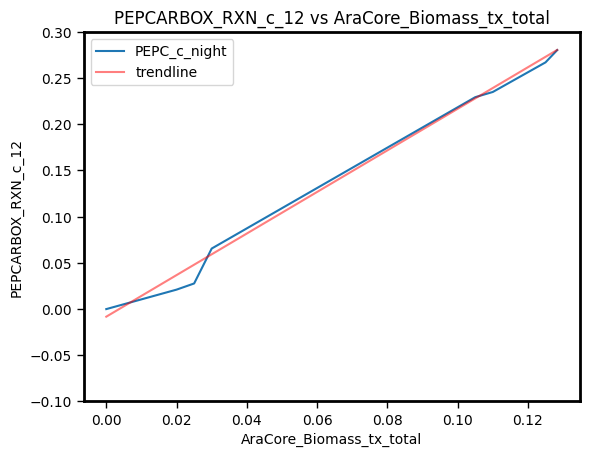

The slope of PEPCARBOX_RXN_c_12 vs AraCore_Biomass_tx_total: 2.1844080596948623
The intercept of PEPCARBOX_RXN_c_12 vs AraCore_Biomass_tx_total: 7.13607942697639e-16


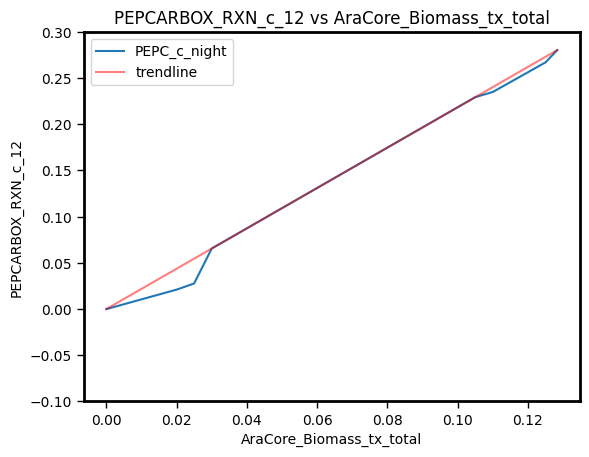

The slope of PEPCARBOX_RXN_p_12 vs AraCore_Biomass_tx_total: -1.3584635497852777e-15
The intercept of PEPCARBOX_RXN_p_12vs AraCore_Biomass_tx_total: 5.735896548290076e-17


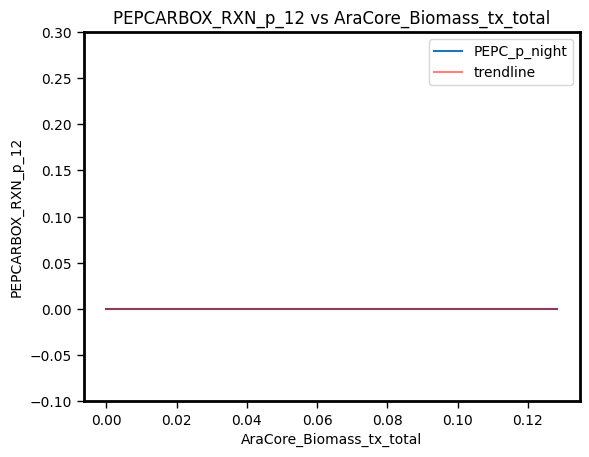

The slope of ISOCITDEH_RXN_c_12 vs AraCore_Biomass_tx_total: -0.597995894966817
The intercept of ISOCITDEH_RXN_c_12 vs AraCore_Biomass_tx_total: -0.1881635920334885


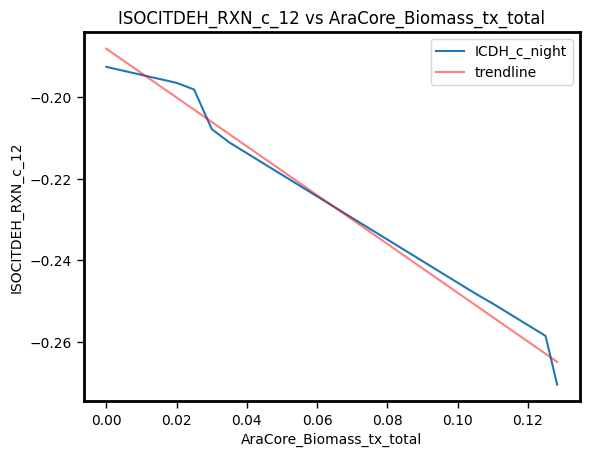

The slope of ISOCITDEH_RXN_x_12vs AraCore_Biomass_tx_total: 4.625628024805763e-32
The intercept of ISOCITDEH_RXN_x_12 vs AraCore_Biomass_tx_total: -4.4127901624035224e-33


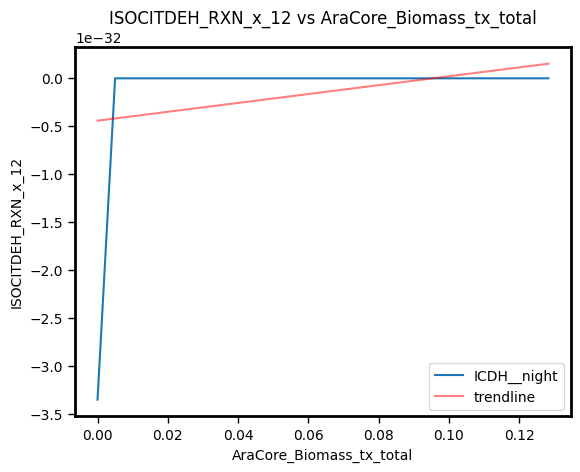

The slope of ISOCITDEH_RXN_m_12vs AraCore_Biomass_tx_total: 3.360849911087126e-16
The intercept of ISOCITDEH_RXN_m_12 vs AraCore_Biomass_tx_total: 0.41834444444444446


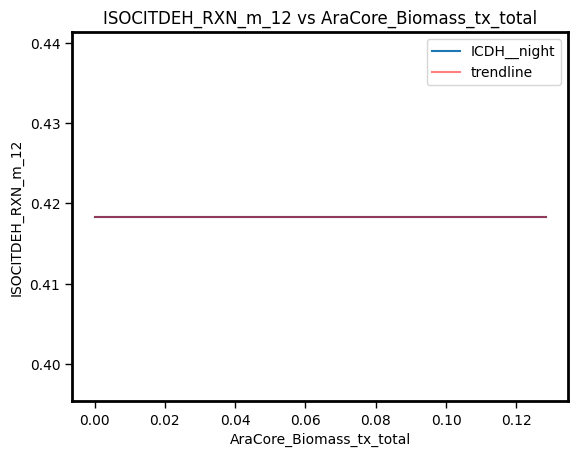

The slope of ISOCITRATE_DEHYDROGENASE_NAD_RXN_m_12vs AraCore_Biomass_tx_total: 0.0
The intercept of ISOCITRATE_DEHYDROGENASE_NAD_RXN_m_12 vs AraCore_Biomass_tx_total: 0.0


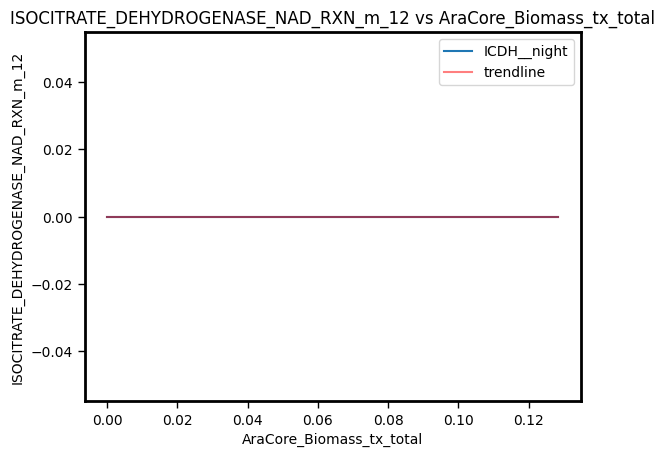

The slope of METHYLCROTONYL_COA_CARBOXYLASE_RXN_m_12vs AraCore_Biomass_tx_total: 0.0
The intercept of METHYLCROTONYL_COA_CARBOXYLASE_RXN_m_12 vs AraCore_Biomass_tx_total: 0.0


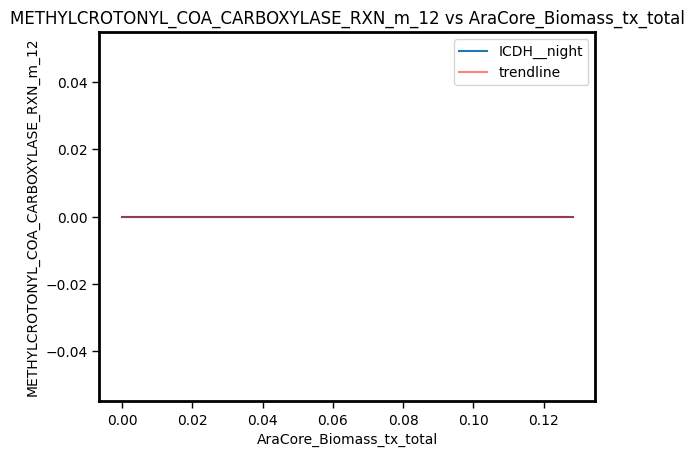

The slope of CARBAMATE_KINASE_RXN_p_12vs AraCore_Biomass_tx_total: -1.358090030802007e-17
The intercept of CARBAMATE_KINASE_RXN_p_12 vs AraCore_Biomass_tx_total: 6.10380297171096e-19


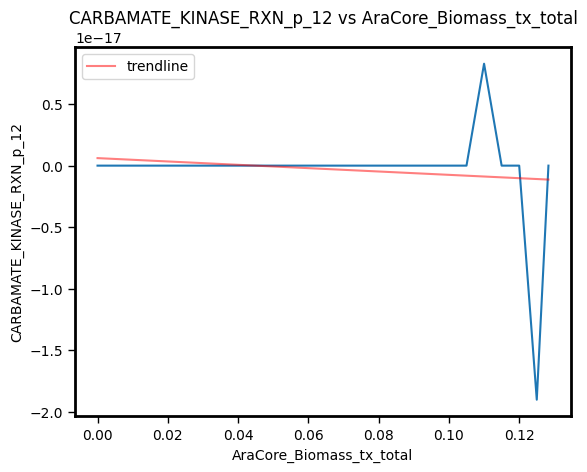

In [236]:
#plot nocturnal PEPC activity vs objective flux
df = df0


# cytosol PEPC
# plot the data
plt.plot(df.T['AraCore_Biomass_tx_total'], df.T['PEPCARBOX_RXN_c_12'], label="PEPC_c_night")
plt.xlabel('AraCore_Biomass_tx_total')
plt.ylabel('PEPCARBOX_RXN_c_12')
plt.title('PEPCARBOX_RXN_c_12 vs AraCore_Biomass_tx_total')

# calculate the slope
x = df.T['AraCore_Biomass_tx_total']
y = df.T['PEPCARBOX_RXN_c_12']
x = x.dropna()
y = y.dropna()
slope, intercept = np.polyfit(x, y, 1)
print('The slope of PEPCARBOX_RXN_c_12 vs AraCore_Biomass_tx_total:', slope)
print('The intercept of PEPCARBOX_RXN_c_12 vs AraCore_Biomass_tx_total:', intercept)

# plot the trendline
plt.plot(x, slope*x + intercept, color='red', label='trendline', alpha=0.5)
plt.ylim(-0.1, 0.3)
plt.legend()
plt.show()
PEPC_slope = slope



# cytosol PEPC
# plot the data
plt.plot(df.T['AraCore_Biomass_tx_total'], df.T['PEPCARBOX_RXN_c_12'], label="PEPC_c_night")
plt.xlabel('AraCore_Biomass_tx_total')
plt.ylabel('PEPCARBOX_RXN_c_12')
plt.title('PEPCARBOX_RXN_c_12 vs AraCore_Biomass_tx_total')
#calculate slope for where line is straight
x = df.T['AraCore_Biomass_tx_total'][8:16]
y = df.T['PEPCARBOX_RXN_c_12'][8:16]
x = x.dropna()
y = y.dropna()
slope, intercept = np.polyfit(x, y, 1)
print('The slope of PEPCARBOX_RXN_c_12 vs AraCore_Biomass_tx_total:', slope)
print('The intercept of PEPCARBOX_RXN_c_12 vs AraCore_Biomass_tx_total:', intercept)
PEPC_slope = slope
# plot the trendline
x = df.T['AraCore_Biomass_tx_total']
plt.plot(x, slope*x + intercept, color='red', label='trendline', alpha=0.5)
plt.ylim(-0.1, 0.3)
plt.legend()
plt.show()






# plastidic PEPC
# plot the data
plt.plot(df.T['AraCore_Biomass_tx_total'], df.T['PEPCARBOX_RXN_p_12'], label="PEPC_p_night")
plt.xlabel('AraCore_Biomass_tx_total')
plt.ylabel('PEPCARBOX_RXN_p_12')
plt.title('PEPCARBOX_RXN_p_12 vs AraCore_Biomass_tx_total')

# calculate the slope
x = df.T['AraCore_Biomass_tx_total']
y = df.T['PEPCARBOX_RXN_p_12']
x = x.dropna()
y = y.dropna()
slope, intercept = np.polyfit(x, y, 1)
print('The slope of PEPCARBOX_RXN_p_12 vs AraCore_Biomass_tx_total:', slope)
print('The intercept of PEPCARBOX_RXN_p_12vs AraCore_Biomass_tx_total:', intercept)





# plot the trendline
plt.plot(x, slope*x + intercept, color='red', label='trendline', alpha=0.5)
plt.ylim(-0.1, 0.3)
plt.legend()
plt.show()


# cytosolic ICDH
# plot the data
plt.plot(df.T['AraCore_Biomass_tx_total'], df.T['ISOCITDEH_RXN_c_12'], label="ICDH_c_night")
plt.xlabel('AraCore_Biomass_tx_total')
plt.ylabel('ISOCITDEH_RXN_c_12')
plt.title('ISOCITDEH_RXN_c_12 vs AraCore_Biomass_tx_total')

# calculate the slope
x = df.T['AraCore_Biomass_tx_total']
y = df.T['ISOCITDEH_RXN_c_12']
x = x.dropna()
y = y.dropna()
slope, intercept = np.polyfit(x, y, 1)
print('The slope of ISOCITDEH_RXN_c_12 vs AraCore_Biomass_tx_total:', slope)
print('The intercept of ISOCITDEH_RXN_c_12 vs AraCore_Biomass_tx_total:', intercept)

# plot the trendline
plt.plot(x, slope*x + intercept, color='red', label='trendline', alpha=0.5)
#plt.ylim(-0.1, 0.3)
plt.legend()
plt.show()

# peroxisomal ICDH
# plot the data
ICDH = 'ISOCITDEH_RXN_x_12'

plt.plot(df.T['AraCore_Biomass_tx_total'], df.T[ICDH], label="ICDH_"+ICDH[-4:3]+"_night")
plt.xlabel('AraCore_Biomass_tx_total')
plt.ylabel(ICDH)
plt.title(ICDH+' vs AraCore_Biomass_tx_total')

# calculate the slope
x = df.T['AraCore_Biomass_tx_total']
y = df.T[ICDH]
x = x.dropna()
y = y.dropna()
slope, intercept = np.polyfit(x, y, 1)
print('The slope of '+ICDH+'vs AraCore_Biomass_tx_total:', slope)
print('The intercept of '+ICDH+' vs AraCore_Biomass_tx_total:', intercept)

# plot the trendline
plt.plot(x, slope*x + intercept, color='red', label='trendline', alpha=0.5)
#plt.ylim(-0.1, 0.3)
plt.legend()
plt.show()

# mitochondiral ICDH
# plot the data
ICDH = 'ISOCITDEH_RXN_m_12'

plt.plot(df.T['AraCore_Biomass_tx_total'], df.T[ICDH], label="ICDH_"+ICDH[-4:3]+"_night")
plt.xlabel('AraCore_Biomass_tx_total')
plt.ylabel(ICDH)
plt.title(ICDH+' vs AraCore_Biomass_tx_total')

# calculate the slope
x = df.T['AraCore_Biomass_tx_total']
y = df.T[ICDH]
x = x.dropna()
y = y.dropna()
slope, intercept = np.polyfit(x, y, 1)
print('The slope of '+ICDH+'vs AraCore_Biomass_tx_total:', slope)
print('The intercept of '+ICDH+' vs AraCore_Biomass_tx_total:', intercept)

# plot the trendline
plt.plot(x, slope*x + intercept, color='red', label='trendline', alpha=0.5)
#plt.ylim(-0.1, 0.3)
plt.legend()
plt.show()

# mitochondiral ICDH
# plot the data
ICDH = 'ISOCITRATE_DEHYDROGENASE_NAD_RXN_m_12'

plt.plot(df.T['AraCore_Biomass_tx_total'], df.T[ICDH], label="ICDH_"+ICDH[-4:3]+"_night")
plt.xlabel('AraCore_Biomass_tx_total')
plt.ylabel(ICDH)
plt.title(ICDH+' vs AraCore_Biomass_tx_total')

# calculate the slope
x = df.T['AraCore_Biomass_tx_total']
y = df.T[ICDH]
x = x.dropna()
y = y.dropna()
slope, intercept = np.polyfit(x, y, 1)
print('The slope of '+ICDH+'vs AraCore_Biomass_tx_total:', slope)
print('The intercept of '+ICDH+' vs AraCore_Biomass_tx_total:', intercept)

# plot the trendline
plt.plot(x, slope*x + intercept, color='red', label='trendline', alpha=0.5)
#plt.ylim(-0.1, 0.3)
plt.legend()
plt.show()

# plot METHYLCROTONYL_COA_CARBOXYLASE_RXN_m_12

rxn = 'METHYLCROTONYL_COA_CARBOXYLASE_RXN_m_12'

plt.plot(df.T['AraCore_Biomass_tx_total'], df.T[rxn], label="ICDH_"+rxn[-4:3]+"_night")
plt.xlabel('AraCore_Biomass_tx_total')
plt.ylabel(rxn)
plt.title(rxn+' vs AraCore_Biomass_tx_total')

# calculate the slope
x = df.T['AraCore_Biomass_tx_total']
y = df.T[rxn]
x = x.dropna()
y = y.dropna()
slope, intercept = np.polyfit(x, y, 1)
print('The slope of '+rxn+'vs AraCore_Biomass_tx_total:', slope)
print('The intercept of '+rxn+' vs AraCore_Biomass_tx_total:', intercept)

# plot the trendline
plt.plot(x, slope*x + intercept, color='red', label='trendline', alpha=0.5)
#plt.ylim(-0.1, 0.3)
plt.legend()
plt.show()

# plot CARBAMATE_KINASE_RXN_p_12

rxn = 'CARBAMATE_KINASE_RXN_p_12'

plt.plot(df.T['AraCore_Biomass_tx_total'], df.T[rxn], label=rxn[-4:3]+"_night")
plt.xlabel('AraCore_Biomass_tx_total')
plt.ylabel(rxn)
plt.title(rxn+' vs AraCore_Biomass_tx_total')

# calculate the slope
x = df.T['AraCore_Biomass_tx_total']
y = df.T[rxn]
x = x.dropna()
y = y.dropna()
slope, intercept = np.polyfit(x, y, 1)
print('The slope of '+rxn+'vs AraCore_Biomass_tx_total:', slope)
print('The intercept of '+rxn+' vs AraCore_Biomass_tx_total:', intercept)

# plot the trendline
plt.plot(x, slope*x + intercept, color='red', label='trendline', alpha=0.5)
#plt.ylim(-0.1, 0.3)
plt.legend()
plt.show()






In [237]:
# scan over upper bound on CO2 uptake, while constraining PEPCs at night, to value in C3 behaviour model

diel_model_noCAM = diel_model.copy()
set_PEPC_C3_constraints(diel_model_noCAM, slope=PEPC_slope, objective = output_string+"_total")

df_C1, sol_C1 = parameter_scan_CO2(diel_model_noCAM, output_string+"_total", "CO2_tx"+day_tag, 0, 17, 0.5, pFBA=True, 
                    CO2_refixation_allowed=True, verbose=True, iterations=50)


Setting new PEPC_obj_const constraint, with slope 2.1844080596948623 .
Scanning process: CO2_tx_00 

------- Scan iteration: 1      Scan value: 0.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total


Model iteration is infeasible!
------- Scan iteration: 2      Scan value: 0.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration is infeasible!
------- Scan iteration: 3      Scan value: 1.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0003446
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.000753
producing HCO3-:	RXN0_5224_c_12	0.000753
producing CO2:	CO2_pc_12	0.210023
consuming CO2:	ISOCITDEH_RXN_c_12	-0.418236
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	9.8e-05
producing CO2:	CO2_mc_12	1.179007
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.000753
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	2.2e-05
producing CO2:	RXN_9652_p_12	6.6e-05
producing CO2:	RXN_9650_p_12	6.6e-05
producing CO2:	RXN_5682_p_12	1.4e-05
producing CO2:	2.3.1.180_RXN_p_12	6.6e-05
producing CO2:	RXN_9654_p_12	6.6e-05
consuming CO2:	RXN0_5224_p_12	0.000465
producing HCO3-:	RXN0_5224_p_12	0.000465
consuming CO2:	CO2_p

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 4      Scan value: 1.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0061154
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.013359
producing HCO3-:	RXN0_5224_c_12	0.013359
producing CO2:	CO2_pc_12	0.22426
consuming CO2:	ISOCITDEH_RXN_c_12	-0.416426
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.001735
producing CO2:	CO2_mc_12	1.173912
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.013359
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.000392
producing CO2:	RXN_9652_p_12	0.001179
producing CO2:	RXN_9650_p_12	0.001179
producing CO2:	RXN_5682_p_12	0.000253
producing CO2:	2.3.1.180_RXN_p_12	0.001179
producing CO2:	RXN_9654_p_12	0.001179
consuming CO2:	RXN0_5224_p_12	0.008253
producing HCO3-:	RXN0_5224_p_12	0.008253
consuming CO2:	CO2_pc_12	0.22426
producing CO2:	1.2.1.2_RXN_p_12	0.000195
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.008253
producing CO2:	PYRUVDEH_RXN_p_12	0.009432
p

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 5      Scan value: 2.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0118862
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.025964
producing HCO3-:	RXN0_5224_c_12	0.025964
producing CO2:	CO2_pc_12	0.238498
consuming CO2:	ISOCITDEH_RXN_c_12	-0.414616
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.003373
producing CO2:	CO2_mc_12	1.168817
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.025964
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.000762
producing CO2:	RXN_9652_p_12	0.002292
producing CO2:	RXN_9650_p_12	0.002292
producing CO2:	RXN_5682_p_12	0.000492
producing CO2:	2.3.1.180_RXN_p_12	0.002292
producing CO2:	RXN_9654_p_12	0.002292
consuming CO2:	RXN0_5224_p_12	0.016041
producing HCO3-:	RXN0_5224_p_12	0.016041
consuming CO2:	CO2_pc_12	0.238498
producing CO2:	1.2.1.2_RXN_p_12	0.00038
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.016041
producing CO2:	PYRUVDEH_RXN_p_12	0.018332


/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 6      Scan value: 2.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0176569
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.03857
producing HCO3-:	RXN0_5224_c_12	0.03857
producing CO2:	CO2_pc_12	0.252735
consuming CO2:	ISOCITDEH_RXN_c_12	-0.412805
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.00501
producing CO2:	CO2_mc_12	1.163723
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.03857
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.001132
producing CO2:	RXN_9652_p_12	0.003404
producing CO2:	RXN_9650_p_12	0.003404
producing CO2:	RXN_5682_p_12	0.00073
producing CO2:	2.3.1.180_RXN_p_12	0.003404
producing CO2:	RXN_9654_p_12	0.003404
consuming CO2:	RXN0_5224_p_12	0.023828
producing HCO3-:	RXN0_5224_p_12	0.023828
consuming CO2:	CO2_pc_12	0.252735
producing CO2:	1.2.1.2_RXN_p_12	0.000564
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.023828
producing CO2:	PYRUVDEH_RXN_p_12	0.027232
prod

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 7      Scan value: 3.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0234277
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.051176
producing HCO3-:	RXN0_5224_c_12	0.051176
producing CO2:	CO2_pc_12	0.266224
consuming CO2:	ISOCITDEH_RXN_c_12	-0.410995
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.006647
producing CO2:	CO2_mc_12	1.159376
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.051176
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.001502
producing CO2:	RXN_9652_p_12	0.004517
producing CO2:	RXN_9650_p_12	0.004517
producing CO2:	RXN_5682_p_12	0.000969
producing CO2:	2.3.1.180_RXN_p_12	0.004517
producing CO2:	RXN_9654_p_12	0.004517
consuming CO2:	RXN0_5224_p_12	0.031616
producing HCO3-:	RXN0_5224_p_12	0.031616
consuming CO2:	CO2_pc_12	0.266224
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.031616
producing CO2:	PYRUVDEH_RXN_p_12	0.036133
producing CO2:	RXN_9653_p_12	0.004517
pr

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 8      Scan value: 3.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0291984
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.063781
producing HCO3-:	RXN0_5224_c_12	0.063781
producing CO2:	CO2_pc_12	0.280277
consuming CO2:	ISOCITDEH_RXN_c_12	-0.409185
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.008285
producing CO2:	CO2_mc_12	1.154466
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.063781
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.001872
producing CO2:	RXN_9652_p_12	0.005629
producing CO2:	RXN_9650_p_12	0.005629
producing CO2:	RXN_5682_p_12	0.001207
producing CO2:	2.3.1.180_RXN_p_12	0.005629
producing CO2:	RXN_9654_p_12	0.005629
consuming CO2:	RXN0_5224_p_12	0.039404
producing HCO3-:	RXN0_5224_p_12	0.039404
consuming CO2:	CO2_pc_12	0.280277
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.039404
producing CO2:	PYRUVDEH_RXN_p_12	0.045033
producing CO2:	RXN_9653_p_12	0.005629
pr

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 9      Scan value: 4.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0349692
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.076387
producing HCO3-:	RXN0_5224_c_12	0.076387
producing CO2:	CO2_pc_12	0.294331
consuming CO2:	ISOCITDEH_RXN_c_12	-0.407375
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.009922
producing CO2:	CO2_mc_12	1.149555
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.076387
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.002242
producing CO2:	RXN_9652_p_12	0.006742
producing CO2:	RXN_9650_p_12	0.006742
producing CO2:	RXN_5682_p_12	0.001446
producing CO2:	2.3.1.180_RXN_p_12	0.006742
producing CO2:	RXN_9654_p_12	0.006742
consuming CO2:	RXN0_5224_p_12	0.047191
producing HCO3-:	RXN0_5224_p_12	0.047191
consuming CO2:	CO2_pc_12	0.294331
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.047191
producing CO2:	PYRUVDEH_RXN_p_12	0.053933
producing CO2:	RXN_9653_p_12	0.006742
pr

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 10      Scan value: 4.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0407399
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.088993
producing HCO3-:	RXN0_5224_c_12	0.088993
producing CO2:	CO2_pc_12	0.308384
consuming CO2:	ISOCITDEH_RXN_c_12	-0.405564
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.011559
producing CO2:	CO2_mc_12	1.144645
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.088993
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.002612
producing CO2:	RXN_9652_p_12	0.007854
producing CO2:	RXN_9650_p_12	0.007854
producing CO2:	RXN_5682_p_12	0.001685
producing CO2:	2.3.1.180_RXN_p_12	0.007854
producing CO2:	RXN_9654_p_12	0.007854
consuming CO2:	RXN0_5224_p_12	0.054979
producing HCO3-:	RXN0_5224_p_12	0.054979
consuming CO2:	CO2_pc_12	0.308384
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.054979
producing CO2:	PYRUVDEH_RXN_p_12	0.062833
producing CO2:	RXN_9653_p_12	0.007854
p

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 11      Scan value: 5.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0465107
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.101598
producing HCO3-:	RXN0_5224_c_12	0.101598
producing CO2:	CO2_pc_12	0.322437
consuming CO2:	ISOCITDEH_RXN_c_12	-0.403754
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.013197
producing CO2:	CO2_mc_12	1.139734
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.101598
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.002982
producing CO2:	RXN_9652_p_12	0.008967
producing CO2:	RXN_9650_p_12	0.008967
producing CO2:	RXN_5682_p_12	0.001923
producing CO2:	2.3.1.180_RXN_p_12	0.008967
producing CO2:	RXN_9654_p_12	0.008967
consuming CO2:	RXN0_5224_p_12	0.062767
producing HCO3-:	RXN0_5224_p_12	0.062767
consuming CO2:	CO2_pc_12	0.322437
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.062767
producing CO2:	PYRUVDEH_RXN_p_12	0.071734
producing CO2:	RXN_9653_p_12	0.008967
p

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 12      Scan value: 5.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0522815
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.114204
producing HCO3-:	RXN0_5224_c_12	0.114204
producing CO2:	CO2_pc_12	0.33649
consuming CO2:	ISOCITDEH_RXN_c_12	-0.401944
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.014834
producing CO2:	CO2_mc_12	1.134824
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.114204
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.003352
producing CO2:	RXN_9652_p_12	0.010079
producing CO2:	RXN_9650_p_12	0.010079
producing CO2:	RXN_5682_p_12	0.002162
producing CO2:	2.3.1.180_RXN_p_12	0.010079
producing CO2:	RXN_9654_p_12	0.010079
consuming CO2:	RXN0_5224_p_12	0.070555
producing HCO3-:	RXN0_5224_p_12	0.070555
consuming CO2:	CO2_pc_12	0.33649
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.070555
producing CO2:	PYRUVDEH_RXN_p_12	0.080634
producing CO2:	RXN_9653_p_12	0.010079
pro

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 13      Scan value: 6.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0580522
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.12681
producing HCO3-:	RXN0_5224_c_12	0.12681
producing CO2:	CO2_pc_12	0.350543
consuming CO2:	ISOCITDEH_RXN_c_12	-0.400134
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.016471
producing CO2:	CO2_mc_12	1.129913
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.12681
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.003722
producing CO2:	RXN_9652_p_12	0.011192
producing CO2:	RXN_9650_p_12	0.011192
producing CO2:	RXN_5682_p_12	0.002401
producing CO2:	2.3.1.180_RXN_p_12	0.011192
producing CO2:	RXN_9654_p_12	0.011192
consuming CO2:	RXN0_5224_p_12	0.078342
producing HCO3-:	RXN0_5224_p_12	0.078342
consuming CO2:	CO2_pc_12	0.350543
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.078342
producing CO2:	PYRUVDEH_RXN_p_12	0.089534
producing CO2:	RXN_9653_p_12	0.011192
prod

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 14      Scan value: 6.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.063823
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.139415
producing HCO3-:	RXN0_5224_c_12	0.139415
producing CO2:	CO2_pc_12	0.364596
consuming CO2:	ISOCITDEH_RXN_c_12	-0.398323
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.018109
producing CO2:	CO2_mc_12	1.125003
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.139415
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.004092
producing CO2:	RXN_9652_p_12	0.012304
producing CO2:	RXN_9650_p_12	0.012304
producing CO2:	RXN_5682_p_12	0.002639
producing CO2:	2.3.1.180_RXN_p_12	0.012304
producing CO2:	RXN_9654_p_12	0.012304
consuming CO2:	RXN0_5224_p_12	0.08613
producing HCO3-:	RXN0_5224_p_12	0.08613
consuming CO2:	CO2_pc_12	0.364596
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.08613
producing CO2:	PYRUVDEH_RXN_p_12	0.098434
producing CO2:	RXN_9653_p_12	0.012304
produ

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 15      Scan value: 7.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0695937
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.152021
producing HCO3-:	RXN0_5224_c_12	0.152021
producing CO2:	CO2_pc_12	0.37865
consuming CO2:	ISOCITDEH_RXN_c_12	-0.396513
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.019746
producing CO2:	CO2_mc_12	1.120092
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.152021
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.004462
producing CO2:	RXN_9652_p_12	0.013417
producing CO2:	RXN_9650_p_12	0.013417
producing CO2:	RXN_5682_p_12	0.002878
producing CO2:	2.3.1.180_RXN_p_12	0.013417
producing CO2:	RXN_9654_p_12	0.013417
consuming CO2:	RXN0_5224_p_12	0.093918
producing HCO3-:	RXN0_5224_p_12	0.093918
consuming CO2:	CO2_pc_12	0.37865
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.093918
producing CO2:	PYRUVDEH_RXN_p_12	0.107335
producing CO2:	RXN_9653_p_12	0.013417
pro

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 16      Scan value: 7.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0753645
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.164627
producing HCO3-:	RXN0_5224_c_12	0.164627
producing CO2:	CO2_pc_12	0.392703
consuming CO2:	ISOCITDEH_RXN_c_12	-0.394703
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.021384
producing CO2:	CO2_mc_12	1.115182
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.164627
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.004832
producing CO2:	RXN_9652_p_12	0.014529
producing CO2:	RXN_9650_p_12	0.014529
producing CO2:	RXN_5682_p_12	0.003116
producing CO2:	2.3.1.180_RXN_p_12	0.014529
producing CO2:	RXN_9654_p_12	0.014529
consuming CO2:	RXN0_5224_p_12	0.101706
producing HCO3-:	RXN0_5224_p_12	0.101706
consuming CO2:	CO2_pc_12	0.392703
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.101706
producing CO2:	PYRUVDEH_RXN_p_12	0.116235
producing CO2:	RXN_9653_p_12	0.014529
p

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 17      Scan value: 8.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0811352
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.177232
producing HCO3-:	RXN0_5224_c_12	0.177232
producing CO2:	CO2_pc_12	0.406756
consuming CO2:	ISOCITDEH_RXN_c_12	-0.392892
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.023021
producing CO2:	CO2_mc_12	1.110271
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.177232
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.005202
producing CO2:	RXN_9652_p_12	0.015642
producing CO2:	RXN_9650_p_12	0.015642
producing CO2:	RXN_5682_p_12	0.003355
producing CO2:	2.3.1.180_RXN_p_12	0.015642
producing CO2:	RXN_9654_p_12	0.015642
consuming CO2:	RXN0_5224_p_12	0.109493
producing HCO3-:	RXN0_5224_p_12	0.109493
consuming CO2:	CO2_pc_12	0.406756
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.109493
producing CO2:	PYRUVDEH_RXN_p_12	0.125135
producing CO2:	RXN_9653_p_12	0.015642
p

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 18      Scan value: 8.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.086906
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.189838
producing HCO3-:	RXN0_5224_c_12	0.189838
producing CO2:	CO2_pc_12	0.420809
consuming CO2:	ISOCITDEH_RXN_c_12	-0.391082
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.024658
producing CO2:	CO2_mc_12	1.10536
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.189838
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.005572
producing CO2:	RXN_9652_p_12	0.016754
producing CO2:	RXN_9650_p_12	0.016754
producing CO2:	RXN_5682_p_12	0.003594
producing CO2:	2.3.1.180_RXN_p_12	0.016754
producing CO2:	RXN_9654_p_12	0.016754
consuming CO2:	RXN0_5224_p_12	0.117281
producing HCO3-:	RXN0_5224_p_12	0.117281
consuming CO2:	CO2_pc_12	0.420809
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.117281
producing CO2:	PYRUVDEH_RXN_p_12	0.134036
producing CO2:	RXN_9653_p_12	0.016754
pro

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 19      Scan value: 9.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0926768
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.202444
producing HCO3-:	RXN0_5224_c_12	0.202444
producing CO2:	CO2_pc_12	0.434862
consuming CO2:	ISOCITDEH_RXN_c_12	-0.389272
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.026296
producing CO2:	CO2_mc_12	1.10045
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.202444
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.005942
producing CO2:	RXN_9652_p_12	0.017867
producing CO2:	RXN_9650_p_12	0.017867
producing CO2:	RXN_5682_p_12	0.003832
producing CO2:	2.3.1.180_RXN_p_12	0.017867
producing CO2:	RXN_9654_p_12	0.017867
consuming CO2:	RXN0_5224_p_12	0.125069
producing HCO3-:	RXN0_5224_p_12	0.125069
consuming CO2:	CO2_pc_12	0.434862
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.125069
producing CO2:	PYRUVDEH_RXN_p_12	0.142936
producing CO2:	RXN_9653_p_12	0.017867
pr

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 20      Scan value: 9.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.0984475
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.21505
producing HCO3-:	RXN0_5224_c_12	0.21505
producing CO2:	CO2_pc_12	0.448915
consuming CO2:	ISOCITDEH_RXN_c_12	-0.387462
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.027933
producing CO2:	CO2_mc_12	1.095539
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.21505
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.006312
producing CO2:	RXN_9652_p_12	0.01898
producing CO2:	RXN_9650_p_12	0.01898
producing CO2:	RXN_5682_p_12	0.004071
producing CO2:	2.3.1.180_RXN_p_12	0.01898
producing CO2:	RXN_9654_p_12	0.01898
consuming CO2:	RXN0_5224_p_12	0.132857
producing HCO3-:	RXN0_5224_p_12	0.132857
consuming CO2:	CO2_pc_12	0.448915
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.132857
producing CO2:	PYRUVDEH_RXN_p_12	0.151836
producing CO2:	RXN_9653_p_12	0.01898
producing

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 21      Scan value: 10.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1042183
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.227655
producing HCO3-:	RXN0_5224_c_12	0.227655
producing CO2:	CO2_pc_12	0.462969
consuming CO2:	ISOCITDEH_RXN_c_12	-0.385651
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.02957
producing CO2:	CO2_mc_12	1.090629
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.227655
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.006681
producing CO2:	RXN_9652_p_12	0.020092
producing CO2:	RXN_9650_p_12	0.020092
producing CO2:	RXN_5682_p_12	0.00431
producing CO2:	2.3.1.180_RXN_p_12	0.020092
producing CO2:	RXN_9654_p_12	0.020092
consuming CO2:	RXN0_5224_p_12	0.140644
producing HCO3-:	RXN0_5224_p_12	0.140644
consuming CO2:	CO2_pc_12	0.462969
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.140644
producing CO2:	PYRUVDEH_RXN_p_12	0.160736
producing CO2:	RXN_9653_p_12	0.020092
pr

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 22      Scan value: 10.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.109989
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.240261
producing HCO3-:	RXN0_5224_c_12	0.240261
producing CO2:	CO2_pc_12	0.477022
consuming CO2:	ISOCITDEH_RXN_c_12	-0.383841
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.031208
producing CO2:	CO2_mc_12	1.085718
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.240261
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.007051
producing CO2:	RXN_9652_p_12	0.021205
producing CO2:	RXN_9650_p_12	0.021205
producing CO2:	RXN_5682_p_12	0.004548
producing CO2:	2.3.1.180_RXN_p_12	0.021205
producing CO2:	RXN_9654_p_12	0.021205
consuming CO2:	RXN0_5224_p_12	0.148432
producing HCO3-:	RXN0_5224_p_12	0.148432
consuming CO2:	CO2_pc_12	0.477022
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.148432
producing CO2:	PYRUVDEH_RXN_p_12	0.169637
producing CO2:	RXN_9653_p_12	0.021205
p

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 23      Scan value: 11.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1157598
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.252867
producing HCO3-:	RXN0_5224_c_12	0.252867
producing CO2:	CO2_pc_12	0.491075
consuming CO2:	ISOCITDEH_RXN_c_12	-0.382031
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.032845
producing CO2:	CO2_mc_12	1.080808
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.252867
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.007421
producing CO2:	RXN_9652_p_12	0.022317
producing CO2:	RXN_9650_p_12	0.022317
producing CO2:	RXN_5682_p_12	0.004787
producing CO2:	2.3.1.180_RXN_p_12	0.022317
producing CO2:	RXN_9654_p_12	0.022317
consuming CO2:	RXN0_5224_p_12	0.15622
producing HCO3-:	RXN0_5224_p_12	0.15622
consuming CO2:	CO2_pc_12	0.491075
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.15622
producing CO2:	PYRUVDEH_RXN_p_12	0.178537
producing CO2:	RXN_9653_p_12	0.022317
pro

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 24      Scan value: 11.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1215305
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.265472
producing HCO3-:	RXN0_5224_c_12	0.265472
producing CO2:	CO2_pc_12	0.505128
consuming CO2:	ISOCITDEH_RXN_c_12	-0.38022
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.034483
producing CO2:	CO2_mc_12	1.075897
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.265472
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.007791
producing CO2:	RXN_9652_p_12	0.02343
producing CO2:	RXN_9650_p_12	0.02343
producing CO2:	RXN_5682_p_12	0.005025
producing CO2:	2.3.1.180_RXN_p_12	0.02343
producing CO2:	RXN_9654_p_12	0.02343
consuming CO2:	RXN0_5224_p_12	0.164007
producing HCO3-:	RXN0_5224_p_12	0.164007
consuming CO2:	CO2_pc_12	0.505128
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.164007
producing CO2:	PYRUVDEH_RXN_p_12	0.187437
producing CO2:	RXN_9653_p_12	0.02343
produc

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 25      Scan value: 12.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1266073
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.276562
producing HCO3-:	RXN0_5224_c_12	0.276562
producing CO2:	CO2_pc_12	0.544707
consuming CO2:	ISOCITDEH_RXN_c_12	-0.378628
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.035923
producing CO2:	CO2_mc_12	0.70666
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.392599
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.276562
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005235
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.003641
producing CO2:	RXN_9652_p_12	0.024408
producing CO2:	RXN_9650_p_12	0.024408
producing CO2:	2.3.1.180_RXN_p_12	0.024408
producing CO2:	RXN_9654_p_12	0.024408
consuming CO2:	RXN0_5224_p_12	0.170859
producing HCO3-:	RXN0_5224_p_12	0.170859
consuming CO2:	CO2_pc_12	0.544707
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.170859
produ

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 26      Scan value: 12.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1283201
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.280304
producing HCO3-:	RXN0_5224_c_12	0.280304
producing CO2:	CO2_pc_12	0.551689
consuming CO2:	ISOCITDEH_RXN_c_12	-0.270483
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036409
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003091
producing CO2:	CO2_mc_12	0.877008
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.338447
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.280304
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005306
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024739
producing CO2:	RXN_9650_p_12	0.024739
producing CO2:	2.3.1.180_RXN_p_12	0.024739
producing CO2:	RXN_9654_p_12	0.024739
consuming CO2:	RXN0_5224_p_12	0.17317
producing HCO3-:	RXN0_5224_p_12	0.17317
consuming CO2:	CO2_pc_12	0.551689
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.17317
producing C

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 27      Scan value: 13.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1283201
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.280304
producing HCO3-:	RXN0_5224_c_12	0.280304
producing CO2:	CO2_pc_12	0.551689
consuming CO2:	ISOCITDEH_RXN_c_12	-0.270483
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036409
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003091
producing CO2:	CO2_mc_12	0.877008
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.338447
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.280304
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005306
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024739
producing CO2:	RXN_9650_p_12	0.024739
producing CO2:	2.3.1.180_RXN_p_12	0.024739
producing CO2:	RXN_9654_p_12	0.024739
consuming CO2:	RXN0_5224_p_12	0.17317
producing HCO3-:	RXN0_5224_p_12	0.17317
consuming CO2:	CO2_pc_12	0.551689
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.17317
producing C

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 28      Scan value: 13.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1283201
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.280304
producing HCO3-:	RXN0_5224_c_12	0.280304
producing CO2:	CO2_pc_12	0.551689
consuming CO2:	ISOCITDEH_RXN_c_12	-0.270483
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036409
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003091
producing CO2:	CO2_mc_12	0.877008
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.338447
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.280304
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005306
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024739
producing CO2:	RXN_9650_p_12	0.024739
producing CO2:	2.3.1.180_RXN_p_12	0.024739
producing CO2:	RXN_9654_p_12	0.024739
consuming CO2:	RXN0_5224_p_12	0.17317
producing HCO3-:	RXN0_5224_p_12	0.17317
consuming CO2:	CO2_pc_12	0.551689
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.17317
producing C

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 29      Scan value: 14.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1283201
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.280304
producing HCO3-:	RXN0_5224_c_12	0.280304
producing CO2:	CO2_pc_12	0.551689
consuming CO2:	ISOCITDEH_RXN_c_12	-0.270483
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036409
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003091
producing CO2:	CO2_mc_12	0.877008
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.338447
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.280304
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005306
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024739
producing CO2:	RXN_9650_p_12	0.024739
producing CO2:	2.3.1.180_RXN_p_12	0.024739
producing CO2:	RXN_9654_p_12	0.024739
consuming CO2:	RXN0_5224_p_12	0.17317
producing HCO3-:	RXN0_5224_p_12	0.17317
consuming CO2:	CO2_pc_12	0.551689
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.17317
producing C

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 30      Scan value: 14.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1283201
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.280304
producing HCO3-:	RXN0_5224_c_12	0.280304
producing CO2:	CO2_pc_12	0.551689
consuming CO2:	ISOCITDEH_RXN_c_12	-0.270483
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036409
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003091
producing CO2:	CO2_mc_12	0.877008
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.338447
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.280304
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005306
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024739
producing CO2:	RXN_9650_p_12	0.024739
producing CO2:	2.3.1.180_RXN_p_12	0.024739
producing CO2:	RXN_9654_p_12	0.024739
consuming CO2:	RXN0_5224_p_12	0.17317
producing HCO3-:	RXN0_5224_p_12	0.17317
consuming CO2:	CO2_pc_12	0.551689
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.17317
producing C

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 31      Scan value: 15.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1283201
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.280304
producing HCO3-:	RXN0_5224_c_12	0.280304
producing CO2:	CO2_pc_12	0.551689
consuming CO2:	ISOCITDEH_RXN_c_12	-0.270483
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036409
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003091
producing CO2:	CO2_mc_12	0.877008
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.338447
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.280304
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005306
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024739
producing CO2:	RXN_9650_p_12	0.024739
producing CO2:	2.3.1.180_RXN_p_12	0.024739
producing CO2:	RXN_9654_p_12	0.024739
consuming CO2:	RXN0_5224_p_12	0.17317
producing HCO3-:	RXN0_5224_p_12	0.17317
consuming CO2:	CO2_pc_12	0.551689
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.17317
producing C

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 32      Scan value: 15.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1283201
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.280304
producing HCO3-:	RXN0_5224_c_12	0.280304
producing CO2:	CO2_pc_12	0.551689
consuming CO2:	ISOCITDEH_RXN_c_12	-0.270483
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036409
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003091
producing CO2:	CO2_mc_12	0.877008
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.338447
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.280304
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005306
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024739
producing CO2:	RXN_9650_p_12	0.024739
producing CO2:	2.3.1.180_RXN_p_12	0.024739
producing CO2:	RXN_9654_p_12	0.024739
consuming CO2:	RXN0_5224_p_12	0.17317
producing HCO3-:	RXN0_5224_p_12	0.17317
consuming CO2:	CO2_pc_12	0.551689
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.17317
producing C

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 33      Scan value: 16.0 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1283201
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.280304
producing HCO3-:	RXN0_5224_c_12	0.280304
producing CO2:	CO2_pc_12	0.551689
consuming CO2:	ISOCITDEH_RXN_c_12	-0.270483
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036409
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003091
producing CO2:	CO2_mc_12	0.877008
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.338447
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.280304
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005306
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024739
producing CO2:	RXN_9650_p_12	0.024739
producing CO2:	2.3.1.180_RXN_p_12	0.024739
producing CO2:	RXN_9654_p_12	0.024739
consuming CO2:	RXN0_5224_p_12	0.17317
producing HCO3-:	RXN0_5224_p_12	0.17317
consuming CO2:	CO2_pc_12	0.551689
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.17317
producing C

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


------- Scan iteration: 34      Scan value: 16.5 (CO2_tx_00) --------
Objective: AraCore_Biomass_tx_total
Model iteration feasible. Objective flux: 0.1283201
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.280304
producing HCO3-:	RXN0_5224_c_12	0.280304
producing CO2:	CO2_pc_12	0.551689
consuming CO2:	ISOCITDEH_RXN_c_12	-0.270483
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.036409
producing CO2:	GLUTDECARBOX_RXN_c_12	0.003091
producing CO2:	CO2_mc_12	0.877008
producing CO2:	6PGLUCONDEHYDROG_RXN_c_12	0.338447
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.280304
producing CO2:	PREPHENATE_DEHYDROGENASE_NADP+_RXN_c_12	0.005306
----- Plastid -----
producing CO2:	RXN_9652_p_12	0.024739
producing CO2:	RXN_9650_p_12	0.024739
producing CO2:	2.3.1.180_RXN_p_12	0.024739
producing CO2:	RXN_9654_p_12	0.024739
consuming CO2:	RXN0_5224_p_12	0.17317
producing HCO3-:	RXN0_5224_p_12	0.17317
consuming CO2:	CO2_pc_12	0.551689
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.17317
producing C

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")


In [238]:

#place constraint on PEPC activity relative to objective flux
PEPC_slope = 2.249795249081225

PEPC_const_model = diel_model.copy()
set_PEPC_C3_constraints(PEPC_const_model, slope=PEPC_slope, objective = output_string+"_total")

PEPC_const_model.reactions.get_by_id("CO2_tx"+day_tag).upper_bound = CO2_uptake

#optimise
solution_PEPC_const, PEPC_const_model_opt = optimise_model(PEPC_const_model, output_string+"_total", pFBA=True)
calculate_noct_CO2_refixation_coefficient(PEPC_const_model_opt, verbose=True, threshold = 0.00001, show_noflux = False)



Setting new PEPC_obj_const constraint, with slope 2.249795249081225 .
Objective: AraCore_Biomass_tx_total
----- Cytosol -----
consuming CO2:	RXN0_5224_c_12	0.147397
producing HCO3-:	RXN0_5224_c_12	0.147397
producing CO2:	CO2_pc_12	0.368719
consuming CO2:	ISOCITDEH_RXN_c_12	-0.397792
producing CO2:	UDP_GLUCURONATE_DECARBOXYLASE_RXN_c_12	0.018589
producing CO2:	CO2_mc_12	1.124161
consuming HCO3-:	PEPCARBOX_RXN_c_12	0.147397
----- Plastid -----
producing CO2:	DIAMINOPIMDECARB_RXN_p_12	0.0042
producing CO2:	RXN_9652_p_12	0.012631
producing CO2:	RXN_9650_p_12	0.012631
producing CO2:	RXN_5682_p_12	0.002709
producing CO2:	2.3.1.180_RXN_p_12	0.012631
producing CO2:	RXN_9654_p_12	0.012631
consuming CO2:	RXN0_5224_p_12	0.088415
producing HCO3-:	RXN0_5224_p_12	0.088415
consuming CO2:	CO2_pc_12	0.368719
consuming HCO3-:	ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12	0.088415
producing CO2:	PYRUVDEH_RXN_p_12	0.101046
producing CO2:	RXN_9653_p_12	0.012631
producing CO2:	RXN_9651_p_12	0.012631
consuming CO2:	

0.397565394276995

In [239]:
model = PEPC_const_model_opt
model_name = "PEPC_const"

for rxn in CO2_rxns:
    # print(model.reactions.get_by_id(rxn).id)
    # print(model.reactions.get_by_id(rxn).flux)
    
    CO2_rxns_dict[rxn].append(model.reactions.get_by_id(rxn).flux)

CO2_rxns_dict

{'CO2_tx_12': [-1.2611640158317665, -0.9662795678210342],
 'ISOCITDEH_RXN_m_12': [0.4183444444444444, 0.3137467551111752],
 'ISOCITDEH_RXN_c_12': [-0.2704828796178589, -0.3977921544811913],
 'ISOCITDEH_RXN_x_12': [0.0, 0.0],
 '6PGLUCONDEHYDROG_RXN_c_12': [0.33844725865759023, 0.0],
 '6PGLUCONDEHYDROG_RXN_p_12': [0.3091804062342183, 0.2597269076994945],
 '2OXOGLUTARATEDEH_RXN_m_12': [0.10451642499279326, 0.0],
 'RXN0_5224_c_12': [0.28030356822088554, 0.1473974377019917],
 'PEPCARBOX_RXN_c_12': [0.28030356822088554, 0.14739743770199173],
 'PEPCARBOXYKIN_RXN_c_12': [0.0, 0.0],
 'PYRUVDEH_RXN_m_12': [0.005105383606545025, 0.8083209595266585],
 'PYRUVDEH_RXN_p_12': [0.20943848045277427, 0.10104553885559268],
 'RXN0_5224_p_12': [0.17317018250434074, 0.08841484649864362],
 'ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12': [0.17317018250434177,
  0.08841484649864362],
 'RXN_9958_NAD_m_12': [0.1724712387094986, 0.0],
 '2KETO_3METHYLVALERATE_RXN_m_12': [0.17247123870949857, 0.0],
 'UDP_GLUCURONATE_DECARBO

In [240]:
df_list = [df_A1, df_B1, df_C1]
df_name_list = ["C3", "CAM", "PEPC_constrained"]

In [241]:
df_list = [df_A1, df_B1, df_C1]
df_name_list = ["C3", "CAM", "PEPC_constrained", "PEPC_c_off", "PEPC_c_PEPC_p_off", "PEPC_c_PEPC_p_ICDH_c_off", 
"PEPC_c_PEPC_p_ICDH_c_ICDH_x_off", "PEPC_c_PEPC_p_off_ICDH_c_ICDH_x_ICDH_m_irrev", "PEPC_c_PEPC_p_off_ICDH_c_ICDH_x_ICDH_m_irrev_CK_irrev"]
models = [C3_model_opt, CAM_cyc_model_opt, PEPC_const_model_opt]
solutions = [solution_C3, solution_CAM_cyc, solution_PEPC_const]

0.0 0.0
0.044067578913589894 -0.9179618661304578
0.0 0.0
-0.017029473244754213 0.021543303280370144
0.025120073449668077 -0.6840844221917232
0.046291834479532404 -1.0557344279900993
0.039419353753150414 0.1571330404347453
-0.019873530812330693 1.2361916248797282
0.022995339288105498 0.5037852470584994
0.0002454182320731182 0.00010014251592127435
8.490851049063918e-05 6.070147810435453e-05
0.0 0.0
0.0 0.0
0.00011266503357565496 0.0023382695216483994
0.0016716803361773167 0.06229433663616406
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
0.0 0.0
-0.06490502313822231 1.0145774766941988


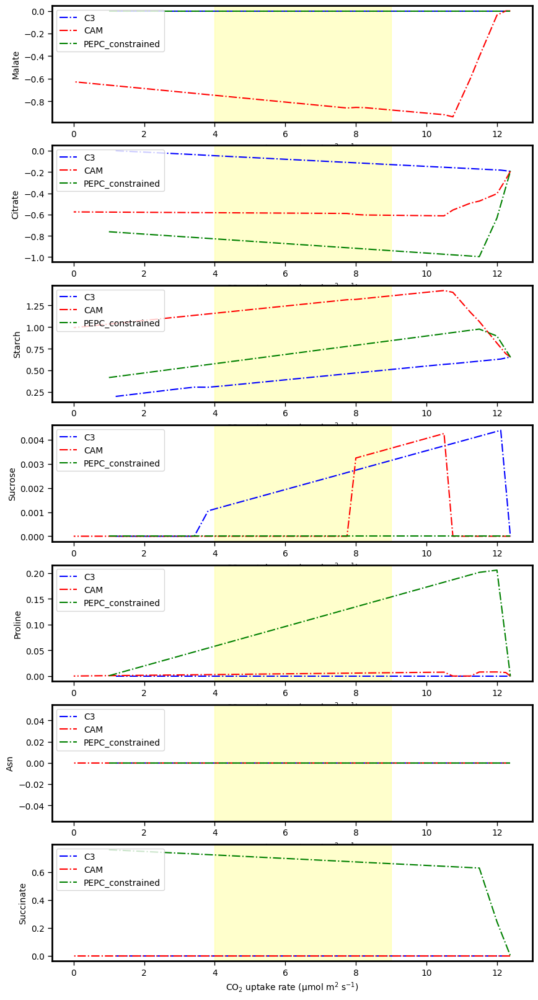

In [242]:
x_axis = "CO2_tx_00"
x_axis_label = "CO$_{2}$ uptake rate (\u00B5mol m$^{2}$ s$^{-1}$)"
y_axes = ["MAL_v_linker_12_to_00", "CIT_v_linker_12_to_00", "STARCH_p_linker_00_to_12", "SUCROSE_v_linker_00_to_12", "PRO_v_linker_00_to_12", "ASN_v_linker_12_to_00", "SUC_v_linker_00_to_12"]
y_axes_labels = ["Malate", "Citrate", "Starch", "Sucrose", "Proline","Asn", "Succinate"]

import matplotlib.pyplot as plt
from scipy import stats

fig, axs = plt.subplots(nrows=len(y_axes), ncols=1, figsize=(10, 20))
colors = ['blue', 'red', 'green', 'orange', 'purple', 'brown', 'pink', 'gray', 'olive', 'cyan']


for count, y_axis in enumerate(y_axes):
    
    
    for df, df_name in zip(df_list, df_name_list):
        # Assign colors to lines based on dataframe index
        color_index = df_name_list.index(df_name)
        color = colors[color_index % len(colors)]
    
        x1 = df.T[x_axis]
        x1 = x1.dropna()

        
        y1 = df.T[y_axis]
        y1 = y1.dropna()

        axs[count].plot(x1, y1, color=color, label=df_name, linestyle ="dashdot")

        # Calculate slope using linear regression
        slope, intercept, r_value, p_value, std_err = stats.linregress(x1, y1)

        print(slope, intercept)

    axs[count].set_xlabel(x_axis_label)
    axs[count].set_ylabel(y_axes_labels[count])
    axs[count].legend(loc='upper left')
    # Highlight the region between 4 and 9 on the x-axis
    axs[count].axvspan(4, 9, alpha=0.2, color='yellow')

plt.legend(loc='upper left')
plt.show()


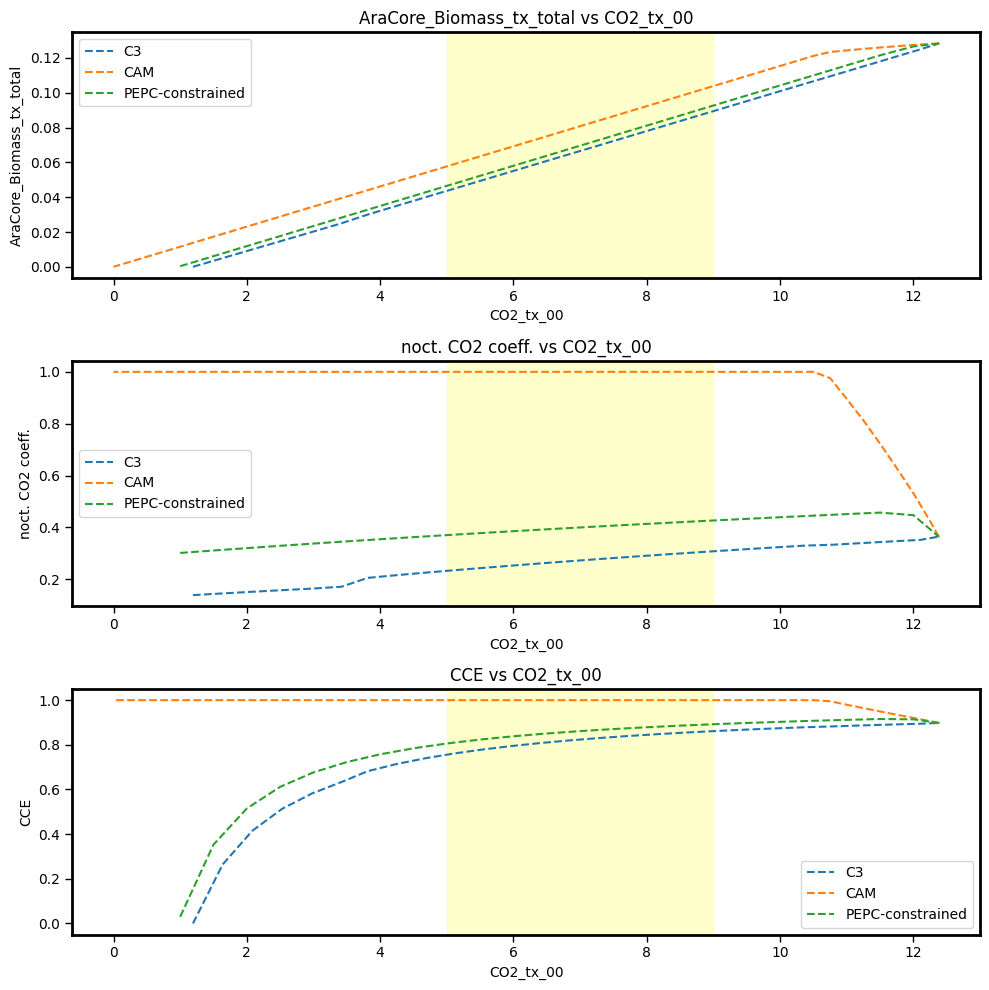

In [243]:
import matplotlib.pyplot as plt

# rxn_list = ['AraCore_Biomass_tx_total', "ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12", "PEPCARBOX_RXN_c_12"] + list(df_A1.tail(10).index)
rxn_list = ['AraCore_Biomass_tx_total','noct. CO2 coeff.',
 'CCE',
#  'sum of fluxes',
#  'photon use'
#  ,"MAL_v_linker_12_to_00", "CIT_v_linker_12_to_00", "STARCH_p_linker_00_to_12"
 ]

fig, ax = plt.subplots(nrows=len(rxn_list), ncols=1, figsize=(10, 10))

for count, item in enumerate(rxn_list):
    df_A1.T.plot(x='CO2_tx_00', y=item, kind='line', style="--", ax=ax[count], label='C3')
    df_B1.T.plot(x='CO2_tx_00', y=item, kind='line', style="--", ax=ax[count], label='CAM')
    df_C1.T.plot(x='CO2_tx_00', y=item, kind='line', style="--", ax=ax[count], label='PEPC-constrained')
    

    # Highlight the region between 5 and 9 on the x-axis
    ax[count].axvspan(5, 9, alpha=0.2, color='yellow')

    ax[count].set_xlabel('CO2_tx_00')
    ax[count].set_ylabel(item)
    ax[count].set_title(item +' vs CO2_tx_00')
    ax[count].legend()

plt.tight_layout()
plt.show()

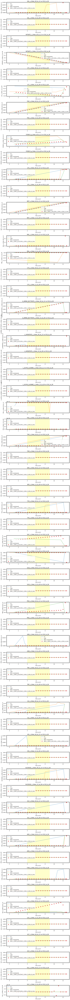

In [244]:
import matplotlib.pyplot as plt

# rxn_list = ['AraCore_Biomass_tx_total', "ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12", "PEPCARBOX_RXN_c_12"] + list(df_A1.tail(10).index)
rxn_list = ['AraCore_Biomass_tx_total','noct. CO2 coeff.',
 'CCE',
 'sum of fluxes',
 'photon use',"MAL_v_linker_12_to_00", "CIT_v_linker_12_to_00", "STARCH_p_linker_00_to_12", "SUCROSE_v_linker_00_to_12", "PRO_v_linker_00_to_12", "ASN_v_linker_12_to_00"]


rxn_list = []
for rxn in diel_model.reactions:
    if "linker" in rxn.id:
        rxn_list.append(rxn.id)

fig, ax = plt.subplots(nrows=len(rxn_list), ncols=1, figsize=(10, 140))

for count, item in enumerate(rxn_list):
    df_A1.T.plot(x='CO2_tx_00', y=item, kind='line', style="--", ax=ax[count], label='C3')
    df_B1.T.plot(x='CO2_tx_00', y=item, kind='line', style="--", ax=ax[count], label='CAM')
    df_C1.T.plot(x='CO2_tx_00', y=item, kind='line', style="--", ax=ax[count], label='PEPC-constrained')
    #df_D1.T.plot(x='CO2_tx_00', y=item, kind='line', style="o", ax=ax[count], label='PEPC_c_off')
    #df_E1.T.plot(x='CO2_tx_00', y=item, kind='line', style="o", ax=ax[count], label='PEPC_c_PEPC_p_off')
    #df_F1.T.plot(x='CO2_tx_00', y=item, kind='line', style="o", ax=ax[count], label='PEPC_c_PEPC_p_ICDH_c_off')
    #df_G1.T.plot(x='CO2_tx_00', y=item, kind='line', style="o", ax=ax[count], label='PEPC_c_PEPC_p_ICDH_c_ICDH_x_off')
    df_H1.T.plot(x='CO2_tx_00', y=item, kind='line', style="o", ax=ax[count], label='PEPC_c_PEPC_p_off_ICDH_c_ICDH_x_ICDH_m_irrev')

    # Highlight the region between 4 and 9 on the x-axis
    ax[count].axvspan(4, 9, alpha=0.2, color='yellow')

    ax[count].set_xlabel('CO2_tx_00')
    ax[count].set_ylabel(item)
    ax[count].set_title(item +' vs CO2_tx_00')
    ax[count].legend()

plt.tight_layout()
plt.show()

# Compare all the different scenarios

In [245]:
df_name_list = ["CO2-onconstrained", "C3", "CAM-cycling", "PEPC-constrained"]

solutions = [solution_C3_unlimited, solution_C3, solution_CAM_cyc, solution_PEPC_const]

models = [C3_unlimited,C3_model_opt, CAM_cyc_model_opt, PEPC_const_model_opt]

metrics_df = create_dataframe(df_name_list, solutions, models)



CO2 daytime exchange: 12.37964413762519
CO2 nightime exchange: -1.2611640158317665
CO2 respiratory losses: 0 (no CO2_m_00 found)
Carbon day to night: 5.203140792838212
Carbon night to day: 1.1623567465581794
CO2 exchange night:day: 0.22339521316780214
AraCore_Biomass_tx_00 carbon flux: -8.338860091345081
AraCore_Biomass_tx_12 carbon flux: -2.77962003044836
total carbon biomass flux: -11.118480121793441
total CCE: 0.8981259879677206
nCO2RC: 0.36469150212007734
night CCE1 (carbon in to biomass): 0.5342196456175715
night CCE2 (1 - (carbon lost / carbon in)): 0.7576148587853557
CO2 daytime exchange: 6.643524797554305
CO2 nightime exchange: -1.231073727194467
CO2 respiratory losses: 0 (no CO2_m_00 found)
Carbon day to night: 3.1437921941269704
Carbon night to day: 0.5596056993425462
CO2 exchange night:day: 0.1780033999664372
AraCore_Biomass_tx_00 carbon flux: -4.059338302769883
AraCore_Biomass_tx_12 carbon flux: -1.3531127675899617
total carbon biomass flux: -5.412451070359845
total CCE: 0.

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarnin

In [246]:
import matplotlib.pyplot as plt

df = pd.DataFrame(CO2_rxns_dict)


df.index=['CO2_unconstrained', 'CO2_indirect', 'CO2_direct', 'PEPC_limited']
df = df.reindex(['CO2_unconstrained', 'CO2_direct', 'CO2_indirect', 'PEPC_limited'])

df.T.loc['PEPCARBOX_RXN_c_12'] = df.T.loc['PEPCARBOX_RXN_c_12'] * -1

df = df.drop(columns=["RXN0_5224_c_12", "RXN0_5224_p_12"])

generate_multiple_stacked_bars(df)

ValueError: Length mismatch: Expected axis has 2 elements, new values have 4 elements

Total: 1.9851206461748516
Total: 1.6774721839867521
Total: 1.970553328893963
Total: 1.603219288882095


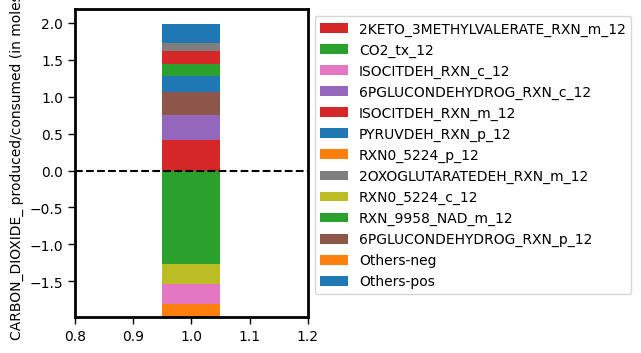

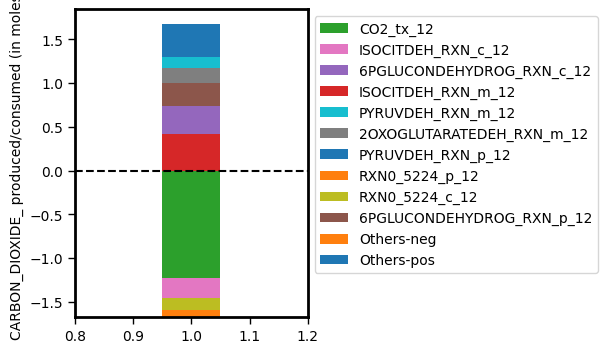

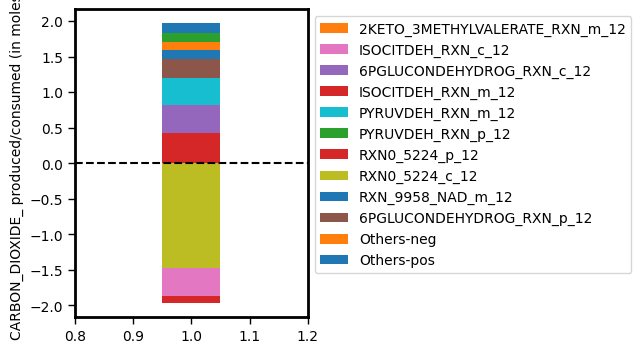

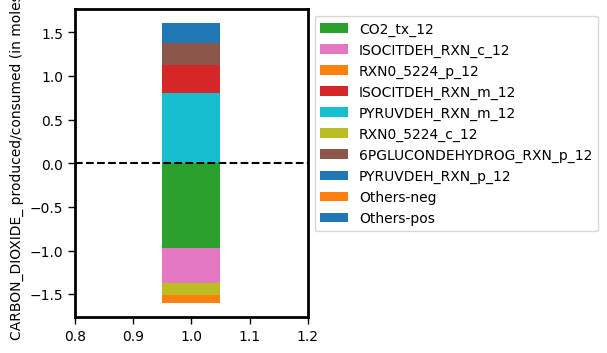

In [ ]:
CO2_models = {"CO2_unconstrained": [C3_unlimited_opt, solution_C3_unlimited],
              "CO2_indirect": [C3_model_opt, solution_C3],
              "CO2_direct": [CAM_cyc_model_opt, solution_CAM_cyc],
              "PEPC_limited": [PEPC_const_model_opt, solution_PEPC_const]}

df_CO2_models = pd.DataFrame()

for model_name, model in CO2_models.items():
    _, df_temp = generateMetaboliteBudget(model[0], model[1], show_plot=True, percentage=False, day_or_night_tag="_12", 
                         metabolite="CARBON_DIOXIDE_", threshold=0.05, colourDict=colourDict_CO2)
    
    df_CO2_models = df_CO2_models.combine_first(df_temp)
    
    df_CO2_models[model_name] = df_temp["value"]

 

In [ ]:
df_CO2_models

,CO2_direct,CO2_indirect,CO2_unconstrained,value,PEPC_limited
2KETO_3METHYLVALERATE_RXN_m_12,0.120290,NaN,1.724712e-01,1.724712e-01,NaN
2OXOGLUTARATEDEH_RXN_m_12,NaN,0.171596,1.045164e-01,1.045164e-01,NaN
6PGLUCONDEHYDROG_RXN_c_12,0.401194,0.321381,3.384473e-01,3.384473e-01,NaN
6PGLUCONDEHYDROG_RXN_p_12,0.267938,0.256564,3.091804e-01,3.091804e-01,0.259694
CO2_tx_12,NaN,-1.231074,-1.261164e+00,-1.261164e+00,-0.969965
ISOCITDEH_RXN_c_12,-0.391173,-0.225648,-2.704829e-01,-2.704829e-01,-0.397805
ISOCITDEH_RXN_m_12,0.418344,0.418344,4.183444e-01,4.183444e-01,0.313815
Others-neg,-0.004767,0.000000,-2.293525e-17,-2.293525e-17,-0.004071
Others-pos,0.144855,0.278386,2.602512e-01,2.602512e-01,0.121039
PYRUVDEH_RXN_m_12,0.379398,0.129246,NaN,1.292465e-01,0.807692


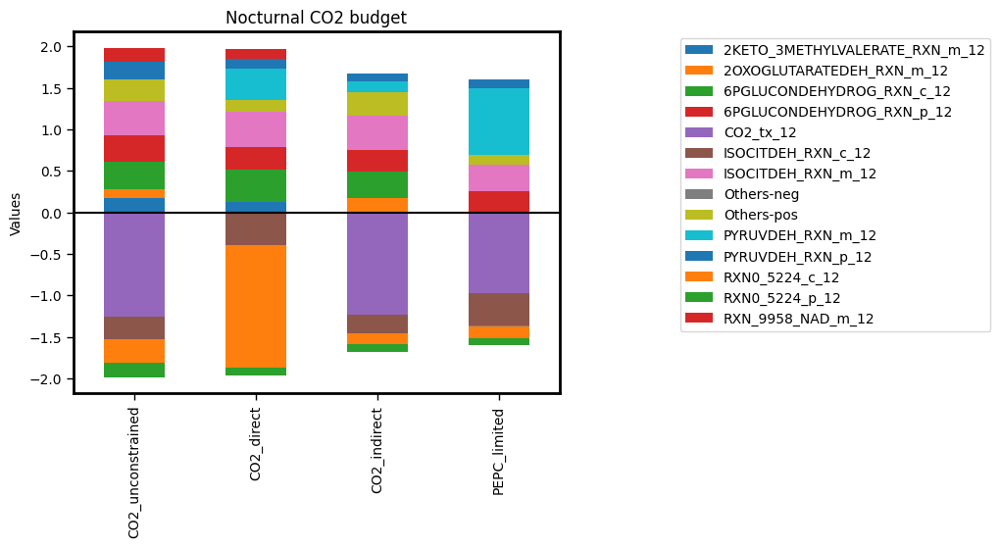

In [ ]:
df_CO2_models = df_CO2_models.T.reindex(['CO2_unconstrained', 'CO2_direct', 'CO2_indirect', "PEPC_limited"])

generate_multiple_stacked_bars(df_CO2_models)

In [ ]:
metrics_df

,C3,CAM-cycling,CO2-onconstrained,PEPC-constrained
% nCO2R,26.611378,1.000000e+02,36.469150,39.498934
CIT_v_linker_12_to_00,0.091192,5.877512e-01,0.193726,0.887366
CO2 daytime exchange,6.643525,6.643000e+00,12.379644,6.643000
CO2 exchange night:day,0.178003,8.044860e-01,0.223395,0.690341
CO2 nightime exchange,-1.231074,-1.947484e-14,-1.261164,-0.969965
Carbon day to night,3.143792,8.494275e+00,5.203141,7.712419
Carbon night to day,0.559606,6.833525e+00,1.162357,5.324196
MAL_v_linker_12_to_00,0.000000,8.267544e-01,0.000000,0.000000
Photon flux,111.453565,1.391162e+02,200.000000,122.340342
Rubisco flux,7.940494,9.792442e+00,14.790311,8.487407


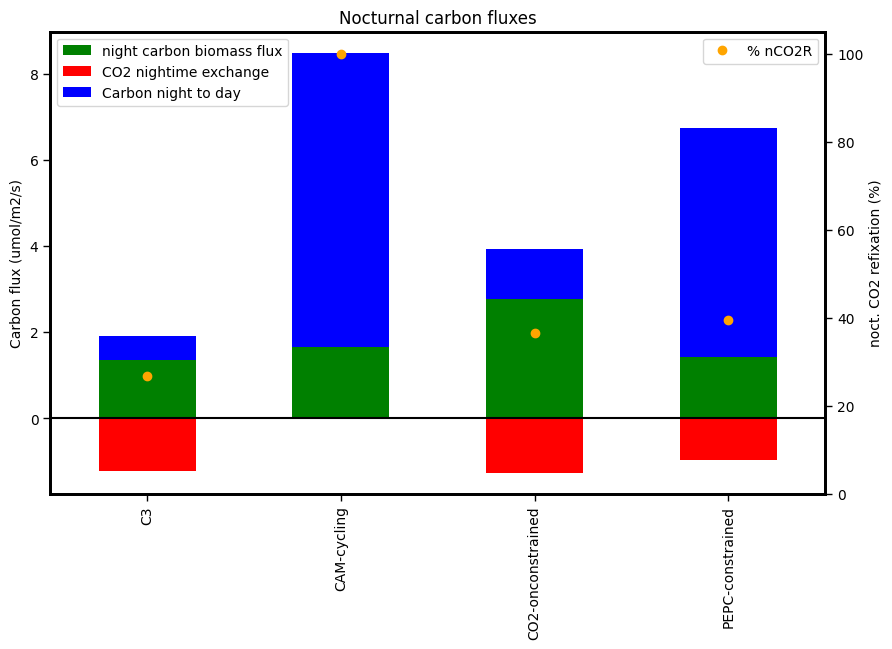

In [ ]:
plot_night_carbon_fluxes(metrics_df)


In [ ]:
import matplotlib.pyplot as plt

def plot_day_and_night_carbon_fluxes(metrics_df):
    subset_df = metrics_df.T[['Carbon day to night', 'night carbon biomass flux', 'CO2 nightime exchange', 'Carbon night to day', '% nCO2R']]

    # Define custom colors for each item
    colors = ['green', 'red', 'blue', 'orange', 'purple']

    fig, ax1 = plt.subplots(figsize=(12, 6))
    ax2 = ax1.twinx()
    
    # Plot Carbon day to night in the first column
    subset_df['Carbon day to night'].plot.bar(ax=ax1, color=colors[0])
    ax1.set_ylabel('Carbon flux (umol/m2/s)')
    ax1.set_title('Carbon day to night')

    # Plot the stacked bar in the second column
    subset_df[['night carbon biomass flux', 'CO2 nightime exchange', 'Carbon night to day']].plot.bar(stacked=True, ax=ax2, color=colors[1:4])
    subset_df['% nCO2R'].plot(style='o', ax=ax2, color=colors[4])  # Plot nCO2RC as a dot
    ax2.set_ylim(0, 105)
    ax2.set_ylabel('Carbon flux (umol/m2/s) / noct. CO2 refixation (%)')
    ax2.set_title('Nocturnal carbon fluxes')

    plt.tight_layout()
    plt.show()

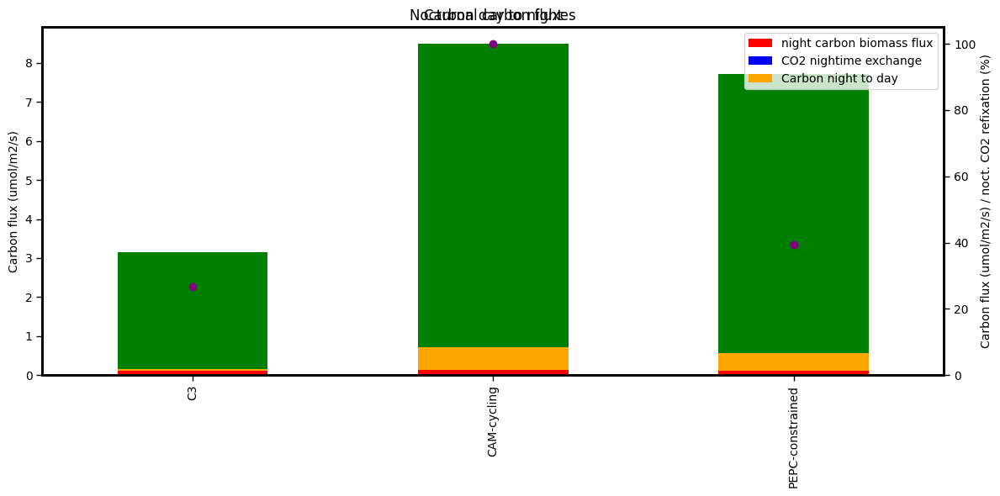

In [ ]:
plot_day_and_night_carbon_fluxes(metrics_df)

In [ ]:
metrics_df

,C3,CAM-cycling,PEPC-constrained
% nCO2R,26.611378,1.000000e+02,39.498934
CIT_v_linker_12_to_00,0.091192,5.877512e-01,0.887366
CO2 daytime exchange,6.643525,6.643000e+00,6.643000
CO2 exchange night:day,0.178003,8.044860e-01,0.690341
CO2 nightime exchange,-1.231074,-1.947484e-14,-0.969965
Carbon day to night,3.143792,8.494275e+00,7.712419
Carbon night to day,0.559606,6.833525e+00,5.324196
MAL_v_linker_12_to_00,0.000000,8.267544e-01,0.000000
Photon flux,111.453565,1.391162e+02,122.340342
Rubisco flux,7.940494,9.792442e+00,8.487407


### Budgets

Total: 1.603219288882095


({'Others-pos': 0.12103881801812186,
  'Others-neg': -0.00407095477127712,
  'CO2_tx_12': -0.969964758861307,
  'PYRUVDEH_RXN_m_12': 0.8076917821180771,
  'ISOCITDEH_RXN_c_12': -0.3978054965359461,
  'ISOCITDEH_RXN_m_12': 0.3138146574275186,
  '6PGLUCONDEHYDROG_RXN_p_12': 0.259694088808231,
  'RXN0_5224_c_12': -0.14302062901718687,
  'PYRUVDEH_RXN_p_12': 0.10097994251014668,
  'RXN0_5224_p_12': -0.08835744969637836},
                               value
 Others-pos                 0.121039
 Others-neg                -0.004071
 CO2_tx_12                 -0.969965
 PYRUVDEH_RXN_m_12          0.807692
 ISOCITDEH_RXN_c_12        -0.397805
 ISOCITDEH_RXN_m_12         0.313815
 6PGLUCONDEHYDROG_RXN_p_12  0.259694
 RXN0_5224_c_12            -0.143021
 PYRUVDEH_RXN_p_12          0.100980
 RXN0_5224_p_12            -0.088357)

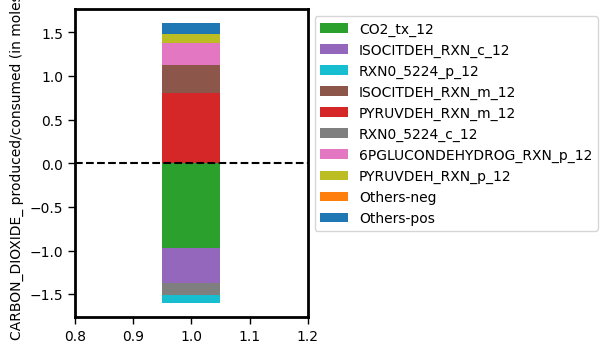

In [ ]:
generateMetaboliteBudget(PEPC_const_model_opt, solution_PEPC_const, "PEPC_constrained", show_plot=True, percentage=False, day_or_night_tag="_12", 
                         metabolite="CARBON_DIOXIDE_")

Total: 0.23137807871356525


({'Others-pos': 0,
  'Others-neg': 0.0,
  'RXN0_5224_c_12': 0.14302062901718687,
  'PEPCARBOX_RXN_c_12': -0.14302062901718687,
  'RXN0_5224_p_12': 0.08835744969637836,
  'ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12': -0.08835744969637836},
                                          value
 Others-pos                            0.000000
 Others-neg                            0.000000
 RXN0_5224_c_12                        0.143021
 PEPCARBOX_RXN_c_12                   -0.143021
 RXN0_5224_p_12                        0.088357
 ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12 -0.088357)

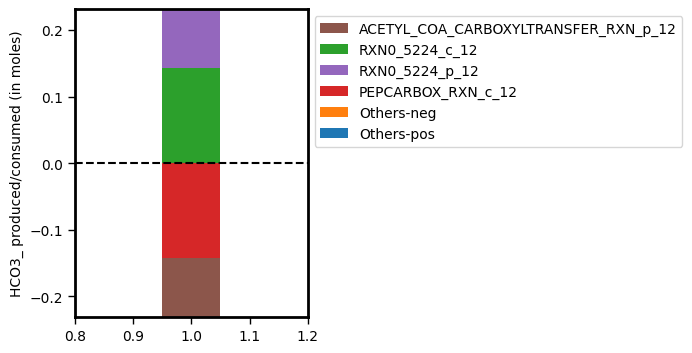

In [ ]:
generateMetaboliteBudget(PEPC_const_model_opt, solution_PEPC_const, "PEPC_constrained", show_plot=True, percentage=False, day_or_night_tag="_12", 
                         metabolite="HCO3_")

In [ ]:
df_list = [df_A1, df_B1, df_C1]
df_name_list = ["C3", "CAM", "PEPC_constrained"]
models = [C3_model_opt, CAM_cyc_model_opt, PEPC_const_model_opt]
solutions = [solution_C3, solution_CAM_cyc, solution_PEPC_const]

In [ ]:
df_list = [df_A1, df_B1, df_C1, df_D1, df_E1, df_F1]
df_name_list = ["C3", "CAM", "PEPC_constrained", "PEPC_c_off", "PEPC_c_PEPC_p_off", "PEPC_c_PEPC_p_ICDH_c_off"]
models = [C3_model_opt, CAM_cyc_model_opt, PEPC_const_model_opt, CO2_limit_model1_opt, CO2_limit_model2_opt, CO2_limit_model3_opt]
solutions = [solution_C3, solution_CAM_cyc, solution_PEPC_const, solution_CO2_limit1, solution_CO2_limit2, solution_CO2_limit3]

Total: 0.9294571960770956
Total: 2.9663585821126603
Total: 1.161528381209447
Total: 4.412822521576894
Total: 0.9722981147092363
Total: 1.0196116837254305


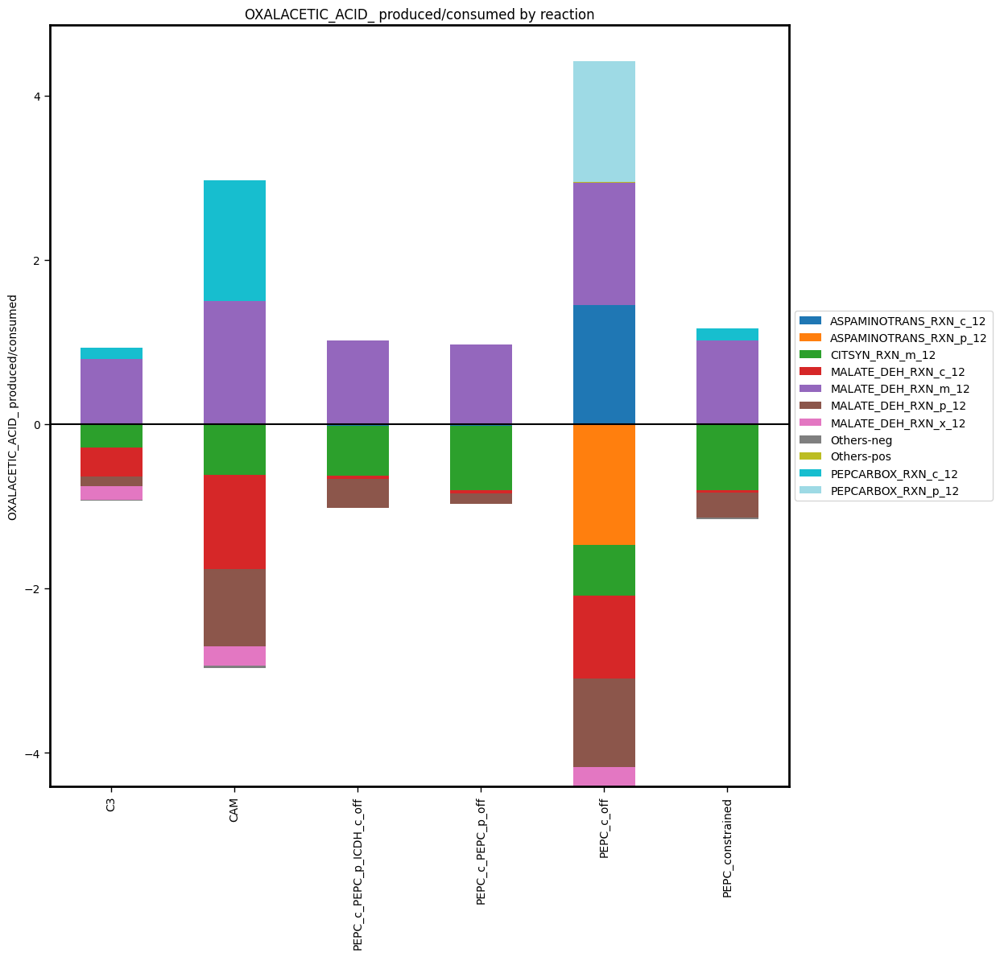

,C3,CAM,PEPC_c_PEPC_p_ICDH_c_off,PEPC_c_PEPC_p_off,PEPC_c_off,PEPC_constrained
ASPAMINOTRANS_RXN_c_12,NaN,NaN,-2.189625e-02,-2.199034e-02,1.446623e+00,NaN
ASPAMINOTRANS_RXN_p_12,NaN,NaN,NaN,NaN,-1.470246e+00,NaN
CITSYN_RXN_m_12,-0.288006,-0.619977,-6.121274e-01,-7.871322e-01,-6.216226e-01,-8.076918e-01
MALATE_DEH_RXN_c_12,-0.349398,-1.141679,-3.058636e-02,-3.071778e-02,-1.006503e+00,-3.138396e-02
MALATE_DEH_RXN_m_12,0.793006,1.495210,1.019612e+00,9.722981e-01,1.494679e+00,1.018508e+00
MALATE_DEH_RXN_p_12,-0.122973,-0.941774,-3.550017e-01,-1.324578e-01,-1.073871e+00,-2.999854e-01
MALATE_DEH_RXN_x_12,-0.158760,-0.240580,NaN,NaN,-2.405795e-01,NaN
Others-neg,-0.010321,-0.022349,0.000000e+00,-8.180165e-17,-8.532420e-17,-2.246724e-02
Others-pos,0.000000,0.000000,4.090058e-17,1.500785e-18,1.273779e-03,3.581141e-17
PEPCARBOX_RXN_c_12,0.136451,1.471149,NaN,NaN,NaN,1.430206e-01


In [ ]:
plot_metabolite_budgets(df_name_list, models, solutions, "OXALACETIC_ACID_")

Total: 0.17159567130392706
Total: 0.0012737790523841695
Total: 0
Total: 0
Total: 0
Total: 0


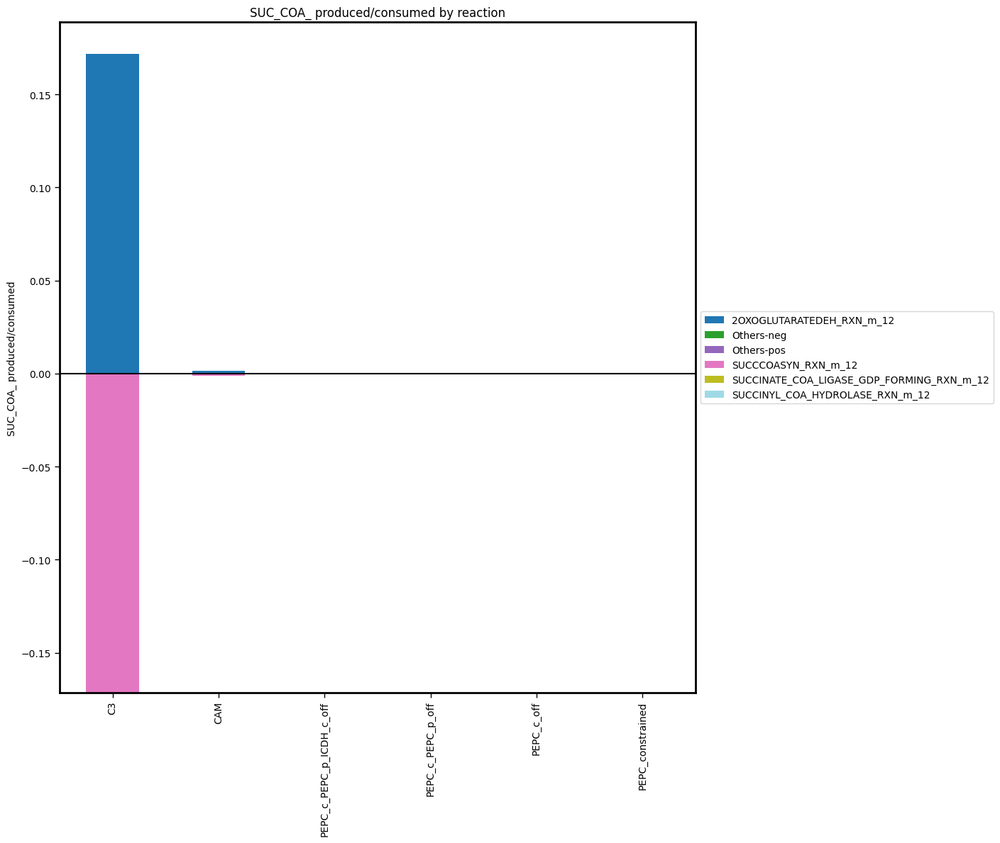

,C3,CAM,PEPC_c_PEPC_p_ICDH_c_off,PEPC_c_PEPC_p_off,PEPC_c_off,PEPC_constrained
2OXOGLUTARATEDEH_RXN_m_12,0.171596,0.001274,0.0,0.0,0.0,0.0
Others-neg,0.000000,0.000000,0.0,0.0,0.0,0.0
Others-pos,0.000000,0.000000,0.0,0.0,0.0,0.0
SUCCCOASYN_RXN_m_12,-0.171596,-0.001274,-0.0,-0.0,-0.0,-0.0
SUCCINATE_COA_LIGASE_GDP_FORMING_RXN_m_12,NaN,NaN,-0.0,-0.0,-0.0,-0.0
SUCCINYL_COA_HYDROLASE_RXN_m_12,NaN,NaN,-0.0,-0.0,-0.0,-0.0


In [ ]:
plot_metabolite_budgets(df_name_list, models, solutions, "SUC_COA_")

In [ ]:
diel_model.reactions.SUCCCOASYN_RXN_m_12

Reaction identifier,SUCCCOASYN_RXN_m_12
Name,SUCCCOASYN-RXN:Succinate--CoA ligase (ADP-forming)
Memory address,0x7f668afe3040
Stoichiometry,ADP_m_12 + Pi_m_12 + SUC_COA_m_12 --> ATP_m_12 + CO_A_m_12 + SUC_m_12 ADP + Pi[m] + SUC-COA --> ATP + CO-A + SUC
GPR,
Lower bound,0.0
Upper bound,1000.0


Total: 0.4766240769816724
Total: 0.5127366348963823
Total: 0.397805496535946
Total: 1.960633575794419
Total: 0.3982414737971846
Total: 0.39832748264092604


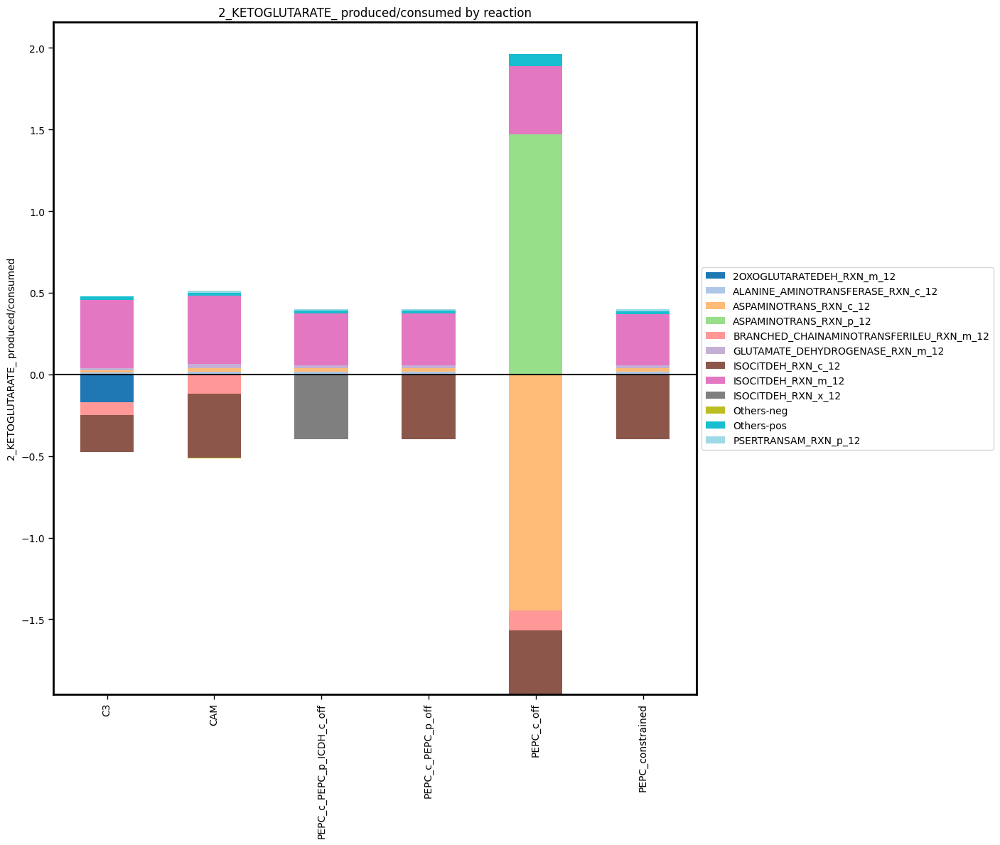

,C3,CAM,PEPC_c_PEPC_p_ICDH_c_off,PEPC_c_PEPC_p_off,PEPC_c_off,PEPC_constrained
2OXOGLUTARATEDEH_RXN_m_12,-0.171596,NaN,NaN,NaN,NaN,NaN
ALANINE_AMINOTRANSFERASE_RXN_c_12,0.014231,0.017466,1.453686e-02,1.459932e-02,NaN,1.491594e-02
ASPAMINOTRANS_RXN_c_12,0.010321,0.022349,2.189625e-02,2.199034e-02,-1.446623,2.246724e-02
ASPAMINOTRANS_RXN_p_12,NaN,NaN,NaN,NaN,1.470246,NaN
BRANCHED_CHAINAMINOTRANSFERILEU_RXN_m_12,-0.079380,-0.120290,NaN,NaN,-0.120290,NaN
GLUTAMATE_DEHYDROGENASE_RXN_m_12,0.015089,0.023287,1.938148e-02,1.946476e-02,NaN,1.988690e-02
ISOCITDEH_RXN_c_12,-0.225648,-0.391173,NaN,-3.982415e-01,-0.392447,-3.978055e-01
ISOCITDEH_RXN_m_12,0.418344,0.418344,3.164712e-01,3.160335e-01,0.418344,3.138147e-01
ISOCITDEH_RXN_x_12,NaN,NaN,-3.983275e-01,NaN,NaN,NaN
Others-neg,0.000000,-0.001274,-5.718022e-13,-1.500785e-18,-0.001274,-3.581141e-17


In [ ]:
plot_metabolite_budgets(df_name_list, models, solutions, "2_KETOGLUTARATE_")

In [ ]:
diel_model.reactions.BRANCHED_CHAINAMINOTRANSFERILEU_RXN_m_12

Reaction identifier,BRANCHED_CHAINAMINOTRANSFERILEU_RXN_m_12
Name,BRANCHED-CHAINAMINOTRANSFERILEU-RXN:Branched-chain amino acid aminotransferase
Memory address,0x7f665e5e5b70
Stoichiometry,2_KETOGLUTARATE_m_12 + ILE_m_12 <=> 2_KETO_3_METHYL_VALERATE_m_12 + GLT_m_12 + 0.12 PROTON_m_12 2-KETOGLUTARATE + ILE <=> 2-KETO-3-METHYL-VALERATE + GLT + 0.12 PROTON
GPR,
Lower bound,-1000.0
Upper bound,1000.0


In [ ]:
diel_model.reactions.get_by_id("2OXOGLUTARATEDEH_RXN_m_12")

Reaction identifier,2OXOGLUTARATEDEH_RXN_m_12
Name,2OXOGLUTARATEDEH-RXN:NIL
Memory address,0x7f6669888d60
Stoichiometry,2_KETOGLUTARATE_m_12 + CO_A_m_12 + NAD_m_12 --> CARBON_DIOXIDE_m_12 + NADH_m_12 + SUC_COA_m_12 2-KETOGLUTARATE + CO-A + NAD --> CARBON-DIOXIDE + NADH + SUC-COA
GPR,
Lower bound,0.0
Upper bound,1000.0


Total: 0.41834444444444435
Total: 0.41834444444444435
Total: 0.3978054965359461
Total: 0.4196182234968272
Total: 0.3982414737971853
Total: 0.39832748264035434


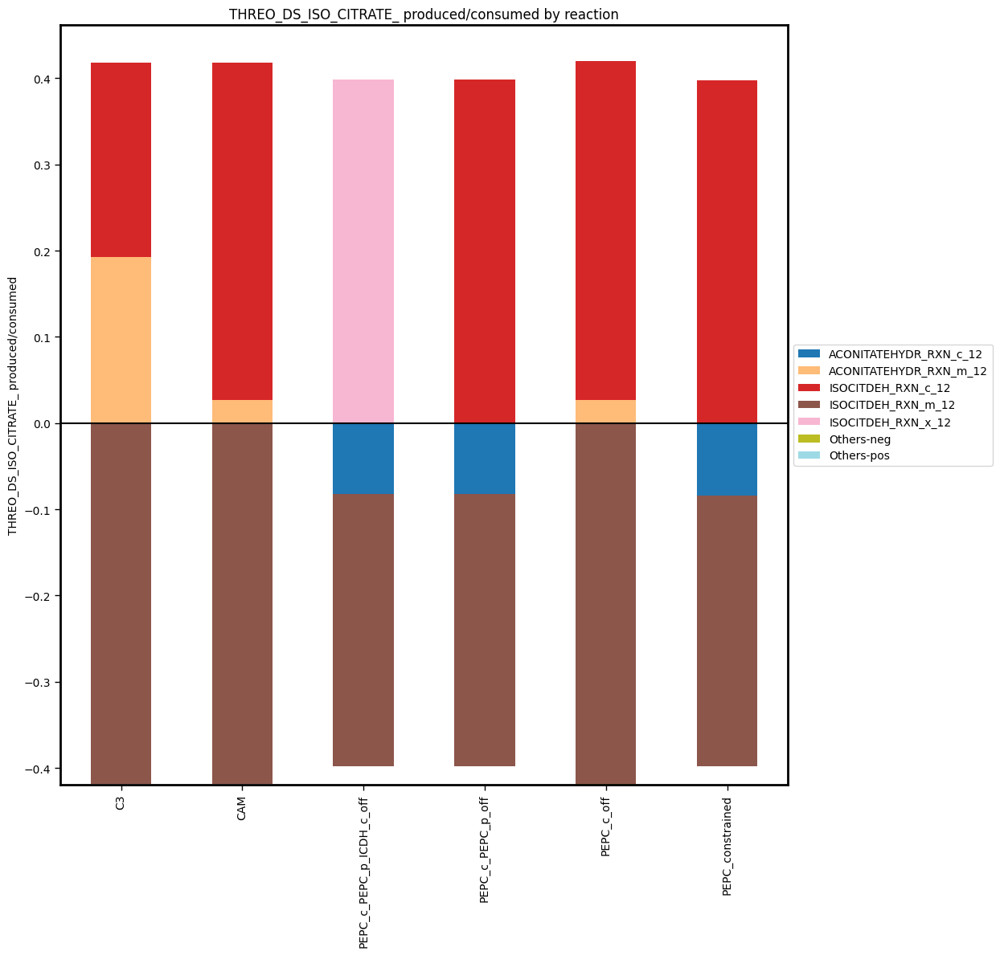

,C3,CAM,PEPC_c_PEPC_p_ICDH_c_off,PEPC_c_PEPC_p_off,PEPC_c_off,PEPC_constrained
ACONITATEHYDR_RXN_c_12,NaN,NaN,-0.081856,-0.082208,NaN,-0.083991
ACONITATEHYDR_RXN_m_12,0.192696,0.027171,NaN,NaN,0.027171,NaN
ISOCITDEH_RXN_c_12,0.225648,0.391173,NaN,0.398241,0.392447,0.397805
ISOCITDEH_RXN_m_12,-0.418344,-0.418344,-0.316471,-0.316033,-0.418344,-0.313815
ISOCITDEH_RXN_x_12,NaN,NaN,0.398327,NaN,NaN,NaN
Others-neg,0.000000,0.000000,0.000000,0.000000,-0.001274,0.000000
Others-pos,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [ ]:
plot_metabolite_budgets(df_name_list, models, solutions, "THREO_DS_ISO_CITRATE_")

In [ ]:
diel_model.metabolites.THREO_DS_ISO_CITRATE_c_12.reactions

frozenset({<Reaction 2KG_ISOCITRATE_mc_12 at 0x7f665597c100>,
           <Reaction ACONITATEHYDR_RXN_c_12 at 0x7f665ae76d70>,
           <Reaction CIT_ISOCITRATE_mc_12 at 0x7f667c2fca90>,
           <Reaction ISOCITDEH_RXN_c_12 at 0x7f665e5e4040>,
           <Reaction ISOCITRATE_ACONITATE_mc_12 at 0x7f66a0c1ea70>,
           <Reaction MAL_ISOCITRATE_mc_12 at 0x7f66834a17b0>,
           <Reaction OAA_ISOCITRATE_mc_12 at 0x7f66b9437490>,
           <Reaction SUC_ISOCITRATE_mc_12 at 0x7f6671234ee0>,
           <Reaction THREO_DS_ISO_CITRATE_xc_12 at 0x7f665e5e7c70>})

In [ ]:
diel_model.reactions.ISOCITDEH_RXN_c_12

Reaction identifier,ISOCITDEH_RXN_c_12
Name,ISOCITDEH-RXN:Isocitrate dehydrogenase (NADP+)
Memory address,0x7f665e5e4040
Stoichiometry,NADP_c_12 + THREO_DS_ISO_CITRATE_c_12 <=> 2_KETOGLUTARATE_c_12 + CARBON_DIOXIDE_c_12 + NADPH_c_12 NADP + THREO-DS-ISO-CITRATE <=> 2-KETOGLUTARATE + CARBON-DIOXIDE + NADPH
GPR,
Lower bound,-1000.0
Upper bound,1000.0


Total: 0.19269598770674687
Total: 0.027171362243766695
Total: 0.08399083910842657
Total: 0.027171362243765887
Total: 0.08220797777752493
Total: 0.08185625796497094


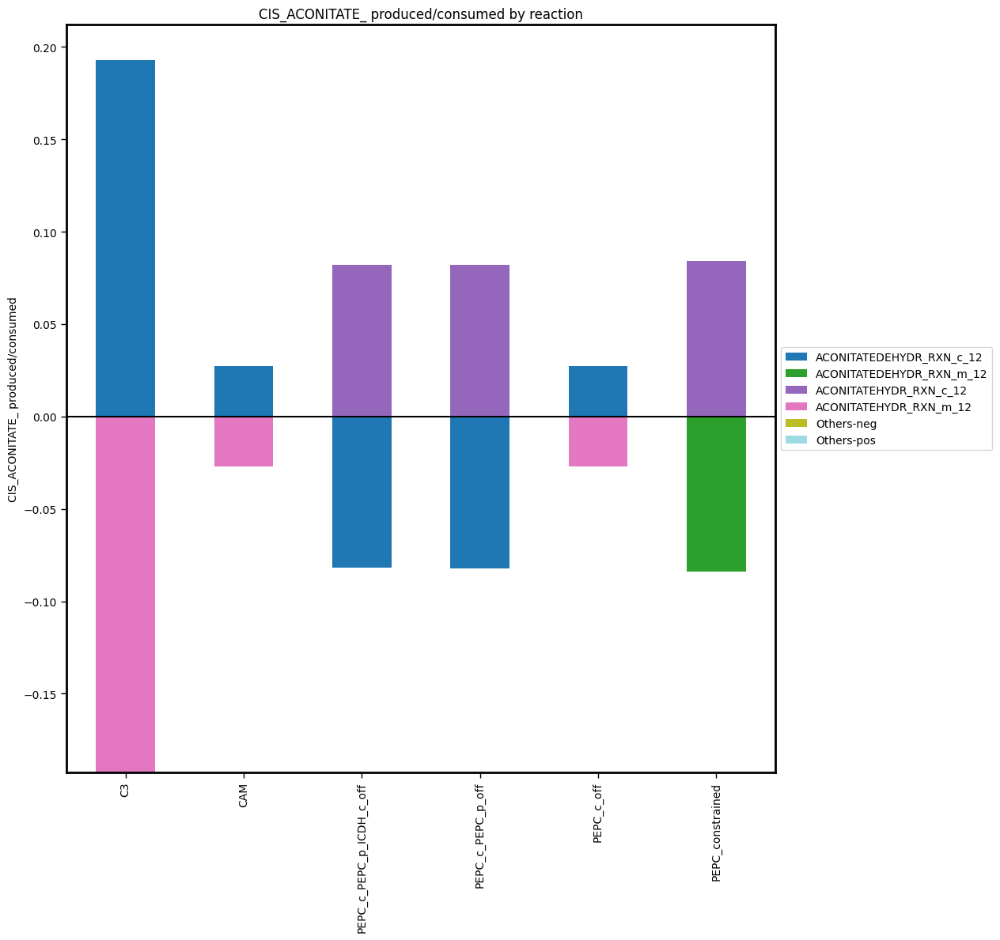

,C3,CAM,PEPC_c_PEPC_p_ICDH_c_off,PEPC_c_PEPC_p_off,PEPC_c_off,PEPC_constrained
ACONITATEDEHYDR_RXN_c_12,0.192696,0.027171,-0.081856,-0.082208,0.027171,NaN
ACONITATEDEHYDR_RXN_m_12,NaN,NaN,NaN,NaN,NaN,-0.083991
ACONITATEHYDR_RXN_c_12,NaN,NaN,0.081856,0.082208,NaN,0.083991
ACONITATEHYDR_RXN_m_12,-0.192696,-0.027171,NaN,NaN,-0.027171,NaN
Others-neg,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Others-pos,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [ ]:
plot_metabolite_budgets(df_name_list, models, solutions, "CIS_ACONITATE_")

Total: 0.28800634822662247
Total: 0.619977332719121
Total: 0.8916826212265062
Total: 0.6216226306617954
Total: 0.8693401798131071
Total: 0.6939836234874266


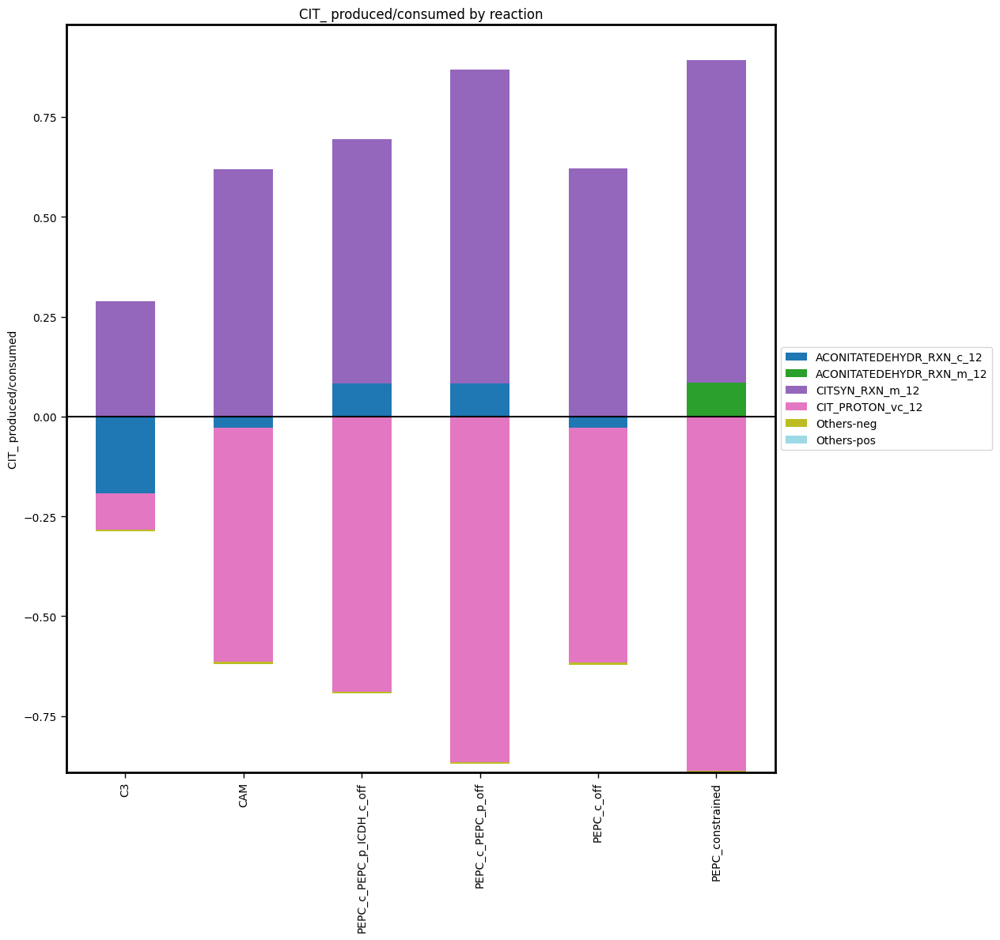

,C3,CAM,PEPC_c_PEPC_p_ICDH_c_off,PEPC_c_PEPC_p_off,PEPC_c_off,PEPC_constrained
ACONITATEDEHYDR_RXN_c_12,-0.192696,-0.027171,0.081856,0.082208,-2.717136e-02,NaN
ACONITATEDEHYDR_RXN_m_12,NaN,NaN,NaN,NaN,NaN,0.083991
CITSYN_RXN_m_12,0.288006,0.619977,0.612127,0.787132,6.216226e-01,0.807692
CIT_PROTON_vc_12,-0.091192,-0.587751,-0.689777,-0.865115,-5.893965e-01,-0.887366
Others-neg,-0.004118,-0.005055,-0.004207,-0.004225,-5.054731e-03,-0.004317
Others-pos,0.000000,0.000000,0.000000,0.000000,8.532420e-17,0.000000


In [ ]:
plot_metabolite_budgets(df_name_list, models, solutions, "CIT_")

In [ ]:
diel_model.reactions.ACONITATEDEHYDR_RXN_c_12

Reaction identifier,ACONITATEDEHYDR_RXN_c_12
Name,ACONITATEDEHYDR-RXN:Aconitate hydratase
Memory address,0x7f667d80dc60
Stoichiometry,CIT_c_12 <=> CIS_ACONITATE_c_12 + WATER_c_12 CIT <=> CIS-ACONITATE + WATER
GPR,
Lower bound,-1000.0
Upper bound,1000.0


Total: 2.068011685253312
Total: 4.699206548094686
Total: 2.2812539007326547
Total: 4.69596902633671
Total: 2.04366546191763
Total: 2.1378687406990444


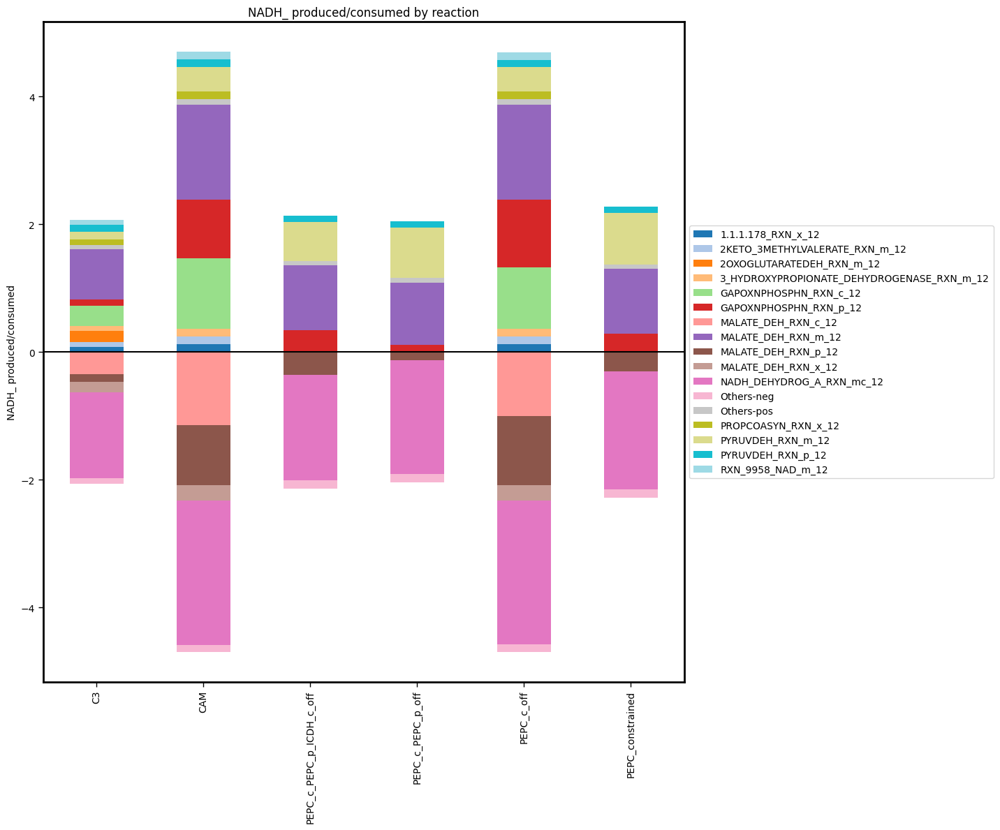

,C3,CAM,PEPC_c_PEPC_p_ICDH_c_off,PEPC_c_PEPC_p_off,PEPC_c_off,PEPC_constrained
1.1.1.178_RXN_x_12,0.079380,0.120290,NaN,NaN,0.120290,NaN
2KETO_3METHYLVALERATE_RXN_m_12,0.079380,0.120290,NaN,NaN,0.120290,NaN
2OXOGLUTARATEDEH_RXN_m_12,0.171596,NaN,NaN,NaN,NaN,NaN
3_HYDROXYPROPIONATE_DEHYDROGENASE_RXN_m_12,0.079380,0.120290,NaN,NaN,0.120290,NaN
GAPOXNPHOSPHN_RXN_c_12,0.319455,1.104929,NaN,NaN,0.969753,NaN
GAPOXNPHOSPHN_RXN_p_12,0.090322,0.915493,0.338462,0.115848,1.050138,0.283015
MALATE_DEH_RXN_c_12,-0.349398,-1.141679,NaN,NaN,-1.006503,NaN
MALATE_DEH_RXN_m_12,0.793006,1.495210,1.019612,0.972298,1.494679,1.018508
MALATE_DEH_RXN_p_12,-0.122973,-0.941774,-0.355002,-0.132458,-1.073871,-0.299985
MALATE_DEH_RXN_x_12,-0.158760,-0.240580,NaN,NaN,-0.240580,NaN


In [ ]:
plot_metabolite_budgets(df_name_list, models, solutions, "NADH_")

In [ ]:
C3_model_opt.reactions.ISOCITDEH_RXN_c_12.notes

{'SUBSYSTEM': 'TCAcyclevariationIV', 'PROTEIN_CLASS': '1.1.1.42'}

In [ ]:
for rxn in C3_model_opt.reactions:
    if ("SUBSYSTEM") in rxn.notes:
        if "TCA" in rxn.notes["SUBSYSTEM"]:
            print(rxn.id, round(rxn.flux,5))

FUMHYDR_RXN_m_00 0.01896
FUMHYDR_RXN_c_00 0.0
ACONITATEHYDR_RXN_c_00 0.0
ACONITATEHYDR_RXN_m_00 0.07884
ISOCITRATE_DEHYDROGENASE_NAD_RXN_m_00 0.0
ACONITATEDEHYDR_RXN_m_00 0.0
ACONITATEDEHYDR_RXN_c_00 0.07884
SUCCCOASYN_RXN_m_00 0.0
ISOCITDEH_RXN_m_00 0.41834
ISOCITDEH_RXN_x_00 0.0
ISOCITDEH_RXN_c_00 -0.33951
PYRUVDEH_RXN_p_00 0.0
PYRUVDEH_RXN_m_00 0.0
MALATE_DEH_RXN_c_00 0.08594
ASPAMINOTRANS_RXN_m_00 0.0
ASPAMINOTRANS_RXN_p_00 -0.45048
MALATE_DEH_RXN_p_00 0.22868
MALATE_DEH_RXN_m_00 0.30771
ASPAMINOTRANS_RXN_x_00 0.0
ASPAMINOTRANS_RXN_c_00 -0.02727
MALATE_DEH_RXN_x_00 1.4414
SUCCINATE_DEHYDROGENASE_UBIQUINONE_RXN_mc_00 0.0
2OXOGLUTARATEDEH_RXN_m_00 0.0
PEPCARBOX_RXN_c_00 0.0556
CITSYN_RXN_x_00 0.0
CITSYN_RXN_m_00 0.0
PEPCARBOX_RXN_p_00 0.46602
FUMHYDR_RXN_m_12 0.16859
FUMHYDR_RXN_c_12 0.0
ACONITATEHYDR_RXN_c_12 0.0
ACONITATEHYDR_RXN_m_12 0.1927
ISOCITRATE_DEHYDROGENASE_NAD_RXN_m_12 0.0
ACONITATEDEHYDR_RXN_m_12 0.0
ACONITATEDEHYDR_RXN_c_12 0.1927
SUCCCOASYN_RXN_m_12 0.1716
ISOCITDEH_RX

In [ ]:
for rxn in PEPC_const_model_opt.reactions:
    if ("SUBSYSTEM") in rxn.notes:
        if "TCA" in rxn.notes["SUBSYSTEM"]:
            print(rxn.id, round(rxn.flux,5))

FUMHYDR_RXN_m_00 0.0
FUMHYDR_RXN_c_00 0.0158
ACONITATEHYDR_RXN_c_00 0.46365
ACONITATEHYDR_RXN_m_00 0.41834
ISOCITRATE_DEHYDROGENASE_NAD_RXN_m_00 0.0
ACONITATEDEHYDR_RXN_m_00 0.0
ACONITATEDEHYDR_RXN_c_00 0.88199
SUCCCOASYN_RXN_m_00 0.0
ISOCITDEH_RXN_m_00 0.41834
ISOCITDEH_RXN_x_00 0.0
ISOCITDEH_RXN_c_00 -0.2296
PYRUVDEH_RXN_p_00 0.0
PYRUVDEH_RXN_m_00 0.0
MALATE_DEH_RXN_c_00 0.26673
ASPAMINOTRANS_RXN_m_00 0.0
ASPAMINOTRANS_RXN_p_00 -0.39078
MALATE_DEH_RXN_p_00 0.2338
MALATE_DEH_RXN_m_00 0.0
ASPAMINOTRANS_RXN_x_00 -0.0
ASPAMINOTRANS_RXN_c_00 -0.02858
MALATE_DEH_RXN_x_00 1.89264
SUCCINATE_DEHYDROGENASE_UBIQUINONE_RXN_mc_00 0.0
2OXOGLUTARATEDEH_RXN_m_00 0.0
PEPCARBOX_RXN_c_00 0.07399
CITSYN_RXN_x_00 0.00758
CITSYN_RXN_m_00 0.0
PEPCARBOX_RXN_p_00 0.40299
FUMHYDR_RXN_m_12 0.69417
FUMHYDR_RXN_c_12 0.0
ACONITATEHYDR_RXN_c_12 -0.08399
ACONITATEHYDR_RXN_m_12 0.0
ISOCITRATE_DEHYDROGENASE_NAD_RXN_m_12 0.0
ACONITATEDEHYDR_RXN_m_12 -0.08399
ACONITATEDEHYDR_RXN_c_12 0.0
SUCCCOASYN_RXN_m_12 0.0
ISOCITD

Total: 1.575466276412427
Total: 1.7637374678415012
Total: 1.7565899548043484
Total: 1.7650112468938859
Total: 1.7548236220202593
Total: 1.7544751629315032


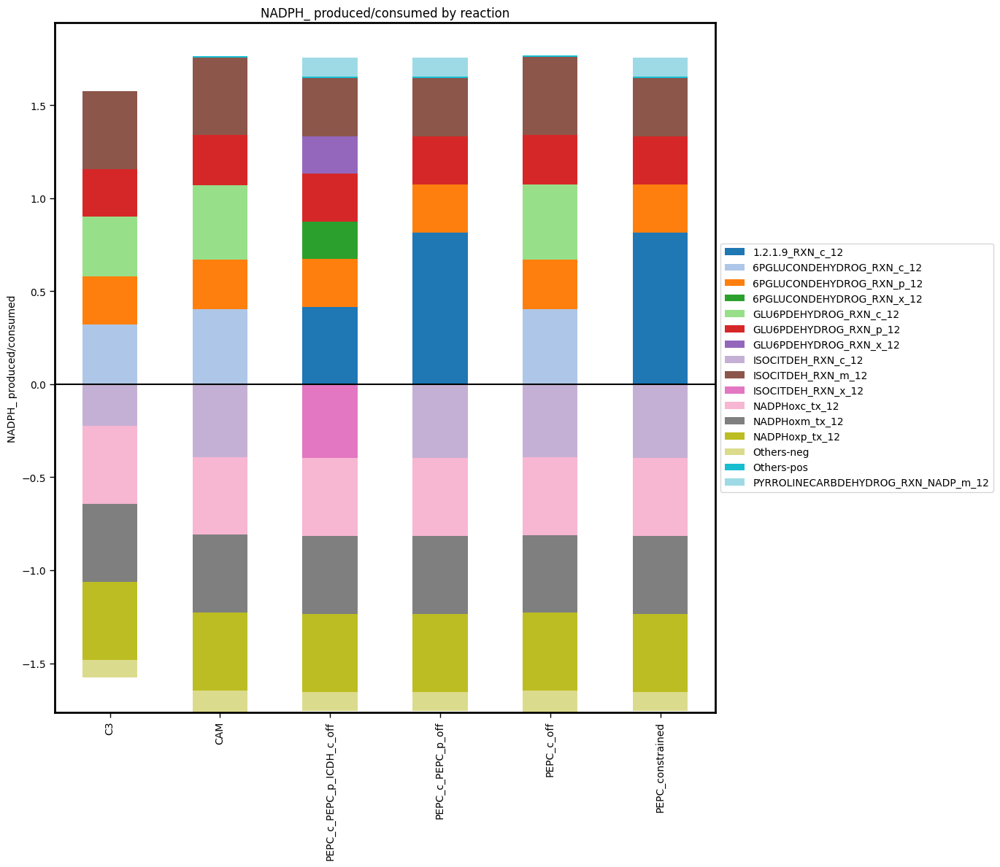

,C3,CAM,PEPC_c_PEPC_p_ICDH_c_off,PEPC_c_PEPC_p_off,PEPC_c_off,PEPC_constrained
1.2.1.9_RXN_c_12,NaN,NaN,0.415049,0.813277,NaN,0.812769
6PGLUCONDEHYDROG_RXN_c_12,0.321381,0.401194,NaN,NaN,0.402468,NaN
6PGLUCONDEHYDROG_RXN_p_12,0.256564,0.267938,0.258410,0.258622,0.267938,0.259694
6PGLUCONDEHYDROG_RXN_x_12,NaN,NaN,0.199164,NaN,NaN,NaN
GLU6PDEHYDROG_RXN_c_12,0.321381,0.401194,NaN,NaN,0.402468,NaN
GLU6PDEHYDROG_RXN_p_12,0.256564,0.267938,0.258410,0.258622,0.267938,0.259694
GLU6PDEHYDROG_RXN_x_12,NaN,NaN,0.199164,NaN,NaN,NaN
ISOCITDEH_RXN_c_12,-0.225648,-0.391173,NaN,-0.398241,-0.392447,-0.397805
ISOCITDEH_RXN_m_12,0.418344,0.418344,0.316471,0.316033,0.418344,0.313815
ISOCITDEH_RXN_x_12,NaN,NaN,-0.398327,NaN,NaN,NaN


In [ ]:
plot_metabolite_budgets(df_name_list, models, solutions, "NADPH_")

Total: 0.22075000005458773
Total: 1.5746132478300319
Total: 0.23137807871356525
Total: 1.573710987668028
Total: 0.0864818989573506
Total: 0.0861118935380066


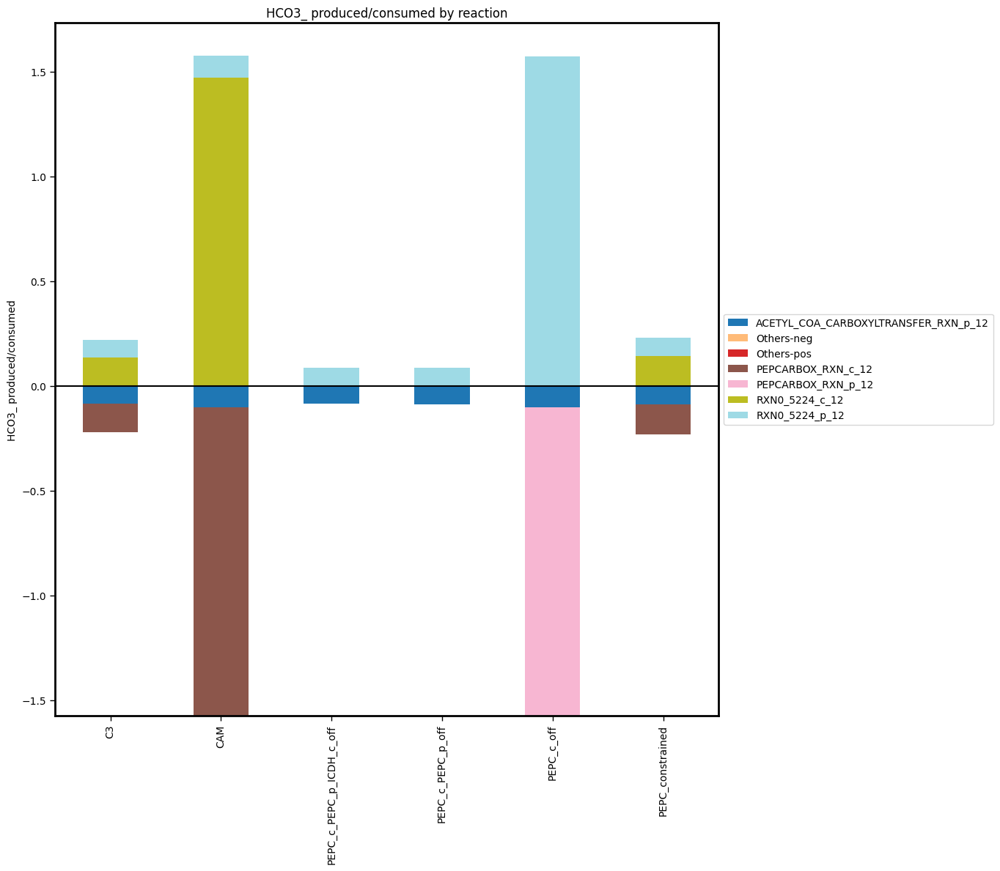

,C3,CAM,PEPC_c_PEPC_p_ICDH_c_off,PEPC_c_PEPC_p_off,PEPC_c_off,PEPC_constrained
ACETYL_COA_CARBOXYLTRANSFER_RXN_p_12,-0.084299,-1.034646e-01,-8.611189e-02,-8.648190e-02,-0.103465,-0.088357
Others-neg,0.000000,0.000000e+00,-2.563687e-15,-1.125687e-15,0.000000,0.000000
Others-pos,0.000000,1.728922e-16,0.000000e+00,0.000000e+00,0.000000,0.000000
PEPCARBOX_RXN_c_12,-0.136451,-1.471149e+00,NaN,NaN,NaN,-0.143021
PEPCARBOX_RXN_p_12,NaN,NaN,NaN,NaN,-1.470246,NaN
RXN0_5224_c_12,0.136451,1.471149e+00,NaN,NaN,NaN,0.143021
RXN0_5224_p_12,0.084299,1.034646e-01,8.611189e-02,8.648190e-02,1.573711,0.088357


In [ ]:
plot_metabolite_budgets(df_name_list, models, solutions, "HCO3_")

Total: 1.6774721839867521
Total: 1.970553328893963
Total: 1.603219288882095
Total: 1.9709248477843233
Total: 1.5790933671224787
Total: 1.6025487101864666


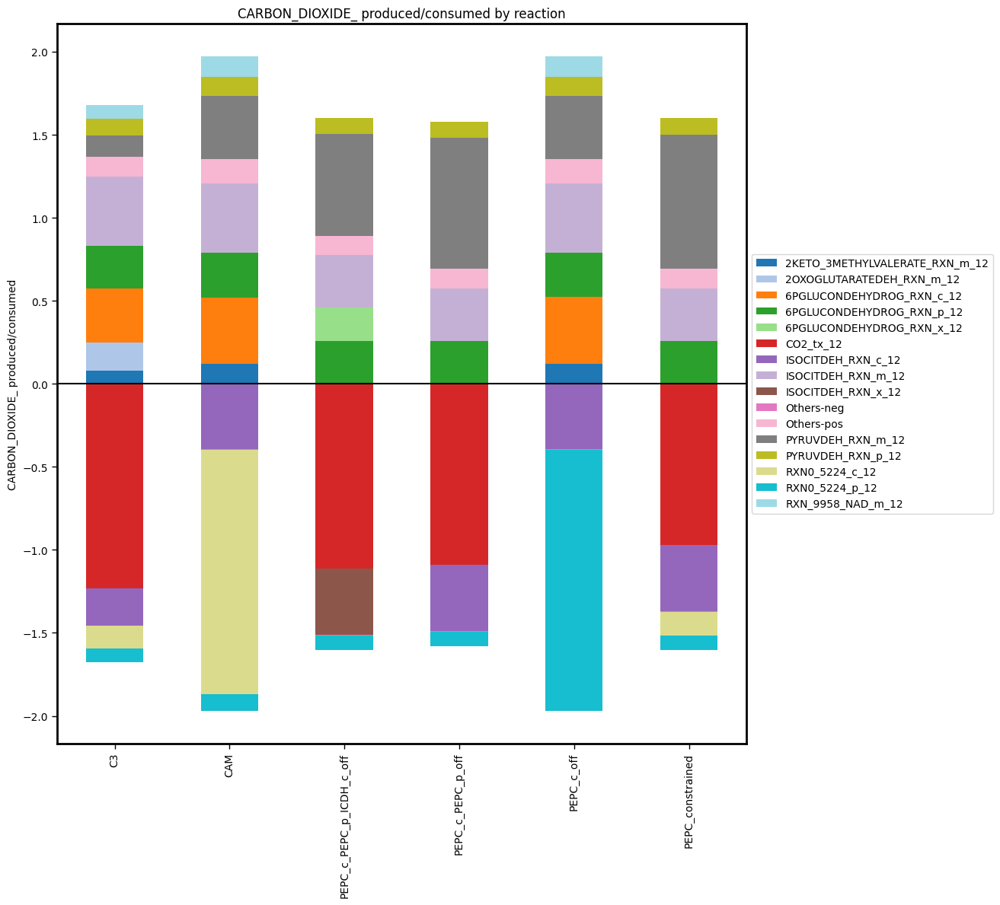

,C3,CAM,PEPC_c_PEPC_p_ICDH_c_off,PEPC_c_PEPC_p_off,PEPC_c_off,PEPC_constrained
2KETO_3METHYLVALERATE_RXN_m_12,0.079380,0.120290,NaN,NaN,0.120290,NaN
2OXOGLUTARATEDEH_RXN_m_12,0.171596,NaN,NaN,NaN,NaN,NaN
6PGLUCONDEHYDROG_RXN_c_12,0.321381,0.401194,NaN,NaN,0.402468,NaN
6PGLUCONDEHYDROG_RXN_p_12,0.256564,0.267938,0.258410,0.258622,0.267938,0.259694
6PGLUCONDEHYDROG_RXN_x_12,NaN,NaN,0.199164,NaN,NaN,NaN
CO2_tx_12,-1.231074,NaN,-1.114142,-1.090385,NaN,-0.969965
ISOCITDEH_RXN_c_12,-0.225648,-0.391173,NaN,-0.398241,-0.392447,-0.397805
ISOCITDEH_RXN_m_12,0.418344,0.418344,0.316471,0.316033,0.418344,0.313815
ISOCITDEH_RXN_x_12,NaN,NaN,-0.398327,NaN,NaN,NaN
Others-neg,0.000000,-0.004767,-0.003967,-0.003985,-0.004767,-0.004071


In [ ]:
plot_metabolite_budgets(df_name_list, models, solutions, "CARBON_DIOXIDE_")

Total: 5.3387964560760475
Total: 9.565654784990866
Total: 8.206828506168
Total: 9.56501789546493
Total: 8.029860309900371
Total: 7.377540730859063


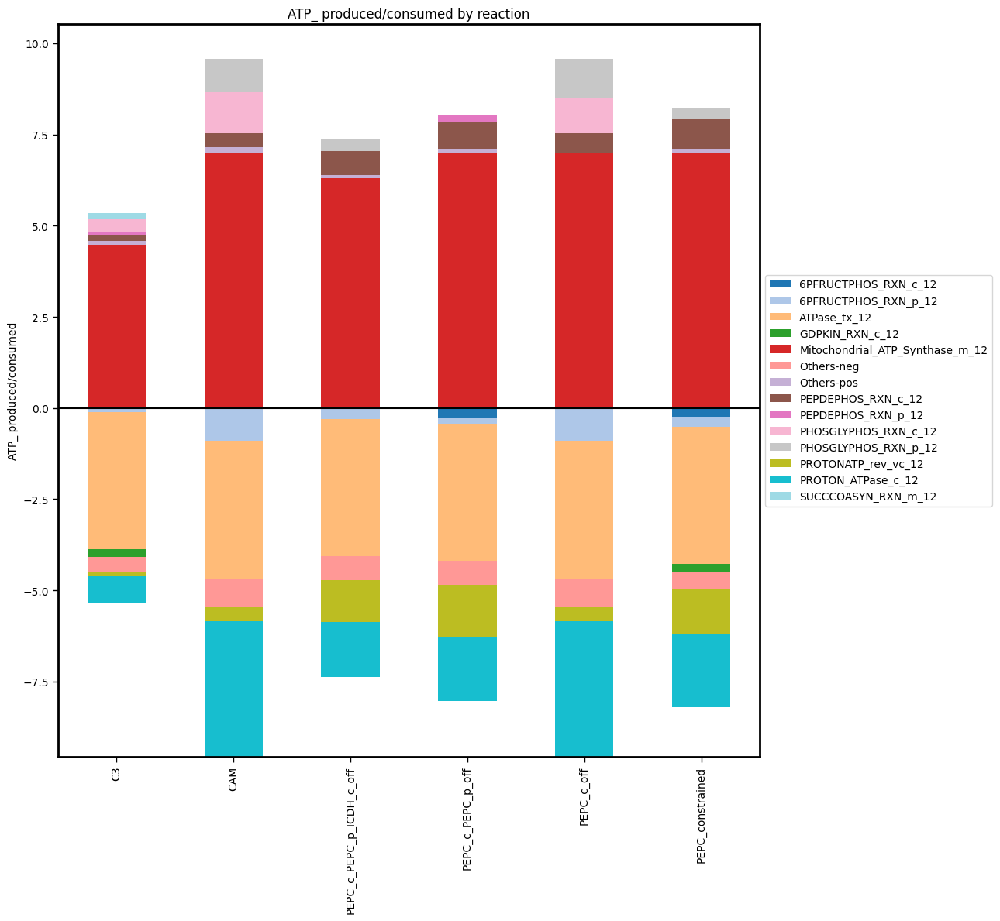

,C3,CAM,PEPC_c_PEPC_p_ICDH_c_off,PEPC_c_PEPC_p_off,PEPC_c_off,PEPC_constrained
6PFRUCTPHOS_RXN_c_12,NaN,NaN,NaN,-0.254686,NaN,-0.242707
6PFRUCTPHOS_RXN_p_12,-0.111522,-0.903376,-0.304394,-0.170690,-0.902898,-0.265905
ATPase_tx_12,-3.765100,-3.765100,-3.765100,-3.765100,-3.765100,-3.765100
GDPKIN_RXN_c_12,-0.214351,NaN,NaN,NaN,NaN,-0.224671
Mitochondrial_ATP_Synthase_m_12,4.485516,7.005216,6.294330,6.993690,7.004738,6.980043
Others-neg,-0.399694,-0.778732,-0.654716,-0.657529,-0.778732,-0.447118
Others-pos,0.095827,0.143153,0.100691,0.121495,0.006757,0.121163
PEPDEPHOS_RXN_c_12,0.143477,0.396864,0.644057,0.730142,0.533632,0.822608
PEPDEPHOS_RXN_p_12,0.122925,NaN,NaN,0.184533,NaN,NaN
PHOSGLYPHOS_RXN_c_12,0.319455,1.104929,NaN,NaN,0.969753,NaN


In [ ]:
plot_metabolite_budgets(df_name_list, models, solutions, "ATP_")

In [ ]:
diel_model.reactions.get_by_id("6PGLUCONDEHYDROG_RXN_c_12")

Reaction identifier,6PGLUCONDEHYDROG_RXN_c_12
Name,6PGLUCONDEHYDROG-RXN:Phosphogluconate dehydrogenase (decarboxylating)
Memory address,0x7f665ad93700
Stoichiometry,CPD_2961_c_12 + NADP_c_12 --> CARBON_DIOXIDE_c_12 + NADPH_c_12 + RIBULOSE_5P_c_12 CPD-2961 + NADP --> CARBON-DIOXIDE + NADPH + RIBULOSE-5P
GPR,
Lower bound,0.0
Upper bound,1000.0


In [ ]:
C3_model_opt.reactions.get_by_id("2OXOGLUTARATEDEH_RXN_m_12")

Reaction identifier,2OXOGLUTARATEDEH_RXN_m_12
Name,2OXOGLUTARATEDEH-RXN:NIL
Memory address,0x7f65f7903610
Stoichiometry,2_KETOGLUTARATE_m_12 + CO_A_m_12 + NAD_m_12 --> CARBON_DIOXIDE_m_12 + NADH_m_12 + SUC_COA_m_12 2-KETOGLUTARATE + CO-A + NAD --> CARBON-DIOXIDE + NADH + SUC-COA
GPR,
Lower bound,0.0
Upper bound,1000.0


In [ ]:
C3_model_opt.reactions.get_by_id("6PGLUCONDEHYDROG_RXN_c_12")

Reaction identifier,6PGLUCONDEHYDROG_RXN_c_12
Name,6PGLUCONDEHYDROG-RXN:Phosphogluconate dehydrogenase (decarboxylating)
Memory address,0x7f65f7959870
Stoichiometry,CPD_2961_c_12 + NADP_c_12 --> CARBON_DIOXIDE_c_12 + NADPH_c_12 + RIBULOSE_5P_c_12 CPD-2961 + NADP --> CARBON-DIOXIDE + NADPH + RIBULOSE-5P
GPR,
Lower bound,0.0
Upper bound,1000.0


# Other Analysis (WIP)

In [ ]:
df_name_list = ["C3", "CAM-cycling", "PEPC-constrained", "PEPC_c_off", "PEPC_c_PEPC_p_off", "PEPC_c_PEPC_p_ICDH_c_off"]

solutions = [solution_C3, solution_CAM_cyc, solution_PEPC_const, solution_CO2_limit1, solution_CO2_limit2, solution_CO2_limit3]

models = [C3_model_opt, CAM_cyc_model_opt, PEPC_const_model_opt, CO2_limit_model1_opt, CO2_limit_model2_opt, CO2_limit_model3_opt]

metrics_df = create_dataframe(df_name_list, solutions, models)



CO2 daytime exchange: 6.643524797554305
CO2 nightime exchange: -1.231073727194467
CO2 respiratory losses: 0 (no CO2_m_00 found)
Carbon day to night: 3.1437921941269704
Carbon night to day: 0.5596056993425462
CO2 exchange night:day: 0.1780033999664372
AraCore_Biomass_tx_00 carbon flux: -4.059338302769883
AraCore_Biomass_tx_12 carbon flux: -1.3531127675899617
total carbon biomass flux: -5.412451070359845
total CCE: 0.814695697734482
nCO2RC: 0.26611377586682566
night CCE1 (carbon in to biomass): 0.4304078272469025
night CCE2 (1 - (carbon lost / carbon in)): 0.6084112272133383
CO2 daytime exchange: 6.643
CO2 nightime exchange: -1.947484043776899e-14
CO2 respiratory losses: 0 (no CO2_m_00 found)
Carbon day to night: 8.494275053329115
Carbon night to day: 6.833525053329113
CO2 exchange night:day: 0.8044859638317089
AraCore_Biomass_tx_00 carbon flux: -4.982249999999978
AraCore_Biomass_tx_12 carbon flux: -1.6607499999999933
total carbon biomass flux: -6.642999999999971
total CCE: 0.99999999999

/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 4.3 is not an integer (in formula C4H4.3O5)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 2.08 is not an integer (in formula C4H2.08O4)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarning: 5.5 is not an integer (in formula C6H5.5O7)
  warn(f"{count} is not an integer (in formula {self.formula})")
/home/corinna/anaconda3/envs/thermoflux2/lib/python3.10/site-packages/cobra/core/metabolite.py:146: UserWarnin

In [ ]:
metrics_df

,C3,CAM-cycling,PEPC-constrained,PEPC_c_PEPC_p_ICDH_c_off,PEPC_c_PEPC_p_off,PEPC_c_off
% nCO2R,26.611378,1.000000e+02,39.498934,30.476881,30.948640,1.000000e+02
CIT_v_linker_12_to_00,0.091192,5.877512e-01,0.887366,0.689777,0.865115,5.893965e-01
CO2 daytime exchange,6.643525,6.643000e+00,6.643000,6.643000,6.643000,6.643000e+00
CO2 exchange night:day,0.178003,8.044860e-01,0.690341,0.623760,0.676820,8.044786e-01
CO2 nightime exchange,-1.231074,-1.947484e-14,-0.969965,-1.114142,-1.090385,6.666142e-14
Carbon day to night,3.143792,8.494275e+00,7.712419,6.635016,7.669230,8.493957e+00
Carbon night to day,0.559606,6.833525e+00,5.324196,4.138660,5.190691,6.833207e+00
MAL_v_linker_12_to_00,0.000000,8.267544e-01,0.000000,0.000000,0.000000,8.242068e-01
Photon flux,111.453565,1.391162e+02,122.340342,118.714960,121.064613,1.391189e+02
Rubisco flux,7.940494,9.792442e+00,8.487407,8.202013,8.306428,9.792346e+00


In [ ]:
metrics_df.to_csv("baseline_model_analysis_metrics.csv")

# Making a plot of estimateOutput results

In [ ]:
sol, temp_model, df_eO = estimateOutputFromNetCO2_Corinna_dev(diel_model,6,Output_ID=output_string+"_total",
                                      Vc_ID="RIBULOSE_BISPHOSPHATE_CARBOXYLASE_RXN_p_00",
                                      CO2in_ID="CO2_tx_00",verbose=False, iterations=50, threshold=0.001, pFBA=True)

Model can achieve desired CO2 rate, without discouraging CO2 refixation.
0.06924695524978194
First optimisation (unconstrained CO2 uptake): Model is feasible.
Starting CO2 uptake = 12.379644137639415
Starting output flux: AraCore_Biomass_tx_total = 0.12832014923989887


---- CO2 adjustment iteration 1 ----
CCE: 89.81
Factor: 0.4847
prev: 0.12832014923989887
now: 0.06219249009739337
Optimisation successful.
---- CO2 adjustment iteration 2 ----
CCE: 81.41
Factor: 0.9064
prev: 0.06219249009739337
now: 0.05637072927066173
Optimisation successful.
---- CO2 adjustment iteration 3 ----
CCE: 79.92
Factor: 0.9817
prev: 0.05637072927066173
now: 0.05534168994514792
Optimisation successful.
---- CO2 adjustment iteration 4 ----
CCE: 79.63
Factor: 0.9964
prev: 0.05534168994514792
now: 0.05514173970790177
Optimisation successful.
---- CO2 adjustment iteration 5 ----
CCE: 79.57
Factor: 0.9993
prev: 0.05514173970790177
now: 0.05510219380114004
Optimisation successful.
Net CO2 uptake value achieved.



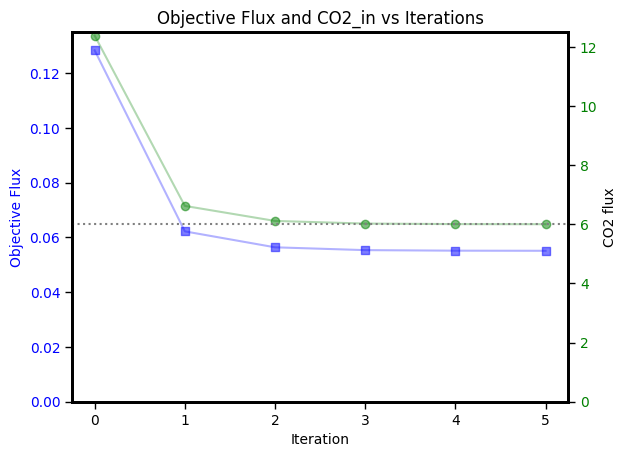

In [ ]:
plot_eO_iteration_results(df_eO)

In [ ]:
PEPC_const_model_opt.metabolites.PRO_v_12

Metabolite identifier,PRO_v_12
Name,PRO
Memory address,0x7f670e90f9d0
Formula,C5H9N1O2
Compartment,v_12
In 4 reaction(s),"PRO_v_linker_00_to_12, PRO_PROTON_rev_vc_12, PRO_PROTON_vc_12, PRO_v_linker_12_to_00"


In [ ]:
PEPC_const_model_opt.reactions.PRO_v_linker_00_to_12

Reaction identifier,PRO_v_linker_00_to_12
Name,PRO_v_linker_day_to_night
Memory address,0x7f67048d48e0
Stoichiometry,PRO_v_00 --> PRO_v_12 PRO --> PRO
GPR,
Lower bound,0.0
Upper bound,1000.0


Total: 0.1086007417882029


({'Others-pos': 0,
  'Others-neg': 0.0,
  'PRO_PROTON_rev_vc_12': 0.1086007417882029,
  'RXN_14903_m_12': -0.09836712146475735,
  'RXN_14903_mi_12': -0.010233620323445568},
                          value
 Others-pos            0.000000
 Others-neg            0.000000
 PRO_PROTON_rev_vc_12  0.108601
 RXN_14903_m_12       -0.098367
 RXN_14903_mi_12      -0.010234)

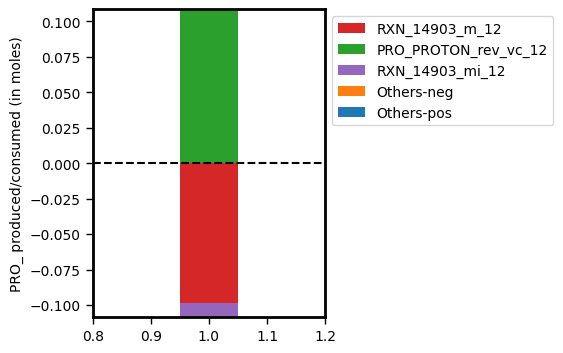

In [ ]:
generateMetaboliteBudget(PEPC_const_model_opt, solution_PEPC_const, "PEPC_constrained", show_plot=True, percentage=False, day_or_night_tag="_12", 
                         metabolite="PRO_")

In [ ]:
diel_model.reactions.RXN_14903_m_12

Reaction identifier,RXN_14903_m_12
Name,RXN-14903
Memory address,0x7f66b94371c0
Stoichiometry,PRO_m_12 + UBIQUINONE_c_12 --> L_DELTA1_PYRROLINE_5_CARBOXYLATE_m_12 + PROTON_c_12 + UBIQUINOL_c_12 PRO + UBIQUINONE[mc] --> L-DELTA-PYRROLINE_5-CARBOXYLATE + PROTON + UBIQUINOL[mc]
GPR,
Lower bound,0.0
Upper bound,1000.0


In [ ]:
diel_model.reactions.RXN_14903_mi_12

Reaction identifier,RXN_14903_mi_12
Name,RXN-14903
Memory address,0x7f667ab9d330
Stoichiometry,PRO_m_12 + UBIQUINONE_c_12 --> L_DELTA1_PYRROLINE_5_CARBOXYLATE_m_12 + PROTON_m_12 + UBIQUINOL_c_12 PRO + UBIQUINONE[mc] --> L-DELTA-PYRROLINE_5-CARBOXYLATE + PROTON + UBIQUINOL[mc]
GPR,
Lower bound,0.0
Upper bound,1000.0


Total: 0.10860074178820292


({'Others-pos': 0,
  'Others-neg': 0,
  'PYRROLINECARBDEHYDROG_RXN_NADP_m_12': -0.10452978701692578,
  'RXN_14903_m_12': 0.09836712146475735,
  'RXN_14903_mi_12': 0.010233620323445568,
  'SPONTPRO_RXN_m_12': -0.00407095477127712},
                                         value
 Others-pos                           0.000000
 Others-neg                           0.000000
 PYRROLINECARBDEHYDROG_RXN_NADP_m_12 -0.104530
 RXN_14903_m_12                       0.098367
 RXN_14903_mi_12                      0.010234
 SPONTPRO_RXN_m_12                   -0.004071)

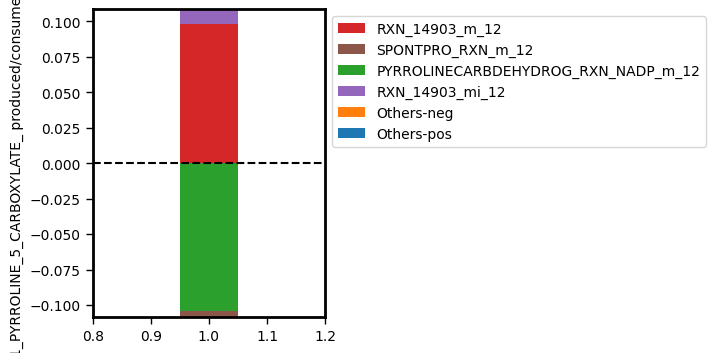

In [ ]:
generateMetaboliteBudget(PEPC_const_model_opt, solution_PEPC_const, "PEPC_constrained", show_plot=True, percentage=False, day_or_night_tag="_12", 
                         metabolite="L_DELTA1_PYRROLINE_5_CARBOXYLATE_", compartments=("m"))

In [ ]:
PEPC_const_model_opt.reactions.SPONTPRO_RXN_m_12

Reaction identifier,SPONTPRO_RXN_m_12
Name,SPONTPRO-RXN:NIL
Memory address,0x7f671b37aa70
Stoichiometry,L_GLUTAMATE_GAMMA_SEMIALDEHYDE_m_12 <=> L_DELTA1_PYRROLINE_5_CARBOXYLATE_m_12 + 0.84 PROTON_m_12 + WATER_m_12 L_GLUTAMATE_GAMMA_SEMIALDEHYDE[m] <=> L-DELTA-PYRROLINE_5-CARBOXYLATE + 0.84 PROTON + WATER
GPR,
Lower bound,-1000.0
Upper bound,1000.0


In [ ]:
PEPC_const_model_opt.reactions.PYRROLINECARBDEHYDROG_RXN_NADP_m_12

Reaction identifier,PYRROLINECARBDEHYDROG_RXN_NADP_m_12
Name,PYRROLINECARBDEHYDROG-RXN:NIL
Memory address,0x7f670e938b20
Stoichiometry,L_DELTA1_PYRROLINE_5_CARBOXYLATE_m_12 + NADP_m_12 + 2.0 WATER_m_12 --> GLT_m_12 + NADPH_m_12 + 1.12 PROTON_m_12 L-DELTA-PYRROLINE_5-CARBOXYLATE + NADP + 2.0 WATER --> GLT + NADPH + 1.12 PROTON
GPR,
Lower bound,0.0
Upper bound,1000.0


Total: 0.00407095477127712


({'Others-pos': 0,
  'Others-neg': 0.0,
  'ORNITHINE_GLU_AMINOTRANSFERASE_RXN_m_12': -0.00407095477127712,
  'SPONTPRO_RXN_m_12': 0.00407095477127712},
                                             value
 Others-pos                               0.000000
 Others-neg                               0.000000
 ORNITHINE_GLU_AMINOTRANSFERASE_RXN_m_12 -0.004071
 SPONTPRO_RXN_m_12                        0.004071)

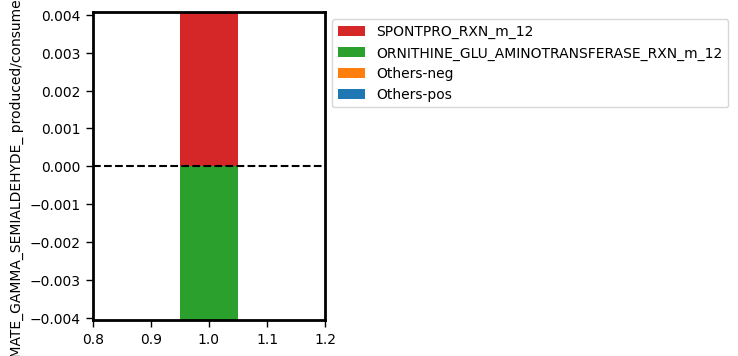

In [ ]:
generateMetaboliteBudget(PEPC_const_model_opt, solution_PEPC_const, "PEPC_constrained", show_plot=True, percentage=False, day_or_night_tag="_12", 
                         metabolite="L_GLUTAMATE_GAMMA_SEMIALDEHYDE_")

In [ ]:
PEPC_const_model_opt.reactions.ORNITHINE_GLU_AMINOTRANSFERASE_RXN_m_12

Reaction identifier,ORNITHINE_GLU_AMINOTRANSFERASE_RXN_m_12
Name,ORNITHINE-GLU-AMINOTRANSFERASE-RXN:Ornithine--oxo-acid aminotransferase
Memory address,0x7f671b3473d0
Stoichiometry,2_KETOGLUTARATE_m_12 + L_ORNITHINE_m_12 <=> GLT_m_12 + L_GLUTAMATE_GAMMA_SEMIALDEHYDE_m_12 + 0.28 PROTON_m_12 2-KETOGLUTARATE + L-ORNITHINE <=> GLT + L_GLUTAMATE_GAMMA_SEMIALDEHYDE[m] + 0.28 PROTON
GPR,
Lower bound,-1000.0
Upper bound,1000.0


Total: 0.00407095477127712


({'Others-pos': 0,
  'Others-neg': 0.0,
  'ORNCARBAMTRANSFER_RXN_p_12': -0.004070954771277121,
  'ORNITHINE_GLU_AMINOTRANSFERASE_RXN_m_12': 0.00407095477127712},
                                             value
 Others-pos                               0.000000
 Others-neg                               0.000000
 ORNCARBAMTRANSFER_RXN_p_12              -0.004071
 ORNITHINE_GLU_AMINOTRANSFERASE_RXN_m_12  0.004071)

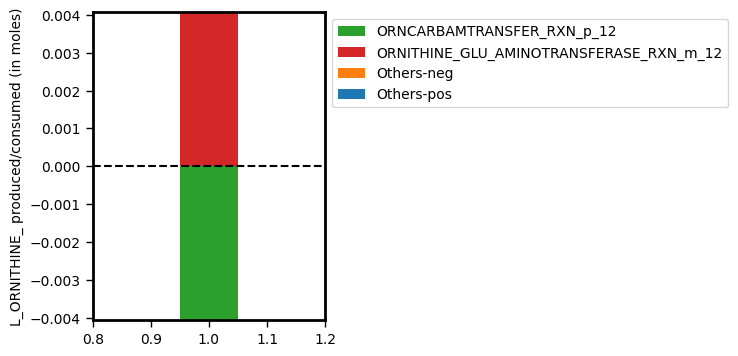

In [ ]:
generateMetaboliteBudget(PEPC_const_model_opt, solution_PEPC_const, "PEPC_constrained", show_plot=True, percentage=False, day_or_night_tag="_12", 
                         metabolite="L_ORNITHINE_")

In [ ]:
PEPC_const_model_opt.reactions.ORNCARBAMTRANSFER_RXN_p_12

Reaction identifier,ORNCARBAMTRANSFER_RXN_p_12
Name,ORNCARBAMTRANSFER-RXN:Ornithine carbamoyltransferase
Memory address,0x7f671b3dab60
Stoichiometry,CARBAMOYL_P_p_12 + L_ORNITHINE_p_12 <=> L_CITRULLINE_p_12 + 0.1 PROTON_p_12 + Pi_p_12 CARBAMOYL-P + L-ORNITHINE <=> L-CITRULLINE + 0.1 PROTON + Pi[p]
GPR,
Lower bound,-1000.0
Upper bound,1000.0


In [ ]:
PEPC_const_model_opt.reactions.GLUTAMATE_N_ACETYLTRANSFERASE_RXN_p_12

Reaction identifier,GLUTAMATE_N_ACETYLTRANSFERASE_RXN_p_12
Name,GLUTAMATE-N-ACETYLTRANSFERASE-RXN:Glutamate N-acetyltransferase
Memory address,0x7f671b3daf50
Stoichiometry,GLT_p_12 + N_ALPHA_ACETYLORNITHINE_p_12 --> ACETYL_GLU_p_12 + L_ORNITHINE_p_12 GLT + N-ALPHA-ACETYLORNITHINE --> ACETYL-GLU + L-ORNITHINE
GPR,
Lower bound,0.0
Upper bound,1000.0


Total: 0.004070954771277121


({'Others-pos': 0,
  'Others-neg': 0,
  'ARGSUCCINSYN_RXN_p_12': -0.004070954771277121,
  'ORNCARBAMTRANSFER_RXN_p_12': 0.004070954771277121,
  'L_CITRULLINE_pc_12': 0.004070954771277121,
  'ORNITHINE_CITRULLINE_pc_12': -0.004070954771277121},
                                value
 Others-pos                  0.000000
 Others-neg                  0.000000
 ARGSUCCINSYN_RXN_p_12      -0.004071
 ORNCARBAMTRANSFER_RXN_p_12  0.004071
 L_CITRULLINE_pc_12          0.004071
 ORNITHINE_CITRULLINE_pc_12 -0.004071)

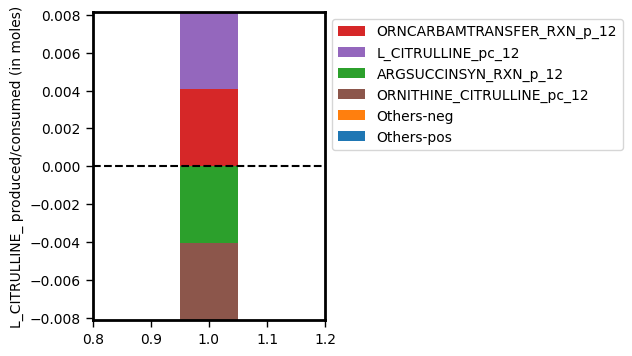

In [ ]:
generateMetaboliteBudget(PEPC_const_model_opt, solution_PEPC_const, "PEPC_constrained", show_plot=True, percentage=False, day_or_night_tag="_12", 
                         metabolite="L_CITRULLINE_", compartments=("p"))

Total: 0.004070954771277121


({'Others-pos': 0,
  'Others-neg': 0,
  'ARGSUCCINSYN_RXN_p_12': 0.004070954771277121,
  'ARGSUCCINLYA_RXN_p_12': -0.004070954771277121},
                           value
 Others-pos             0.000000
 Others-neg             0.000000
 ARGSUCCINSYN_RXN_p_12  0.004071
 ARGSUCCINLYA_RXN_p_12 -0.004071)

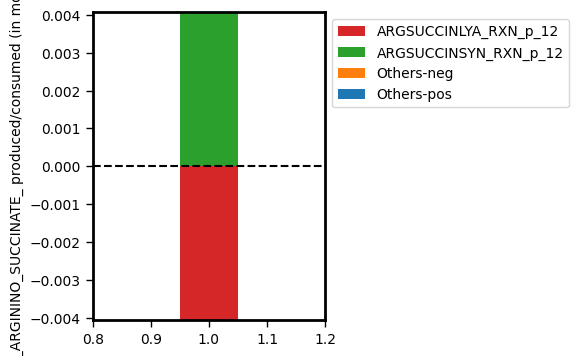

In [ ]:
generateMetaboliteBudget(PEPC_const_model_opt, solution_PEPC_const, "PEPC_constrained", show_plot=True, percentage=False, day_or_night_tag="_12", 
                         metabolite="L_ARGININO_SUCCINATE_", compartments=("p"))

Total: 0.10581921747872353


({'Others-pos': 0.0012894304617977412,
  'Others-neg': -0.0012894304624238122,
  'PYRROLINECARBDEHYDROG_RXN_NADP_m_12': 0.10452978701692578,
  'ASPAMINOTRANS_RXN_c_12': -0.022467244332162118,
  'GLUTAMATE_DEHYDROGENASE_RXN_m_12': -0.019886896884567656,
  'ALANINE_AMINOTRANSFERASE_RXN_c_12': -0.014915940362718566,
  'GLUTAMINESYN_RXN_p_12': -0.011818280721048655,
  'PSERTRANSAM_RXN_p_12': -0.009347838299898726,
  'sGLU_biomass_12': -0.005191417620586585,
  'BRANCHED_CHAINAMINOTRANSFERVAL_RXN_p_12': -0.005107611602888318,
  'GLURS_RXN_c_12': -0.004818680028660869,
  'RXN_7737_p_12': -0.0041975306294395505,
  'ORNITHINE_GLU_AMINOTRANSFERASE_RXN_m_12': -0.00407095477127712,
  'PREPHENATE_TRANSAMINE_RXN_p_12': -0.002707391763051535},
                                             value
 Others-pos                               0.001289
 Others-neg                              -0.001289
 PYRROLINECARBDEHYDROG_RXN_NADP_m_12      0.104530
 ASPAMINOTRANS_RXN_c_12                  -0.022467
 GLUTA

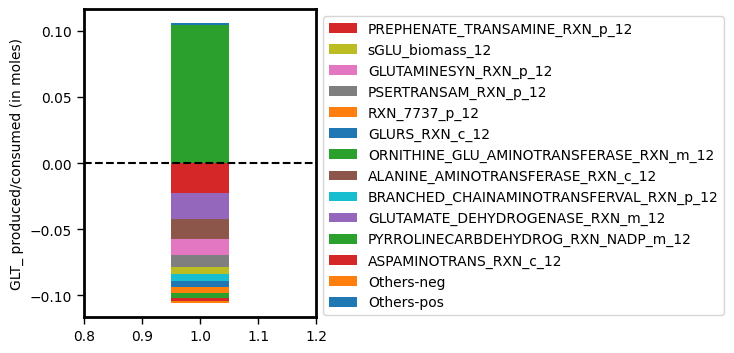

In [ ]:
generateMetaboliteBudget(PEPC_const_model_opt, solution_PEPC_const, "PEPC_constrained", show_plot=True, percentage=False, day_or_night_tag="_12", 
                         metabolite="GLT_")

Total: 1.7565899548043484


({'Others-pos': 0.006088533006362952,
  'Others-neg': -0.10375112493506923,
  '1.2.1.9_RXN_c_12': 0.8127687997370792,
  'NADPHoxc_tx_12': -0.4183444444444444,
  'NADPHoxp_tx_12': -0.4183444444444444,
  'NADPHoxm_tx_12': -0.4183444444444444,
  'ISOCITDEH_RXN_c_12': -0.3978054965359461,
  'ISOCITDEH_RXN_m_12': 0.3138146574275186,
  'GLU6PDEHYDROG_RXN_p_12': 0.259694088808231,
  '6PGLUCONDEHYDROG_RXN_p_12': 0.259694088808231,
  'PYRROLINECARBDEHYDROG_RXN_NADP_m_12': 0.10452978701692578},
                                         value
 Others-pos                           0.006089
 Others-neg                          -0.103751
 1.2.1.9_RXN_c_12                     0.812769
 NADPHoxc_tx_12                      -0.418344
 NADPHoxp_tx_12                      -0.418344
 NADPHoxm_tx_12                      -0.418344
 ISOCITDEH_RXN_c_12                  -0.397805
 ISOCITDEH_RXN_m_12                   0.313815
 GLU6PDEHYDROG_RXN_p_12               0.259694
 6PGLUCONDEHYDROG_RXN_p_12            0.

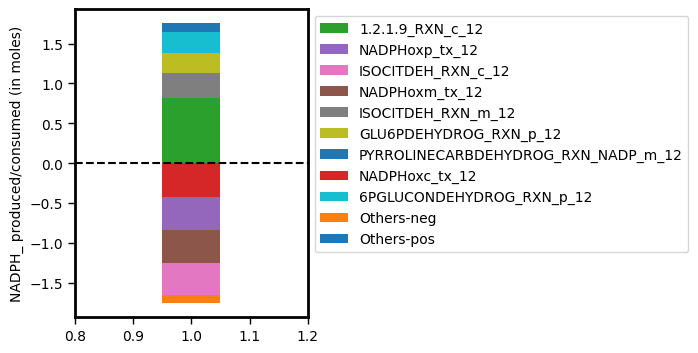

In [ ]:
generateMetaboliteBudget(PEPC_const_model_opt, solution_PEPC_const, "PEPC_constrained", show_plot=True, percentage=False, day_or_night_tag="_12", 
                         metabolite="NADPH_")

In [ ]:
PEPC_const_model_opt.reactions.ISOCITDEH_RXN_c_12

Reaction identifier,ISOCITDEH_RXN_c_12
Name,ISOCITDEH-RXN:Isocitrate dehydrogenase (NADP+)
Memory address,0x7f671b345510
Stoichiometry,NADP_c_12 + THREO_DS_ISO_CITRATE_c_12 <=> 2_KETOGLUTARATE_c_12 + CARBON_DIOXIDE_c_12 + NADPH_c_12 NADP + THREO-DS-ISO-CITRATE <=> 2-KETOGLUTARATE + CARBON-DIOXIDE + NADPH
GPR,
Lower bound,-1000.0
Upper bound,1000.0


In [ ]:
PEPC_const_model_opt.reactions.ARGSUCCINLYA_RXN_p_12

Reaction identifier,ARGSUCCINLYA_RXN_p_12
Name,ARGSUCCINLYA-RXN:Argininosuccinate lyase
Memory address,0x7f671b3148e0
Stoichiometry,L_ARGININO_SUCCINATE_p_12 + 0.22 PROTON_p_12 --> ARG_p_12 + FUM_p_12 L-ARGININO-SUCCINATE + 0.22 PROTON --> ARG + FUM
GPR,
Lower bound,0.0
Upper bound,1000.0


In [ ]:
PEPC_const_model_opt.reactions.ARGSUCCINSYN_RXN_p_12

Reaction identifier,ARGSUCCINSYN_RXN_p_12
Name,ARGSUCCINSYN-RXN:argininosuccinate synthetase
Memory address,0x7f671b345630
Stoichiometry,ATP_p_12 + L_ASPARTATE_p_12 + L_CITRULLINE_p_12 --> AMP_p_12 + L_ARGININO_SUCCINATE_p_12 + PPI_p_12 + 2.12 PROTON_p_12 ATP + L-ASPARTATE + L-CITRULLINE --> AMP + L-ARGININO-SUCCINATE + PPI + 2.12 PROTON
GPR,
Lower bound,0.0
Upper bound,1000.0


In [ ]:
PEPC_const_model_opt.reactions.L_CITRULLINE_pc_12

Reaction identifier,L_CITRULLINE_pc_12
Name,L_CITRULLINE_pc
Memory address,0x7f671b346260
Stoichiometry,L_CITRULLINE_p_12 + 0.1 PROTON_p_12 <=> L_CITRULLINE_c_12 L-CITRULLINE + 0.1 PROTON <=> L-CITRULLINE
GPR,
Lower bound,-1000.0
Upper bound,1000.0


Total: 0.397805496535946


({'Others-pos': 0.017372919229080335,
  'Others-neg': -3.581140920155678e-17,
  'ISOCITDEH_RXN_c_12': -0.3978054965359461,
  'ISOCITDEH_RXN_m_12': 0.3138146574275186,
  'ASPAMINOTRANS_RXN_c_12': 0.022467244332162118,
  'GLUTAMATE_DEHYDROGENASE_RXN_m_12': 0.019886896884567656,
  'ALANINE_AMINOTRANSFERASE_RXN_c_12': 0.014915940362718566,
  'PSERTRANSAM_RXN_p_12': 0.009347838299898726},
                                           value
 Others-pos                         1.737292e-02
 Others-neg                        -3.581141e-17
 ISOCITDEH_RXN_c_12                -3.978055e-01
 ISOCITDEH_RXN_m_12                 3.138147e-01
 ASPAMINOTRANS_RXN_c_12             2.246724e-02
 GLUTAMATE_DEHYDROGENASE_RXN_m_12   1.988690e-02
 ALANINE_AMINOTRANSFERASE_RXN_c_12  1.491594e-02
 PSERTRANSAM_RXN_p_12               9.347838e-03)

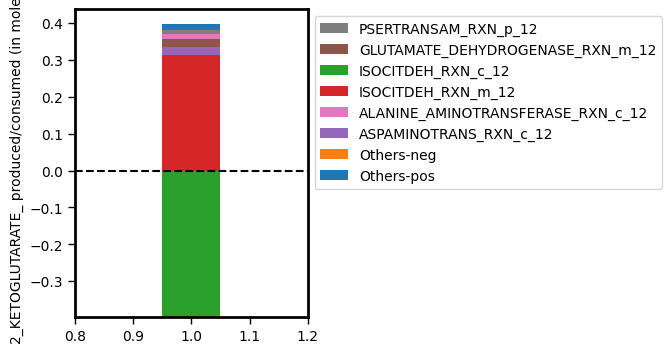

In [ ]:
generateMetaboliteBudget(PEPC_const_model_opt, solution_PEPC_const, "PEPC_constrained", show_plot=True, percentage=False, day_or_night_tag="_12", 
                         metabolite="2_KETOGLUTARATE_")

Total: 0


({'Others-pos': 0,
  'Others-neg': 0,
  '2_KETOGLUTARATE_xc_12': -0.0,
  'A_B_oxidation_x_12': -0.0,
  'ALANINE_AMINOTRANSFERASE_RXN_x_12': -0.0,
  'ISOCITDEH_RXN_x_12': 0.0,
  'ASPAMINOTRANS_RXN_x_12': -0.0,
  'GLYCINE_AMINOTRANSFERASE_RXN_x_12': 0.0},
                                    value
 Others-pos                           0.0
 Others-neg                           0.0
 2_KETOGLUTARATE_xc_12               -0.0
 A_B_oxidation_x_12                  -0.0
 ALANINE_AMINOTRANSFERASE_RXN_x_12   -0.0
 ISOCITDEH_RXN_x_12                   0.0
 ASPAMINOTRANS_RXN_x_12              -0.0
 GLYCINE_AMINOTRANSFERASE_RXN_x_12    0.0)

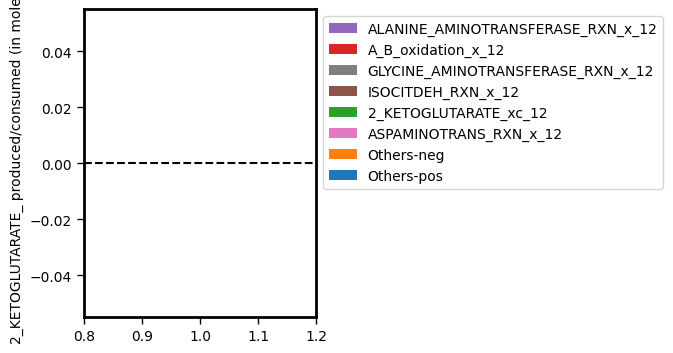

In [ ]:
generateMetaboliteBudget(PEPC_const_model_opt, solution_PEPC_const, "PEPC_constrained", show_plot=True, percentage=False, day_or_night_tag="_12", 
                         metabolite="2_KETOGLUTARATE_", compartments=("x"))